## Germany Drought Scenario with 130 €/t CO2 price

In [1]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [2]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_DE\\20240405_20nodes\\elec_s_20_ec_lv1.5_3h.nc")

INFO:pypsa.io:Imported network elec_s_20_ec_lv1.5_3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


In [3]:
# add co2price
co2_price = 130 #€/t

for index in n.generators.index:
    emission = n.carriers.co2_emissions.filter(like= n.generators.carrier[index]) #t/MWh_th
    n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\3184507867.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel


In [4]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 20 entries
Component 'Carrier' has 21 entries
Component 'GlobalConstraint' has 1 entries
Component 'Line' has 27 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 28 entries
Component 'Load' has 20 entries
Component 'Generator' has 261 entries
Component 'StorageUnit' has 65 entries


In [5]:
#remove nuclear fleet from germany
n.generators.loc[n.generators.index.str.startswith('DE') & n.generators.index.str.endswith('nuclear'), 'p_nom'] = 0


In [6]:
# set marginal cost of load shedding to 3000€/MWh
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 3000

#edit load shedding's unit from kW to MW
for index in n.generators.index:
    if index.endswith('load') and not index.endswith('H2 load'):
        n.generators.loc[index, 'sign'] = 1

In [7]:
#solve network
n.optimize(solver_name='gurobi')
#n.lopf(solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:05<00:00,  2.18it/s]
INFO:linopy.io: Writing time: 37.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t4gmqb8z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t4gmqb8z.lp


Reading time = 11.30 seconds


INFO:gurobipy:Reading time = 11.30 seconds


obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


INFO:gurobipy:obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


INFO:gurobipy:Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


Model fingerprint: 0xe902a838


INFO:gurobipy:Model fingerprint: 0xe902a838


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 1e+03]


INFO:gurobipy:  Matrix range     [1e-02, 1e+03]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+00, 2e+10]


INFO:gurobipy:  Bounds range     [1e+00, 2e+10]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 2121745 rows and 372364 columns (presolve time = 5s) ...


INFO:gurobipy:Presolve removed 2121745 rows and 372364 columns (presolve time = 5s) ...


Presolve removed 2121745 rows and 372364 columns


INFO:gurobipy:Presolve removed 2121745 rows and 372364 columns


Presolve time: 5.97s


INFO:gurobipy:Presolve time: 5.97s


Presolved: 1143118 rows, 1149138 columns, 3794406 nonzeros


INFO:gurobipy:Presolved: 1143118 rows, 1149138 columns, 3794406 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Elapsed ordering time = 8s


INFO:gurobipy:Elapsed ordering time = 8s


Ordering time: 14.05s


INFO:gurobipy:Ordering time: 14.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 181


INFO:gurobipy: Dense cols : 181


 AA' NZ     : 4.035e+06


INFO:gurobipy: AA' NZ     : 4.035e+06


 Factor NZ  : 2.953e+07 (roughly 1.2 GB of memory)


INFO:gurobipy: Factor NZ  : 2.953e+07 (roughly 1.2 GB of memory)


 Factor Ops : 6.436e+09 (roughly 1 second per iteration)


INFO:gurobipy: Factor Ops : 6.436e+09 (roughly 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.31156914e+17 -8.63354847e+18  2.85e+10 9.06e+04  8.83e+13    24s


INFO:gurobipy:   0   6.31156914e+17 -8.63354847e+18  2.85e+10 9.06e+04  8.83e+13    24s


   1   5.51456390e+17 -3.69772359e+18  1.77e+10 3.07e+04  5.62e+13    26s


INFO:gurobipy:   1   5.51456390e+17 -3.69772359e+18  1.77e+10 3.07e+04  5.62e+13    26s


   2   4.54033444e+17 -1.90973203e+18  1.41e+10 1.25e+04  3.90e+13    28s


INFO:gurobipy:   2   4.54033444e+17 -1.90973203e+18  1.41e+10 1.25e+04  3.90e+13    28s


   3   3.19252739e+17 -1.27160669e+18  8.28e+09 6.50e+03  2.18e+13    30s


INFO:gurobipy:   3   3.19252739e+17 -1.27160669e+18  8.28e+09 6.50e+03  2.18e+13    30s


   4   2.54953330e+17 -6.61717066e+17  3.50e+09 2.36e+03  9.03e+12    32s


INFO:gurobipy:   4   2.54953330e+17 -6.61717066e+17  3.50e+09 2.36e+03  9.03e+12    32s


   5   2.08925146e+17 -1.81452033e+17  1.53e+09 5.06e+02  3.59e+12    34s


INFO:gurobipy:   5   2.08925146e+17 -1.81452033e+17  1.53e+09 5.06e+02  3.59e+12    34s


   6   9.34324046e+16 -3.67900856e+16  2.73e+08 8.07e+01  6.59e+11    36s


INFO:gurobipy:   6   9.34324046e+16 -3.67900856e+16  2.73e+08 8.07e+01  6.59e+11    36s


   7   1.53993342e+16 -6.69438176e+15  1.99e+06 2.21e+00  1.38e+10    38s


INFO:gurobipy:   7   1.53993342e+16 -6.69438176e+15  1.99e+06 2.21e+00  1.38e+10    38s


   8   6.49293574e+15 -2.47745621e+15  7.91e+05 6.44e-01  5.25e+09    40s


INFO:gurobipy:   8   6.49293574e+15 -2.47745621e+15  7.91e+05 6.44e-01  5.25e+09    40s


   9   3.28700815e+15 -1.62703590e+15  3.76e+05 3.77e-01  2.72e+09    41s


INFO:gurobipy:   9   3.28700815e+15 -1.62703590e+15  3.76e+05 3.77e-01  2.72e+09    41s


  10   2.54446415e+15 -5.91128465e+14  2.88e+05 8.57e-02  1.75e+09    43s


INFO:gurobipy:  10   2.54446415e+15 -5.91128465e+14  2.88e+05 8.57e-02  1.75e+09    43s


  11   1.36349249e+15 -2.15967540e+14  1.46e+05 6.74e-03  8.61e+08    46s


INFO:gurobipy:  11   1.36349249e+15 -2.15967540e+14  1.46e+05 6.74e-03  8.61e+08    46s


  12   8.28027013e+14 -9.92410530e+13  8.88e+04 2.51e-05  4.87e+08    48s


INFO:gurobipy:  12   8.28027013e+14 -9.92410530e+13  8.88e+04 2.51e-05  4.87e+08    48s


  13   4.80413901e+14 -6.20795614e+13  4.72e+04 7.24e-05  2.72e+08    49s


INFO:gurobipy:  13   4.80413901e+14 -6.20795614e+13  4.72e+04 7.24e-05  2.72e+08    49s


  14   1.53569074e+14 -3.24966789e+13  9.76e+03 7.44e-05  8.77e+07    51s


INFO:gurobipy:  14   1.53569074e+14 -3.24966789e+13  9.76e+03 7.44e-05  8.77e+07    51s


  15   1.63373529e+13 -8.83234826e+12  3.05e+02 4.64e-05  1.08e+07    53s


INFO:gurobipy:  15   1.63373529e+13 -8.83234826e+12  3.05e+02 4.64e-05  1.08e+07    53s


  16   1.02835804e+13 -7.28307620e+12  1.88e+02 3.77e-05  7.42e+06    55s


INFO:gurobipy:  16   1.02835804e+13 -7.28307620e+12  1.88e+02 3.77e-05  7.42e+06    55s


  17   7.44783378e+12 -6.04908371e+12  1.30e+02 3.11e-05  5.64e+06    57s


INFO:gurobipy:  17   7.44783378e+12 -6.04908371e+12  1.30e+02 3.11e-05  5.64e+06    57s


  18   5.29471811e+12 -4.71559800e+12  9.02e+01 2.38e-05  4.14e+06    59s


INFO:gurobipy:  18   5.29471811e+12 -4.71559800e+12  9.02e+01 2.38e-05  4.14e+06    59s


  19   4.75850789e+12 -4.38214803e+12  8.06e+01 2.19e-05  3.77e+06    61s


INFO:gurobipy:  19   4.75850789e+12 -4.38214803e+12  8.06e+01 2.19e-05  3.77e+06    61s


  20   2.50823334e+12 -2.81693612e+12  3.90e+01 1.34e-05  2.17e+06    63s


INFO:gurobipy:  20   2.50823334e+12 -2.81693612e+12  3.90e+01 1.34e-05  2.17e+06    63s


  21   1.26503486e+12 -2.32081077e+12  1.68e+01 1.11e-05  1.45e+06    65s


INFO:gurobipy:  21   1.26503486e+12 -2.32081077e+12  1.68e+01 1.11e-05  1.45e+06    65s


  22   6.96287913e+11 -1.81303185e+12  7.44e+00 8.66e-06  1.01e+06    67s


INFO:gurobipy:  22   6.96287913e+11 -1.81303185e+12  7.44e+00 8.66e-06  1.01e+06    67s


  23   6.02982219e+11 -1.39200919e+12  6.15e+00 6.67e-06  8.01e+05    69s


INFO:gurobipy:  23   6.02982219e+11 -1.39200919e+12  6.15e+00 6.67e-06  8.01e+05    69s


  24   3.61807321e+11 -1.15799324e+12  2.97e+00 5.64e-06  6.09e+05    70s


INFO:gurobipy:  24   3.61807321e+11 -1.15799324e+12  2.97e+00 5.64e-06  6.09e+05    70s


  25   3.12048458e+11 -6.67307739e+11  2.36e+00 3.27e-06  3.92e+05    72s


INFO:gurobipy:  25   3.12048458e+11 -6.67307739e+11  2.36e+00 3.27e-06  3.92e+05    72s


  26   2.10686380e+11 -2.25406878e+11  1.28e+00 1.15e-06  1.75e+05    75s


INFO:gurobipy:  26   2.10686380e+11 -2.25406878e+11  1.28e+00 1.15e-06  1.75e+05    75s


  27   1.61259257e+11 -5.63641174e+10  8.30e-01 4.12e-07  8.70e+04    78s


INFO:gurobipy:  27   1.61259257e+11 -5.63641174e+10  8.30e-01 4.12e-07  8.70e+04    78s


  28   1.29664873e+11 -5.03008478e+09  5.69e-01 2.21e-07  5.39e+04    81s


INFO:gurobipy:  28   1.29664873e+11 -5.03008478e+09  5.69e-01 2.21e-07  5.39e+04    81s


  29   1.10626430e+11  1.14729609e+10  4.21e-01 1.52e-07  3.97e+04    83s


INFO:gurobipy:  29   1.10626430e+11  1.14729609e+10  4.21e-01 1.52e-07  3.97e+04    83s


  30   1.03773587e+11  1.79199380e+10  3.68e-01 1.26e-07  3.43e+04    84s


INFO:gurobipy:  30   1.03773587e+11  1.79199380e+10  3.68e-01 1.26e-07  3.43e+04    84s


  31   9.92668977e+10  2.50896417e+10  3.34e-01 9.88e-08  2.97e+04    86s


INFO:gurobipy:  31   9.92668977e+10  2.50896417e+10  3.34e-01 9.88e-08  2.97e+04    86s


  32   8.98252560e+10  3.03686578e+10  2.64e-01 7.95e-08  2.38e+04    88s


INFO:gurobipy:  32   8.98252560e+10  3.03686578e+10  2.64e-01 7.95e-08  2.38e+04    88s


  33   8.15896874e+10  3.56916943e+10  2.04e-01 6.12e-08  1.84e+04    90s


INFO:gurobipy:  33   8.15896874e+10  3.56916943e+10  2.04e-01 6.12e-08  1.84e+04    90s


  34   7.62466985e+10  4.10392325e+10  1.66e-01 4.25e-08  1.41e+04    93s


INFO:gurobipy:  34   7.62466985e+10  4.10392325e+10  1.66e-01 4.25e-08  1.41e+04    93s


  35   7.35917677e+10  4.26539384e+10  1.46e-01 3.63e-08  1.24e+04    96s


INFO:gurobipy:  35   7.35917677e+10  4.26539384e+10  1.46e-01 3.63e-08  1.24e+04    96s


  36   6.78811053e+10  4.60810129e+10  1.04e-01 2.35e-08  8.72e+03    99s


INFO:gurobipy:  36   6.78811053e+10  4.60810129e+10  1.04e-01 2.35e-08  8.72e+03    99s


  37   6.49437310e+10  4.81290206e+10  8.28e-02 1.72e-08  6.72e+03   102s


INFO:gurobipy:  37   6.49437310e+10  4.81290206e+10  8.28e-02 1.72e-08  6.72e+03   102s


  38   6.18172065e+10  4.94210253e+10  5.99e-02 1.29e-08  4.96e+03   105s


INFO:gurobipy:  38   6.18172065e+10  4.94210253e+10  5.99e-02 1.29e-08  4.96e+03   105s


  39   6.03579386e+10  5.05271371e+10  4.97e-02 1.01e-08  3.93e+03   108s


INFO:gurobipy:  39   6.03579386e+10  5.05271371e+10  4.97e-02 1.01e-08  3.93e+03   108s


  40   5.90532895e+10  5.12849853e+10  4.03e-02 6.85e-09  3.11e+03   111s


INFO:gurobipy:  40   5.90532895e+10  5.12849853e+10  4.03e-02 6.85e-09  3.11e+03   111s


  41   5.79515990e+10  5.18109238e+10  3.23e-02 4.76e-09  2.46e+03   114s


INFO:gurobipy:  41   5.79515990e+10  5.18109238e+10  3.23e-02 4.76e-09  2.46e+03   114s


  42   5.69687464e+10  5.21169438e+10  2.53e-02 3.36e-09  1.94e+03   117s


INFO:gurobipy:  42   5.69687464e+10  5.21169438e+10  2.53e-02 3.36e-09  1.94e+03   117s


  43   5.62549552e+10  5.24008438e+10  2.02e-02 4.23e-09  1.54e+03   119s


INFO:gurobipy:  43   5.62549552e+10  5.24008438e+10  2.02e-02 4.23e-09  1.54e+03   119s


  44   5.56892862e+10  5.26099038e+10  1.62e-02 1.43e-08  1.23e+03   122s


INFO:gurobipy:  44   5.56892862e+10  5.26099038e+10  1.62e-02 1.43e-08  1.23e+03   122s


  45   5.54710973e+10  5.26859608e+10  1.46e-02 2.42e-08  1.11e+03   124s


INFO:gurobipy:  45   5.54710973e+10  5.26859608e+10  1.46e-02 2.42e-08  1.11e+03   124s


  46   5.53571765e+10  5.27707038e+10  1.37e-02 3.27e-08  1.03e+03   127s


INFO:gurobipy:  46   5.53571765e+10  5.27707038e+10  1.37e-02 3.27e-08  1.03e+03   127s


  47   5.51880059e+10  5.28574986e+10  1.24e-02 3.81e-08  9.32e+02   130s


INFO:gurobipy:  47   5.51880059e+10  5.28574986e+10  1.24e-02 3.81e-08  9.32e+02   130s


  48   5.49979118e+10  5.29098898e+10  1.09e-02 4.78e-08  8.35e+02   132s


INFO:gurobipy:  48   5.49979118e+10  5.29098898e+10  1.09e-02 4.78e-08  8.35e+02   132s


  49   5.48962273e+10  5.29862477e+10  1.01e-02 5.81e-08  7.64e+02   135s


INFO:gurobipy:  49   5.48962273e+10  5.29862477e+10  1.01e-02 5.81e-08  7.64e+02   135s


  50   5.47740004e+10  5.30299838e+10  9.19e-03 6.46e-08  6.97e+02   137s


INFO:gurobipy:  50   5.47740004e+10  5.30299838e+10  9.19e-03 6.46e-08  6.97e+02   137s


  51   5.45673736e+10  5.30959195e+10  7.62e-03 7.43e-08  5.88e+02   140s


INFO:gurobipy:  51   5.45673736e+10  5.30959195e+10  7.62e-03 7.43e-08  5.88e+02   140s


  52   5.44324658e+10  5.31720680e+10  6.59e-03 8.34e-08  5.04e+02   144s


INFO:gurobipy:  52   5.44324658e+10  5.31720680e+10  6.59e-03 8.34e-08  5.04e+02   144s


  53   5.42671885e+10  5.31965807e+10  5.33e-03 8.71e-08  4.28e+02   147s


INFO:gurobipy:  53   5.42671885e+10  5.31965807e+10  5.33e-03 8.71e-08  4.28e+02   147s


  54   5.41142325e+10  5.32667502e+10  4.19e-03 9.70e-08  3.39e+02   150s


INFO:gurobipy:  54   5.41142325e+10  5.32667502e+10  4.19e-03 9.70e-08  3.39e+02   150s


  55   5.40006032e+10  5.33041371e+10  3.35e-03 1.04e-07  2.78e+02   153s


INFO:gurobipy:  55   5.40006032e+10  5.33041371e+10  3.35e-03 1.04e-07  2.78e+02   153s


  56   5.39028472e+10  5.33488559e+10  2.64e-03 1.08e-07  2.22e+02   156s


INFO:gurobipy:  56   5.39028472e+10  5.33488559e+10  2.64e-03 1.08e-07  2.22e+02   156s


  57   5.38554842e+10  5.33542579e+10  2.29e-03 1.08e-07  2.00e+02   159s


INFO:gurobipy:  57   5.38554842e+10  5.33542579e+10  2.29e-03 1.08e-07  2.00e+02   159s


  58   5.38162632e+10  5.33804912e+10  2.00e-03 1.07e-07  1.74e+02   162s


INFO:gurobipy:  58   5.38162632e+10  5.33804912e+10  2.00e-03 1.07e-07  1.74e+02   162s


  59   5.37606033e+10  5.33973963e+10  1.60e-03 1.09e-07  1.45e+02   165s


INFO:gurobipy:  59   5.37606033e+10  5.33973963e+10  1.60e-03 1.09e-07  1.45e+02   165s


  60   5.37348900e+10  5.34111167e+10  1.40e-03 1.08e-07  1.29e+02   168s


INFO:gurobipy:  60   5.37348900e+10  5.34111167e+10  1.40e-03 1.08e-07  1.29e+02   168s


  61   5.37103670e+10  5.34318091e+10  1.22e-03 1.00e-07  1.11e+02   171s


INFO:gurobipy:  61   5.37103670e+10  5.34318091e+10  1.22e-03 1.00e-07  1.11e+02   171s


  62   5.36840320e+10  5.34551677e+10  1.04e-03 9.87e-08  9.15e+01   174s


INFO:gurobipy:  62   5.36840320e+10  5.34551677e+10  1.04e-03 9.87e-08  9.15e+01   174s


  63   5.36544174e+10  5.34682407e+10  8.31e-04 9.42e-08  7.44e+01   176s


INFO:gurobipy:  63   5.36544174e+10  5.34682407e+10  8.31e-04 9.42e-08  7.44e+01   176s


  64   5.36389956e+10  5.34764131e+10  7.22e-04 9.04e-08  6.50e+01   179s


INFO:gurobipy:  64   5.36389956e+10  5.34764131e+10  7.22e-04 9.04e-08  6.50e+01   179s


  65   5.36239782e+10  5.34840120e+10  6.16e-04 8.61e-08  5.60e+01   182s


INFO:gurobipy:  65   5.36239782e+10  5.34840120e+10  6.16e-04 8.61e-08  5.60e+01   182s


  66   5.36140545e+10  5.34880116e+10  5.47e-04 8.37e-08  5.04e+01   185s


INFO:gurobipy:  66   5.36140545e+10  5.34880116e+10  5.47e-04 8.37e-08  5.04e+01   185s


  67   5.36119017e+10  5.34926431e+10  5.33e-04 7.92e-08  4.77e+01   187s


INFO:gurobipy:  67   5.36119017e+10  5.34926431e+10  5.33e-04 7.92e-08  4.77e+01   187s


  68   5.35983498e+10  5.34981111e+10  4.37e-04 7.12e-08  4.01e+01   190s


INFO:gurobipy:  68   5.35983498e+10  5.34981111e+10  4.37e-04 7.12e-08  4.01e+01   190s


  69   5.35836763e+10  5.35031507e+10  3.38e-04 6.52e-08  3.22e+01   192s


INFO:gurobipy:  69   5.35836763e+10  5.35031507e+10  3.38e-04 6.52e-08  3.22e+01   192s


  70   5.35748377e+10  5.35110681e+10  2.79e-04 5.46e-08  2.55e+01   195s


INFO:gurobipy:  70   5.35748377e+10  5.35110681e+10  2.79e-04 5.46e-08  2.55e+01   195s


  71   5.35660622e+10  5.35159146e+10  2.17e-04 4.55e-08  2.01e+01   198s


INFO:gurobipy:  71   5.35660622e+10  5.35159146e+10  2.17e-04 4.55e-08  2.01e+01   198s


  72   5.35604637e+10  5.35195025e+10  1.78e-04 3.94e-08  1.64e+01   201s


INFO:gurobipy:  72   5.35604637e+10  5.35195025e+10  1.78e-04 3.94e-08  1.64e+01   201s


  73   5.35554553e+10  5.35216593e+10  1.65e-04 3.66e-08  1.35e+01   204s


INFO:gurobipy:  73   5.35554553e+10  5.35216593e+10  1.65e-04 3.66e-08  1.35e+01   204s


  74   5.35519511e+10  5.35223709e+10  1.54e-04 3.56e-08  1.18e+01   206s


INFO:gurobipy:  74   5.35519511e+10  5.35223709e+10  1.54e-04 3.56e-08  1.18e+01   206s


  75   5.35495615e+10  5.35240918e+10  1.54e-04 3.31e-08  1.02e+01   209s


INFO:gurobipy:  75   5.35495615e+10  5.35240918e+10  1.54e-04 3.31e-08  1.02e+01   209s


  76   5.35461995e+10  5.35252841e+10  1.08e-04 3.10e-08  8.36e+00   212s


INFO:gurobipy:  76   5.35461995e+10  5.35252841e+10  1.08e-04 3.10e-08  8.36e+00   212s


  77   5.35448990e+10  5.35264718e+10  1.04e-04 2.88e-08  7.37e+00   215s


INFO:gurobipy:  77   5.35448990e+10  5.35264718e+10  1.04e-04 2.88e-08  7.37e+00   215s


  78   5.35430533e+10  5.35278816e+10  8.97e-05 2.62e-08  6.07e+00   218s


INFO:gurobipy:  78   5.35430533e+10  5.35278816e+10  8.97e-05 2.62e-08  6.07e+00   218s


  79   5.35409695e+10  5.35296622e+10  7.93e-05 2.35e-08  4.52e+00   220s


INFO:gurobipy:  79   5.35409695e+10  5.35296622e+10  7.93e-05 2.35e-08  4.52e+00   220s


  80   5.35392258e+10  5.35302865e+10  8.94e-05 2.23e-08  3.57e+00   223s


INFO:gurobipy:  80   5.35392258e+10  5.35302865e+10  8.94e-05 2.23e-08  3.57e+00   223s


  81   5.35381941e+10  5.35312172e+10  4.31e-05 1.99e-08  2.79e+00   226s


INFO:gurobipy:  81   5.35381941e+10  5.35312172e+10  4.31e-05 1.99e-08  2.79e+00   226s


  82   5.35373263e+10  5.35318736e+10  4.97e-05 1.73e-08  2.18e+00   229s


INFO:gurobipy:  82   5.35373263e+10  5.35318736e+10  4.97e-05 1.73e-08  2.18e+00   229s


  83   5.35362996e+10  5.35321818e+10  1.06e-04 1.70e-08  1.65e+00   232s


INFO:gurobipy:  83   5.35362996e+10  5.35321818e+10  1.06e-04 1.70e-08  1.65e+00   232s


  84   5.35356749e+10  5.35327399e+10  7.86e-05 1.18e-08  1.17e+00   235s


INFO:gurobipy:  84   5.35356749e+10  5.35327399e+10  7.86e-05 1.18e-08  1.17e+00   235s


  85   5.35352678e+10  5.35329899e+10  7.08e-05 8.67e-09  9.11e-01   238s


INFO:gurobipy:  85   5.35352678e+10  5.35329899e+10  7.08e-05 8.67e-09  9.11e-01   238s


  86   5.35348461e+10  5.35331775e+10  4.83e-05 6.62e-09  6.67e-01   242s


INFO:gurobipy:  86   5.35348461e+10  5.35331775e+10  4.83e-05 6.62e-09  6.67e-01   242s


  87   5.35345044e+10  5.35332733e+10  3.70e-05 5.73e-09  4.92e-01   245s


INFO:gurobipy:  87   5.35345044e+10  5.35332733e+10  3.70e-05 5.73e-09  4.92e-01   245s


  88   5.35344159e+10  5.35333601e+10  3.25e-05 4.92e-09  4.22e-01   248s


INFO:gurobipy:  88   5.35344159e+10  5.35333601e+10  3.25e-05 4.92e-09  4.22e-01   248s


  89   5.35340749e+10  5.35334628e+10  1.60e-05 4.57e-09  2.45e-01   251s


INFO:gurobipy:  89   5.35340749e+10  5.35334628e+10  1.60e-05 4.57e-09  2.45e-01   251s


  90   5.35339142e+10  5.35335842e+10  7.80e-06 3.66e-09  1.32e-01   255s


INFO:gurobipy:  90   5.35339142e+10  5.35335842e+10  7.80e-06 3.66e-09  1.32e-01   255s


  91   5.35338813e+10  5.35336223e+10  6.28e-06 3.24e-09  1.04e-01   259s


INFO:gurobipy:  91   5.35338813e+10  5.35336223e+10  6.28e-06 3.24e-09  1.04e-01   259s


  92   5.35338424e+10  5.35336518e+10  4.50e-06 2.82e-09  7.62e-02   263s


INFO:gurobipy:  92   5.35338424e+10  5.35336518e+10  4.50e-06 2.82e-09  7.62e-02   263s


  93   5.35338004e+10  5.35336841e+10  2.56e-06 2.29e-09  4.65e-02   265s


INFO:gurobipy:  93   5.35338004e+10  5.35336841e+10  2.56e-06 2.29e-09  4.65e-02   265s


  94   5.35337942e+10  5.35336889e+10  2.26e-06 2.17e-09  4.21e-02   267s


INFO:gurobipy:  94   5.35337942e+10  5.35336889e+10  2.26e-06 2.17e-09  4.21e-02   267s


  95   5.35337800e+10  5.35337077e+10  1.68e-06 1.70e-09  2.89e-02   270s


INFO:gurobipy:  95   5.35337800e+10  5.35337077e+10  1.68e-06 1.70e-09  2.89e-02   270s


  96   5.35337757e+10  5.35337094e+10  1.46e-06 1.65e-09  2.65e-02   272s


INFO:gurobipy:  96   5.35337757e+10  5.35337094e+10  1.46e-06 1.65e-09  2.65e-02   272s


  97   5.35337737e+10  5.35337148e+10  1.28e-06 1.46e-09  2.35e-02   274s


INFO:gurobipy:  97   5.35337737e+10  5.35337148e+10  1.28e-06 1.46e-09  2.35e-02   274s


  98   5.35337603e+10  5.35337179e+10  7.49e-07 1.44e-09  1.70e-02   276s


INFO:gurobipy:  98   5.35337603e+10  5.35337179e+10  7.49e-07 1.44e-09  1.70e-02   276s


  99   5.35337570e+10  5.35337277e+10  6.26e-07 9.56e-10  1.17e-02   278s


INFO:gurobipy:  99   5.35337570e+10  5.35337277e+10  6.26e-07 9.56e-10  1.17e-02   278s


 100   5.35337560e+10  5.35337293e+10  5.85e-07 1.55e-09  1.06e-02   281s


INFO:gurobipy: 100   5.35337560e+10  5.35337293e+10  5.85e-07 1.55e-09  1.06e-02   281s


 101   5.35337516e+10  5.35337322e+10  4.18e-07 1.07e-09  7.74e-03   284s


INFO:gurobipy: 101   5.35337516e+10  5.35337322e+10  4.18e-07 1.07e-09  7.74e-03   284s


 102   5.35337505e+10  5.35337345e+10  3.75e-07 2.74e-09  6.38e-03   286s


INFO:gurobipy: 102   5.35337505e+10  5.35337345e+10  3.75e-07 2.74e-09  6.38e-03   286s


 103   5.35337476e+10  5.35337355e+10  2.73e-07 1.59e-09  4.87e-03   289s


INFO:gurobipy: 103   5.35337476e+10  5.35337355e+10  2.73e-07 1.59e-09  4.87e-03   289s


 104   5.35337449e+10  5.35337374e+10  1.71e-07 1.45e-09  2.99e-03   292s


INFO:gurobipy: 104   5.35337449e+10  5.35337374e+10  1.71e-07 1.45e-09  2.99e-03   292s


 105   5.35337422e+10  5.35337387e+10  1.59e-05 1.31e-09  1.41e-03   295s


INFO:gurobipy: 105   5.35337422e+10  5.35337387e+10  1.59e-05 1.31e-09  1.41e-03   295s


 106   5.35337413e+10  5.35337394e+10  1.07e-04 2.98e-09  7.73e-04   297s


INFO:gurobipy: 106   5.35337413e+10  5.35337394e+10  1.07e-04 2.98e-09  7.73e-04   297s


 107   5.35337409e+10  5.35337398e+10  7.42e-05 1.75e-09  4.60e-04   300s


INFO:gurobipy: 107   5.35337409e+10  5.35337398e+10  7.42e-05 1.75e-09  4.60e-04   300s


 108   5.35337405e+10  5.35337401e+10  4.18e-05 1.40e-09  1.98e-04   302s


INFO:gurobipy: 108   5.35337405e+10  5.35337401e+10  4.18e-05 1.40e-09  1.98e-04   302s


 109   5.35337402e+10  5.35337401e+10  2.11e-05 1.81e-09  4.62e-05   303s


INFO:gurobipy: 109   5.35337402e+10  5.35337401e+10  2.11e-05 1.81e-09  4.62e-05   303s


 110   5.35337402e+10  5.35337401e+10  6.38e-06 7.14e-09  1.11e-05   305s


INFO:gurobipy: 110   5.35337402e+10  5.35337401e+10  6.38e-06 7.14e-09  1.11e-05   305s


 111   5.35337401e+10  5.35337401e+10  1.08e-05 7.50e-09  2.65e-06   307s


INFO:gurobipy: 111   5.35337401e+10  5.35337401e+10  1.08e-05 7.50e-09  2.65e-06   307s


 112   5.35337401e+10  5.35337401e+10  2.97e-06 9.87e-09  6.59e-07   309s


INFO:gurobipy: 112   5.35337401e+10  5.35337401e+10  2.97e-06 9.87e-09  6.59e-07   309s


 113   5.35337401e+10  5.35337401e+10  6.88e-07 1.25e-08  2.61e-08   311s


INFO:gurobipy: 113   5.35337401e+10  5.35337401e+10  6.88e-07 1.25e-08  2.61e-08   311s


 114   5.35337401e+10  5.35337401e+10  4.88e-07 1.80e-08  1.99e-10   312s


INFO:gurobipy: 114   5.35337401e+10  5.35337401e+10  4.88e-07 1.80e-08  1.99e-10   312s


INFO:gurobipy:


Barrier solved model in 114 iterations and 312.20 seconds (111.86 work units)


INFO:gurobipy:Barrier solved model in 114 iterations and 312.20 seconds (111.86 work units)


Optimal objective 5.35337401e+10


INFO:gurobipy:Optimal objective 5.35337401e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  458078 variables added to crossover basis                      315s


INFO:gurobipy:  458078 variables added to crossover basis                      315s


  562573 variables added to crossover basis                      320s


INFO:gurobipy:  562573 variables added to crossover basis                      320s


  566250 variables added to crossover basis                      325s


INFO:gurobipy:  566250 variables added to crossover basis                      325s


  568104 variables added to crossover basis                      330s


INFO:gurobipy:  568104 variables added to crossover basis                      330s


  569692 variables added to crossover basis                      335s


INFO:gurobipy:  569692 variables added to crossover basis                      335s


  571341 variables added to crossover basis                      340s


INFO:gurobipy:  571341 variables added to crossover basis                      340s


  572743 variables added to crossover basis                      345s


INFO:gurobipy:  572743 variables added to crossover basis                      345s


  574108 variables added to crossover basis                      350s


INFO:gurobipy:  574108 variables added to crossover basis                      350s


  575453 variables added to crossover basis                      355s


INFO:gurobipy:  575453 variables added to crossover basis                      355s


  576649 variables added to crossover basis                      360s


INFO:gurobipy:  576649 variables added to crossover basis                      360s


  577815 variables added to crossover basis                      365s


INFO:gurobipy:  577815 variables added to crossover basis                      365s


  578739 variables added to crossover basis                      370s


INFO:gurobipy:  578739 variables added to crossover basis                      370s


  579756 variables added to crossover basis                      375s


INFO:gurobipy:  579756 variables added to crossover basis                      375s


  580591 variables added to crossover basis                      380s


INFO:gurobipy:  580591 variables added to crossover basis                      380s


  581427 variables added to crossover basis                      385s


INFO:gurobipy:  581427 variables added to crossover basis                      385s


  582228 variables added to crossover basis                      390s


INFO:gurobipy:  582228 variables added to crossover basis                      390s


INFO:gurobipy:


  560355 DPushes remaining with DInf 0.0000000e+00               394s


INFO:gurobipy:  560355 DPushes remaining with DInf 0.0000000e+00               394s


   93496 DPushes remaining with DInf 0.0000000e+00               527s


INFO:gurobipy:   93496 DPushes remaining with DInf 0.0000000e+00               527s


   12211 DPushes remaining with DInf 0.0000000e+00               544s


INFO:gurobipy:   12211 DPushes remaining with DInf 0.0000000e+00               544s


    1484 DPushes remaining with DInf 0.0000000e+00               554s


INFO:gurobipy:    1484 DPushes remaining with DInf 0.0000000e+00               554s


     529 DPushes remaining with DInf 0.0000000e+00               556s


INFO:gurobipy:     529 DPushes remaining with DInf 0.0000000e+00               556s


     190 DPushes remaining with DInf 0.0000000e+00               564s


INFO:gurobipy:     190 DPushes remaining with DInf 0.0000000e+00               564s


       0 DPushes remaining with DInf 0.0000000e+00               568s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               568s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


    6382 PPushes remaining with PInf 1.2043627e-06               568s


INFO:gurobipy:    6382 PPushes remaining with PInf 1.2043627e-06               568s


    4030 PPushes remaining with PInf 0.0000000e+00               580s


INFO:gurobipy:    4030 PPushes remaining with PInf 0.0000000e+00               580s


    3564 PPushes remaining with PInf 0.0000000e+00               587s


INFO:gurobipy:    3564 PPushes remaining with PInf 0.0000000e+00               587s


       0 PPushes remaining with PInf 0.0000000e+00               590s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               590s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.0824379e-06    590s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.0824379e-06    590s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  314317    5.3533740e+10   0.000000e+00   3.066561e-06    591s


INFO:gurobipy:  314317    5.3533740e+10   0.000000e+00   3.066561e-06    591s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  314319    5.3533740e+10   0.000000e+00   4.626176e-06    596s


INFO:gurobipy:  314319    5.3533740e+10   0.000000e+00   4.626176e-06    596s


Extra simplex iterations after uncrush: 3


INFO:gurobipy:Extra simplex iterations after uncrush: 3


  314322    5.3533740e+10   0.000000e+00   0.000000e+00    598s


INFO:gurobipy:  314322    5.3533740e+10   0.000000e+00   0.000000e+00    598s


INFO:gurobipy:


Solved in 314322 iterations and 597.80 seconds (320.28 work units)


INFO:gurobipy:Solved in 314322 iterations and 597.80 seconds (320.28 work units)


Optimal objective  5.353374014e+10


INFO:gurobipy:Optimal objective  5.353374014e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521502 primals, 3264863 duals
Objective: 5.35e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-uppe

('ok', 'optimal')

In [8]:
def system_cost(n): #n.statistics.capex()
    stat = n.statistics()
    tsc = stat['Capital Expenditure'] + stat['Operational Expenditure']
    return tsc.droplevel(0).div(1e6) # million €/a

In [9]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


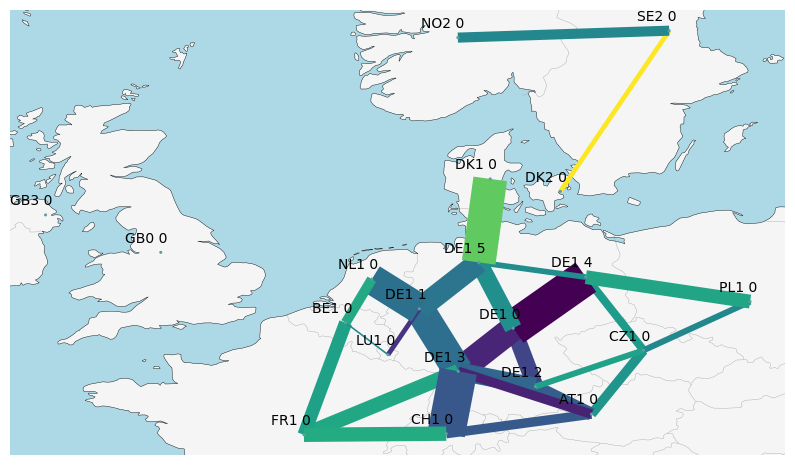

In [10]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [11]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


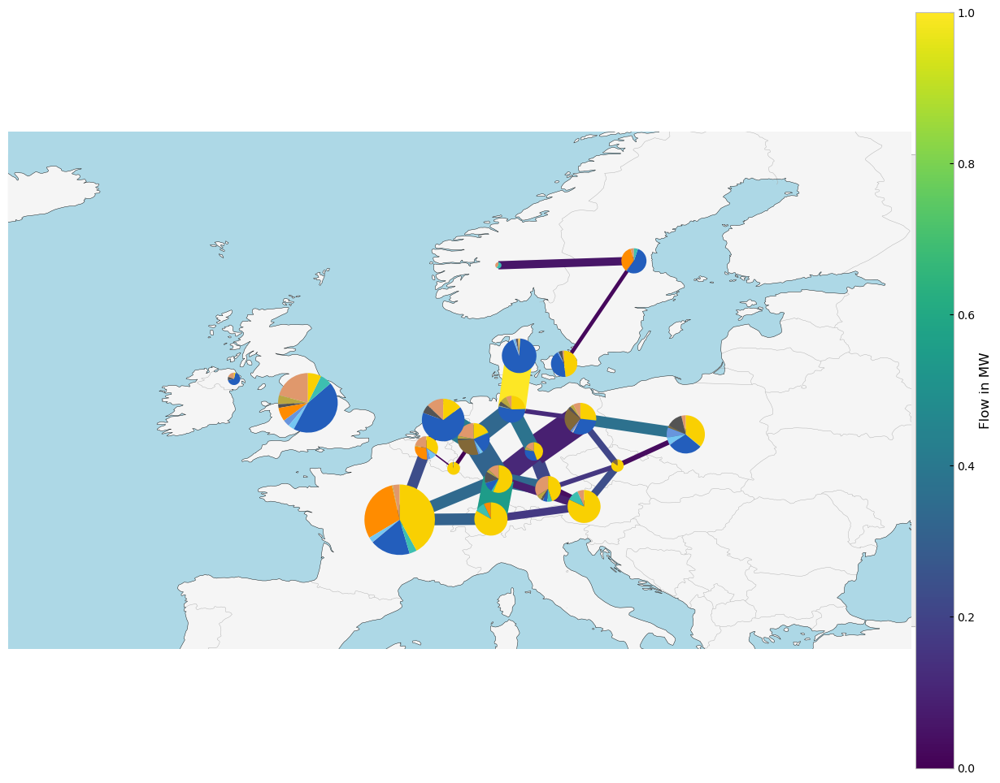

In [12]:
fig, ax = plt.subplots(
    figsize=(15,15),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [13]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

#Adjust Load shedding's unit to MW from kW
#for column in n.generators_t.p.columns:
#    if column.endswith('load') and not column.endswith('H2 load'):
#        n.generators_t.p[column]/=1e3
        

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\971004373.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


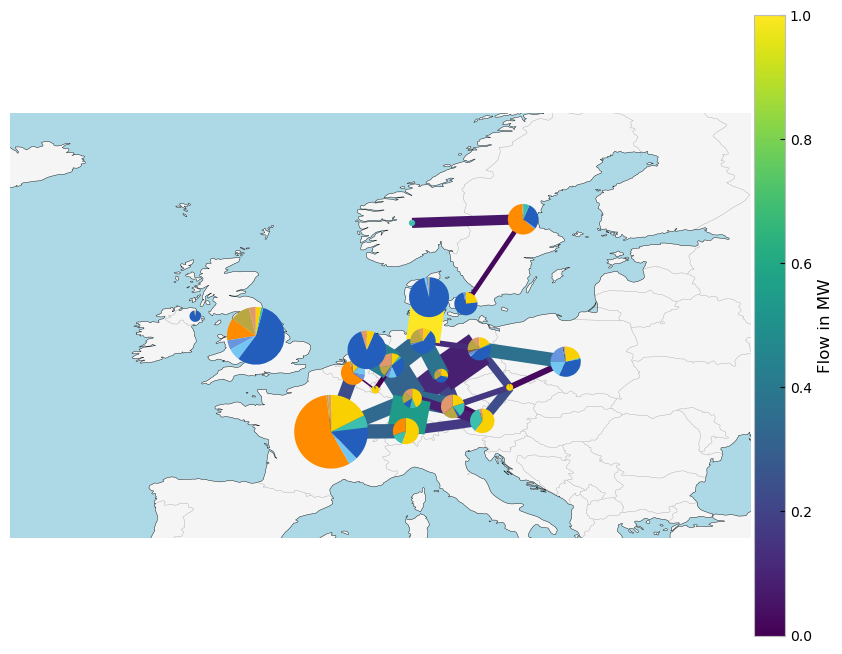

In [14]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

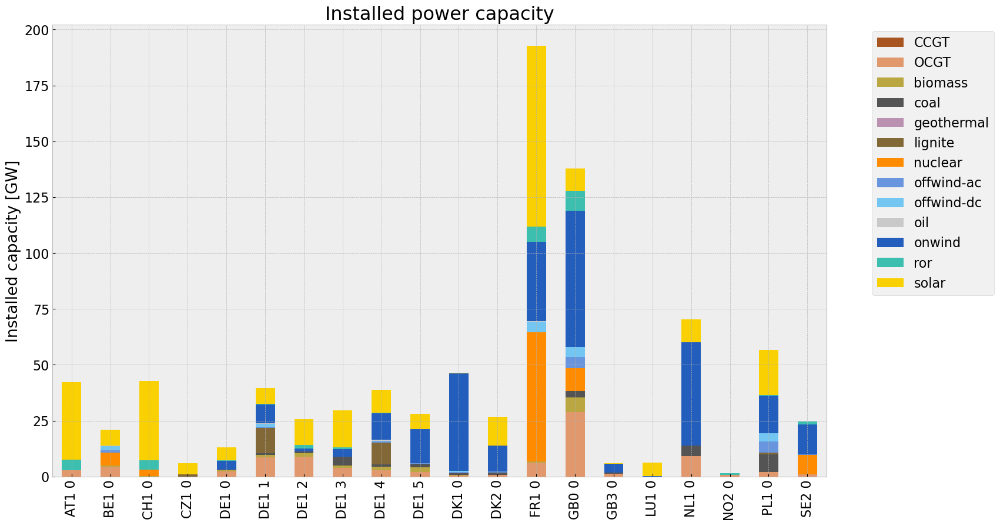

In [15]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)

<Figure size 640x480 with 0 Axes>

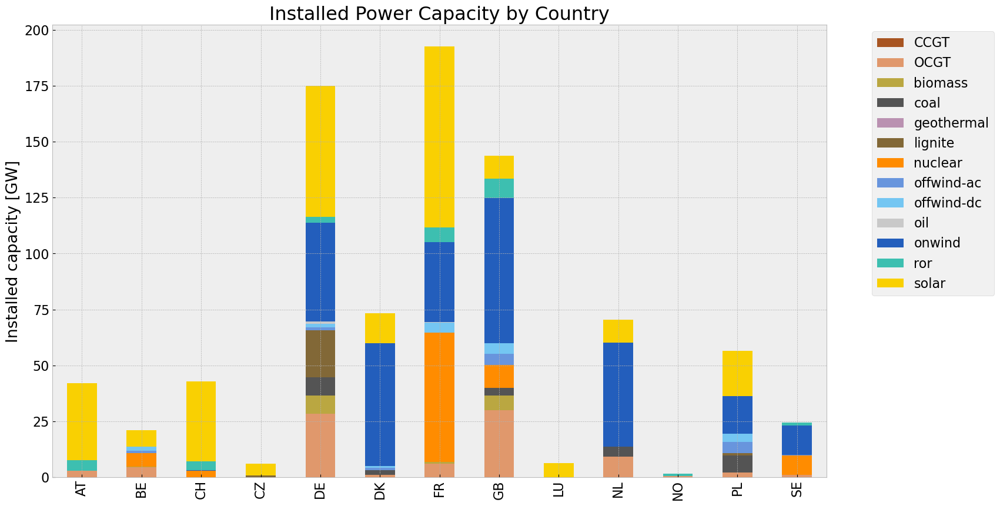

In [16]:
#aggregate installed capacities by country
def inst_cap_table_country(n,colors):

    capacities = n.generators
    capacities['country'] = capacities['bus'].str[:2]
    capacities = capacities.groupby(['country', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed Power Capacity by Country"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

cap_base_country= inst_cap_table_country(n, color_cap)

## Generation

<Figure size 640x480 with 0 Axes>

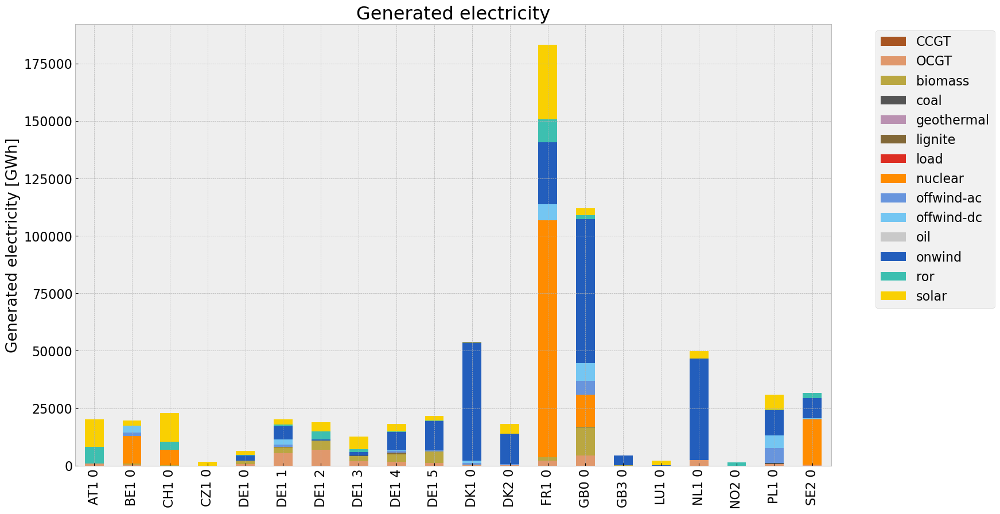

In [17]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base = gen_power_table(n,colors_gen_table)

<Figure size 640x480 with 0 Axes>

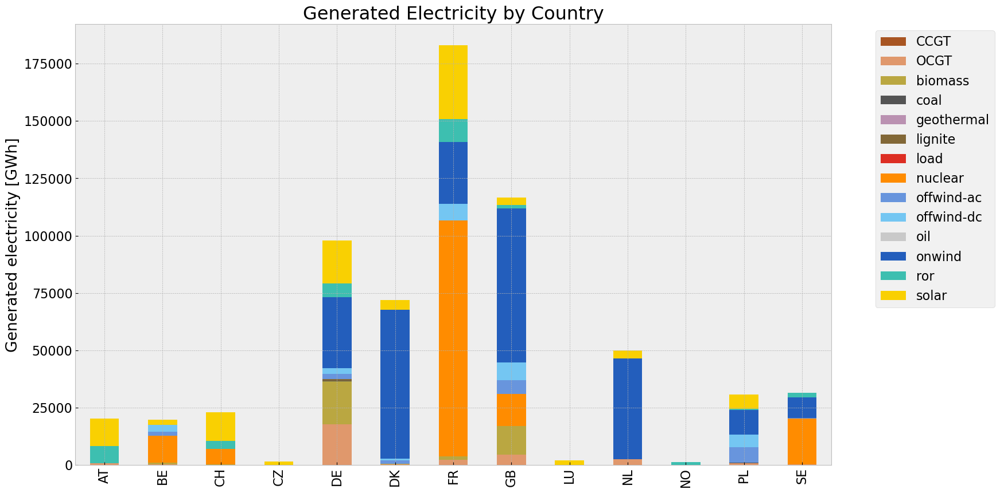

In [18]:
def gen_power_table_country(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    #generations = n.generators
    #generations['country'] = generations['bus'].str[:2]
    #generations = pd.Series(index = n.generators.groupby(['country', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    generations['country'] = generations.index.str[:2]
    generations = generations.groupby(['country']).sum()   
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated Electricity by Country"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base_country = gen_power_table_country(n,colors_gen_table)

## Snapshot

In [19]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()

#links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\318663498.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\318663498.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()


In [20]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\4040974225.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [21]:
def gen_curve(n, start, end, colors,ctr):

    plt.rcParams.update({'font.size': 16})

    #import export 
    lines_ctr_bus0 = n.lines[n.lines['bus0'].str.startswith(ctr) & ~n.lines['bus1'].str.startswith(ctr)].index
    lines_ctr_bus1 = n.lines[n.lines['bus1'].str.startswith(ctr) & ~n.lines['bus0'].str.startswith(ctr)].index
    links_ctr_bus0 = n.links[n.links['bus0'].str.startswith(ctr) & ~n.links['bus1'].str.startswith(ctr)].index
    links_ctr_bus1 = n.links[n.links['bus1'].str.startswith(ctr) & ~n.links['bus0'].str.startswith(ctr)].index


    df_lines_ctr_bus0 = n.lines_t.p0[lines_ctr_bus0]
    df_lines_ctr_bus1 = n.lines_t.p1[lines_ctr_bus1]
    df_links_ctr_bus0 = n.links_t.p0[links_ctr_bus0]
    df_links_ctr_bus1 = n.links_t.p1[links_ctr_bus1]


    import_export = pd.concat([df_lines_ctr_bus0, df_lines_ctr_bus1, df_links_ctr_bus0, df_links_ctr_bus1], axis=1).sum(axis=1)*-1 #MW

    columns_gen = [col for col in  n.generators_t.p.columns if col.startswith(ctr)]
    p_country = n.generators_t.p[columns_gen]

    p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
    

    #add import color
    colors.append('#133337') #for Import

    #p_by_carrier['load'] /= 1e3

    #links fuel cell
    #links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    #links = links.drop(columns='DC', inplace=False)
    #links['H2 fuel cell']*=-1
       
    # join generator, lines, links, and storage unit
    if not n.storage_units.empty:
        col_sto = [col for col in  n.storage_units_t.p.columns if col.startswith(ctr)]
        sto_ctr = n.storage_units_t.p[col_sto]
        sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW     
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
        p_by_carrier['Import'] = import_export 
        p_by_carrier = p_by_carrier.div(1e3) #GW
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    #p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    col_load = [col for col in  n.loads_t.p_set.columns if col.startswith(ctr)]
    loads_ctr = n.loads_t.p_set[col_load]
    loads = loads_ctr.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [22]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [23]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [24]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [25]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

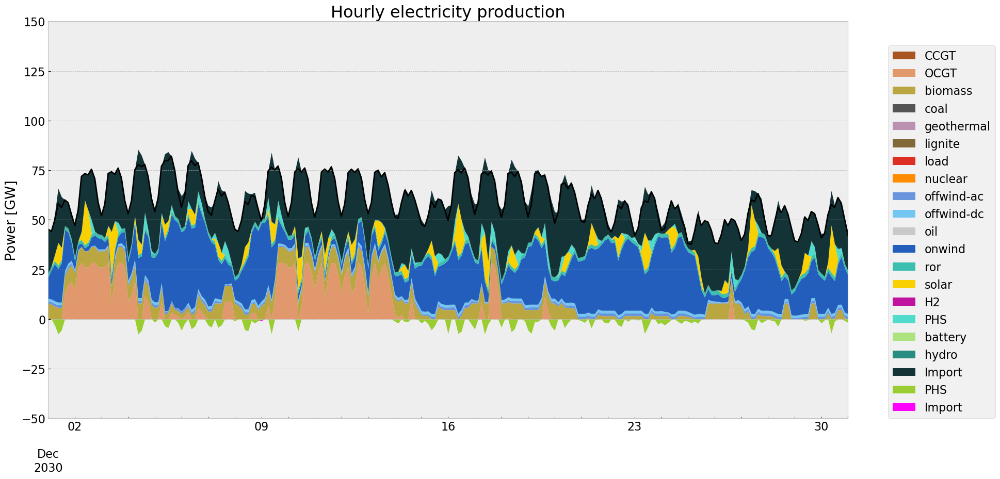

In [26]:
# winter
gen_curve(n, '2030-12-01', '2030-12-31', colors_gen,'DE')

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

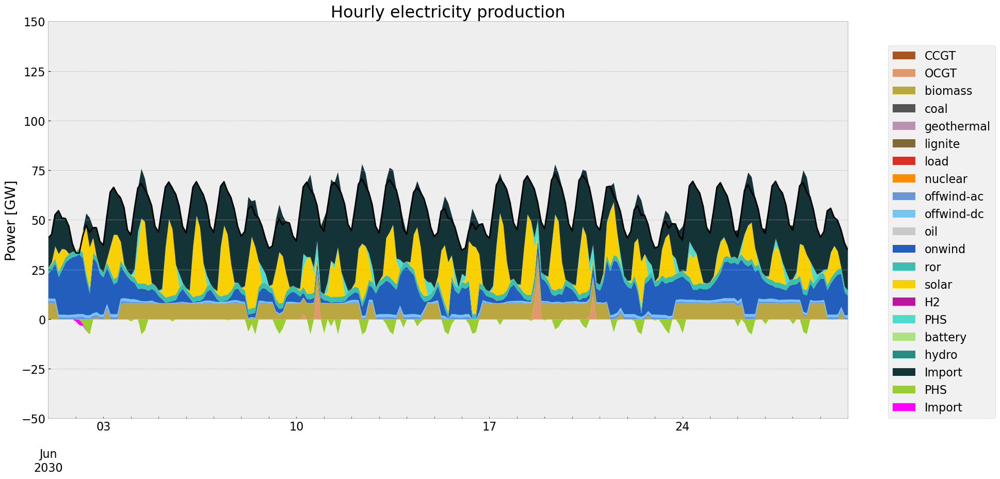

In [27]:
#summer
gen_curve(n, '2030-06-01', '2030-06-30', colors_gen,'DE')

In [28]:
def gen_curve_tot(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})

    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
    
    # join generator, lines, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW     
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
        p_by_carrier = p_by_carrier.div(1e3) #GW
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    #p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    loads = n.loads_t.p_set.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,370)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

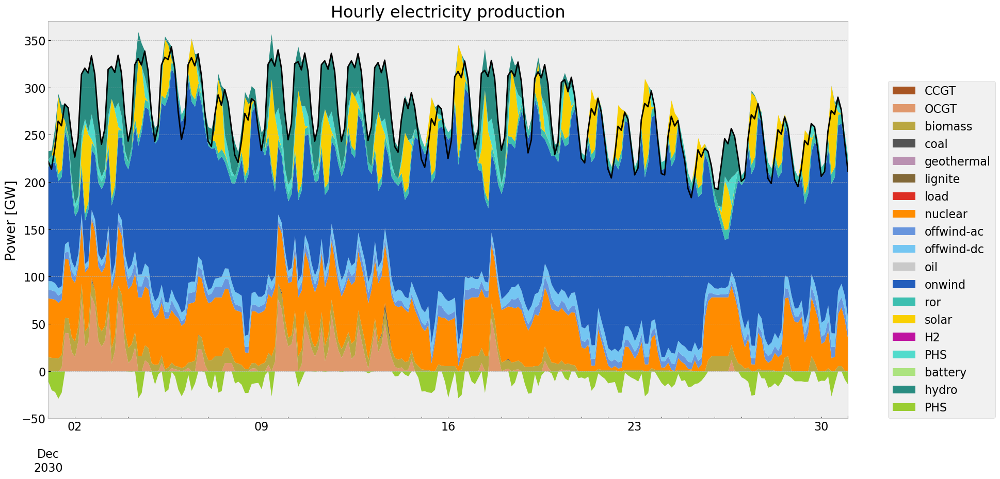

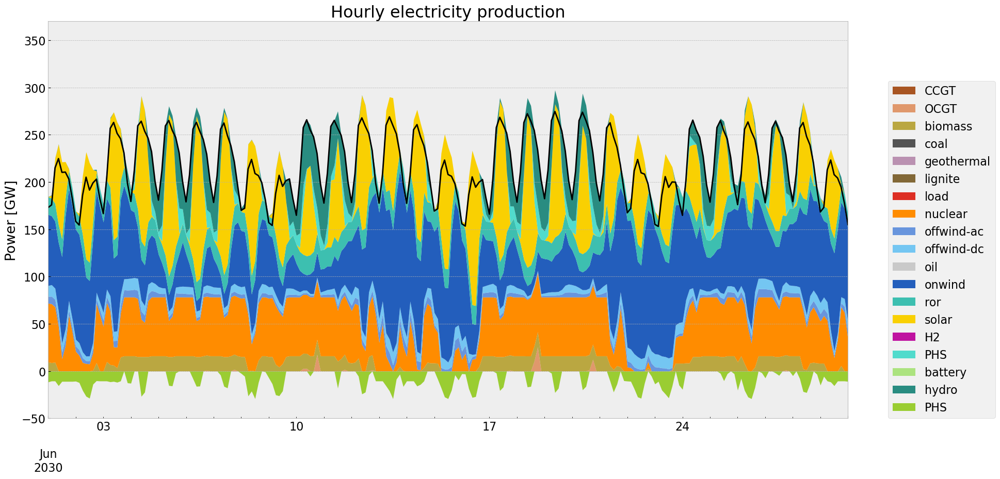

In [29]:
#generation curve all countries
#winter
gen_curve_tot(n, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n, '2030-06-01', '2030-06-30', colors_gen)

## Storage

In [30]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})
    storage = n.storage_units
    storage['country'] = storage['bus'].str[:2]

    (storage.groupby(['country','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacities of storage systems By Country",
                                #ylim=[0,20]
    )
    store = storage.groupby(['country','carrier']).p_nom_opt.sum()/1000 #GW
    store.fillna(0, inplace=True)
    return store

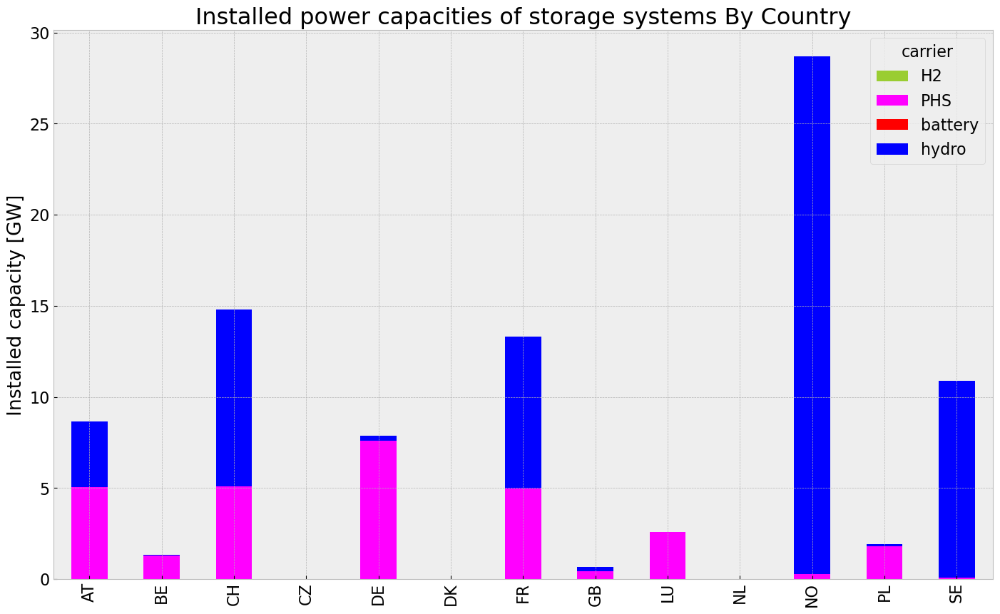

In [31]:
store_base = inst_store_table(n)

In [32]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        title=f"State of charge of aggregated storage systems",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


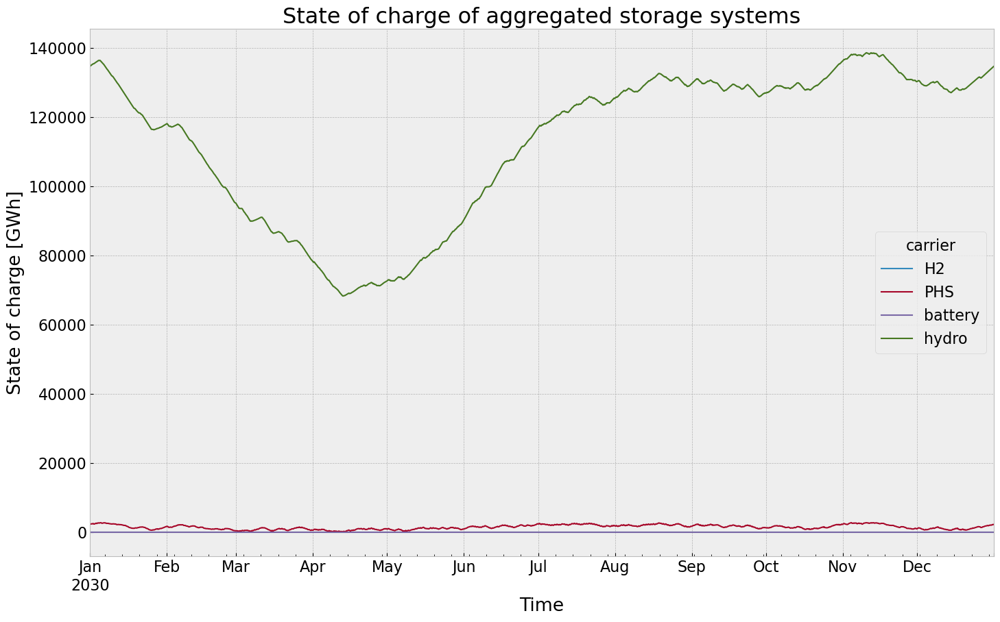

In [33]:
state_of_charge_plot(n)

## Electricity Price

In [34]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)
    plt.legend(loc=(1.05,0))
plt.show()

In [35]:
#columns_to_keep =[]

#for i in n.buses_t.marginal_price.columns.tolist():
    #if not i.endswith('H2'):
        #columns_to_keep.append(i)

#buses without store
#columns_to_keep =[]

#price_dur_curve = pd.DataFrame()
#for region in columns_to_keep:
    #price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


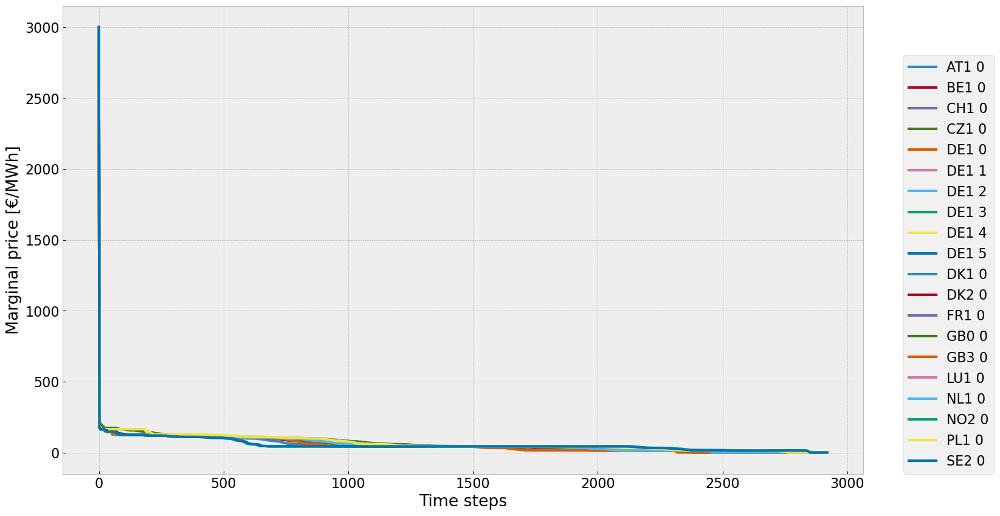

In [36]:
price_dur_curve_plot(n)

In [37]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

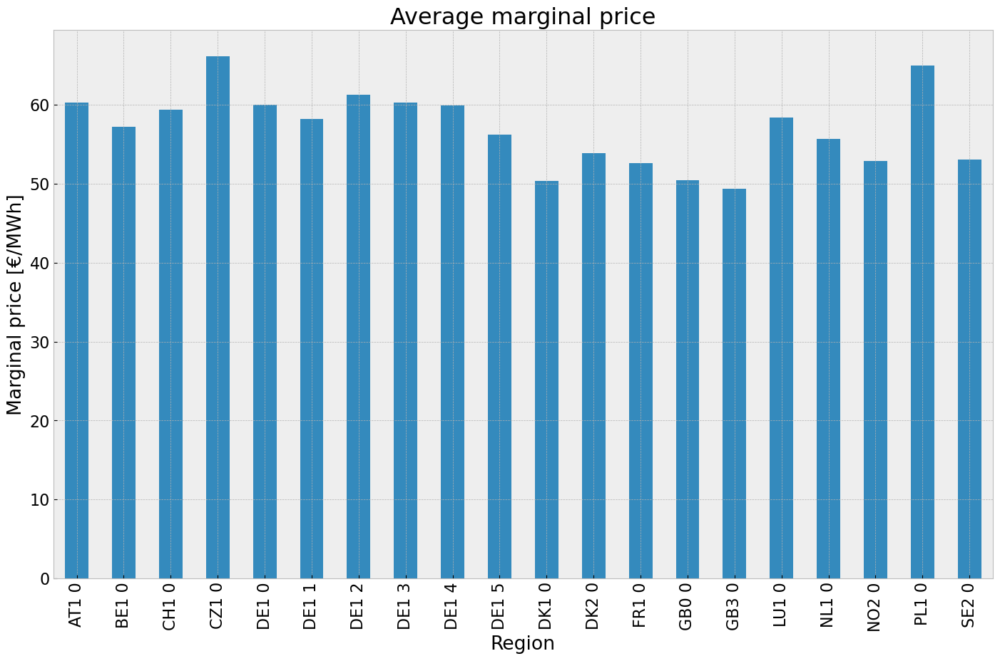

In [38]:
price_regions_table(n)

In [39]:
def price_regions(n):
    # Assuming 'n.buses_t.marginal_price' returns a DataFrame or similar structure with 'mean()' method
    mean_p = n.buses_t.marginal_price.mean()

    #hprice = mean_p.filter(like='H2')
    #eprice = mean_p.drop(hprice.index)

    # Setup figure and subplots with 1 row and 2 columns
    fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(8, 8))

    # Plot for eprice
    hb= plt.hexbin(
        n.buses.x,
        n.buses.y,
        gridsize=20,
        C=mean_p,
        cmap=plt.cm.jet,
        zorder=3,
    )

    n.plot(ax=ax, line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the second subplot
    
    cb = fig.colorbar(hb, ax=ax, location='bottom')
    cb.set_label("Mean Electricity Marginal Price (EUR/MWh)")
    fig.tight_layout()

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


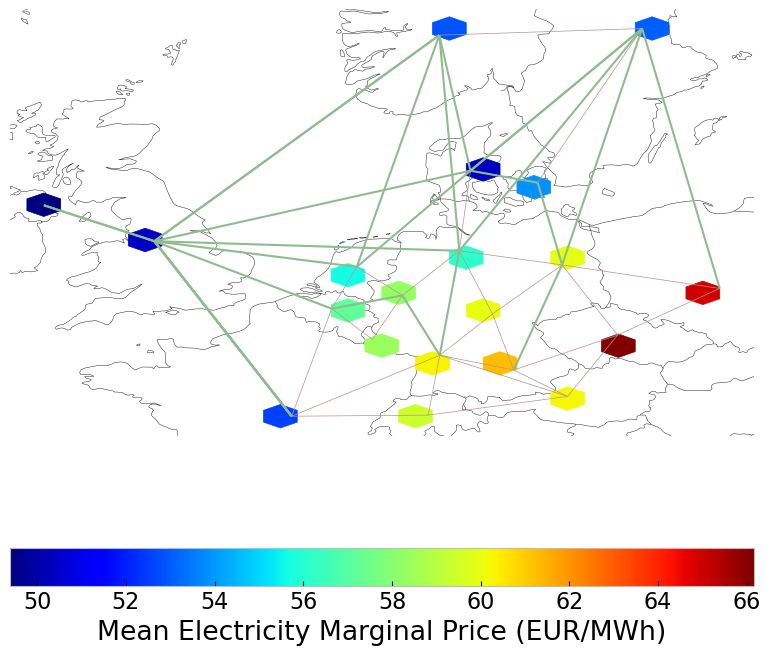

In [40]:
price_regions(n)

## Emission

In [41]:
def em_table(n):
    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack())#MWh

    #mean efficiency of each carrier
    eff = n.generators.groupby('carrier').efficiency.mean()

    e = generations.sum()
    emission = []

    for index in e.index:
        for index_c in n.carriers.index:
            for index_eff in eff.index:
                if index == index_c == index_eff:
                    em = n.carriers.loc[index_c,"co2_emissions"]
                    emission.append(em)

    df = e.to_frame()
    df.rename(columns={0: 'Generation in MWh'}, inplace=True)
    df['efficiency'] = eff
    df['emissions in Tonnes CO2/MWh'] = emission
    df['emissions in Tonnes CO2']= df['Generation in MWh']/df['efficiency']*df['emissions in Tonnes CO2/MWh']
    df['emissions in Tonnes CO2'].sum() 
    return df

em_base =em_table(n)
em_base

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,2.950103e+07,0.451621,0.1980,1.293387e+07
biomass,3.377481e+07,0.468000,0.0000,0.000000e+00
coal,7.117319e+05,0.329908,0.3361,7.250902e+05
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,9.211707e+05,0.337285,0.4069,1.111300e+06
load,3.775349e+03,1.000000,0.0000,0.000000e+00
nuclear,1.554148e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.794435e+07,1.000000,0.0000,0.000000e+00


# Drought Scenario
Cut start: 01.02.2030 
Cut end: 30.09.2030
reduction on inflow: 100%


In [42]:
#copy network
n1=n.copy()

#drought scenario
cut_start=pd.to_datetime('2013-01-01 00:00:00')
cut_end = pd.to_datetime('2013-09-30 21:00:00')
reduction = 0.5

#ror cut
for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('ror'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * reduction #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                

#storage hydro cut
n1.storage_units_t.inflow.loc[cut_start:cut_end] *= reduction

#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

#set the optimal capacity of links from the base scenario as the new minimum capacity 
for index, value in n1.links.p_nom_extendable.items():
    if value:  
        n1.links.at[index, 'p_nom_min'] = n.links.at[index, 'p_nom_opt']          

## 1. Scenario: allow additional investment of extendable generators and storage

In [43]:
n1.optimize.create_model()


Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')
Index(['24'], dtype='object', name='Line')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Generator-ext-p-lower (snapshot, Generator-ext)
 * Generator-ext-p-

In [44]:
#solve network
n1.optimize(solver_name='gurobi')

Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')
Index(['24'], dtype='object', name='Line')
Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')
Index(['24'], dtype='object', name='Line')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:05<00:00,  2.06it/s]
INFO:linopy.io: Writing time: 42.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-of31x9o6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-of31x9o6.lp


Reading time = 12.04 seconds


INFO:gurobipy:Reading time = 12.04 seconds


obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


INFO:gurobipy:obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


INFO:gurobipy:Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


Model fingerprint: 0x86131e58


INFO:gurobipy:Model fingerprint: 0x86131e58


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 1e+03]


INFO:gurobipy:  Matrix range     [1e-02, 1e+03]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e-01, 2e+10]


INFO:gurobipy:  Bounds range     [7e-01, 2e+10]


  RHS range        [2e+00, 1e+09]


INFO:gurobipy:  RHS range        [2e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 2150043 rows and 372373 columns (presolve time = 5s) ...


INFO:gurobipy:Presolve removed 2150043 rows and 372373 columns (presolve time = 5s) ...


Presolve removed 2150043 rows and 372373 columns


INFO:gurobipy:Presolve removed 2150043 rows and 372373 columns


Presolve time: 7.00s


INFO:gurobipy:Presolve time: 7.00s


Presolved: 1114820 rows, 1149129 columns, 3737809 nonzeros


INFO:gurobipy:Presolved: 1114820 rows, 1149129 columns, 3737809 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Elapsed ordering time = 9s


INFO:gurobipy:Elapsed ordering time = 9s


Elapsed ordering time = 10s


INFO:gurobipy:Elapsed ordering time = 10s


Ordering time: 16.10s


INFO:gurobipy:Ordering time: 16.10s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 172


INFO:gurobipy: Dense cols : 172


 AA' NZ     : 3.970e+06


INFO:gurobipy: AA' NZ     : 3.970e+06


 Factor NZ  : 2.895e+07 (roughly 1.2 GB of memory)


INFO:gurobipy: Factor NZ  : 2.895e+07 (roughly 1.2 GB of memory)


 Factor Ops : 6.101e+09 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 6.101e+09 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.29510868e+17 -8.23657525e+18  2.82e+10 8.69e+04  8.56e+13    28s


INFO:gurobipy:   0   6.29510868e+17 -8.23657525e+18  2.82e+10 8.69e+04  8.56e+13    28s


   1   5.51091555e+17 -3.54852948e+18  1.80e+10 2.86e+04  5.45e+13    30s


INFO:gurobipy:   1   5.51091555e+17 -3.54852948e+18  1.80e+10 2.86e+04  5.45e+13    30s


   2   4.54366437e+17 -1.79572169e+18  1.43e+10 1.11e+04  3.77e+13    32s


INFO:gurobipy:   2   4.54366437e+17 -1.79572169e+18  1.43e+10 1.11e+04  3.77e+13    32s


   3   3.23357624e+17 -1.06956583e+18  7.42e+09 4.36e+03  1.89e+13    36s


INFO:gurobipy:   3   3.23357624e+17 -1.06956583e+18  7.42e+09 4.36e+03  1.89e+13    36s


   4   2.73490620e+17 -4.88346216e+17  2.89e+09 1.21e+03  7.19e+12    39s


INFO:gurobipy:   4   2.73490620e+17 -4.88346216e+17  2.89e+09 1.21e+03  7.19e+12    39s


   5   2.04082178e+17 -1.13025104e+17  1.07e+09 2.52e+02  2.52e+12    42s


INFO:gurobipy:   5   2.04082178e+17 -1.13025104e+17  1.07e+09 2.52e+02  2.52e+12    42s


   6   5.06085920e+16 -2.08242273e+16  7.17e+07 2.21e+01  1.91e+11    44s


INFO:gurobipy:   6   5.06085920e+16 -2.08242273e+16  7.17e+07 2.21e+01  1.91e+11    44s


   7   9.67298879e+15 -3.81798086e+15  4.62e+06 1.57e+00  1.54e+10    47s


INFO:gurobipy:   7   9.67298879e+15 -3.81798086e+15  4.62e+06 1.57e+00  1.54e+10    47s


   8   2.47928823e+15 -7.35087080e+14  9.13e+05 1.72e-04  3.11e+09    50s


INFO:gurobipy:   8   2.47928823e+15 -7.35087080e+14  9.13e+05 1.72e-04  3.11e+09    50s


   9   1.66711453e+15 -4.22793466e+14  6.01e+05 3.03e-05  1.97e+09    53s


INFO:gurobipy:   9   1.66711453e+15 -4.22793466e+14  6.01e+05 3.03e-05  1.97e+09    53s


  10   1.20934559e+15 -2.82768701e+14  4.21e+05 5.03e-06  1.33e+09    56s


INFO:gurobipy:  10   1.20934559e+15 -2.82768701e+14  4.21e+05 5.03e-06  1.33e+09    56s


  11   8.62099712e+14 -1.66748674e+14  2.90e+05 5.17e-06  8.64e+08    57s


INFO:gurobipy:  11   8.62099712e+14 -1.66748674e+14  2.90e+05 5.17e-06  8.64e+08    57s


  12   6.34841529e+14 -1.11019321e+14  2.08e+05 4.15e-05  5.91e+08    59s


INFO:gurobipy:  12   6.34841529e+14 -1.11019321e+14  2.08e+05 4.15e-05  5.91e+08    59s


  13   4.07835308e+14 -7.79540212e+13  1.28e+05 1.45e-04  3.56e+08    62s


INFO:gurobipy:  13   4.07835308e+14 -7.79540212e+13  1.28e+05 1.45e-04  3.56e+08    62s


  14   2.52806989e+14 -4.51431398e+13  7.67e+04 1.35e-04  2.05e+08    65s


INFO:gurobipy:  14   2.52806989e+14 -4.51431398e+13  7.67e+04 1.35e-04  2.05e+08    65s


  15   1.86010056e+14 -2.78699328e+13  5.71e+04 2.58e-05  1.41e+08    67s


INFO:gurobipy:  15   1.86010056e+14 -2.78699328e+13  5.71e+04 2.58e-05  1.41e+08    67s


  16   1.20124894e+14 -1.93409323e+13  3.61e+04 2.27e-05  8.78e+07    69s


INFO:gurobipy:  16   1.20124894e+14 -1.93409323e+13  3.61e+04 2.27e-05  8.78e+07    69s


  17   9.52811912e+13 -1.31440592e+13  2.83e+04 1.69e-05  6.42e+07    71s


INFO:gurobipy:  17   9.52811912e+13 -1.31440592e+13  2.83e+04 1.69e-05  6.42e+07    71s


  18   4.94105633e+13 -8.09853264e+12  1.42e+04 1.10e-05  3.22e+07    73s


INFO:gurobipy:  18   4.94105633e+13 -8.09853264e+12  1.42e+04 1.10e-05  3.22e+07    73s


  19   2.91882186e+13 -7.38835096e+12  8.87e+03 8.84e-06  2.03e+07    77s


INFO:gurobipy:  19   2.91882186e+13 -7.38835096e+12  8.87e+03 8.84e-06  2.03e+07    77s


  20   2.71021227e+13 -6.73414255e+12  8.26e+03 6.56e-06  1.86e+07    80s


INFO:gurobipy:  20   2.71021227e+13 -6.73414255e+12  8.26e+03 6.56e-06  1.86e+07    80s


  21   2.29897478e+13 -6.17333522e+12  6.98e+03 6.56e-06  1.59e+07    82s


INFO:gurobipy:  21   2.29897478e+13 -6.17333522e+12  6.98e+03 6.56e-06  1.59e+07    82s


  22   1.15519496e+13 -5.66617024e+12  3.44e+03 4.37e-06  8.88e+06    83s


INFO:gurobipy:  22   1.15519496e+13 -5.66617024e+12  3.44e+03 4.37e-06  8.88e+06    83s


  23   1.01321554e+13 -4.46709817e+12  3.02e+03 2.18e-06  7.38e+06    85s


INFO:gurobipy:  23   1.01321554e+13 -4.46709817e+12  3.02e+03 2.18e-06  7.38e+06    85s


  24   4.04106262e+12 -2.42264117e+12  1.09e+03 1.51e-06  3.02e+06    88s


INFO:gurobipy:  24   4.04106262e+12 -2.42264117e+12  1.09e+03 1.51e-06  3.02e+06    88s


  25   2.22574547e+12 -1.79797013e+12  5.76e+02 1.27e-06  1.82e+06    91s


INFO:gurobipy:  25   2.22574547e+12 -1.79797013e+12  5.76e+02 1.27e-06  1.82e+06    91s


  26   1.15625062e+12 -1.40295786e+12  2.57e+02 5.22e-07  1.11e+06    94s


INFO:gurobipy:  26   1.15625062e+12 -1.40295786e+12  2.57e+02 5.22e-07  1.11e+06    94s


  27   1.06042698e+12 -1.15851921e+12  2.33e+02 4.02e-07  9.61e+05    96s


INFO:gurobipy:  27   1.06042698e+12 -1.15851921e+12  2.33e+02 4.02e-07  9.61e+05    96s


  28   1.02810169e+12 -1.11640995e+12  2.24e+02 4.72e-07  9.27e+05    98s


INFO:gurobipy:  28   1.02810169e+12 -1.11640995e+12  2.24e+02 4.72e-07  9.27e+05    98s


  29   6.74425666e+11 -9.44086426e+11  1.36e+02 4.47e-07  6.88e+05   100s


INFO:gurobipy:  29   6.74425666e+11 -9.44086426e+11  1.36e+02 4.47e-07  6.88e+05   100s


  30   5.76322334e+11 -6.32140547e+11  1.13e+02 6.26e-07  5.13e+05   102s


INFO:gurobipy:  30   5.76322334e+11 -6.32140547e+11  1.13e+02 6.26e-07  5.13e+05   102s


  31   4.04364109e+11 -2.88740280e+11  7.38e+01 1.46e-06  2.93e+05   104s


INFO:gurobipy:  31   4.04364109e+11 -2.88740280e+11  7.38e+01 1.46e-06  2.93e+05   104s


  32   3.23802557e+11 -1.81200194e+11  5.56e+01 7.90e-07  2.13e+05   108s


INFO:gurobipy:  32   3.23802557e+11 -1.81200194e+11  5.56e+01 7.90e-07  2.13e+05   108s


  33   2.37692526e+11 -6.06763756e+10  3.69e+01 1.13e-06  1.26e+05   110s


INFO:gurobipy:  33   2.37692526e+11 -6.06763756e+10  3.69e+01 1.13e-06  1.26e+05   110s


  34   2.13861887e+11 -3.45657302e+10  3.17e+01 7.90e-07  1.05e+05   113s


INFO:gurobipy:  34   2.13861887e+11 -3.45657302e+10  3.17e+01 7.90e-07  1.05e+05   113s


  35   1.91618219e+11 -2.84243973e+10  2.71e+01 7.86e-07  9.27e+04   114s


INFO:gurobipy:  35   1.91618219e+11 -2.84243973e+10  2.71e+01 7.86e-07  9.27e+04   114s


  36   1.58598276e+11  5.67431295e+09  2.01e+01 1.21e-06  6.45e+04   117s


INFO:gurobipy:  36   1.58598276e+11  5.67431295e+09  2.01e+01 1.21e-06  6.45e+04   117s


  37   1.31578003e+11  2.19785756e+10  1.46e+01 1.18e-06  4.63e+04   120s


INFO:gurobipy:  37   1.31578003e+11  2.19785756e+10  1.46e+01 1.18e-06  4.63e+04   120s


  38   1.16942578e+11  3.74794091e+10  1.16e+01 9.39e-07  3.36e+04   123s


INFO:gurobipy:  38   1.16942578e+11  3.74794091e+10  1.16e+01 9.39e-07  3.36e+04   123s


  39   1.01318922e+11  4.46769888e+10  8.45e+00 7.60e-07  2.40e+04   127s


INFO:gurobipy:  39   1.01318922e+11  4.46769888e+10  8.45e+00 7.60e-07  2.40e+04   127s


  40   8.99900679e+10  4.91140856e+10  6.10e+00 1.19e-06  1.73e+04   130s


INFO:gurobipy:  40   8.99900679e+10  4.91140856e+10  6.10e+00 1.19e-06  1.73e+04   130s


  41   8.39832940e+10  5.18355585e+10  4.88e+00 1.97e-06  1.36e+04   133s


INFO:gurobipy:  41   8.39832940e+10  5.18355585e+10  4.88e+00 1.97e-06  1.36e+04   133s


  42   7.90207211e+10  5.35454897e+10  3.81e+00 5.07e-07  1.08e+04   137s


INFO:gurobipy:  42   7.90207211e+10  5.35454897e+10  3.81e+00 5.07e-07  1.08e+04   137s


  43   7.58168036e+10  5.54606589e+10  3.13e+00 6.85e-07  8.64e+03   141s


INFO:gurobipy:  43   7.58168036e+10  5.54606589e+10  3.13e+00 6.85e-07  8.64e+03   141s


  44   7.29799702e+10  5.69200537e+10  2.53e+00 5.81e-07  6.83e+03   145s


INFO:gurobipy:  44   7.29799702e+10  5.69200537e+10  2.53e+00 5.81e-07  6.83e+03   145s


  45   7.05095974e+10  5.79938512e+10  2.00e+00 9.83e-07  5.32e+03   150s


INFO:gurobipy:  45   7.05095974e+10  5.79938512e+10  2.00e+00 9.83e-07  5.32e+03   150s


  46   6.89167084e+10  5.88205065e+10  1.64e+00 1.25e-06  4.30e+03   154s


INFO:gurobipy:  46   6.89167084e+10  5.88205065e+10  1.64e+00 1.25e-06  4.30e+03   154s


  47   6.79483544e+10  5.92591714e+10  1.42e+00 1.03e-06  3.70e+03   156s


INFO:gurobipy:  47   6.79483544e+10  5.92591714e+10  1.42e+00 1.03e-06  3.70e+03   156s


  48   6.71977013e+10  5.96610800e+10  1.26e+00 8.49e-07  3.21e+03   160s


INFO:gurobipy:  48   6.71977013e+10  5.96610800e+10  1.26e+00 8.49e-07  3.21e+03   160s


  49   6.65610851e+10  6.00321559e+10  1.13e+00 9.09e-07  2.79e+03   163s


INFO:gurobipy:  49   6.65610851e+10  6.00321559e+10  1.13e+00 9.09e-07  2.79e+03   163s


  50   6.58291525e+10  6.02553932e+10  9.59e-01 7.60e-07  2.38e+03   166s


INFO:gurobipy:  50   6.58291525e+10  6.02553932e+10  9.59e-01 7.60e-07  2.38e+03   166s


  51   6.51666387e+10  6.04555858e+10  8.13e-01 1.25e-06  2.01e+03   170s


INFO:gurobipy:  51   6.51666387e+10  6.04555858e+10  8.13e-01 1.25e-06  2.01e+03   170s


  52   6.46422470e+10  6.06039894e+10  6.93e-01 8.05e-07  1.72e+03   173s


INFO:gurobipy:  52   6.46422470e+10  6.06039894e+10  6.93e-01 8.05e-07  1.72e+03   173s


  53   6.42813364e+10  6.07838776e+10  6.08e-01 6.26e-07  1.49e+03   176s


INFO:gurobipy:  53   6.42813364e+10  6.07838776e+10  6.08e-01 6.26e-07  1.49e+03   176s


  54   6.40775517e+10  6.08234723e+10  5.61e-01 5.81e-07  1.39e+03   179s


INFO:gurobipy:  54   6.40775517e+10  6.08234723e+10  5.61e-01 5.81e-07  1.39e+03   179s


  55   6.38232722e+10  6.09432616e+10  5.03e-01 5.41e-07  1.23e+03   183s


INFO:gurobipy:  55   6.38232722e+10  6.09432616e+10  5.03e-01 5.41e-07  1.23e+03   183s


  56   6.35114285e+10  6.10731941e+10  4.31e-01 4.47e-07  1.04e+03   186s


INFO:gurobipy:  56   6.35114285e+10  6.10731941e+10  4.31e-01 4.47e-07  1.04e+03   186s


  57   6.33228443e+10  6.11514496e+10  3.85e-01 4.96e-07  9.27e+02   189s


INFO:gurobipy:  57   6.33228443e+10  6.11514496e+10  3.85e-01 4.96e-07  9.27e+02   189s


  58   6.30945513e+10  6.12133841e+10  3.33e-01 7.45e-07  8.03e+02   192s


INFO:gurobipy:  58   6.30945513e+10  6.12133841e+10  3.33e-01 7.45e-07  8.03e+02   192s


  59   6.28759529e+10  6.12752368e+10  2.81e-01 3.32e-07  6.82e+02   195s


INFO:gurobipy:  59   6.28759529e+10  6.12752368e+10  2.81e-01 3.32e-07  6.82e+02   195s


  60   6.27323270e+10  6.13209179e+10  2.47e-01 6.08e-07  6.01e+02   198s


INFO:gurobipy:  60   6.27323270e+10  6.13209179e+10  2.47e-01 6.08e-07  6.01e+02   198s


  61   6.26142418e+10  6.13544589e+10  2.18e-01 3.46e-07  5.36e+02   201s


INFO:gurobipy:  61   6.26142418e+10  6.13544589e+10  2.18e-01 3.46e-07  5.36e+02   201s


  62   6.24972338e+10  6.13977775e+10  1.90e-01 1.67e-06  4.68e+02   204s


INFO:gurobipy:  62   6.24972338e+10  6.13977775e+10  1.90e-01 1.67e-06  4.68e+02   204s


  63   6.24244722e+10  6.14220098e+10  1.72e-01 1.73e-06  4.26e+02   207s


INFO:gurobipy:  63   6.24244722e+10  6.14220098e+10  1.72e-01 1.73e-06  4.26e+02   207s


  64   6.23433463e+10  6.14469872e+10  1.52e-01 1.89e-06  3.81e+02   210s


INFO:gurobipy:  64   6.23433463e+10  6.14469872e+10  1.52e-01 1.89e-06  3.81e+02   210s


  65   6.22903140e+10  6.14834753e+10  1.39e-01 2.18e-06  3.43e+02   213s


INFO:gurobipy:  65   6.22903140e+10  6.14834753e+10  1.39e-01 2.18e-06  3.43e+02   213s


  66   6.22238158e+10  6.15126663e+10  1.23e-01 2.49e-06  3.02e+02   217s


INFO:gurobipy:  66   6.22238158e+10  6.15126663e+10  1.23e-01 2.49e-06  3.02e+02   217s


  67   6.21647356e+10  6.15301946e+10  1.09e-01 7.75e-07  2.69e+02   221s


INFO:gurobipy:  67   6.21647356e+10  6.15301946e+10  1.09e-01 7.75e-07  2.69e+02   221s


  68   6.21458756e+10  6.15444297e+10  1.04e-01 5.44e-07  2.55e+02   224s


INFO:gurobipy:  68   6.21458756e+10  6.15444297e+10  1.04e-01 5.44e-07  2.55e+02   224s


  69   6.20910626e+10  6.15601082e+10  9.05e-02 9.02e-07  2.25e+02   227s


INFO:gurobipy:  69   6.20910626e+10  6.15601082e+10  9.05e-02 9.02e-07  2.25e+02   227s


  70   6.20675921e+10  6.15644022e+10  8.47e-02 8.94e-07  2.13e+02   231s


INFO:gurobipy:  70   6.20675921e+10  6.15644022e+10  8.47e-02 8.94e-07  2.13e+02   231s


  71   6.20392599e+10  6.15741041e+10  7.78e-02 8.87e-07  1.97e+02   234s


INFO:gurobipy:  71   6.20392599e+10  6.15741041e+10  7.78e-02 8.87e-07  1.97e+02   234s


  72   6.19993289e+10  6.15872040e+10  6.80e-02 8.34e-07  1.74e+02   237s


INFO:gurobipy:  72   6.19993289e+10  6.15872040e+10  6.80e-02 8.34e-07  1.74e+02   237s


  73   6.19895461e+10  6.15940070e+10  6.56e-02 7.90e-07  1.67e+02   241s


INFO:gurobipy:  73   6.19895461e+10  6.15940070e+10  6.56e-02 7.90e-07  1.67e+02   241s


  74   6.19517000e+10  6.16084055e+10  5.65e-02 9.39e-07  1.45e+02   243s


INFO:gurobipy:  74   6.19517000e+10  6.16084055e+10  5.65e-02 9.39e-07  1.45e+02   243s


  75   6.19351524e+10  6.16235673e+10  5.26e-02 1.21e-06  1.32e+02   246s


INFO:gurobipy:  75   6.19351524e+10  6.16235673e+10  5.26e-02 1.21e-06  1.32e+02   246s


  76   6.18982540e+10  6.16288628e+10  4.36e-02 1.36e-06  1.14e+02   250s


INFO:gurobipy:  76   6.18982540e+10  6.16288628e+10  4.36e-02 1.36e-06  1.14e+02   250s


  77   6.18908623e+10  6.16328945e+10  4.18e-02 1.67e-06  1.09e+02   253s


INFO:gurobipy:  77   6.18908623e+10  6.16328945e+10  4.18e-02 1.67e-06  1.09e+02   253s


  78   6.18645638e+10  6.16399725e+10  3.54e-02 2.18e-06  9.47e+01   255s


INFO:gurobipy:  78   6.18645638e+10  6.16399725e+10  3.54e-02 2.18e-06  9.47e+01   255s


  79   6.18488537e+10  6.16437091e+10  3.16e-02 1.92e-06  8.64e+01   259s


INFO:gurobipy:  79   6.18488537e+10  6.16437091e+10  3.16e-02 1.92e-06  8.64e+01   259s


  80   6.18457236e+10  6.16502938e+10  3.09e-02 1.13e-06  8.24e+01   262s


INFO:gurobipy:  80   6.18457236e+10  6.16502938e+10  3.09e-02 1.13e-06  8.24e+01   262s


  81   6.18370828e+10  6.16531310e+10  2.88e-02 7.60e-07  7.75e+01   265s


INFO:gurobipy:  81   6.18370828e+10  6.16531310e+10  2.88e-02 7.60e-07  7.75e+01   265s


  82   6.18270619e+10  6.16598029e+10  2.64e-02 2.36e-07  7.05e+01   268s


INFO:gurobipy:  82   6.18270619e+10  6.16598029e+10  2.64e-02 2.36e-07  7.05e+01   268s


  83   6.18195008e+10  6.16622928e+10  2.46e-02 2.10e-07  6.62e+01   271s


INFO:gurobipy:  83   6.18195008e+10  6.16622928e+10  2.46e-02 2.10e-07  6.62e+01   271s


  84   6.18084778e+10  6.16678994e+10  2.20e-02 2.48e-07  5.92e+01   274s


INFO:gurobipy:  84   6.18084778e+10  6.16678994e+10  2.20e-02 2.48e-07  5.92e+01   274s


  85   6.18018825e+10  6.16698214e+10  2.05e-02 2.68e-07  5.56e+01   277s


INFO:gurobipy:  85   6.18018825e+10  6.16698214e+10  2.05e-02 2.68e-07  5.56e+01   277s


  86   6.17931473e+10  6.16752949e+10  1.84e-02 1.84e-07  4.96e+01   280s


INFO:gurobipy:  86   6.17931473e+10  6.16752949e+10  1.84e-02 1.84e-07  4.96e+01   280s


  87   6.17869290e+10  6.16761648e+10  1.70e-02 1.77e-07  4.66e+01   283s


INFO:gurobipy:  87   6.17869290e+10  6.16761648e+10  1.70e-02 1.77e-07  4.66e+01   283s


  88   6.17778699e+10  6.16806829e+10  1.48e-02 4.73e-07  4.09e+01   286s


INFO:gurobipy:  88   6.17778699e+10  6.16806829e+10  1.48e-02 4.73e-07  4.09e+01   286s


  89   6.17719698e+10  6.16816352e+10  1.34e-02 4.11e-07  3.79e+01   290s


INFO:gurobipy:  89   6.17719698e+10  6.16816352e+10  1.34e-02 4.11e-07  3.79e+01   290s


  90   6.17688955e+10  6.16831645e+10  1.27e-02 3.28e-07  3.60e+01   293s


INFO:gurobipy:  90   6.17688955e+10  6.16831645e+10  1.27e-02 3.28e-07  3.60e+01   293s


  91   6.17615787e+10  6.16868895e+10  1.10e-02 9.39e-07  3.14e+01   296s


INFO:gurobipy:  91   6.17615787e+10  6.16868895e+10  1.10e-02 9.39e-07  3.14e+01   296s


  92   6.17572846e+10  6.16895871e+10  1.00e-02 1.19e-06  2.84e+01   299s


INFO:gurobipy:  92   6.17572846e+10  6.16895871e+10  1.00e-02 1.19e-06  2.84e+01   299s


  93   6.17509287e+10  6.16919837e+10  8.55e-03 2.11e-07  2.47e+01   303s


INFO:gurobipy:  93   6.17509287e+10  6.16919837e+10  8.55e-03 2.11e-07  2.47e+01   303s


  94   6.17499662e+10  6.16926916e+10  8.32e-03 3.43e-07  2.40e+01   305s


INFO:gurobipy:  94   6.17499662e+10  6.16926916e+10  8.32e-03 3.43e-07  2.40e+01   305s


  95   6.17471801e+10  6.16956844e+10  7.67e-03 1.28e-06  2.16e+01   308s


INFO:gurobipy:  95   6.17471801e+10  6.16956844e+10  7.67e-03 1.28e-06  2.16e+01   308s


  96   6.17451364e+10  6.16969838e+10  7.20e-03 1.33e-06  2.02e+01   311s


INFO:gurobipy:  96   6.17451364e+10  6.16969838e+10  7.20e-03 1.33e-06  2.02e+01   311s


  97   6.17425384e+10  6.16987665e+10  6.61e-03 1.43e-06  1.84e+01   314s


INFO:gurobipy:  97   6.17425384e+10  6.16987665e+10  6.61e-03 1.43e-06  1.84e+01   314s


  98   6.17391167e+10  6.16999066e+10  5.83e-03 1.70e-06  1.65e+01   317s


INFO:gurobipy:  98   6.17391167e+10  6.16999066e+10  5.83e-03 1.70e-06  1.65e+01   317s


  99   6.17361323e+10  6.17011507e+10  5.12e-03 1.82e-06  1.47e+01   319s


INFO:gurobipy:  99   6.17361323e+10  6.17011507e+10  5.12e-03 1.82e-06  1.47e+01   319s


 100   6.17352649e+10  6.17029971e+10  4.91e-03 2.15e-06  1.36e+01   322s


INFO:gurobipy: 100   6.17352649e+10  6.17029971e+10  4.91e-03 2.15e-06  1.36e+01   322s


 101   6.17336505e+10  6.17037093e+10  4.53e-03 2.10e-06  1.26e+01   324s


INFO:gurobipy: 101   6.17336505e+10  6.17037093e+10  4.53e-03 2.10e-06  1.26e+01   324s


 102   6.17318773e+10  6.17045174e+10  4.12e-03 8.05e-07  1.15e+01   327s


INFO:gurobipy: 102   6.17318773e+10  6.17045174e+10  4.12e-03 8.05e-07  1.15e+01   327s


 103   6.17308555e+10  6.17058210e+10  3.88e-03 5.44e-07  1.05e+01   330s


INFO:gurobipy: 103   6.17308555e+10  6.17058210e+10  3.88e-03 5.44e-07  1.05e+01   330s


 104   6.17287554e+10  6.17067739e+10  3.39e-03 1.18e-06  9.24e+00   333s


INFO:gurobipy: 104   6.17287554e+10  6.17067739e+10  3.39e-03 1.18e-06  9.24e+00   333s


 105   6.17275427e+10  6.17076005e+10  3.11e-03 1.55e-07  8.39e+00   336s


INFO:gurobipy: 105   6.17275427e+10  6.17076005e+10  3.11e-03 1.55e-07  8.39e+00   336s


 106   6.17266712e+10  6.17078727e+10  2.91e-03 1.76e-07  7.90e+00   338s


INFO:gurobipy: 106   6.17266712e+10  6.17078727e+10  2.91e-03 1.76e-07  7.90e+00   338s


 107   6.17258071e+10  6.17082230e+10  2.71e-03 1.94e-07  7.39e+00   341s


INFO:gurobipy: 107   6.17258071e+10  6.17082230e+10  2.71e-03 1.94e-07  7.39e+00   341s


 108   6.17241866e+10  6.17088737e+10  2.34e-03 2.98e-07  6.43e+00   343s


INFO:gurobipy: 108   6.17241866e+10  6.17088737e+10  2.34e-03 2.98e-07  6.43e+00   343s


 109   6.17228526e+10  6.17096675e+10  2.03e-03 4.46e-07  5.54e+00   346s


INFO:gurobipy: 109   6.17228526e+10  6.17096675e+10  2.03e-03 4.46e-07  5.54e+00   346s


 110   6.17222108e+10  6.17104697e+10  1.89e-03 2.83e-07  4.94e+00   349s


INFO:gurobipy: 110   6.17222108e+10  6.17104697e+10  1.89e-03 2.83e-07  4.94e+00   349s


 111   6.17212124e+10  6.17109519e+10  1.66e-03 5.07e-07  4.32e+00   352s


INFO:gurobipy: 111   6.17212124e+10  6.17109519e+10  1.66e-03 5.07e-07  4.32e+00   352s


 112   6.17207920e+10  6.17111209e+10  1.57e-03 4.17e-07  4.07e+00   354s


INFO:gurobipy: 112   6.17207920e+10  6.17111209e+10  1.57e-03 4.17e-07  4.07e+00   354s


 113   6.17201189e+10  6.17114983e+10  1.42e-03 3.58e-07  3.63e+00   357s


INFO:gurobipy: 113   6.17201189e+10  6.17114983e+10  1.42e-03 3.58e-07  3.63e+00   357s


 114   6.17191790e+10  6.17119344e+10  1.20e-03 3.58e-07  3.05e+00   359s


INFO:gurobipy: 114   6.17191790e+10  6.17119344e+10  1.20e-03 3.58e-07  3.05e+00   359s


 115   6.17187957e+10  6.17120835e+10  1.12e-03 2.38e-07  2.83e+00   362s


INFO:gurobipy: 115   6.17187957e+10  6.17120835e+10  1.12e-03 2.38e-07  2.83e+00   362s


 116   6.17185484e+10  6.17122057e+10  1.06e-03 2.68e-07  2.68e+00   364s


INFO:gurobipy: 116   6.17185484e+10  6.17122057e+10  1.06e-03 2.68e-07  2.68e+00   364s


 117   6.17179917e+10  6.17123592e+10  9.47e-04 3.73e-07  2.38e+00   367s


INFO:gurobipy: 117   6.17179917e+10  6.17123592e+10  9.47e-04 3.73e-07  2.38e+00   367s


 118   6.17173171e+10  6.17124469e+10  7.98e-04 4.62e-07  2.05e+00   370s


INFO:gurobipy: 118   6.17173171e+10  6.17124469e+10  7.98e-04 4.62e-07  2.05e+00   370s


 119   6.17168034e+10  6.17127667e+10  6.81e-04 5.66e-07  1.70e+00   373s


INFO:gurobipy: 119   6.17168034e+10  6.17127667e+10  6.81e-04 5.66e-07  1.70e+00   373s


 120   6.17161269e+10  6.17129460e+10  5.30e-04 5.36e-07  1.34e+00   375s


INFO:gurobipy: 120   6.17161269e+10  6.17129460e+10  5.30e-04 5.36e-07  1.34e+00   375s


 121   6.17157717e+10  6.17131323e+10  4.50e-04 7.30e-07  1.11e+00   378s


INFO:gurobipy: 121   6.17157717e+10  6.17131323e+10  4.50e-04 7.30e-07  1.11e+00   378s


 122   6.17156349e+10  6.17131518e+10  4.21e-04 7.00e-07  1.05e+00   381s


INFO:gurobipy: 122   6.17156349e+10  6.17131518e+10  4.21e-04 7.00e-07  1.05e+00   381s


 123   6.17151525e+10  6.17133191e+10  3.14e-04 6.89e-07  7.74e-01   383s


INFO:gurobipy: 123   6.17151525e+10  6.17133191e+10  3.14e-04 6.89e-07  7.74e-01   383s


 124   6.17148340e+10  6.17134248e+10  2.43e-04 3.73e-07  5.95e-01   386s


INFO:gurobipy: 124   6.17148340e+10  6.17134248e+10  2.43e-04 3.73e-07  5.95e-01   386s


 125   6.17144893e+10  6.17135103e+10  1.68e-04 5.96e-07  4.14e-01   388s


INFO:gurobipy: 125   6.17144893e+10  6.17135103e+10  1.68e-04 5.96e-07  4.14e-01   388s


 126   6.17142729e+10  6.17136075e+10  1.20e-04 8.64e-07  2.82e-01   391s


INFO:gurobipy: 126   6.17142729e+10  6.17136075e+10  1.20e-04 8.64e-07  2.82e-01   391s


 127   6.17141041e+10  6.17136390e+10  8.39e-05 1.24e-06  1.97e-01   394s


INFO:gurobipy: 127   6.17141041e+10  6.17136390e+10  8.39e-05 1.24e-06  1.97e-01   394s


 128   6.17139833e+10  6.17136548e+10  6.95e-05 1.13e-06  1.39e-01   397s


INFO:gurobipy: 128   6.17139833e+10  6.17136548e+10  6.95e-05 1.13e-06  1.39e-01   397s


 129   6.17139180e+10  6.17136723e+10  4.99e-05 7.90e-07  1.04e-01   400s


INFO:gurobipy: 129   6.17139180e+10  6.17136723e+10  4.99e-05 7.90e-07  1.04e-01   400s


 130   6.17138350e+10  6.17136901e+10  3.73e-05 4.92e-07  6.12e-02   402s


INFO:gurobipy: 130   6.17138350e+10  6.17136901e+10  3.73e-05 4.92e-07  6.12e-02   402s


 131   6.17137924e+10  6.17136990e+10  2.25e-05 5.41e-07  3.94e-02   405s


INFO:gurobipy: 131   6.17137924e+10  6.17136990e+10  2.25e-05 5.41e-07  3.94e-02   405s


 132   6.17137863e+10  6.17137044e+10  2.05e-05 3.67e-07  3.46e-02   407s


INFO:gurobipy: 132   6.17137863e+10  6.17137044e+10  2.05e-05 3.67e-07  3.46e-02   407s


 133   6.17137795e+10  6.17137048e+10  1.84e-05 2.24e-07  3.15e-02   409s


INFO:gurobipy: 133   6.17137795e+10  6.17137048e+10  1.84e-05 2.24e-07  3.15e-02   409s


 134   6.17137690e+10  6.17137077e+10  1.50e-05 3.90e-07  2.59e-02   411s


INFO:gurobipy: 134   6.17137690e+10  6.17137077e+10  1.50e-05 3.90e-07  2.59e-02   411s


 135   6.17137546e+10  6.17137116e+10  1.04e-05 1.44e-07  1.81e-02   413s


INFO:gurobipy: 135   6.17137546e+10  6.17137116e+10  1.04e-05 1.44e-07  1.81e-02   413s


 136   6.17137465e+10  6.17137156e+10  7.84e-06 4.09e-07  1.31e-02   415s


INFO:gurobipy: 136   6.17137465e+10  6.17137156e+10  7.84e-06 4.09e-07  1.31e-02   415s


 137   6.17137384e+10  6.17137173e+10  5.30e-06 2.44e-07  8.92e-03   417s


INFO:gurobipy: 137   6.17137384e+10  6.17137173e+10  5.30e-06 2.44e-07  8.92e-03   417s


 138   6.17137348e+10  6.17137183e+10  4.19e-06 2.55e-07  6.98e-03   419s


INFO:gurobipy: 138   6.17137348e+10  6.17137183e+10  4.19e-06 2.55e-07  6.98e-03   419s


 139   6.17137304e+10  6.17137193e+10  2.84e-06 3.36e-07  4.69e-03   421s


INFO:gurobipy: 139   6.17137304e+10  6.17137193e+10  2.84e-06 3.36e-07  4.69e-03   421s


 140   6.17137287e+10  6.17137200e+10  2.33e-06 2.78e-07  3.69e-03   423s


INFO:gurobipy: 140   6.17137287e+10  6.17137200e+10  2.33e-06 2.78e-07  3.69e-03   423s


 141   6.17137251e+10  6.17137204e+10  1.21e-06 4.51e-07  1.98e-03   425s


INFO:gurobipy: 141   6.17137251e+10  6.17137204e+10  1.21e-06 4.51e-07  1.98e-03   425s


 142   6.17137233e+10  6.17137206e+10  6.57e-07 4.81e-07  1.12e-03   427s


INFO:gurobipy: 142   6.17137233e+10  6.17137206e+10  6.57e-07 4.81e-07  1.12e-03   427s


 143   6.17137229e+10  6.17137207e+10  5.69e-07 2.65e-07  8.99e-04   430s


INFO:gurobipy: 143   6.17137229e+10  6.17137207e+10  5.69e-07 2.65e-07  8.99e-04   430s


 144   6.17137221e+10  6.17137209e+10  3.71e-07 1.10e-07  5.14e-04   433s


INFO:gurobipy: 144   6.17137221e+10  6.17137209e+10  3.71e-07 1.10e-07  5.14e-04   433s


 145   6.17137217e+10  6.17137210e+10  5.03e-07 4.82e-07  2.97e-04   435s


INFO:gurobipy: 145   6.17137217e+10  6.17137210e+10  5.03e-07 4.82e-07  2.97e-04   435s


INFO:gurobipy:


Barrier solved model in 145 iterations and 435.22 seconds (141.83 work units)


INFO:gurobipy:Barrier solved model in 145 iterations and 435.22 seconds (141.83 work units)


Optimal objective 6.17137217e+10


INFO:gurobipy:Optimal objective 6.17137217e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  569163 DPushes remaining with DInf 0.0000000e+00               439s


INFO:gurobipy:  569163 DPushes remaining with DInf 0.0000000e+00               439s


  124392 DPushes remaining with DInf 0.0000000e+00               499s


INFO:gurobipy:  124392 DPushes remaining with DInf 0.0000000e+00               499s


   46717 DPushes remaining with DInf 0.0000000e+00               519s


INFO:gurobipy:   46717 DPushes remaining with DInf 0.0000000e+00               519s


   30093 DPushes remaining with DInf 0.0000000e+00               521s


INFO:gurobipy:   30093 DPushes remaining with DInf 0.0000000e+00               521s


   27944 DPushes remaining with DInf 0.0000000e+00               525s


INFO:gurobipy:   27944 DPushes remaining with DInf 0.0000000e+00               525s


   26885 DPushes remaining with DInf 0.0000000e+00               531s


INFO:gurobipy:   26885 DPushes remaining with DInf 0.0000000e+00               531s


   25831 DPushes remaining with DInf 0.0000000e+00               535s


INFO:gurobipy:   25831 DPushes remaining with DInf 0.0000000e+00               535s


   24250 DPushes remaining with DInf 0.0000000e+00               542s


INFO:gurobipy:   24250 DPushes remaining with DInf 0.0000000e+00               542s


   23723 DPushes remaining with DInf 0.0000000e+00               545s


INFO:gurobipy:   23723 DPushes remaining with DInf 0.0000000e+00               545s


   22669 DPushes remaining with DInf 0.0000000e+00               551s


INFO:gurobipy:   22669 DPushes remaining with DInf 0.0000000e+00               551s


   21615 DPushes remaining with DInf 0.0000000e+00               556s


INFO:gurobipy:   21615 DPushes remaining with DInf 0.0000000e+00               556s


   20561 DPushes remaining with DInf 0.0000000e+00               563s


INFO:gurobipy:   20561 DPushes remaining with DInf 0.0000000e+00               563s


   20034 DPushes remaining with DInf 0.0000000e+00               566s


INFO:gurobipy:   20034 DPushes remaining with DInf 0.0000000e+00               566s


   18980 DPushes remaining with DInf 0.0000000e+00               572s


INFO:gurobipy:   18980 DPushes remaining with DInf 0.0000000e+00               572s


   18453 DPushes remaining with DInf 0.0000000e+00               575s


INFO:gurobipy:   18453 DPushes remaining with DInf 0.0000000e+00               575s


   17399 DPushes remaining with DInf 0.0000000e+00               580s


INFO:gurobipy:   17399 DPushes remaining with DInf 0.0000000e+00               580s


   16345 DPushes remaining with DInf 0.0000000e+00               585s


INFO:gurobipy:   16345 DPushes remaining with DInf 0.0000000e+00               585s


   15291 DPushes remaining with DInf 0.0000000e+00               590s


INFO:gurobipy:   15291 DPushes remaining with DInf 0.0000000e+00               590s


   14237 DPushes remaining with DInf 0.0000000e+00               595s


INFO:gurobipy:   14237 DPushes remaining with DInf 0.0000000e+00               595s


   12656 DPushes remaining with DInf 0.0000000e+00               602s


INFO:gurobipy:   12656 DPushes remaining with DInf 0.0000000e+00               602s


   11602 DPushes remaining with DInf 0.0000000e+00               607s


INFO:gurobipy:   11602 DPushes remaining with DInf 0.0000000e+00               607s


   11075 DPushes remaining with DInf 0.0000000e+00               610s


INFO:gurobipy:   11075 DPushes remaining with DInf 0.0000000e+00               610s


   10021 DPushes remaining with DInf 0.0000000e+00               616s


INFO:gurobipy:   10021 DPushes remaining with DInf 0.0000000e+00               616s


    8967 DPushes remaining with DInf 0.0000000e+00               622s


INFO:gurobipy:    8967 DPushes remaining with DInf 0.0000000e+00               622s


    7913 DPushes remaining with DInf 0.0000000e+00               628s


INFO:gurobipy:    7913 DPushes remaining with DInf 0.0000000e+00               628s


    7386 DPushes remaining with DInf 0.0000000e+00               630s


INFO:gurobipy:    7386 DPushes remaining with DInf 0.0000000e+00               630s


    6332 DPushes remaining with DInf 0.0000000e+00               635s


INFO:gurobipy:    6332 DPushes remaining with DInf 0.0000000e+00               635s


    5445 DPushes remaining with DInf 0.0000000e+00               643s


INFO:gurobipy:    5445 DPushes remaining with DInf 0.0000000e+00               643s


    5075 DPushes remaining with DInf 0.0000000e+00               648s


INFO:gurobipy:    5075 DPushes remaining with DInf 0.0000000e+00               648s


    4695 DPushes remaining with DInf 0.0000000e+00               653s


INFO:gurobipy:    4695 DPushes remaining with DInf 0.0000000e+00               653s


    4305 DPushes remaining with DInf 0.0000000e+00               658s


INFO:gurobipy:    4305 DPushes remaining with DInf 0.0000000e+00               658s


    3915 DPushes remaining with DInf 0.0000000e+00               663s


INFO:gurobipy:    3915 DPushes remaining with DInf 0.0000000e+00               663s


    3525 DPushes remaining with DInf 0.0000000e+00               668s


INFO:gurobipy:    3525 DPushes remaining with DInf 0.0000000e+00               668s


    3135 DPushes remaining with DInf 0.0000000e+00               673s


INFO:gurobipy:    3135 DPushes remaining with DInf 0.0000000e+00               673s


    2604 DPushes remaining with DInf 0.0000000e+00               677s


INFO:gurobipy:    2604 DPushes remaining with DInf 0.0000000e+00               677s


    1542 DPushes remaining with DInf 0.0000000e+00               682s


INFO:gurobipy:    1542 DPushes remaining with DInf 0.0000000e+00               682s


     485 DPushes remaining with DInf 0.0000000e+00               686s


INFO:gurobipy:     485 DPushes remaining with DInf 0.0000000e+00               686s


       0 DPushes remaining with DInf 0.0000000e+00               689s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               689s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  749722 PPushes remaining with PInf 1.0964786e-02               689s


INFO:gurobipy:  749722 PPushes remaining with PInf 1.0964786e-02               689s


  270660 PPushes remaining with PInf 3.0180465e+00              2572s


INFO:gurobipy:  270660 PPushes remaining with PInf 3.0180465e+00              2572s


  242735 PPushes remaining with PInf 2.4248050e+00              2590s


INFO:gurobipy:  242735 PPushes remaining with PInf 2.4248050e+00              2590s


  220396 PPushes remaining with PInf 1.9879072e+00              2595s


INFO:gurobipy:  220396 PPushes remaining with PInf 1.9879072e+00              2595s


  213246 PPushes remaining with PInf 1.8518113e+00              2601s


INFO:gurobipy:  213246 PPushes remaining with PInf 1.8518113e+00              2601s


  210172 PPushes remaining with PInf 1.0408357e+01              2607s


INFO:gurobipy:  210172 PPushes remaining with PInf 1.0408357e+01              2607s


  208842 PPushes remaining with PInf 1.0404335e+01              2610s


INFO:gurobipy:  208842 PPushes remaining with PInf 1.0404335e+01              2610s


  205612 PPushes remaining with PInf 1.0291262e+01              2615s


INFO:gurobipy:  205612 PPushes remaining with PInf 1.0291262e+01              2615s


  118973 PPushes remaining with PInf 5.9550720e+00              3071s


INFO:gurobipy:  118973 PPushes remaining with PInf 5.9550720e+00              3071s


  114719 PPushes remaining with PInf 5.9524185e+00              3076s


INFO:gurobipy:  114719 PPushes remaining with PInf 5.9524185e+00              3076s


   87552 PPushes remaining with PInf 5.1341688e+00              3130s


INFO:gurobipy:   87552 PPushes remaining with PInf 5.1341688e+00              3130s


   57190 PPushes remaining with PInf 5.3532853e+00              3175s


INFO:gurobipy:   57190 PPushes remaining with PInf 5.3532853e+00              3175s


   44234 PPushes remaining with PInf 5.6955236e+00              3191s


INFO:gurobipy:   44234 PPushes remaining with PInf 5.6955236e+00              3191s


   28747 PPushes remaining with PInf 6.0431104e+00              3201s


INFO:gurobipy:   28747 PPushes remaining with PInf 6.0431104e+00              3201s


   23436 PPushes remaining with PInf 6.0237361e+00              3205s


INFO:gurobipy:   23436 PPushes remaining with PInf 6.0237361e+00              3205s


   18649 PPushes remaining with PInf 6.0149157e+00              3217s


INFO:gurobipy:   18649 PPushes remaining with PInf 6.0149157e+00              3217s


   16730 PPushes remaining with PInf 6.0020441e+00              3237s


INFO:gurobipy:   16730 PPushes remaining with PInf 6.0020441e+00              3237s


   15241 PPushes remaining with PInf 5.9824981e+00              3252s


INFO:gurobipy:   15241 PPushes remaining with PInf 5.9824981e+00              3252s


   13978 PPushes remaining with PInf 5.9300440e+00              3263s


INFO:gurobipy:   13978 PPushes remaining with PInf 5.9300440e+00              3263s


   12966 PPushes remaining with PInf 5.7874655e+00              3272s


INFO:gurobipy:   12966 PPushes remaining with PInf 5.7874655e+00              3272s


   12106 PPushes remaining with PInf 5.5619570e+00              3281s


INFO:gurobipy:   12106 PPushes remaining with PInf 5.5619570e+00              3281s


   11360 PPushes remaining with PInf 4.9668811e+00              3289s


INFO:gurobipy:   11360 PPushes remaining with PInf 4.9668811e+00              3289s


   10639 PPushes remaining with PInf 2.1572866e+00              3296s


INFO:gurobipy:   10639 PPushes remaining with PInf 2.1572866e+00              3296s


    8993 PPushes remaining with PInf 4.3469033e-01              3301s


INFO:gurobipy:    8993 PPushes remaining with PInf 4.3469033e-01              3301s


    6218 PPushes remaining with PInf 1.3475676e-01              3306s


INFO:gurobipy:    6218 PPushes remaining with PInf 1.3475676e-01              3306s


    3215 PPushes remaining with PInf 1.3475676e-01              3311s


INFO:gurobipy:    3215 PPushes remaining with PInf 1.3475676e-01              3311s


    1309 PPushes remaining with PInf 1.3475676e-01              3316s


INFO:gurobipy:    1309 PPushes remaining with PInf 1.3475676e-01              3316s


     782 PPushes remaining with PInf 1.3475676e-01              3322s


INFO:gurobipy:     782 PPushes remaining with PInf 1.3475676e-01              3322s


     255 PPushes remaining with PInf 1.3475676e-01              3326s


INFO:gurobipy:     255 PPushes remaining with PInf 1.3475676e-01              3326s


       0 PPushes remaining with PInf 0.0000000e+00              3329s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00              3329s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.4069480e+06   3329s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.4069480e+06   3329s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


 1075989    6.1713729e+10   0.000000e+00   3.406948e+06   3330s


INFO:gurobipy: 1075989    6.1713729e+10   0.000000e+00   3.406948e+06   3330s


 1076309    6.1713729e+10   1.102593e-06   8.400967e+07   3336s


INFO:gurobipy: 1076309    6.1713729e+10   1.102593e-06   8.400967e+07   3336s


 1076659    6.1713729e+10   0.000000e+00   9.721897e+05   3341s


INFO:gurobipy: 1076659    6.1713729e+10   0.000000e+00   9.721897e+05   3341s


 1076919    6.1713729e+10   0.000000e+00   8.521901e+05   3347s


INFO:gurobipy: 1076919    6.1713729e+10   0.000000e+00   8.521901e+05   3347s


 1077179    6.1713729e+10   0.000000e+00   8.374040e+05   3352s


INFO:gurobipy: 1077179    6.1713729e+10   0.000000e+00   8.374040e+05   3352s


 1077439    6.1713729e+10   0.000000e+00   7.397654e+05   3358s


INFO:gurobipy: 1077439    6.1713729e+10   0.000000e+00   7.397654e+05   3358s


 1077709    6.1713729e+10   0.000000e+00   3.186274e+05   3364s


INFO:gurobipy: 1077709    6.1713729e+10   0.000000e+00   3.186274e+05   3364s


 1078019    6.1713729e+10   0.000000e+00   3.361776e+05   3369s


INFO:gurobipy: 1078019    6.1713729e+10   0.000000e+00   3.361776e+05   3369s


 1078379    6.1713729e+10   0.000000e+00   1.934539e+05   3375s


INFO:gurobipy: 1078379    6.1713729e+10   0.000000e+00   1.934539e+05   3375s


 1078789    6.1713729e+10   0.000000e+00   1.234663e+05   3380s


INFO:gurobipy: 1078789    6.1713729e+10   0.000000e+00   1.234663e+05   3380s


 1079179    6.1713729e+10   0.000000e+00   1.156343e+05   3385s


INFO:gurobipy: 1079179    6.1713729e+10   0.000000e+00   1.156343e+05   3385s


 1079519    6.1713729e+10   0.000000e+00   8.191323e+04   3390s


INFO:gurobipy: 1079519    6.1713729e+10   0.000000e+00   8.191323e+04   3390s


 1079909    6.1713729e+10   0.000000e+00   6.639363e+04   3396s


INFO:gurobipy: 1079909    6.1713729e+10   0.000000e+00   6.639363e+04   3396s


 1080259    6.1713729e+10   0.000000e+00   5.209933e+04   3401s


INFO:gurobipy: 1080259    6.1713729e+10   0.000000e+00   5.209933e+04   3401s


 1080659    6.1713729e+10   0.000000e+00   3.721172e+04   3406s


INFO:gurobipy: 1080659    6.1713729e+10   0.000000e+00   3.721172e+04   3406s


 1081139    6.1713729e+10   0.000000e+00   1.307124e+04   3412s


INFO:gurobipy: 1081139    6.1713729e+10   0.000000e+00   1.307124e+04   3412s


 1081668    6.1713728e+10   0.000000e+00   9.948038e+03   3417s


INFO:gurobipy: 1081668    6.1713728e+10   0.000000e+00   9.948038e+03   3417s


 1082195    6.1713724e+10   0.000000e+00   5.397476e+03   3421s


INFO:gurobipy: 1082195    6.1713724e+10   0.000000e+00   5.397476e+03   3421s


 1083249    6.1713723e+10   0.000000e+00   2.551655e+03   3428s


INFO:gurobipy: 1083249    6.1713723e+10   0.000000e+00   2.551655e+03   3428s


 1083776    6.1713723e+10   0.000000e+00   6.551854e+02   3433s


INFO:gurobipy: 1083776    6.1713723e+10   0.000000e+00   6.551854e+02   3433s


 1084303    6.1713721e+10   0.000000e+00   2.437856e+02   3438s


INFO:gurobipy: 1084303    6.1713721e+10   0.000000e+00   2.437856e+02   3438s


 1084830    6.1713721e+10   0.000000e+00   5.427096e+01   3442s


INFO:gurobipy: 1084830    6.1713721e+10   0.000000e+00   5.427096e+01   3442s


 1086494    6.1713721e+10   0.000000e+00   1.134905e+00   3446s


INFO:gurobipy: 1086494    6.1713721e+10   0.000000e+00   1.134905e+00   3446s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


 1087397    6.1713721e+10   0.000000e+00   1.569617e-06   3452s


INFO:gurobipy: 1087397    6.1713721e+10   0.000000e+00   1.569617e-06   3452s


Extra simplex iterations after uncrush: 2


INFO:gurobipy:Extra simplex iterations after uncrush: 2


 1087400    6.1713721e+10   0.000000e+00   0.000000e+00   3456s


INFO:gurobipy: 1087400    6.1713721e+10   0.000000e+00   0.000000e+00   3456s


INFO:gurobipy:


Solved in 1087400 iterations and 3456.11 seconds (1888.40 work units)


INFO:gurobipy:Solved in 1087400 iterations and 3456.11 seconds (1888.40 work units)


Optimal objective  6.171372103e+10


INFO:gurobipy:Optimal objective  6.171372103e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521502 primals, 3264863 duals
Objective: 6.17e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-uppe

('ok', 'optimal')

In [45]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

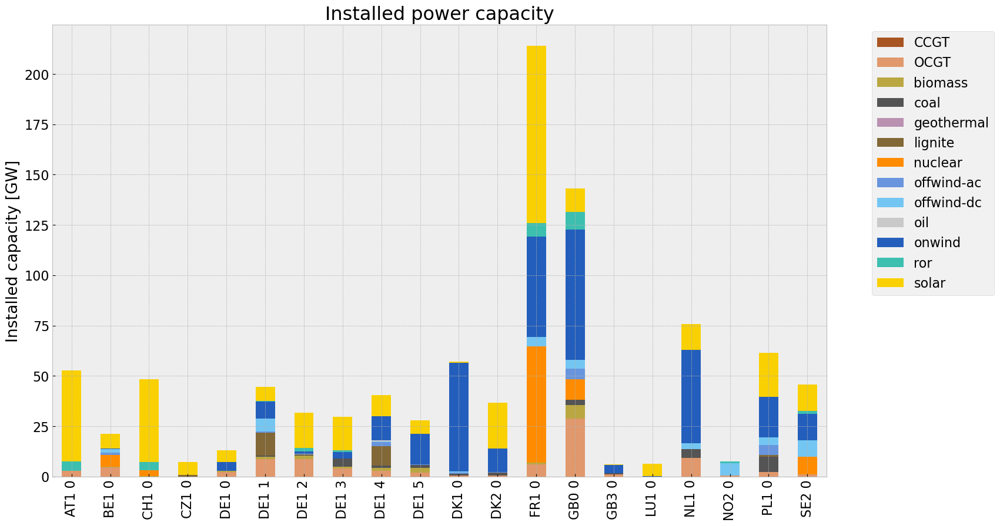

<Figure size 640x480 with 0 Axes>

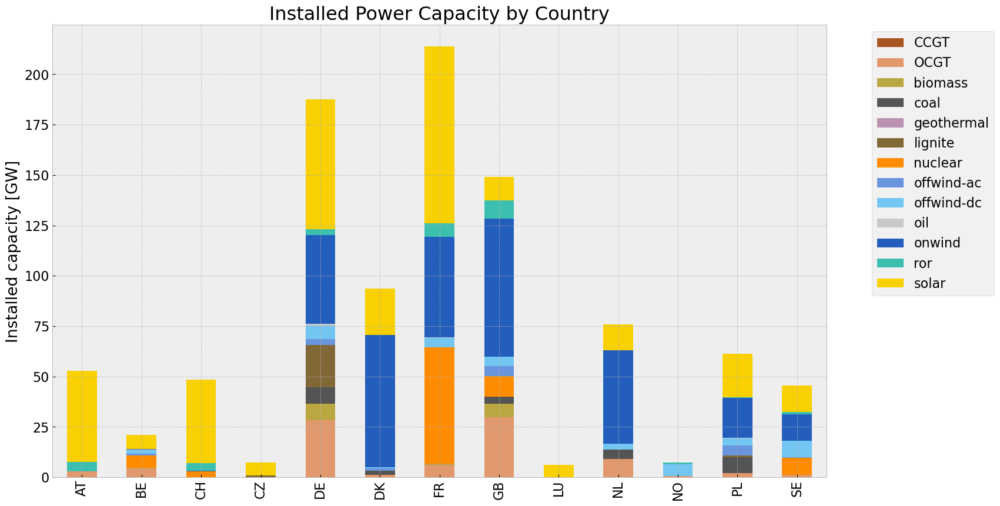

In [46]:
# consolidated istalled cap without load_shedding

#capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_inv.fillna(0, inplace=True)
#gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


capacities_inv = inst_cap_table(n1, color_cap)
cap_inv_country= inst_cap_table_country(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

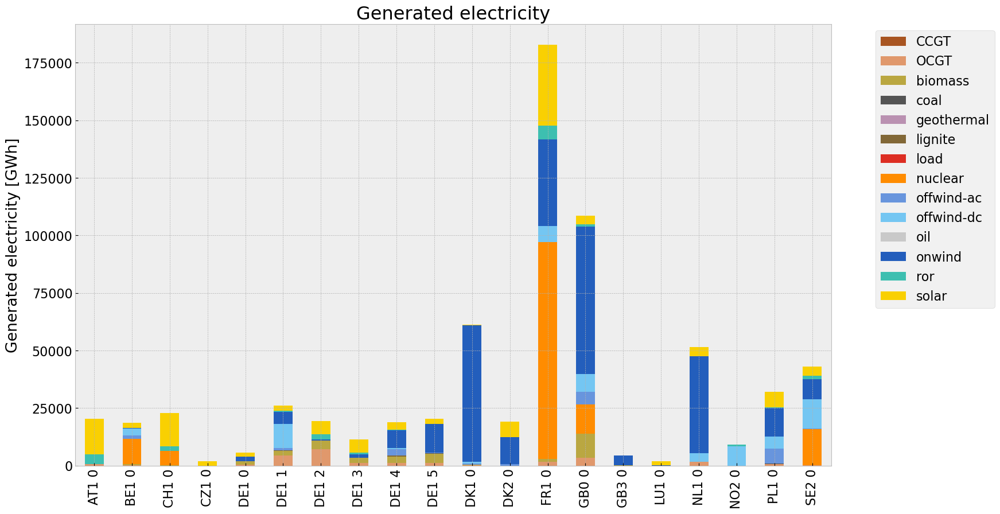

<Figure size 640x480 with 0 Axes>

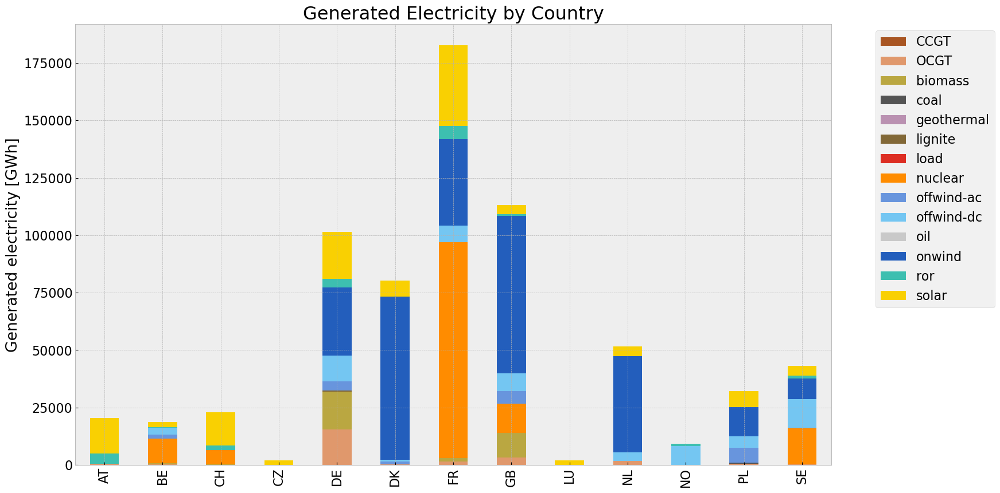

In [47]:
# consolidated generation table
#carrier = n1.generators.carrier.unique()
#df_tot_generation = n1.generators_t.p.sum()

#generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
        #key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
               # generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
           # except KeyError:
               # print('error')
                
#generations.fillna(0, inplace=True)
#gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)
gen_inv_country = gen_power_table_country(n1,colors_gen_table)

## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

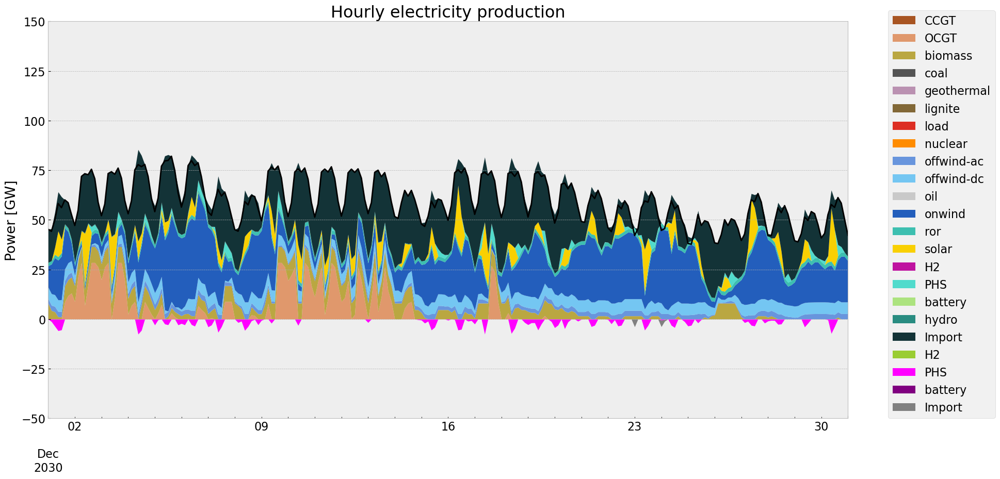

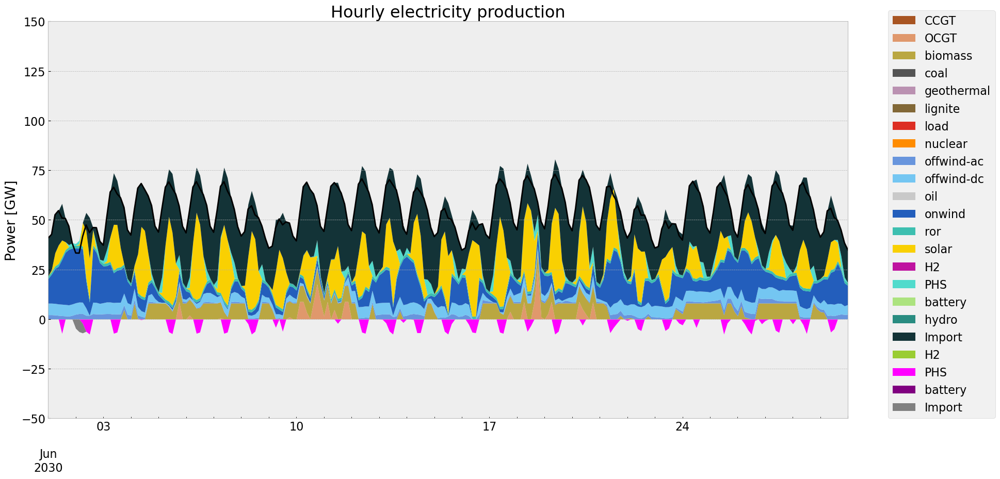

In [48]:
gen_curve(n1, '2030-12-01', '2030-12-31', colors_gen,'DE')
gen_curve(n1, '2030-06-1', '2030-06-30', colors_gen,'DE')


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

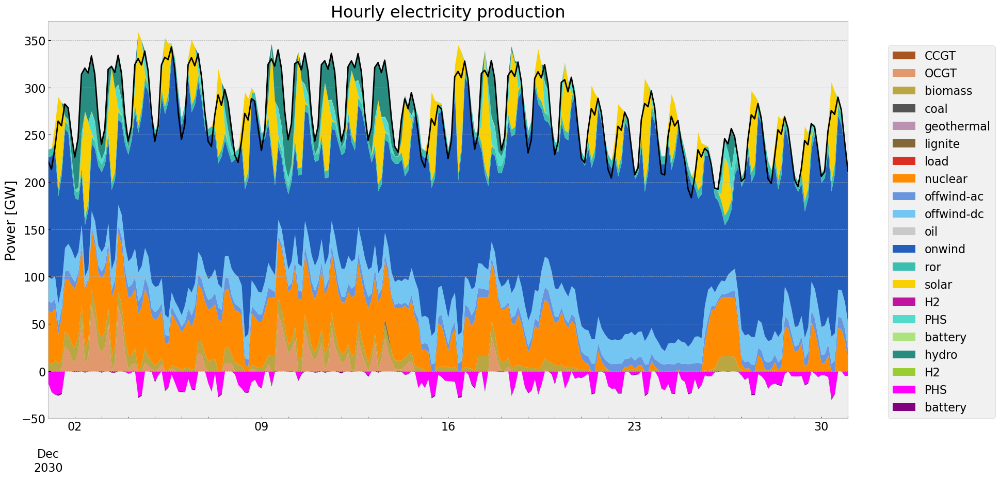

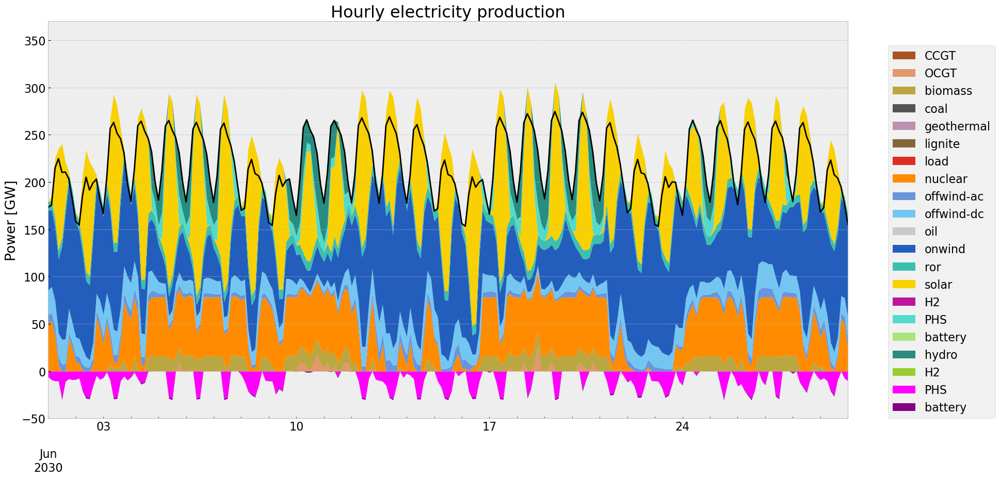

In [49]:
#generation curve all countries
#winter
gen_curve_tot(n1, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n1, '2030-06-01', '2030-06-30', colors_gen)

## Storage

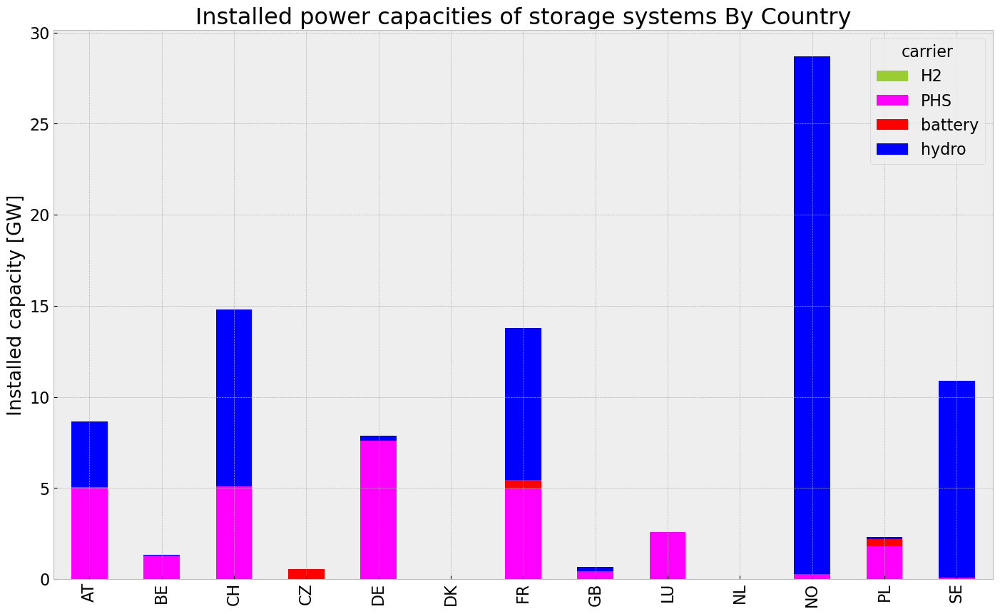

In [50]:
store_inv = inst_store_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


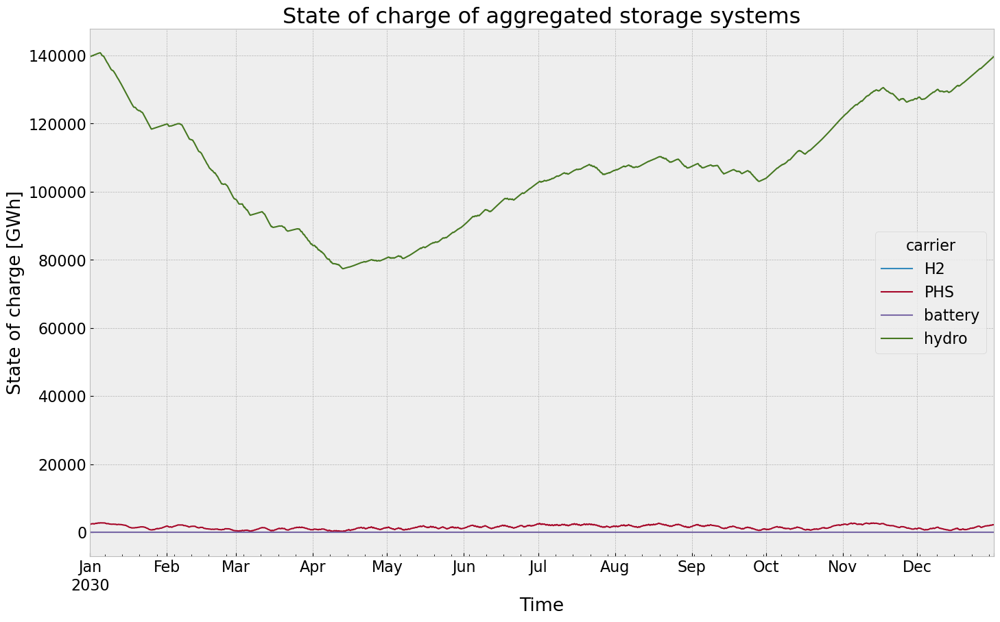

In [51]:
state_of_charge_plot(n1)


## Electricity Price


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


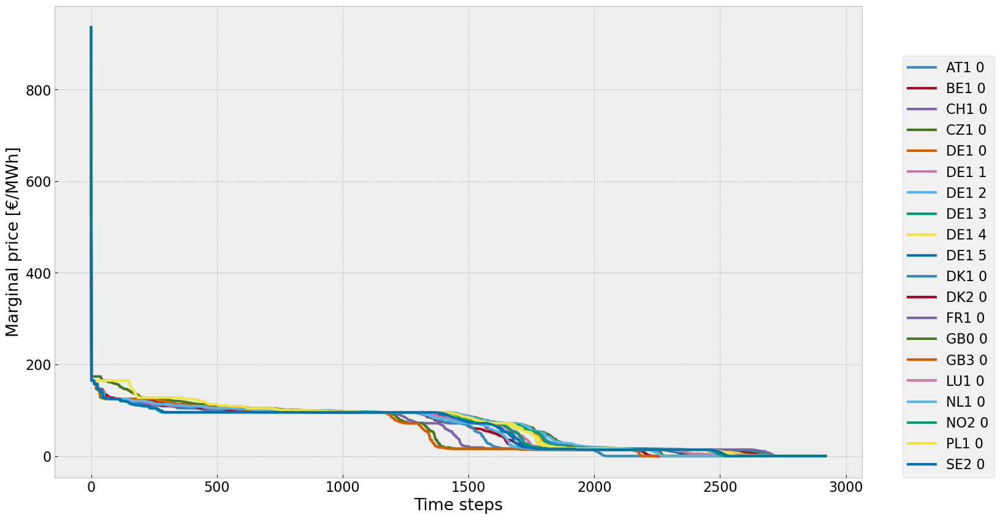

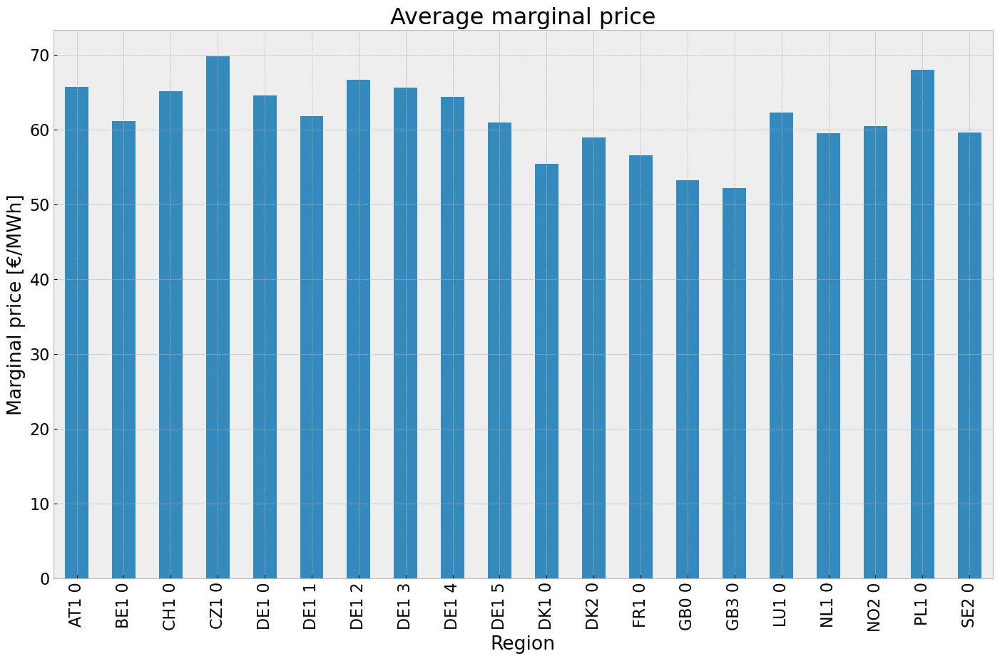

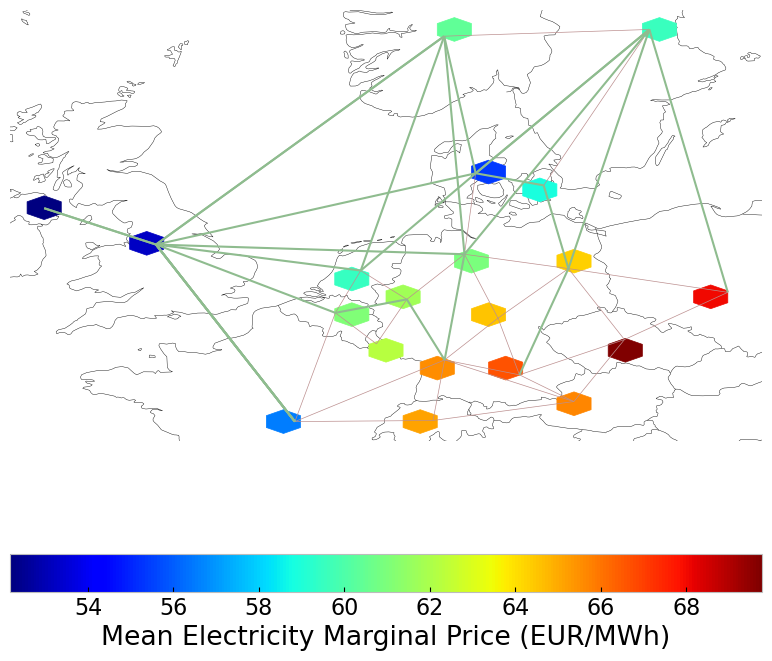

In [52]:
price_dur_curve_plot(n1)
price_regions_table(n1)
price_regions(n1)


## Emission

In [53]:
em_inv =em_table(n1)
em_inv

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,2.409344e+07,0.451621,0.1980,1.056307e+07
biomass,2.912999e+07,0.468000,0.0000,0.000000e+00
coal,5.066617e+05,0.329908,0.3361,5.161712e+05
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,5.527583e+05,0.337285,0.4069,6.668471e+05
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,1.395479e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.923426e+07,1.000000,0.0000,0.000000e+00


## 2. Scenario: perfect foresight with no additional investment

In [54]:
#copy network
n2=n.copy()

#ror cut
for column in n2.generators_t.p_max_pu.columns:
        if column.endswith('ror'):
                for index,row in n2.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n2.generators_t.p_max_pu.at[index, column] * reduction 
                                n2.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                

#storage hydro cut
n2.storage_units_t.inflow.loc[cut_start:cut_end] *= reduction


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom'] = n.generators.at[index, 'p_nom_opt']
        #n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index,'p_nom_extendable'] = False

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom'] = n.storage_units.at[index, 'p_nom_opt']
        #n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index,'p_nom_extendable'] = False

#set the optimal capacity of stores from the base scenario as the new minimum capacity 
for index, value in n2.stores.e_nom_extendable.items():
    if value:  
        n2.stores.at[index, 'e_nom'] = n.stores.at[index, 'e_nom_opt']
        #n2.stores.at[index, 'e_nom_max'] = n.stores.at[index, 'e_nom_opt']
        n2.stores.at[index, 'e_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom'] = n.lines.at[index, 's_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_extendable'] =False

#set the optimal capacity of links from the base scenario as the new minimum capacity 
for index, value in n2.links.p_nom_extendable.items():
    if value:  
        n2.links.at[index, 's_nom'] = n.links.at[index, 'p_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.links.at[index, 'p_nom_extendable'] =False

In [55]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)

Constraints:
------------
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Line-fix-s-lower (snapshot, Line-fix)
 * Line-fix-s-upper (snapshot, Line-fix)
 * Link-fix-p-lower (snapshot, Link-fix)
 * Link-fix-p-upper (snapshot, Link-fix)
 * StorageUnit-fix-p_dispatch-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_dispatch-upper (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-upper (snapshot, StorageUnit-fix)
 * StorageUnit-fix-state_of_charge-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-state_of_charge-upper (snapshot, StorageUn

In [56]:
n2.optimize(solver_name ='gurobi')
#optimize.optimize_with_rolling_horizon(n2, horizon=24, overlap=0, solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]
INFO:linopy.io: Writing time: 33.9s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ezhq2nsh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ezhq2nsh.lp


Reading time = 10.72 seconds


INFO:gurobipy:Reading time = 10.72 seconds


obj: 3264560 rows, 1521320 columns, 5349440 nonzeros


INFO:gurobipy:obj: 3264560 rows, 1521320 columns, 5349440 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264560 rows, 1521320 columns and 5349440 nonzeros


INFO:gurobipy:Optimize a model with 3264560 rows, 1521320 columns and 5349440 nonzeros


Model fingerprint: 0xe76e1840


INFO:gurobipy:Model fingerprint: 0xe76e1840


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [7e-01, 2e+04]


INFO:gurobipy:  Bounds range     [7e-01, 2e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 3102057 rows and 854467 columns


INFO:gurobipy:Presolve removed 3102057 rows and 854467 columns


Presolve time: 3.40s


INFO:gurobipy:Presolve time: 3.40s


Presolved: 162503 rows, 666853 columns, 1107733 nonzeros


INFO:gurobipy:Presolved: 162503 rows, 666853 columns, 1107733 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.27s


INFO:gurobipy:Ordering time: 0.27s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 4.647e+05


INFO:gurobipy: AA' NZ     : 4.647e+05


 Factor NZ  : 5.651e+06 (roughly 400 MB of memory)


INFO:gurobipy: Factor NZ  : 5.651e+06 (roughly 400 MB of memory)


 Factor Ops : 4.119e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 4.119e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.52521065e+13 -1.93236385e+15  6.99e+05 1.03e+03  2.39e+09     5s


INFO:gurobipy:   0   3.52521065e+13 -1.93236385e+15  6.99e+05 1.03e+03  2.39e+09     5s


   1   1.03504946e+13 -6.06454653e+13  7.52e+04 1.27e-11  1.39e+08     5s


INFO:gurobipy:   1   1.03504946e+13 -6.06454653e+13  7.52e+04 1.27e-11  1.39e+08     5s


   2   1.90139494e+12 -1.46317181e+13  3.91e+03 1.27e-11  1.57e+07     5s


INFO:gurobipy:   2   1.90139494e+12 -1.46317181e+13  3.91e+03 1.27e-11  1.57e+07     5s


   3   6.49760726e+11 -3.55683139e+12  5.00e+02 1.04e-10  3.38e+06     6s


INFO:gurobipy:   3   6.49760726e+11 -3.55683139e+12  5.00e+02 1.04e-10  3.38e+06     6s


   4   2.97289252e+11 -1.88004957e+12  1.87e+02 5.64e-11  1.69e+06     6s


INFO:gurobipy:   4   2.97289252e+11 -1.88004957e+12  1.87e+02 5.64e-11  1.69e+06     6s


   5   2.07242475e+11 -9.62481359e+11  1.08e+02 3.09e-11  9.01e+05     6s


INFO:gurobipy:   5   2.07242475e+11 -9.62481359e+11  1.08e+02 3.09e-11  9.01e+05     6s


   6   1.55469003e+11 -4.62153822e+11  6.48e+01 2.36e-11  4.73e+05     7s


INFO:gurobipy:   6   1.55469003e+11 -4.62153822e+11  6.48e+01 2.36e-11  4.73e+05     7s


   7   1.17900381e+11 -2.07032120e+11  3.55e+01 1.46e-11  2.47e+05     7s


INFO:gurobipy:   7   1.17900381e+11 -2.07032120e+11  3.55e+01 1.46e-11  2.47e+05     7s


   8   8.86333340e+10 -8.09322864e+10  1.65e+01 1.27e-11  1.28e+05     7s


INFO:gurobipy:   8   8.86333340e+10 -8.09322864e+10  1.65e+01 1.27e-11  1.28e+05     7s


   9   8.23478626e+10 -5.12880018e+10  1.34e+01 1.09e-11  1.01e+05     8s


INFO:gurobipy:   9   8.23478626e+10 -5.12880018e+10  1.34e+01 1.09e-11  1.01e+05     8s


  10   7.76949767e+10 -9.08994081e+08  1.12e+01 7.28e-12  5.95e+04     8s


INFO:gurobipy:  10   7.76949767e+10 -9.08994081e+08  1.12e+01 7.28e-12  5.95e+04     8s


  11   7.29319267e+10  1.91866101e+10  9.17e+00 9.09e-12  4.07e+04     8s


INFO:gurobipy:  11   7.29319267e+10  1.91866101e+10  9.17e+00 9.09e-12  4.07e+04     8s


  12   5.72973155e+10  3.11525522e+10  3.14e+00 7.28e-12  1.97e+04     9s


INFO:gurobipy:  12   5.72973155e+10  3.11525522e+10  3.14e+00 7.28e-12  1.97e+04     9s


  13   5.18765892e+10  3.80106211e+10  1.33e+00 3.64e-12  1.04e+04     9s


INFO:gurobipy:  13   5.18765892e+10  3.80106211e+10  1.33e+00 3.64e-12  1.04e+04     9s


  14   4.99207016e+10  4.17509401e+10  7.25e-01 3.64e-12  6.15e+03     9s


INFO:gurobipy:  14   4.99207016e+10  4.17509401e+10  7.25e-01 3.64e-12  6.15e+03     9s


  15   4.92385636e+10  4.33128703e+10  5.24e-01 3.64e-12  4.46e+03    10s


INFO:gurobipy:  15   4.92385636e+10  4.33128703e+10  5.24e-01 3.64e-12  4.46e+03    10s


  16   4.88181170e+10  4.47692731e+10  4.03e-01 3.64e-12  3.05e+03    10s


INFO:gurobipy:  16   4.88181170e+10  4.47692731e+10  4.03e-01 3.64e-12  3.05e+03    10s


  17   4.84397386e+10  4.54386056e+10  2.99e-01 3.64e-12  2.26e+03    10s


INFO:gurobipy:  17   4.84397386e+10  4.54386056e+10  2.99e-01 3.64e-12  2.26e+03    10s


  18   4.81963250e+10  4.59979954e+10  2.34e-01 3.64e-12  1.65e+03    11s


INFO:gurobipy:  18   4.81963250e+10  4.59979954e+10  2.34e-01 3.64e-12  1.65e+03    11s


  19   4.77950969e+10  4.63478337e+10  1.27e-01 3.64e-12  1.09e+03    11s


INFO:gurobipy:  19   4.77950969e+10  4.63478337e+10  1.27e-01 3.64e-12  1.09e+03    11s


  20   4.76833190e+10  4.66976209e+10  9.79e-02 3.64e-12  7.41e+02    12s


INFO:gurobipy:  20   4.76833190e+10  4.66976209e+10  9.79e-02 3.64e-12  7.41e+02    12s


  21   4.75857004e+10  4.68021919e+10  7.32e-02 3.64e-12  5.89e+02    12s


INFO:gurobipy:  21   4.75857004e+10  4.68021919e+10  7.32e-02 3.64e-12  5.89e+02    12s


  22   4.75130338e+10  4.69205399e+10  5.50e-02 3.64e-12  4.46e+02    12s


INFO:gurobipy:  22   4.75130338e+10  4.69205399e+10  5.50e-02 3.64e-12  4.46e+02    12s


  23   4.74595516e+10  4.70361520e+10  4.10e-02 3.64e-12  3.18e+02    13s


INFO:gurobipy:  23   4.74595516e+10  4.70361520e+10  4.10e-02 3.64e-12  3.18e+02    13s


  24   4.73925479e+10  4.71287465e+10  2.43e-02 3.64e-12  1.98e+02    13s


INFO:gurobipy:  24   4.73925479e+10  4.71287465e+10  2.43e-02 3.64e-12  1.98e+02    13s


  25   4.73582956e+10  4.71881893e+10  1.55e-02 3.64e-12  1.28e+02    14s


INFO:gurobipy:  25   4.73582956e+10  4.71881893e+10  1.55e-02 3.64e-12  1.28e+02    14s


  26   4.73448971e+10  4.72304570e+10  1.22e-02 3.64e-12  8.61e+01    14s


INFO:gurobipy:  26   4.73448971e+10  4.72304570e+10  1.22e-02 3.64e-12  8.61e+01    14s


  27   4.73275199e+10  4.72508204e+10  8.20e-03 3.64e-12  5.77e+01    15s


INFO:gurobipy:  27   4.73275199e+10  4.72508204e+10  8.20e-03 3.64e-12  5.77e+01    15s


  28   4.73220081e+10  4.72565325e+10  6.82e-03 9.15e-11  4.93e+01    15s


INFO:gurobipy:  28   4.73220081e+10  4.72565325e+10  6.82e-03 9.15e-11  4.93e+01    15s


  29   4.73172551e+10  4.72623994e+10  5.64e-03 2.04e-10  4.13e+01    15s


INFO:gurobipy:  29   4.73172551e+10  4.72623994e+10  5.64e-03 2.04e-10  4.13e+01    15s


  30   4.73082681e+10  4.72693863e+10  3.40e-03 5.86e-10  2.92e+01    16s


INFO:gurobipy:  30   4.73082681e+10  4.72693863e+10  3.40e-03 5.86e-10  2.92e+01    16s


  31   4.73074622e+10  4.72713398e+10  3.20e-03 5.40e-10  2.72e+01    16s


INFO:gurobipy:  31   4.73074622e+10  4.72713398e+10  3.20e-03 5.40e-10  2.72e+01    16s


  32   4.73016619e+10  4.72804090e+10  1.73e-03 4.01e-10  1.60e+01    17s


INFO:gurobipy:  32   4.73016619e+10  4.72804090e+10  1.73e-03 4.01e-10  1.60e+01    17s


  33   4.72993988e+10  4.72869057e+10  1.17e-03 1.21e-08  9.39e+00    17s


INFO:gurobipy:  33   4.72993988e+10  4.72869057e+10  1.17e-03 1.21e-08  9.39e+00    17s


  34   4.72976119e+10  4.72901141e+10  7.35e-04 6.87e-09  5.64e+00    18s


INFO:gurobipy:  34   4.72976119e+10  4.72901141e+10  7.35e-04 6.87e-09  5.64e+00    18s


  35   4.72968035e+10  4.72917534e+10  5.48e-04 4.59e-09  3.80e+00    18s


INFO:gurobipy:  35   4.72968035e+10  4.72917534e+10  5.48e-04 4.59e-09  3.80e+00    18s


  36   4.72958485e+10  4.72928272e+10  3.27e-04 3.87e-09  2.27e+00    18s


INFO:gurobipy:  36   4.72958485e+10  4.72928272e+10  3.27e-04 3.87e-09  2.27e+00    18s


  37   4.72954997e+10  4.72932097e+10  2.47e-04 8.96e-09  1.72e+00    19s


INFO:gurobipy:  37   4.72954997e+10  4.72932097e+10  2.47e-04 8.96e-09  1.72e+00    19s


  38   4.72952151e+10  4.72933372e+10  1.82e-04 1.90e-08  1.41e+00    19s


INFO:gurobipy:  38   4.72952151e+10  4.72933372e+10  1.82e-04 1.90e-08  1.41e+00    19s


  39   4.72951048e+10  4.72935228e+10  1.56e-04 2.64e-08  1.19e+00    19s


INFO:gurobipy:  39   4.72951048e+10  4.72935228e+10  1.56e-04 2.64e-08  1.19e+00    19s


  40   4.72947238e+10  4.72938940e+10  6.93e-05 4.95e-09  6.24e-01    20s


INFO:gurobipy:  40   4.72947238e+10  4.72938940e+10  6.93e-05 4.95e-09  6.24e-01    20s


  41   4.72945361e+10  4.72941684e+10  2.56e-05 3.69e-09  2.76e-01    20s


INFO:gurobipy:  41   4.72945361e+10  4.72941684e+10  2.56e-05 3.69e-09  2.76e-01    20s


  42   4.72944812e+10  4.72943017e+10  2.55e-04 2.11e-09  1.35e-01    21s


INFO:gurobipy:  42   4.72944812e+10  4.72943017e+10  2.55e-04 2.11e-09  1.35e-01    21s


  43   4.72944542e+10  4.72943512e+10  1.55e-04 1.36e-09  7.74e-02    21s


INFO:gurobipy:  43   4.72944542e+10  4.72943512e+10  1.55e-04 1.36e-09  7.74e-02    21s


  44   4.72944425e+10  4.72943854e+10  1.04e-04 7.53e-10  4.29e-02    21s


INFO:gurobipy:  44   4.72944425e+10  4.72943854e+10  1.04e-04 7.53e-10  4.29e-02    21s


  45   4.72944297e+10  4.72943979e+10  4.74e-05 5.08e-10  2.39e-02    22s


INFO:gurobipy:  45   4.72944297e+10  4.72943979e+10  4.74e-05 5.08e-10  2.39e-02    22s


  46   4.72944262e+10  4.72944074e+10  3.34e-05 2.86e-10  1.41e-02    22s


INFO:gurobipy:  46   4.72944262e+10  4.72944074e+10  3.34e-05 2.86e-10  1.41e-02    22s


  47   4.72944218e+10  4.72944112e+10  1.50e-05 3.18e-10  7.98e-03    23s


INFO:gurobipy:  47   4.72944218e+10  4.72944112e+10  1.50e-05 3.18e-10  7.98e-03    23s


  48   4.72944204e+10  4.72944151e+10  9.21e-06 2.37e-10  3.99e-03    23s


INFO:gurobipy:  48   4.72944204e+10  4.72944151e+10  9.21e-06 2.37e-10  3.99e-03    23s


  49   4.72944189e+10  4.72944160e+10  3.40e-06 2.02e-10  2.15e-03    23s


INFO:gurobipy:  49   4.72944189e+10  4.72944160e+10  3.40e-06 2.02e-10  2.15e-03    23s


  50   4.72944183e+10  4.72944172e+10  1.02e-06 7.25e-11  8.04e-04    24s


INFO:gurobipy:  50   4.72944183e+10  4.72944172e+10  1.02e-06 7.25e-11  8.04e-04    24s


  51   4.72944181e+10  4.72944175e+10  4.07e-07 3.52e-11  3.96e-04    24s


INFO:gurobipy:  51   4.72944181e+10  4.72944175e+10  4.07e-07 3.52e-11  3.96e-04    24s


  52   4.72944180e+10  4.72944179e+10  5.31e-08 1.55e-11  5.86e-05    25s


INFO:gurobipy:  52   4.72944180e+10  4.72944179e+10  5.31e-08 1.55e-11  5.86e-05    25s


  53   4.72944179e+10  4.72944179e+10  3.31e-08 6.75e-12  1.74e-05    25s


INFO:gurobipy:  53   4.72944179e+10  4.72944179e+10  3.31e-08 6.75e-12  1.74e-05    25s


  54   4.72944179e+10  4.72944179e+10  2.68e-08 6.02e-12  1.49e-06    26s


INFO:gurobipy:  54   4.72944179e+10  4.72944179e+10  2.68e-08 6.02e-12  1.49e-06    26s


  55   4.72944179e+10  4.72944179e+10  2.43e-08 3.66e-12  1.45e-08    26s


INFO:gurobipy:  55   4.72944179e+10  4.72944179e+10  2.43e-08 3.66e-12  1.45e-08    26s


  56   4.72944179e+10  4.72944179e+10  1.89e-08 3.64e-12  1.92e-10    27s


INFO:gurobipy:  56   4.72944179e+10  4.72944179e+10  1.89e-08 3.64e-12  1.92e-10    27s


INFO:gurobipy:


Barrier solved model in 56 iterations and 26.56 seconds (12.94 work units)


INFO:gurobipy:Barrier solved model in 56 iterations and 26.56 seconds (12.94 work units)


Optimal objective 4.72944179e+10


INFO:gurobipy:Optimal objective 4.72944179e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   12591 DPushes remaining with DInf 0.0000000e+00                27s


INFO:gurobipy:   12591 DPushes remaining with DInf 0.0000000e+00                27s


       0 DPushes remaining with DInf 0.0000000e+00                28s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                28s


INFO:gurobipy:


   17958 PPushes remaining with PInf 1.8434036e-05                28s


INFO:gurobipy:   17958 PPushes remaining with PInf 1.8434036e-05                28s


       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.9446811e-09     30s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.9446811e-09     30s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   30552    4.7294418e+10   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:   30552    4.7294418e+10   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:


Solved in 30552 iterations and 32.24 seconds (15.02 work units)


INFO:gurobipy:Solved in 30552 iterations and 32.24 seconds (15.02 work units)


Optimal objective  4.729441793e+10


INFO:gurobipy:Optimal objective  4.729441793e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521320 primals, 3264560 duals
Objective: 4.73e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.


('ok', 'optimal')

In [57]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

<Figure size 640x480 with 0 Axes>

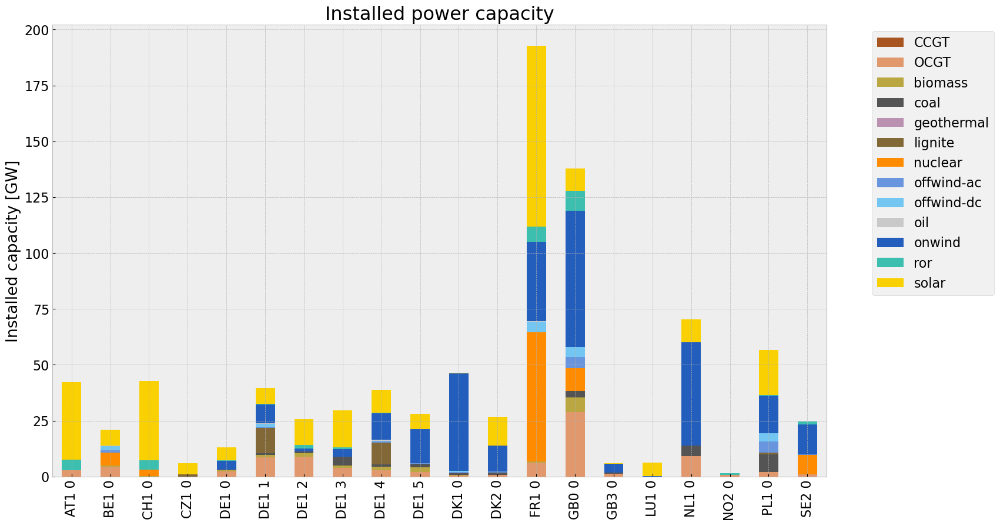

<Figure size 640x480 with 0 Axes>

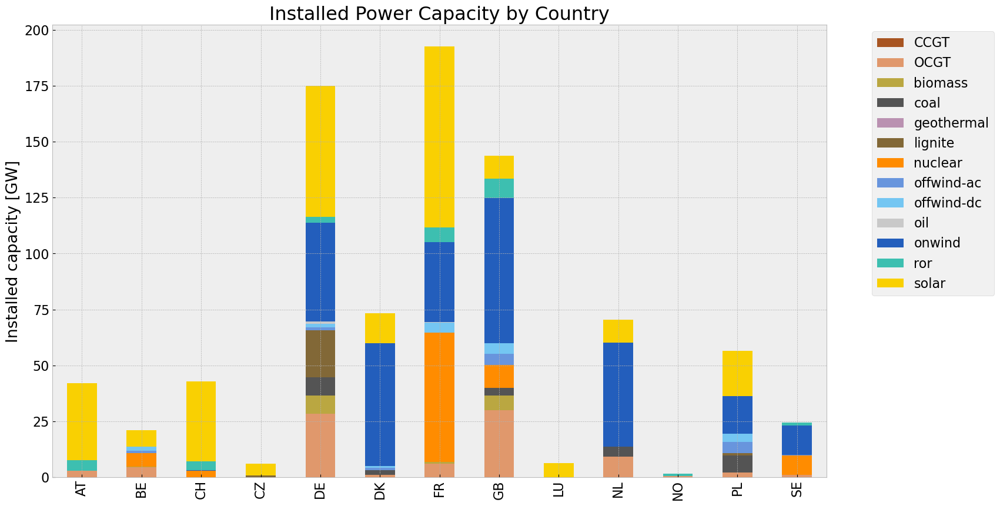

In [58]:
# consolidated istalled cap without load_shedding

#capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_noinv.fillna(0, inplace=True)
#gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


capacities_noinv = inst_cap_table(n2, color_cap)
cap_noinv_country= inst_cap_table_country(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

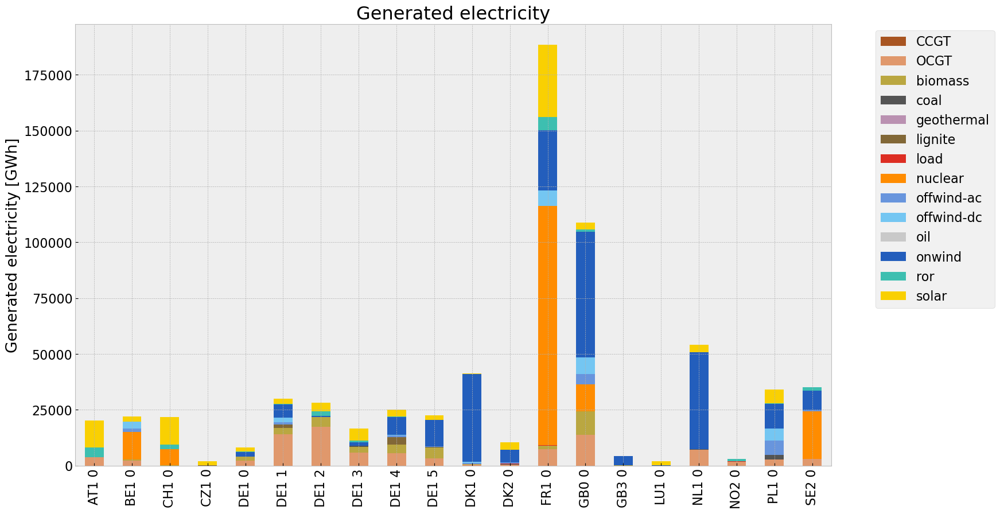

<Figure size 640x480 with 0 Axes>

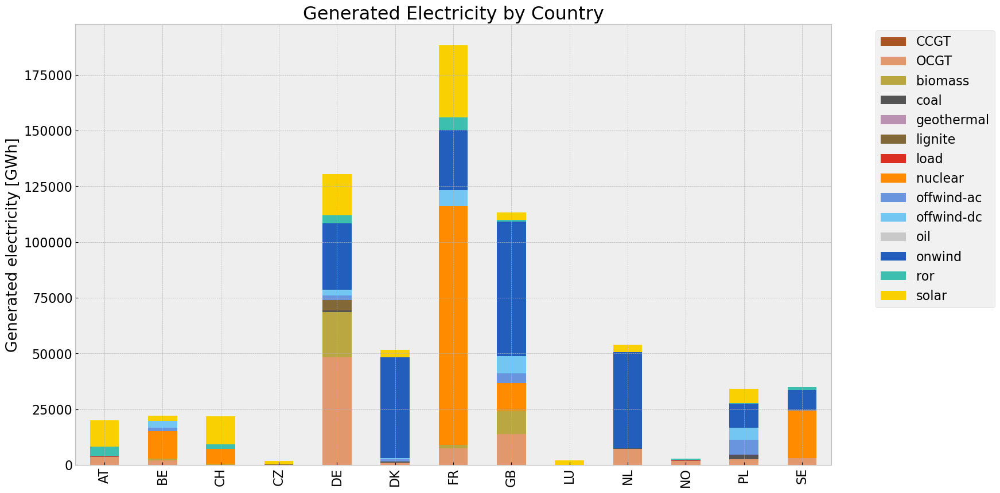

In [59]:
# consolidated generation table
#carrier = n2.generators.carrier.unique()
#df_tot_generation = n2.generators_t.p.sum()

#generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
        #key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
                #generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            #except KeyError:
                #print('error')

#generations.fillna(0, inplace=True)
#gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)
gen_noinv_country = gen_power_table_country(n2,colors_gen_table)


## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2796143640.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2796143640.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum(

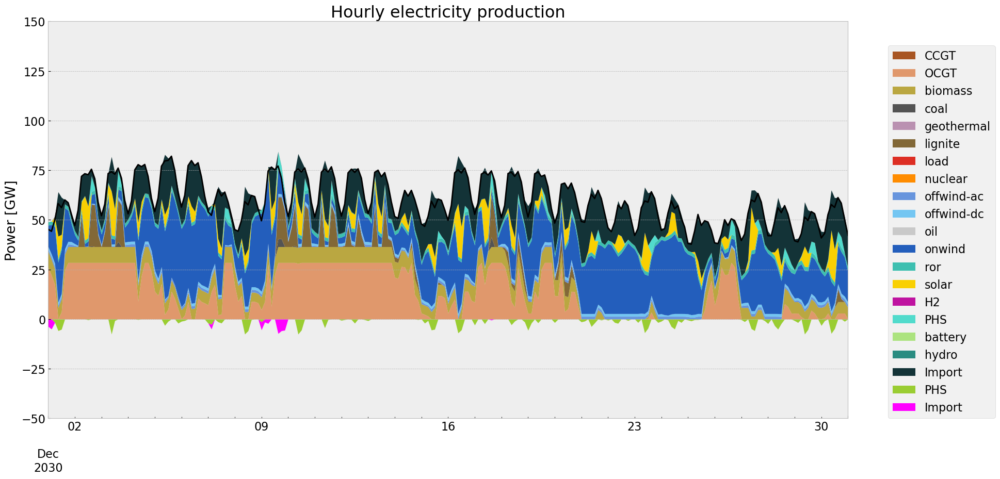

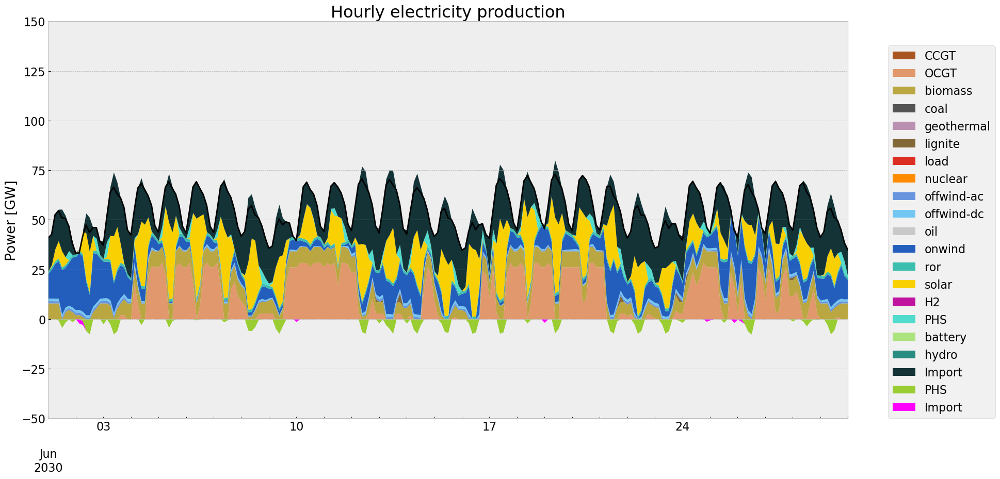

In [60]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2030-12-01', '2030-12-31', colors_gen,'DE')
gen_curve(n2, '2030-06-01', '2030-06-30', colors_gen,'DE')


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1259656158.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

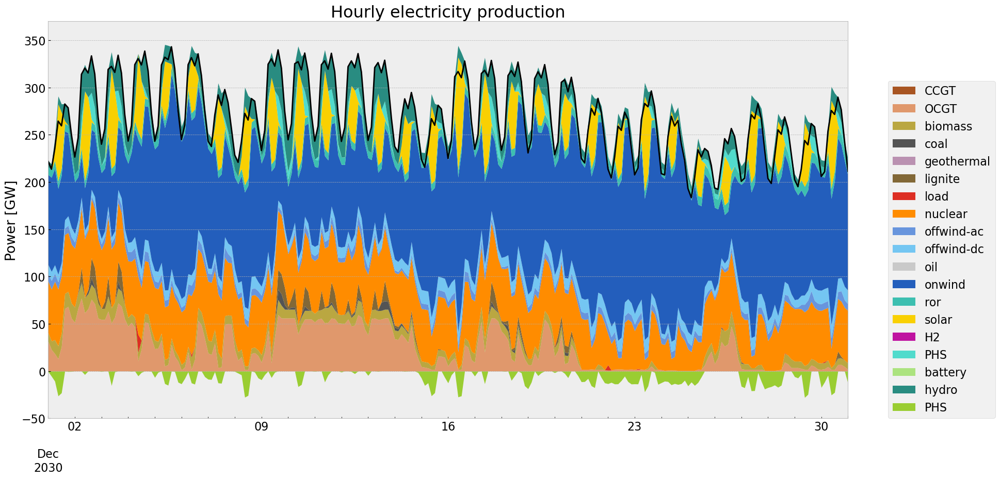

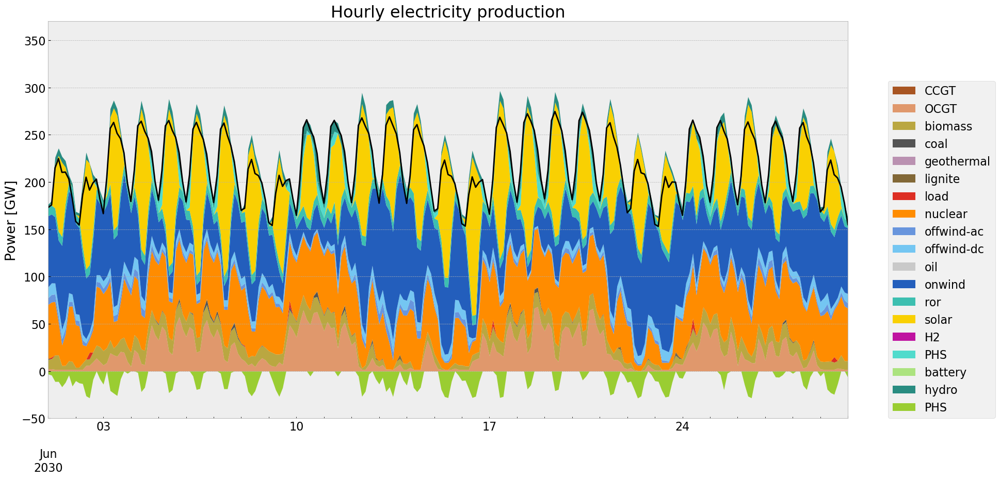

In [61]:
#generation curve all countries
#winter
gen_curve_tot(n2, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n2, '2030-06-01', '2030-06-30', colors_gen)

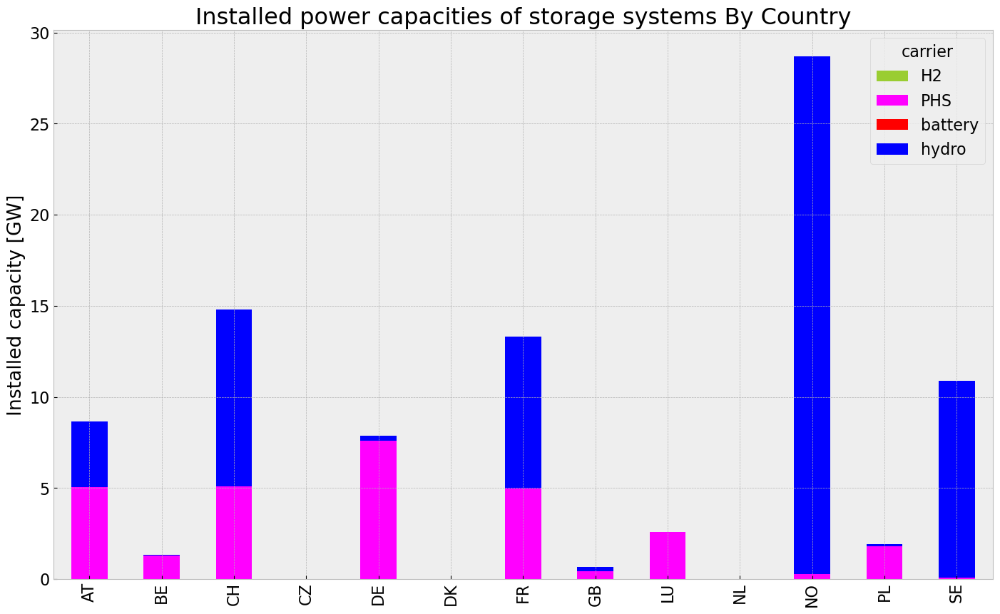

In [62]:
#storage unit capacities
store_noinv = inst_store_table(n2)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1117423567.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1117423567.py:3: FutureWarning: 'H' is deprecated and will be removed in a future v

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,9.124060e+07,0.451621,0.1980,4.000178e+07
biomass,3.350620e+07,0.468000,0.0000,0.000000e+00
coal,3.437051e+06,0.329908,0.3361,3.501560e+06
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,5.043679e+06,0.337285,0.4069,6.084689e+06
load,4.770645e+05,1.000000,0.0000,0.000000e+00
nuclear,1.599121e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.590220e+07,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


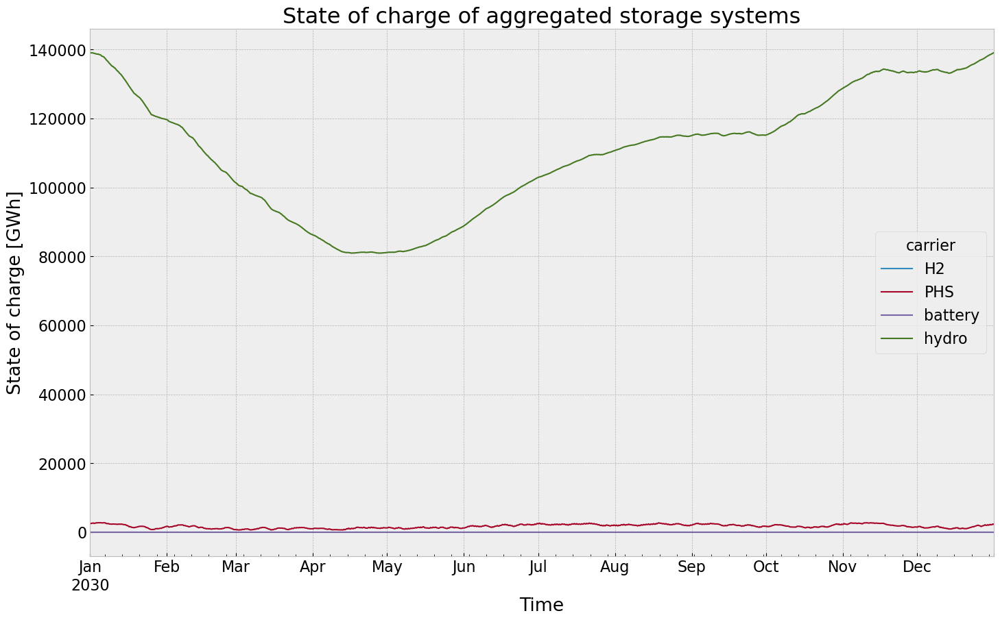

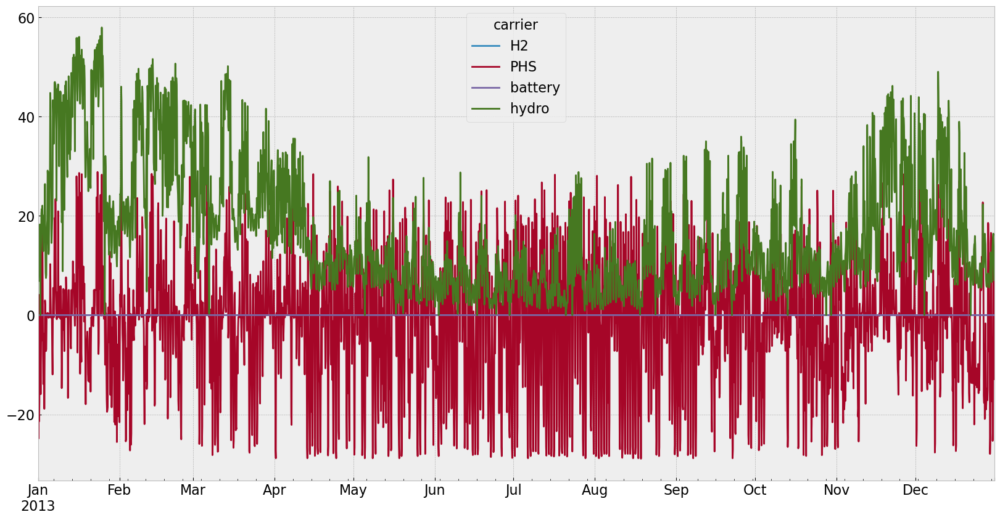

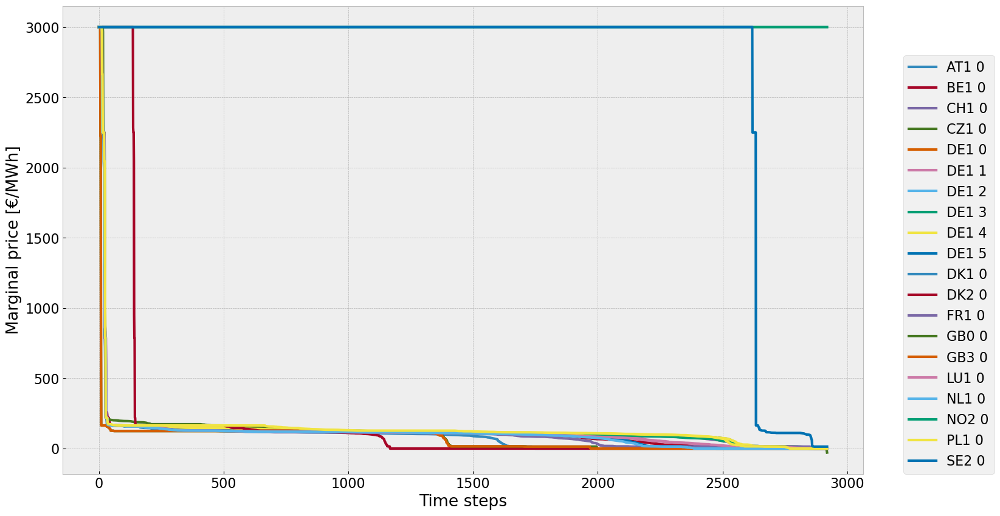

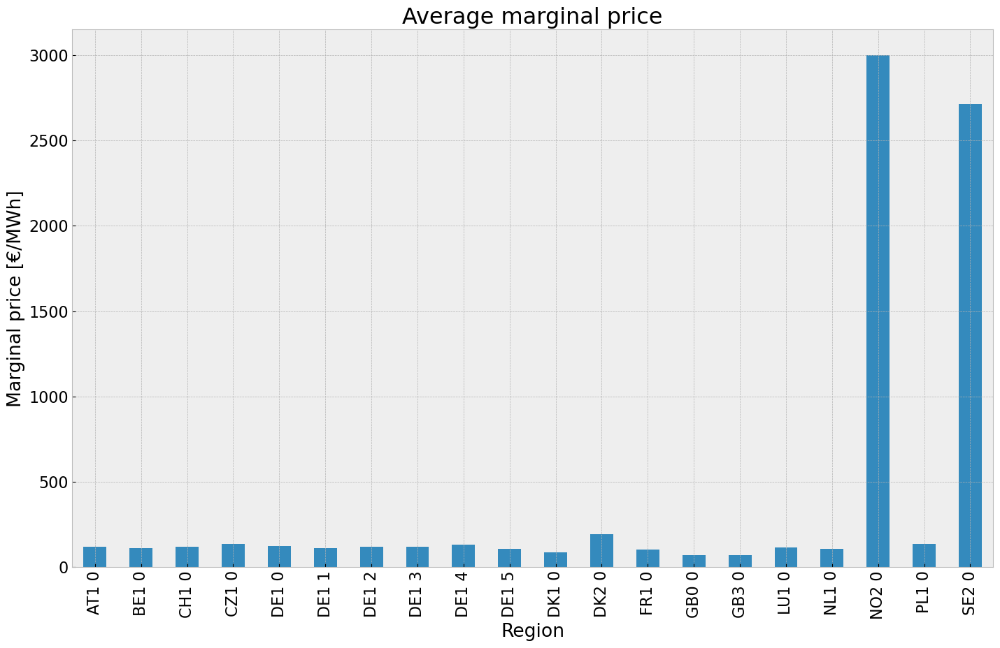

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


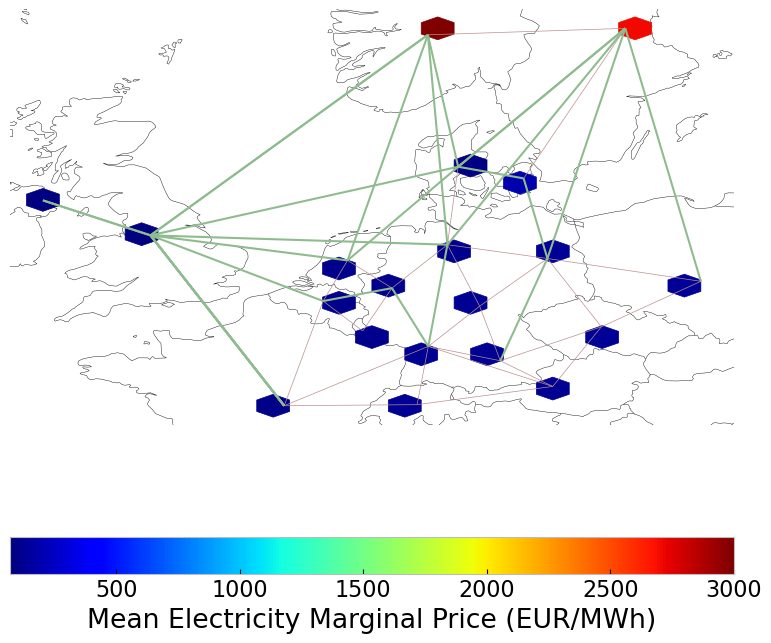

In [63]:
#state of charge
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
#price
price_dur_curve_plot(n2)
price_regions_table(n2)
price_regions(n2)
#emission
em_noinv =em_table(n2)
em_noinv

## 3. Scenario: rolling horizon foresight with no additional investment

In [64]:
n3= n2.copy()
horizon = 24
#n3.global_constraints.loc['CO2Limit','constant']= n.global_constraints.loc['CO2Limit','constant']/(len(n3.snapshots)/horizon)
n3.optimize.create_model()
optimize.optimize_with_rolling_horizon(n3, horizon=horizon, overlap=0, solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.64it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bk8wlabx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bk8wlabx.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x302461a2


INFO:gurobipy:Model fingerprint: 0x302461a2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 5e+03]


INFO:gurobipy:  Bounds range     [6e+00, 5e+03]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 25506 rows and 7223 columns


INFO:gurobipy:Presolve removed 25506 rows and 7223 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1326 rows, 5281 columns, 8875 nonzeros


INFO:gurobipy:Presolved: 1326 rows, 5281 columns, 8875 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.795e+03


INFO:gurobipy: AA' NZ     : 3.795e+03


 Factor NZ  : 3.810e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.810e+04 (roughly 3 MB of memory)


 Factor Ops : 2.035e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.035e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.54361329e+11 -1.57406959e+13  1.56e+05 1.19e+04  2.32e+09     0s


INFO:gurobipy:   0   3.54361329e+11 -1.57406959e+13  1.56e+05 1.19e+04  2.32e+09     0s


   1   8.75033374e+10 -4.29237641e+11  1.70e+04 7.28e-11  1.23e+08     0s


INFO:gurobipy:   1   8.75033374e+10 -4.29237641e+11  1.70e+04 7.28e-11  1.23e+08     0s


   2   1.21801176e+10 -8.87398155e+10  9.11e+02 5.82e-11  1.25e+07     0s


INFO:gurobipy:   2   1.21801176e+10 -8.87398155e+10  9.11e+02 5.82e-11  1.25e+07     0s


   3   3.45423197e+09 -1.22558781e+10  7.91e+01 4.66e-10  1.61e+06     0s


INFO:gurobipy:   3   3.45423197e+09 -1.22558781e+10  7.91e+01 4.66e-10  1.61e+06     0s


   4   2.27495913e+09 -6.15872990e+08  7.00e+00 2.18e-10  2.79e+05     0s


INFO:gurobipy:   4   2.27495913e+09 -6.15872990e+08  7.00e+00 2.18e-10  2.79e+05     0s


   5   2.04168123e+09  7.94699691e+08  2.63e+00 1.31e-10  1.19e+05     0s


INFO:gurobipy:   5   2.04168123e+09  7.94699691e+08  2.63e+00 1.31e-10  1.19e+05     0s


   6   1.92077632e+09  1.38435267e+09  1.21e+00 5.82e-11  5.11e+04     0s


INFO:gurobipy:   6   1.92077632e+09  1.38435267e+09  1.21e+00 5.82e-11  5.11e+04     0s


   7   1.81712484e+09  1.60409396e+09  2.08e-01 3.38e-11  2.02e+04     0s


INFO:gurobipy:   7   1.81712484e+09  1.60409396e+09  2.08e-01 3.38e-11  2.02e+04     0s


   8   1.79175629e+09  1.71518217e+09  8.33e-02 2.91e-11  7.27e+03     0s


INFO:gurobipy:   8   1.79175629e+09  1.71518217e+09  8.33e-02 2.91e-11  7.27e+03     0s


   9   1.77748947e+09  1.75289990e+09  2.83e-02 3.04e-11  2.33e+03     0s


INFO:gurobipy:   9   1.77748947e+09  1.75289990e+09  2.83e-02 3.04e-11  2.33e+03     0s


  10   1.77379194e+09  1.76199230e+09  1.75e-02 2.91e-11  1.12e+03     0s


INFO:gurobipy:  10   1.77379194e+09  1.76199230e+09  1.75e-02 2.91e-11  1.12e+03     0s


  11   1.77103371e+09  1.76441304e+09  9.28e-03 2.91e-11  6.28e+02     0s


INFO:gurobipy:  11   1.77103371e+09  1.76441304e+09  9.28e-03 2.91e-11  6.28e+02     0s


  12   1.76992649e+09  1.76624549e+09  6.05e-03 2.91e-11  3.50e+02     0s


INFO:gurobipy:  12   1.76992649e+09  1.76624549e+09  6.05e-03 2.91e-11  3.50e+02     0s


  13   1.76897670e+09  1.76677898e+09  3.48e-03 2.91e-11  2.09e+02     0s


INFO:gurobipy:  13   1.76897670e+09  1.76677898e+09  3.48e-03 2.91e-11  2.09e+02     0s


  14   1.76843326e+09  1.76709994e+09  2.13e-03 2.91e-11  1.27e+02     0s


INFO:gurobipy:  14   1.76843326e+09  1.76709994e+09  2.13e-03 2.91e-11  1.27e+02     0s


  15   1.76807146e+09  1.76739618e+09  1.03e-03 4.31e-11  6.41e+01     0s


INFO:gurobipy:  15   1.76807146e+09  1.76739618e+09  1.03e-03 4.31e-11  6.41e+01     0s


  16   1.76789426e+09  1.76760681e+09  4.88e-04 2.91e-11  2.73e+01     0s


INFO:gurobipy:  16   1.76789426e+09  1.76760681e+09  4.88e-04 2.91e-11  2.73e+01     0s


  17   1.76781877e+09  1.76768160e+09  2.61e-04 2.91e-11  1.30e+01     0s


INFO:gurobipy:  17   1.76781877e+09  1.76768160e+09  2.61e-04 2.91e-11  1.30e+01     0s


  18   1.76778359e+09  1.76771236e+09  1.59e-04 2.91e-11  6.77e+00     0s


INFO:gurobipy:  18   1.76778359e+09  1.76771236e+09  1.59e-04 2.91e-11  6.77e+00     0s


  19   1.76774227e+09  1.76771950e+09  3.69e-05 2.91e-11  2.16e+00     0s


INFO:gurobipy:  19   1.76774227e+09  1.76771950e+09  3.69e-05 2.91e-11  2.16e+00     0s


  20   1.76773751e+09  1.76772601e+09  2.59e-05 3.57e-11  1.09e+00     0s


INFO:gurobipy:  20   1.76773751e+09  1.76772601e+09  2.59e-05 3.57e-11  1.09e+00     0s


  21   1.76773586e+09  1.76772695e+09  2.14e-05 2.91e-11  8.47e-01     0s


INFO:gurobipy:  21   1.76773586e+09  1.76772695e+09  2.14e-05 2.91e-11  8.47e-01     0s


  22   1.76772993e+09  1.76772743e+09  1.42e-05 3.04e-11  2.37e-01     0s


INFO:gurobipy:  22   1.76772993e+09  1.76772743e+09  1.42e-05 3.04e-11  2.37e-01     0s


  23   1.76772880e+09  1.76772787e+09  5.71e-06 2.91e-11  8.79e-02     0s


INFO:gurobipy:  23   1.76772880e+09  1.76772787e+09  5.71e-06 2.91e-11  8.79e-02     0s


  24   1.76772815e+09  1.76772800e+09  1.00e-06 2.91e-11  1.47e-02     0s


INFO:gurobipy:  24   1.76772815e+09  1.76772800e+09  1.00e-06 2.91e-11  1.47e-02     0s


  25   1.76772801e+09  1.76772801e+09  1.66e-08 4.37e-11  2.19e-04     0s


INFO:gurobipy:  25   1.76772801e+09  1.76772801e+09  1.66e-08 4.37e-11  2.19e-04     0s


  26   1.76772801e+09  1.76772801e+09  6.04e-10 3.22e-11  2.66e-06     0s


INFO:gurobipy:  26   1.76772801e+09  1.76772801e+09  6.04e-10 3.22e-11  2.66e-06     0s


  27   1.76772801e+09  1.76772801e+09  5.60e-10 3.28e-11  5.53e-09     0s


INFO:gurobipy:  27   1.76772801e+09  1.76772801e+09  5.60e-10 3.28e-11  5.53e-09     0s


INFO:gurobipy:


Barrier solved model in 27 iterations and 0.26 seconds (0.06 work units)


INFO:gurobipy:Barrier solved model in 27 iterations and 0.26 seconds (0.06 work units)


Optimal objective 1.76772801e+09


INFO:gurobipy:Optimal objective 1.76772801e+09


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1953    1.7677280e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1953    1.7677280e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1953 iterations and 0.29 seconds (0.07 work units)


INFO:gurobipy:Solved in 1953 iterations and 0.29 seconds (0.07 work units)


Optimal objective  1.767728008e+09


INFO:gurobipy:Optimal objective  1.767728008e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.77e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-04 00:00:00:2013-01-06 21:00:00] (2/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-08_42cuj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-08_42cuj.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xae4a5ccb


INFO:gurobipy:Model fingerprint: 0xae4a5ccb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 5e+03]


INFO:gurobipy:  Bounds range     [6e+00, 5e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25490 rows and 7007 columns


INFO:gurobipy:Presolve removed 25490 rows and 7007 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 1342 rows, 5497 columns, 9139 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5497 columns, 9139 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.835e+03


INFO:gurobipy: AA' NZ     : 3.835e+03


 Factor NZ  : 4.021e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.021e+04 (roughly 3 MB of memory)


 Factor Ops : 2.372e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.372e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.91525391e+11 -1.57513474e+13  1.51e+05 1.14e+04  2.24e+09     0s


INFO:gurobipy:   0   3.91525391e+11 -1.57513474e+13  1.51e+05 1.14e+04  2.24e+09     0s


   1   9.76045667e+10 -4.16230226e+11  1.61e+04 7.28e-11  1.17e+08     0s


INFO:gurobipy:   1   9.76045667e+10 -4.16230226e+11  1.61e+04 7.28e-11  1.17e+08     0s


   2   1.45327325e+10 -8.42765491e+10  8.40e+02 5.82e-11  1.17e+07     0s


INFO:gurobipy:   2   1.45327325e+10 -8.42765491e+10  8.40e+02 5.82e-11  1.17e+07     0s


   3   4.38787230e+09 -1.16101197e+10  6.24e+01 2.18e-10  1.56e+06     0s


INFO:gurobipy:   3   4.38787230e+09 -1.16101197e+10  6.24e+01 2.18e-10  1.56e+06     0s


   4   2.99043868e+09 -2.61043683e+08  8.24e+00 2.47e-10  3.02e+05     0s


INFO:gurobipy:   4   2.99043868e+09 -2.61043683e+08  8.24e+00 2.47e-10  3.02e+05     0s


   5   2.66800094e+09  1.32496590e+09  2.63e+00 1.16e-10  1.23e+05     0s


INFO:gurobipy:   5   2.66800094e+09  1.32496590e+09  2.63e+00 1.16e-10  1.23e+05     0s


   6   2.52228239e+09  2.01278299e+09  1.05e+00 5.82e-11  4.66e+04     0s


INFO:gurobipy:   6   2.52228239e+09  2.01278299e+09  1.05e+00 5.82e-11  4.66e+04     0s


   7   2.38771453e+09  2.25085122e+09  1.30e-01 8.73e-11  1.25e+04     0s


INFO:gurobipy:   7   2.38771453e+09  2.25085122e+09  1.30e-01 8.73e-11  1.25e+04     0s


   8   2.35233002e+09  2.31373350e+09  2.09e-02 3.35e-11  3.51e+03     0s


INFO:gurobipy:   8   2.35233002e+09  2.31373350e+09  2.09e-02 3.35e-11  3.51e+03     0s


   9   2.34447805e+09  2.33163157e+09  5.91e-03 2.93e-11  1.17e+03     0s


INFO:gurobipy:   9   2.34447805e+09  2.33163157e+09  5.91e-03 2.93e-11  1.17e+03     0s


  10   2.34186221e+09  2.33690097e+09  1.89e-03 2.91e-11  4.52e+02     0s


INFO:gurobipy:  10   2.34186221e+09  2.33690097e+09  1.89e-03 2.91e-11  4.52e+02     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.21 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.21 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1561    2.3404297e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1561    2.3404297e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1561 iterations and 0.24 seconds (0.05 work units)


INFO:gurobipy:Solved in 1561 iterations and 0.24 seconds (0.05 work units)


Optimal objective  2.340429695e+09


INFO:gurobipy:Optimal objective  2.340429695e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.34e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-07 00:00:00:2013-01-09 21:00:00] (3/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iwbtar51.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iwbtar51.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x759ff4c7


INFO:gurobipy:Model fingerprint: 0x759ff4c7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 5e+03]


INFO:gurobipy:  Bounds range     [6e+00, 5e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 7035 columns


INFO:gurobipy:Presolve removed 25488 rows and 7035 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1344 rows, 5469 columns, 9117 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5469 columns, 9117 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.45513552e+11 -1.56646974e+13  1.58e+05 1.40e+04  2.27e+09     0s


INFO:gurobipy:   0   4.45513552e+11 -1.56646974e+13  1.58e+05 1.40e+04  2.27e+09     0s


   1   1.11423222e+11 -4.15125315e+11  1.69e+04 7.28e-11  1.21e+08     0s


INFO:gurobipy:   1   1.11423222e+11 -4.15125315e+11  1.69e+04 7.28e-11  1.21e+08     0s


   2   2.07450920e+10 -8.10883550e+10  9.34e+02 5.82e-11  1.23e+07     0s


INFO:gurobipy:   2   2.07450920e+10 -8.10883550e+10  9.34e+02 5.82e-11  1.23e+07     0s


   3   9.57151106e+09 -9.77465113e+09  7.05e+01 1.12e-09  1.90e+06     0s


INFO:gurobipy:   3   9.57151106e+09 -9.77465113e+09  7.05e+01 1.12e-09  1.90e+06     0s


   4   5.49738292e+09  1.35913082e+09  1.75e+01 3.64e-10  3.97e+05     0s


INFO:gurobipy:   4   5.49738292e+09  1.35913082e+09  1.75e+01 3.64e-10  3.97e+05     0s


   5   4.49109755e+09  2.59303082e+09  6.39e+00 1.75e-10  1.79e+05     0s


INFO:gurobipy:   5   4.49109755e+09  2.59303082e+09  6.39e+00 1.75e-10  1.79e+05     0s


   6   4.09838050e+09  3.34519609e+09  2.22e+00 7.28e-11  7.05e+04     0s


INFO:gurobipy:   6   4.09838050e+09  3.34519609e+09  2.22e+00 7.28e-11  7.05e+04     0s


   7   3.90061945e+09  3.69005826e+09  2.80e-01 5.82e-11  1.94e+04     0s


INFO:gurobipy:   7   3.90061945e+09  3.69005826e+09  2.80e-01 5.82e-11  1.94e+04     0s


   8   3.87508886e+09  3.78258624e+09  9.91e-02 2.91e-11  8.51e+03     0s


INFO:gurobipy:   8   3.87508886e+09  3.78258624e+09  9.91e-02 2.91e-11  8.51e+03     0s


   9   3.86295299e+09  3.82437366e+09  2.90e-02 2.51e-11  3.54e+03     0s


INFO:gurobipy:   9   3.86295299e+09  3.82437366e+09  2.90e-02 2.51e-11  3.54e+03     0s


  10   3.86110281e+09  3.84226975e+09  2.01e-02 2.29e-11  1.73e+03     0s


INFO:gurobipy:  10   3.86110281e+09  3.84226975e+09  2.01e-02 2.29e-11  1.73e+03     0s


  11   3.85857919e+09  3.85157629e+09  9.05e-03 1.67e-11  6.45e+02     0s


INFO:gurobipy:  11   3.85857919e+09  3.85157629e+09  9.05e-03 1.67e-11  6.45e+02     0s


  12   3.85723942e+09  3.85408466e+09  3.42e-03 2.91e-11  2.90e+02     0s


INFO:gurobipy:  12   3.85723942e+09  3.85408466e+09  3.42e-03 2.91e-11  2.90e+02     0s


  13   3.85689181e+09  3.85569261e+09  2.03e-03 3.29e-11  1.11e+02     0s


INFO:gurobipy:  13   3.85689181e+09  3.85569261e+09  2.03e-03 3.29e-11  1.11e+02     0s


  14   3.85653038e+09  3.85624380e+09  7.02e-04 2.91e-11  2.65e+01     0s


INFO:gurobipy:  14   3.85653038e+09  3.85624380e+09  7.02e-04 2.91e-11  2.65e+01     0s


  15   3.85633085e+09  3.85632051e+09  3.81e-06 2.91e-11  9.46e-01     0s


INFO:gurobipy:  15   3.85633085e+09  3.85632051e+09  3.81e-06 2.91e-11  9.46e-01     0s


  16   3.85632786e+09  3.85632715e+09  9.99e-08 2.91e-11  6.49e-02     0s


INFO:gurobipy:  16   3.85632786e+09  3.85632715e+09  9.99e-08 2.91e-11  6.49e-02     0s


  17   3.85632781e+09  3.85632771e+09  3.02e-07 2.91e-11  9.34e-03     0s


INFO:gurobipy:  17   3.85632781e+09  3.85632771e+09  3.02e-07 2.91e-11  9.34e-03     0s


  18   3.85632779e+09  3.85632778e+09  3.84e-08 2.91e-11  9.76e-04     0s


INFO:gurobipy:  18   3.85632779e+09  3.85632778e+09  3.84e-08 2.91e-11  9.76e-04     0s


  19   3.85632779e+09  3.85632779e+09  1.07e-09 3.96e-11  3.03e-06     0s


INFO:gurobipy:  19   3.85632779e+09  3.85632779e+09  1.07e-09 3.96e-11  3.03e-06     0s


INFO:gurobipy:


Barrier performed 19 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 19 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1877    3.8563278e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1877    3.8563278e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1877 iterations and 0.26 seconds (0.07 work units)


INFO:gurobipy:Solved in 1877 iterations and 0.26 seconds (0.07 work units)


Optimal objective  3.856327786e+09


INFO:gurobipy:Optimal objective  3.856327786e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.86e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-10 00:00:00:2013-01-12 21:00:00] (4/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 120.68it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nz02z2yr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nz02z2yr.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xdeee6e2d


INFO:gurobipy:Model fingerprint: 0xdeee6e2d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 5e+03]


INFO:gurobipy:  Bounds range     [6e+00, 5e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6992 columns


INFO:gurobipy:Presolve removed 25488 rows and 6992 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5512 columns, 9160 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5512 columns, 9160 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.34297849e+11 -1.56809886e+13  1.54e+05 1.44e+04  2.24e+09     0s


INFO:gurobipy:   0   4.34297849e+11 -1.56809886e+13  1.54e+05 1.44e+04  2.24e+09     0s


   1   1.09349388e+11 -4.21308423e+11  1.66e+04 7.28e-11  1.20e+08     0s


INFO:gurobipy:   1   1.09349388e+11 -4.21308423e+11  1.66e+04 7.28e-11  1.20e+08     0s


   2   1.91673368e+10 -8.20857194e+10  8.86e+02 5.82e-11  1.20e+07     0s


INFO:gurobipy:   2   1.91673368e+10 -8.20857194e+10  8.86e+02 5.82e-11  1.20e+07     0s


   3   7.93338362e+09 -9.60580368e+09  8.61e+01 2.63e-09  1.74e+06     0s


INFO:gurobipy:   3   7.93338362e+09 -9.60580368e+09  8.61e+01 2.63e-09  1.74e+06     0s


   4   4.49206454e+09 -1.62157579e+09  1.99e+01 7.86e-10  5.76e+05     0s


INFO:gurobipy:   4   4.49206454e+09 -1.62157579e+09  1.99e+01 7.86e-10  5.76e+05     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.11 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.11 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1569    3.6474262e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1569    3.6474262e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1569 iterations and 0.13 seconds (0.04 work units)


INFO:gurobipy:Solved in 1569 iterations and 0.13 seconds (0.04 work units)


Optimal objective  3.647426208e+09


INFO:gurobipy:Optimal objective  3.647426208e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.65e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-13 00:00:00:2013-01-15 21:00:00] (5/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.65it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d6kbh4uj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d6kbh4uj.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x96100b07


INFO:gurobipy:Model fingerprint: 0x96100b07


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 5e+03]


INFO:gurobipy:  Bounds range     [6e+00, 5e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 7007 columns


INFO:gurobipy:Presolve removed 25488 rows and 7007 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1344 rows, 5497 columns, 9145 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5497 columns, 9145 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.48758650e+11 -1.55178592e+13  1.59e+05 1.40e+04  2.25e+09     0s


INFO:gurobipy:   0   4.48758650e+11 -1.55178592e+13  1.59e+05 1.40e+04  2.25e+09     0s


   1   1.16002830e+11 -4.39916821e+11  1.83e+04 7.28e-11  1.29e+08     0s


INFO:gurobipy:   1   1.16002830e+11 -4.39916821e+11  1.83e+04 7.28e-11  1.29e+08     0s


   2   2.12127531e+10 -8.48449208e+10  1.00e+03 6.55e-11  1.29e+07     0s


INFO:gurobipy:   2   2.12127531e+10 -8.48449208e+10  1.00e+03 6.55e-11  1.29e+07     0s


   3   1.00484766e+10 -7.56210463e+09  6.39e+01 9.46e-10  1.72e+06     0s


INFO:gurobipy:   3   1.00484766e+10 -7.56210463e+09  6.39e+01 9.46e-10  1.72e+06     0s


   4   6.50361525e+09  1.95045091e+09  1.29e+01 3.64e-10  4.29e+05     0s


INFO:gurobipy:   4   6.50361525e+09  1.95045091e+09  1.29e+01 3.64e-10  4.29e+05     0s


   5   5.76417477e+09  3.65976797e+09  5.86e+00 1.75e-10  1.96e+05     0s


INFO:gurobipy:   5   5.76417477e+09  3.65976797e+09  5.86e+00 1.75e-10  1.96e+05     0s


   6   5.41993062e+09  4.57373093e+09  2.63e+00 5.82e-11  7.85e+04     0s


INFO:gurobipy:   6   5.41993062e+09  4.57373093e+09  2.63e+00 5.82e-11  7.85e+04     0s


   7   5.27824461e+09  5.01250887e+09  8.80e-01 5.82e-11  2.45e+04     0s


INFO:gurobipy:   7   5.27824461e+09  5.01250887e+09  8.80e-01 5.82e-11  2.45e+04     0s


   8   5.20910658e+09  5.09725906e+09  6.51e-02 4.37e-11  1.02e+04     0s


INFO:gurobipy:   8   5.20910658e+09  5.09725906e+09  6.51e-02 4.37e-11  1.02e+04     0s


   9   5.20454216e+09  5.14871441e+09  4.55e-02 2.91e-11  5.09e+03     0s


INFO:gurobipy:   9   5.20454216e+09  5.14871441e+09  4.55e-02 2.91e-11  5.09e+03     0s


  10   5.20131301e+09  5.16109712e+09  3.54e-02 2.91e-11  3.67e+03     0s


INFO:gurobipy:  10   5.20131301e+09  5.16109712e+09  3.54e-02 2.91e-11  3.67e+03     0s


  11   5.19747429e+09  5.16769738e+09  2.46e-02 2.91e-11  2.72e+03     0s


INFO:gurobipy:  11   5.19747429e+09  5.16769738e+09  2.46e-02 2.91e-11  2.72e+03     0s


  12   5.19341005e+09  5.17553750e+09  1.25e-02 2.91e-11  1.63e+03     0s


INFO:gurobipy:  12   5.19341005e+09  5.17553750e+09  1.25e-02 2.91e-11  1.63e+03     0s


  13   5.19243303e+09  5.17833391e+09  1.00e-02 2.91e-11  1.29e+03     0s


INFO:gurobipy:  13   5.19243303e+09  5.17833391e+09  1.00e-02 2.91e-11  1.29e+03     0s


  14   5.19064570e+09  5.18187074e+09  5.94e-03 2.91e-11  8.00e+02     0s


INFO:gurobipy:  14   5.19064570e+09  5.18187074e+09  5.94e-03 2.91e-11  8.00e+02     0s


  15   5.19031715e+09  5.18397534e+09  5.25e-03 2.91e-11  5.78e+02     0s


INFO:gurobipy:  15   5.19031715e+09  5.18397534e+09  5.25e-03 2.91e-11  5.78e+02     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.18 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.18 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1631    5.1874760e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1631    5.1874760e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1631 iterations and 0.24 seconds (0.05 work units)


INFO:gurobipy:Solved in 1631 iterations and 0.24 seconds (0.05 work units)


Optimal objective  5.187476002e+09


INFO:gurobipy:Optimal objective  5.187476002e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.19e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-16 00:00:00:2013-01-18 21:00:00] (6/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6bjc264i.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6bjc264i.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xde950da7


INFO:gurobipy:Model fingerprint: 0xde950da7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 5e+03]


INFO:gurobipy:  Bounds range     [6e+00, 5e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25499 rows and 7094 columns


INFO:gurobipy:Presolve removed 25499 rows and 7094 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1333 rows, 5410 columns, 9035 nonzeros


INFO:gurobipy:Presolved: 1333 rows, 5410 columns, 9035 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.820e+03


INFO:gurobipy: AA' NZ     : 3.820e+03


 Factor NZ  : 4.027e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.027e+04 (roughly 3 MB of memory)


 Factor Ops : 2.384e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.384e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.46770328e+11 -1.54957754e+13  1.62e+05 1.55e+04  2.29e+09     0s


INFO:gurobipy:   0   4.46770328e+11 -1.54957754e+13  1.62e+05 1.55e+04  2.29e+09     0s


   1   1.14809189e+11 -4.44623699e+11  1.75e+04 7.28e-11  1.27e+08     0s


INFO:gurobipy:   1   1.14809189e+11 -4.44623699e+11  1.75e+04 7.28e-11  1.27e+08     0s


   2   2.58475914e+10 -8.18803373e+10  1.35e+03 1.02e-10  1.44e+07     0s


INFO:gurobipy:   2   2.58475914e+10 -8.18803373e+10  1.35e+03 1.02e-10  1.44e+07     0s


   3   1.41167043e+10 -5.88967236e+09  1.22e+02 1.02e-09  2.10e+06     0s


INFO:gurobipy:   3   1.41167043e+10 -5.88967236e+09  1.22e+02 1.02e-09  2.10e+06     0s


   4   1.05956995e+10  6.26541183e+09  2.96e+01 3.93e-10  4.41e+05     0s


INFO:gurobipy:   4   1.05956995e+10  6.26541183e+09  2.96e+01 3.93e-10  4.41e+05     0s


   5   9.78762618e+09  7.70958027e+09  1.24e+01 2.04e-10  2.07e+05     0s


INFO:gurobipy:   5   9.78762618e+09  7.70958027e+09  1.24e+01 2.04e-10  2.07e+05     0s


   6   9.45613239e+09  8.42626075e+09  5.15e+00 1.02e-10  1.01e+05     0s


INFO:gurobipy:   6   9.45613239e+09  8.42626075e+09  5.15e+00 1.02e-10  1.01e+05     0s


   7   9.33083111e+09  8.90823180e+09  2.45e+00 1.31e-10  4.14e+04     0s


INFO:gurobipy:   7   9.33083111e+09  8.90823180e+09  2.45e+00 1.31e-10  4.14e+04     0s


   8   9.23577589e+09  9.13020106e+09  4.69e-01 1.02e-10  1.02e+04     0s


INFO:gurobipy:   8   9.23577589e+09  9.13020106e+09  4.69e-01 1.02e-10  1.02e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.17 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.17 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1597    9.2055466e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1597    9.2055466e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1597 iterations and 0.21 seconds (0.04 work units)


INFO:gurobipy:Solved in 1597 iterations and 0.21 seconds (0.04 work units)


Optimal objective  9.205546650e+09


INFO:gurobipy:Optimal objective  9.205546650e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 9.21e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-19 00:00:00:2013-01-21 21:00:00] (7/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eskwf6s_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eskwf6s_.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x04532afb


INFO:gurobipy:Model fingerprint: 0x04532afb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 4e+03]


INFO:gurobipy:  Bounds range     [6e+00, 4e+03]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25491 rows and 7123 columns


INFO:gurobipy:Presolve removed 25491 rows and 7123 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1341 rows, 5381 columns, 9022 nonzeros


INFO:gurobipy:Presolved: 1341 rows, 5381 columns, 9022 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.834e+03


INFO:gurobipy: AA' NZ     : 3.834e+03


 Factor NZ  : 3.986e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.986e+04 (roughly 3 MB of memory)


 Factor Ops : 2.338e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.338e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.15375829e+11 -1.57426093e+13  1.64e+05 1.25e+04  2.34e+09     0s


INFO:gurobipy:   0   4.15375829e+11 -1.57426093e+13  1.64e+05 1.25e+04  2.34e+09     0s


   1   1.01471641e+11 -4.59921682e+11  1.69e+04 7.28e-11  1.26e+08     0s


INFO:gurobipy:   1   1.01471641e+11 -4.59921682e+11  1.69e+04 7.28e-11  1.26e+08     0s


   2   1.86375187e+10 -8.72942028e+10  1.07e+03 5.82e-11  1.33e+07     0s


INFO:gurobipy:   2   1.86375187e+10 -8.72942028e+10  1.07e+03 5.82e-11  1.33e+07     0s


   3   6.31931618e+09 -1.00071819e+10  5.55e+01 2.39e-09  1.61e+06     0s


INFO:gurobipy:   3   6.31931618e+09 -1.00071819e+10  5.55e+01 2.39e-09  1.61e+06     0s


   4   4.79501992e+09  8.13409252e+08  1.76e+01 3.49e-10  3.85e+05     0s


INFO:gurobipy:   4   4.79501992e+09  8.13409252e+08  1.76e+01 3.49e-10  3.85e+05     0s


   5   4.32453570e+09  2.49833807e+09  7.02e+00 1.60e-10  1.73e+05     0s


INFO:gurobipy:   5   4.32453570e+09  2.49833807e+09  7.02e+00 1.60e-10  1.73e+05     0s


   6   4.17801697e+09  3.15808119e+09  3.90e+00 8.73e-11  9.63e+04     0s


INFO:gurobipy:   6   4.17801697e+09  3.15808119e+09  3.90e+00 8.73e-11  9.63e+04     0s


   7   4.06553778e+09  3.55659829e+09  2.12e+00 4.37e-11  4.79e+04     0s


INFO:gurobipy:   7   4.06553778e+09  3.55659829e+09  2.12e+00 4.37e-11  4.79e+04     0s


   8   3.97302124e+09  3.76117915e+09  8.69e-01 2.93e-11  1.99e+04     0s


INFO:gurobipy:   8   3.97302124e+09  3.76117915e+09  8.69e-01 2.93e-11  1.99e+04     0s


   9   3.93969204e+09  3.81693741e+09  5.19e-01 3.09e-11  1.15e+04     0s


INFO:gurobipy:   9   3.93969204e+09  3.81693741e+09  5.19e-01 3.09e-11  1.15e+04     0s


  10   3.91361053e+09  3.84704718e+09  2.74e-01 2.91e-11  6.23e+03     0s


INFO:gurobipy:  10   3.91361053e+09  3.84704718e+09  2.74e-01 2.91e-11  6.23e+03     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.16 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.16 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1678    3.8821817e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1678    3.8821817e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1678 iterations and 0.18 seconds (0.05 work units)


INFO:gurobipy:Solved in 1678 iterations and 0.18 seconds (0.05 work units)


Optimal objective  3.882181684e+09


INFO:gurobipy:Optimal objective  3.882181684e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.88e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-22 00:00:00:2013-01-24 21:00:00] (8/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_ssfx2kf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_ssfx2kf.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x311bedd9


INFO:gurobipy:Model fingerprint: 0x311bedd9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 4e+03]


INFO:gurobipy:  Bounds range     [6e+00, 4e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 7090 columns


INFO:gurobipy:Presolve removed 25488 rows and 7090 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1344 rows, 5414 columns, 9062 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5414 columns, 9062 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.66963379e+11 -1.55696170e+13  1.64e+05 1.45e+04  2.30e+09     0s


INFO:gurobipy:   0   4.66963379e+11 -1.55696170e+13  1.64e+05 1.45e+04  2.30e+09     0s


   1   1.18618590e+11 -4.33921364e+11  1.76e+04 8.73e-11  1.27e+08     0s


INFO:gurobipy:   1   1.18618590e+11 -4.33921364e+11  1.76e+04 8.73e-11  1.27e+08     0s


   2   2.52947352e+10 -7.91658280e+10  1.06e+03 5.82e-11  1.31e+07     0s


INFO:gurobipy:   2   2.52947352e+10 -7.91658280e+10  1.06e+03 5.82e-11  1.31e+07     0s


   3   1.41578591e+10 -4.87517303e+09  9.01e+01 8.44e-10  1.94e+06     0s


INFO:gurobipy:   3   1.41578591e+10 -4.87517303e+09  9.01e+01 8.44e-10  1.94e+06     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.14 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.14 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1568    9.6899564e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1568    9.6899564e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1568 iterations and 0.17 seconds (0.04 work units)


INFO:gurobipy:Solved in 1568 iterations and 0.17 seconds (0.04 work units)


Optimal objective  9.689956411e+09


INFO:gurobipy:Optimal objective  9.689956411e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 9.69e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-25 00:00:00:2013-01-27 21:00:00] (9/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 120.68it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pn6d4571.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pn6d4571.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xb097b1d0


INFO:gurobipy:Model fingerprint: 0xb097b1d0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 4e+03]


INFO:gurobipy:  Bounds range     [6e+00, 4e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25511 rows and 7242 columns


INFO:gurobipy:Presolve removed 25511 rows and 7242 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1321 rows, 5262 columns, 8847 nonzeros


INFO:gurobipy:Presolved: 1321 rows, 5262 columns, 8847 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.787e+03


INFO:gurobipy: AA' NZ     : 3.787e+03


 Factor NZ  : 4.163e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.163e+04 (roughly 3 MB of memory)


 Factor Ops : 2.608e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.608e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.14218327e+11 -1.56935683e+13  1.68e+05 1.67e+04  2.39e+09     0s


INFO:gurobipy:   0   4.14218327e+11 -1.56935683e+13  1.68e+05 1.67e+04  2.39e+09     0s


   1   1.07030823e+11 -4.56437799e+11  1.94e+04 8.73e-11  1.38e+08     0s


INFO:gurobipy:   1   1.07030823e+11 -4.56437799e+11  1.94e+04 8.73e-11  1.38e+08     0s


   2   1.86101390e+10 -9.20332717e+10  1.19e+03 5.82e-11  1.45e+07     0s


INFO:gurobipy:   2   1.86101390e+10 -9.20332717e+10  1.19e+03 5.82e-11  1.45e+07     0s


   3   7.76056036e+09 -1.50353133e+10  1.06e+02 4.07e-10  2.37e+06     0s


INFO:gurobipy:   3   7.76056036e+09 -1.50353133e+10  1.06e+02 4.07e-10  2.37e+06     0s


   4   5.01233479e+09 -4.48859275e+09  1.55e+01 2.18e-10  9.23e+05     0s


INFO:gurobipy:   4   5.01233479e+09 -4.48859275e+09  1.55e+01 2.18e-10  9.23e+05     0s


   5   4.56579313e+09  2.19338412e+08  6.53e+00 1.16e-10  4.19e+05     0s


INFO:gurobipy:   5   4.56579313e+09  2.19338412e+08  6.53e+00 1.16e-10  4.19e+05     0s


   6   4.34266714e+09  2.28388719e+09  2.80e+00 5.82e-11  1.97e+05     0s


INFO:gurobipy:   6   4.34266714e+09  2.28388719e+09  2.80e+00 5.82e-11  1.97e+05     0s


   7   4.18958411e+09  3.63694975e+09  6.57e-01 5.82e-11  5.27e+04     0s


INFO:gurobipy:   7   4.18958411e+09  3.63694975e+09  6.57e-01 5.82e-11  5.27e+04     0s


   8   4.13535798e+09  3.88401563e+09  2.63e-01 2.91e-11  2.40e+04     0s


INFO:gurobipy:   8   4.13535798e+09  3.88401563e+09  2.63e-01 2.91e-11  2.40e+04     0s


   9   4.10168117e+09  3.99809808e+09  7.57e-02 2.91e-11  9.86e+03     0s


INFO:gurobipy:   9   4.10168117e+09  3.99809808e+09  7.57e-02 2.91e-11  9.86e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.19 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.19 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1568    4.0767567e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1568    4.0767567e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1568 iterations and 0.22 seconds (0.04 work units)


INFO:gurobipy:Solved in 1568 iterations and 0.22 seconds (0.04 work units)


Optimal objective  4.076756667e+09


INFO:gurobipy:Optimal objective  4.076756667e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.08e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-28 00:00:00:2013-01-30 21:00:00] (10/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 123.64it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ck16eru5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ck16eru5.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x26609ff9


INFO:gurobipy:Model fingerprint: 0x26609ff9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 4e+03]


INFO:gurobipy:  Bounds range     [6e+00, 4e+03]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25525 rows and 7339 columns


INFO:gurobipy:Presolve removed 25525 rows and 7339 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 1307 rows, 5165 columns, 8704 nonzeros


INFO:gurobipy:Presolved: 1307 rows, 5165 columns, 8704 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.749e+03


INFO:gurobipy: AA' NZ     : 3.749e+03


 Factor NZ  : 3.701e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.701e+04 (roughly 3 MB of memory)


 Factor Ops : 1.914e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.914e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.57666265e+11 -1.57152168e+13  1.56e+05 1.15e+04  2.37e+09     0s


INFO:gurobipy:   0   3.57666265e+11 -1.57152168e+13  1.56e+05 1.15e+04  2.37e+09     0s


   1   7.55138622e+10 -4.45944364e+11  9.79e+03 7.28e-11  9.42e+07     0s


INFO:gurobipy:   1   7.55138622e+10 -4.45944364e+11  9.79e+03 7.28e-11  9.42e+07     0s


   2   1.59938433e+10 -6.87129268e+10  7.86e+02 8.73e-11  1.06e+07     0s


INFO:gurobipy:   2   1.59938433e+10 -6.87129268e+10  7.86e+02 8.73e-11  1.06e+07     0s


   3   4.06805964e+09 -1.07854504e+10  7.06e+01 1.37e-09  1.55e+06     0s


INFO:gurobipy:   3   4.06805964e+09 -1.07854504e+10  7.06e+01 1.37e-09  1.55e+06     0s


   4   2.88004154e+09 -7.43234794e+07  5.36e+00 3.35e-10  2.90e+05     0s


INFO:gurobipy:   4   2.88004154e+09 -7.43234794e+07  5.36e+00 3.35e-10  2.90e+05     0s


   5   2.73296750e+09  1.38325835e+09  2.72e+00 1.46e-10  1.32e+05     0s


INFO:gurobipy:   5   2.73296750e+09  1.38325835e+09  2.72e+00 1.46e-10  1.32e+05     0s


   6   2.63901491e+09  1.96210234e+09  1.61e+00 5.82e-11  6.60e+04     0s


INFO:gurobipy:   6   2.63901491e+09  1.96210234e+09  1.61e+00 5.82e-11  6.60e+04     0s


   7   2.51057367e+09  2.21106671e+09  4.85e-01 3.27e-11  2.91e+04     0s


INFO:gurobipy:   7   2.51057367e+09  2.21106671e+09  4.85e-01 3.27e-11  2.91e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.18 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.18 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1848    2.4180570e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1848    2.4180570e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1848 iterations and 0.21 seconds (0.06 work units)


INFO:gurobipy:Solved in 1848 iterations and 0.21 seconds (0.06 work units)


Optimal objective  2.418057045e+09


INFO:gurobipy:Optimal objective  2.418057045e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.42e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-31 00:00:00:2013-02-02 21:00:00] (11/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_i6a4jgv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_i6a4jgv.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x75468cee


INFO:gurobipy:Model fingerprint: 0x75468cee


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 4e+03]


INFO:gurobipy:  Bounds range     [6e+00, 4e+03]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25500 rows and 7068 columns


INFO:gurobipy:Presolve removed 25500 rows and 7068 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1332 rows, 5436 columns, 9052 nonzeros


INFO:gurobipy:Presolved: 1332 rows, 5436 columns, 9052 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.813e+03


INFO:gurobipy: AA' NZ     : 3.813e+03


 Factor NZ  : 3.984e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.984e+04 (roughly 3 MB of memory)


 Factor Ops : 2.304e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.304e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.70553331e+11 -1.57420352e+13  1.50e+05 1.17e+04  2.25e+09     0s


INFO:gurobipy:   0   3.70553331e+11 -1.57420352e+13  1.50e+05 1.17e+04  2.25e+09     0s


   1   9.28575685e+10 -4.48962600e+11  1.60e+04 7.28e-11  1.20e+08     0s


INFO:gurobipy:   1   9.28575685e+10 -4.48962600e+11  1.60e+04 7.28e-11  1.20e+08     0s


   2   1.47825146e+10 -8.54885434e+10  9.39e+02 5.82e-11  1.23e+07     0s


INFO:gurobipy:   2   1.47825146e+10 -8.54885434e+10  9.39e+02 5.82e-11  1.23e+07     0s


   3   4.93497147e+09 -1.42728884e+10  6.51e+01 2.63e-09  1.88e+06     0s


INFO:gurobipy:   3   4.93497147e+09 -1.42728884e+10  6.51e+01 2.63e-09  1.88e+06     0s


   4   3.67966678e+09  1.55835620e+07  1.30e+01 4.95e-10  3.47e+05     0s


INFO:gurobipy:   4   3.67966678e+09  1.55835620e+07  1.30e+01 4.95e-10  3.47e+05     0s


   5   3.33710166e+09  1.78920888e+09  3.06e+00 2.26e-10  1.44e+05     0s


INFO:gurobipy:   5   3.33710166e+09  1.78920888e+09  3.06e+00 2.26e-10  1.44e+05     0s


   6   3.18457992e+09  2.62077868e+09  9.79e-01 8.73e-11  5.21e+04     0s


INFO:gurobipy:   6   3.18457992e+09  2.62077868e+09  9.79e-01 8.73e-11  5.21e+04     0s


   7   3.07551559e+09  2.90332684e+09  1.71e-01 2.91e-11  1.59e+04     0s


INFO:gurobipy:   7   3.07551559e+09  2.90332684e+09  1.71e-01 2.91e-11  1.59e+04     0s


   8   3.04476558e+09  2.99304023e+09  6.41e-02 2.91e-11  4.77e+03     0s


INFO:gurobipy:   8   3.04476558e+09  2.99304023e+09  6.41e-02 2.91e-11  4.77e+03     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1700    3.0211439e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1700    3.0211439e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1700 iterations and 0.17 seconds (0.05 work units)


INFO:gurobipy:Solved in 1700 iterations and 0.17 seconds (0.05 work units)


Optimal objective  3.021143861e+09


INFO:gurobipy:Optimal objective  3.021143861e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.02e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-03 00:00:00:2013-02-05 21:00:00] (12/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 137.24it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hnrk88gr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hnrk88gr.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x0351cfc4


INFO:gurobipy:Model fingerprint: 0x0351cfc4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 4e+03]


INFO:gurobipy:  Bounds range     [6e+00, 4e+03]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25523 rows and 7233 columns


INFO:gurobipy:Presolve removed 25523 rows and 7233 columns


Presolve time: 0.10s


INFO:gurobipy:Presolve time: 0.10s


Presolved: 1309 rows, 5271 columns, 8816 nonzeros


INFO:gurobipy:Presolved: 1309 rows, 5271 columns, 8816 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.754e+03


INFO:gurobipy: AA' NZ     : 3.754e+03


 Factor NZ  : 3.635e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.635e+04 (roughly 3 MB of memory)


 Factor Ops : 1.808e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.808e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.62130030e+11 -1.57459763e+13  1.56e+05 1.15e+04  2.33e+09     0s


INFO:gurobipy:   0   3.62130030e+11 -1.57459763e+13  1.56e+05 1.15e+04  2.33e+09     0s


   1   9.33901707e+10 -4.56969449e+11  1.81e+04 7.28e-11  1.32e+08     0s


INFO:gurobipy:   1   9.33901707e+10 -4.56969449e+11  1.81e+04 7.28e-11  1.32e+08     0s


   2   1.42136713e+10 -9.05932046e+10  1.12e+03 5.82e-11  1.36e+07     0s


INFO:gurobipy:   2   1.42136713e+10 -9.05932046e+10  1.12e+03 5.82e-11  1.36e+07     0s


   3   4.46837695e+09 -9.84855407e+09  8.69e+01 8.59e-10  1.50e+06     0s


INFO:gurobipy:   3   4.46837695e+09 -9.84855407e+09  8.69e+01 8.59e-10  1.50e+06     0s


   4   3.58472493e+09  1.10231649e+09  8.79e+00 3.64e-10  2.42e+05     0s


INFO:gurobipy:   4   3.58472493e+09  1.10231649e+09  8.79e+00 3.64e-10  2.42e+05     0s


   5   3.39323651e+09  2.27319744e+09  4.69e+00 1.60e-10  1.08e+05     0s


INFO:gurobipy:   5   3.39323651e+09  2.27319744e+09  4.69e+00 1.60e-10  1.08e+05     0s


   6   3.26885040e+09  2.69816831e+09  2.73e+00 7.28e-11  5.49e+04     0s


INFO:gurobipy:   6   3.26885040e+09  2.69816831e+09  2.73e+00 7.28e-11  5.49e+04     0s


   7   3.16815215e+09  2.87274878e+09  1.39e+00 5.82e-11  2.83e+04     0s


INFO:gurobipy:   7   3.16815215e+09  2.87274878e+09  1.39e+00 5.82e-11  2.83e+04     0s


   8   3.09942941e+09  2.96093152e+09  6.14e-01 5.82e-11  1.33e+04     0s


INFO:gurobipy:   8   3.09942941e+09  2.96093152e+09  6.14e-01 5.82e-11  1.33e+04     0s


   9   3.07854412e+09  2.98970699e+09  4.10e-01 8.73e-11  8.50e+03     0s


INFO:gurobipy:   9   3.07854412e+09  2.98970699e+09  4.10e-01 8.73e-11  8.50e+03     0s


  10   3.06734372e+09  3.00534578e+09  3.06e-01 2.91e-11  5.94e+03     0s


INFO:gurobipy:  10   3.06734372e+09  3.00534578e+09  3.06e-01 2.91e-11  5.94e+03     0s


  11   3.05925617e+09  3.01331597e+09  2.28e-01 4.37e-11  4.40e+03     0s


INFO:gurobipy:  11   3.05925617e+09  3.01331597e+09  2.28e-01 4.37e-11  4.40e+03     0s


  12   3.05095161e+09  3.02413993e+09  1.49e-01 4.37e-11  2.57e+03     0s


INFO:gurobipy:  12   3.05095161e+09  3.02413993e+09  1.49e-01 4.37e-11  2.57e+03     0s


  13   3.04739521e+09  3.02813432e+09  1.14e-01 2.91e-11  1.85e+03     0s


INFO:gurobipy:  13   3.04739521e+09  3.02813432e+09  1.14e-01 2.91e-11  1.85e+03     0s


  14   3.04376192e+09  3.03124525e+09  7.90e-02 2.91e-11  1.20e+03     0s


INFO:gurobipy:  14   3.04376192e+09  3.03124525e+09  7.90e-02 2.91e-11  1.20e+03     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.22 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.22 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1817    3.0351457e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1817    3.0351457e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1817 iterations and 0.24 seconds (0.06 work units)


INFO:gurobipy:Solved in 1817 iterations and 0.24 seconds (0.06 work units)


Optimal objective  3.035145692e+09


INFO:gurobipy:Optimal objective  3.035145692e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.04e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-06 00:00:00:2013-02-08 21:00:00] (13/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dzqfygq2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dzqfygq2.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x00906058


INFO:gurobipy:Model fingerprint: 0x00906058


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 4e+03]


INFO:gurobipy:  Bounds range     [6e+00, 4e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25494 rows and 6950 columns


INFO:gurobipy:Presolve removed 25494 rows and 6950 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1338 rows, 5554 columns, 9184 nonzeros


INFO:gurobipy:Presolved: 1338 rows, 5554 columns, 9184 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.825e+03


INFO:gurobipy: AA' NZ     : 3.825e+03


 Factor NZ  : 3.961e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.961e+04 (roughly 3 MB of memory)


 Factor Ops : 2.299e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.299e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.19647945e+11 -1.55225894e+13  1.52e+05 1.27e+04  2.20e+09     0s


INFO:gurobipy:   0   4.19647945e+11 -1.55225894e+13  1.52e+05 1.27e+04  2.20e+09     0s


   1   1.07911983e+11 -4.15318734e+11  1.67e+04 8.00e-11  1.19e+08     0s


INFO:gurobipy:   1   1.07911983e+11 -4.15318734e+11  1.67e+04 8.00e-11  1.19e+08     0s


   2   1.93210659e+10 -7.95003068e+10  9.00e+02 5.82e-11  1.18e+07     0s


INFO:gurobipy:   2   1.93210659e+10 -7.95003068e+10  9.00e+02 5.82e-11  1.18e+07     0s


   3   7.78337918e+09 -8.88926669e+09  5.35e+01 9.46e-10  1.60e+06     0s


INFO:gurobipy:   3   7.78337918e+09 -8.88926669e+09  5.35e+01 9.46e-10  1.60e+06     0s


   4   5.31598990e+09  1.08346472e+09  1.33e+01 4.07e-10  3.92e+05     0s


INFO:gurobipy:   4   5.31598990e+09  1.08346472e+09  1.33e+01 4.07e-10  3.92e+05     0s


   5   4.70069341e+09  3.21306618e+09  3.48e+00 1.46e-10  1.36e+05     0s


INFO:gurobipy:   5   4.70069341e+09  3.21306618e+09  3.48e+00 1.46e-10  1.36e+05     0s


   6   4.56298920e+09  3.99713639e+09  1.25e+00 8.73e-11  5.13e+04     0s


INFO:gurobipy:   6   4.56298920e+09  3.99713639e+09  1.25e+00 8.73e-11  5.13e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.15 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.15 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1525    4.4057658e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1525    4.4057658e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1525 iterations and 0.17 seconds (0.05 work units)


INFO:gurobipy:Solved in 1525 iterations and 0.17 seconds (0.05 work units)


Optimal objective  4.405765797e+09


INFO:gurobipy:Optimal objective  4.405765797e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.41e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-09 00:00:00:2013-02-11 21:00:00] (14/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-04b1qlrq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-04b1qlrq.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xe3a1a6df


INFO:gurobipy:Model fingerprint: 0xe3a1a6df


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 4e+03]


INFO:gurobipy:  Bounds range     [6e+00, 4e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25492 rows and 7002 columns


INFO:gurobipy:Presolve removed 25492 rows and 7002 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1340 rows, 5502 columns, 9138 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 5502 columns, 9138 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.830e+03


INFO:gurobipy: AA' NZ     : 3.830e+03


 Factor NZ  : 3.971e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.971e+04 (roughly 3 MB of memory)


 Factor Ops : 2.338e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.338e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.31032155e+11 -1.55105445e+13  1.55e+05 1.42e+04  2.23e+09     0s


INFO:gurobipy:   0   4.31032155e+11 -1.55105445e+13  1.55e+05 1.42e+04  2.23e+09     0s


   1   1.07544072e+11 -4.26263765e+11  1.66e+04 7.28e-11  1.20e+08     0s


INFO:gurobipy:   1   1.07544072e+11 -4.26263765e+11  1.66e+04 7.28e-11  1.20e+08     0s


   2   1.85613887e+10 -8.15880251e+10  9.78e+02 7.28e-11  1.23e+07     0s


INFO:gurobipy:   2   1.85613887e+10 -8.15880251e+10  9.78e+02 7.28e-11  1.23e+07     0s


   3   7.31108097e+09 -9.95080545e+09  6.41e+01 9.46e-10  1.68e+06     0s


INFO:gurobipy:   3   7.31108097e+09 -9.95080545e+09  6.41e+01 9.46e-10  1.68e+06     0s


   4   5.05849706e+09 -9.49072035e+08  1.39e+01 3.20e-10  5.60e+05     0s


INFO:gurobipy:   4   5.05849706e+09 -9.49072035e+08  1.39e+01 3.20e-10  5.60e+05     0s


   5   4.48899740e+09  2.35282622e+09  3.75e+00 1.02e-10  1.96e+05     0s


INFO:gurobipy:   5   4.48899740e+09  2.35282622e+09  3.75e+00 1.02e-10  1.96e+05     0s


   6   4.38135421e+09  3.23585272e+09  2.14e+00 1.02e-10  1.05e+05     0s


INFO:gurobipy:   6   4.38135421e+09  3.23585272e+09  2.14e+00 1.02e-10  1.05e+05     0s


   7   4.23750477e+09  3.86051787e+09  4.48e-01 5.82e-11  3.44e+04     0s


INFO:gurobipy:   7   4.23750477e+09  3.86051787e+09  4.48e-01 5.82e-11  3.44e+04     0s


   8   4.17079377e+09  4.05747892e+09  4.88e-02 3.03e-11  1.03e+04     0s


INFO:gurobipy:   8   4.17079377e+09  4.05747892e+09  4.88e-02 3.03e-11  1.03e+04     0s


   9   4.15198573e+09  4.10840387e+09  1.15e-02 3.54e-11  3.96e+03     0s


INFO:gurobipy:   9   4.15198573e+09  4.10840387e+09  1.15e-02 3.54e-11  3.96e+03     0s


  10   4.14706458e+09  4.12277484e+09  5.35e-03 2.91e-11  2.21e+03     0s


INFO:gurobipy:  10   4.14706458e+09  4.12277484e+09  5.35e-03 2.91e-11  2.21e+03     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.20 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.20 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1625    4.1416661e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1625    4.1416661e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1625 iterations and 0.22 seconds (0.05 work units)


INFO:gurobipy:Solved in 1625 iterations and 0.22 seconds (0.05 work units)


Optimal objective  4.141666099e+09


INFO:gurobipy:Optimal objective  4.141666099e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.14e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-12 00:00:00:2013-02-14 21:00:00] (15/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 120.68it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tpnyh6dx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tpnyh6dx.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x4c57f25b


INFO:gurobipy:Model fingerprint: 0x4c57f25b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 3e+03]


INFO:gurobipy:  Bounds range     [6e+00, 3e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25489 rows and 7095 columns


INFO:gurobipy:Presolve removed 25489 rows and 7095 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1343 rows, 5409 columns, 9056 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5409 columns, 9056 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.126e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.126e+04 (roughly 3 MB of memory)


 Factor Ops : 2.593e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.593e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.28258092e+11 -1.55665215e+13  1.58e+05 1.35e+04  2.28e+09     0s


INFO:gurobipy:   0   4.28258092e+11 -1.55665215e+13  1.58e+05 1.35e+04  2.28e+09     0s


   1   1.12611124e+11 -4.28040489e+11  1.86e+04 7.28e-11  1.30e+08     0s


INFO:gurobipy:   1   1.12611124e+11 -4.28040489e+11  1.86e+04 7.28e-11  1.30e+08     0s


   2   2.25495963e+10 -8.41000765e+10  1.22e+03 6.55e-11  1.39e+07     0s


INFO:gurobipy:   2   2.25495963e+10 -8.41000765e+10  1.22e+03 6.55e-11  1.39e+07     0s


   3   1.12611834e+10 -7.51015231e+09  9.28e+01 7.42e-10  1.92e+06     0s


INFO:gurobipy:   3   1.12611834e+10 -7.51015231e+09  9.28e+01 7.42e-10  1.92e+06     0s


   4   7.67048592e+09  2.78174036e+09  1.90e+01 2.62e-10  4.76e+05     0s


INFO:gurobipy:   4   7.67048592e+09  2.78174036e+09  1.90e+01 2.62e-10  4.76e+05     0s


   5   7.01079945e+09  4.98446761e+09  9.84e+00 1.46e-10  1.97e+05     0s


INFO:gurobipy:   5   7.01079945e+09  4.98446761e+09  9.84e+00 1.46e-10  1.97e+05     0s


   6   6.59016432e+09  5.68408908e+09  4.06e+00 1.02e-10  8.72e+04     0s


INFO:gurobipy:   6   6.59016432e+09  5.68408908e+09  4.06e+00 1.02e-10  8.72e+04     0s


   7   6.38478756e+09  6.09105699e+09  1.25e+00 1.16e-10  2.81e+04     0s


INFO:gurobipy:   7   6.38478756e+09  6.09105699e+09  1.25e+00 1.16e-10  2.81e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.16 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.16 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1684    6.2798521e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1684    6.2798521e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1684 iterations and 0.18 seconds (0.05 work units)


INFO:gurobipy:Solved in 1684 iterations and 0.18 seconds (0.05 work units)


Optimal objective  6.279852137e+09


INFO:gurobipy:Optimal objective  6.279852137e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.28e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-15 00:00:00:2013-02-17 21:00:00] (16/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 132.07it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gqljn_rg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gqljn_rg.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd03899a0


INFO:gurobipy:Model fingerprint: 0xd03899a0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 3e+03]


INFO:gurobipy:  Bounds range     [6e+00, 3e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25488 rows and 7076 columns


INFO:gurobipy:Presolve removed 25488 rows and 7076 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1344 rows, 5428 columns, 9076 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5428 columns, 9076 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.33443496e+11 -1.55280346e+13  1.55e+05 1.42e+04  2.25e+09     0s


INFO:gurobipy:   0   4.33443496e+11 -1.55280346e+13  1.55e+05 1.42e+04  2.25e+09     0s


   1   1.10249747e+11 -4.35825953e+11  1.71e+04 7.28e-11  1.24e+08     0s


INFO:gurobipy:   1   1.10249747e+11 -4.35825953e+11  1.71e+04 7.28e-11  1.24e+08     0s


   2   1.95520436e+10 -8.12411507e+10  9.31e+02 7.28e-11  1.23e+07     0s


INFO:gurobipy:   2   1.95520436e+10 -8.12411507e+10  9.31e+02 7.28e-11  1.23e+07     0s


   3   8.51798632e+09 -8.73815990e+09  8.04e+01 1.24e-09  1.74e+06     0s


INFO:gurobipy:   3   8.51798632e+09 -8.73815990e+09  8.04e+01 1.24e-09  1.74e+06     0s


   4   4.97060240e+09 -5.01796313e+08  1.29e+01 6.11e-10  5.20e+05     0s


INFO:gurobipy:   4   4.97060240e+09 -5.01796313e+08  1.29e+01 6.11e-10  5.20e+05     0s


   5   4.50672758e+09  1.99633038e+09  5.77e+00 2.33e-10  2.36e+05     0s


INFO:gurobipy:   5   4.50672758e+09  1.99633038e+09  5.77e+00 2.33e-10  2.36e+05     0s


   6   4.34462874e+09  3.47725524e+09  1.92e+00 1.02e-10  8.08e+04     0s


INFO:gurobipy:   6   4.34462874e+09  3.47725524e+09  1.92e+00 1.02e-10  8.08e+04     0s


   7   4.26734032e+09  3.99075490e+09  2.04e-01 8.73e-11  2.55e+04     0s


INFO:gurobipy:   7   4.26734032e+09  3.99075490e+09  2.04e-01 8.73e-11  2.55e+04     0s


   8   4.24937253e+09  4.10543921e+09  8.04e-02 4.37e-11  1.33e+04     0s


INFO:gurobipy:   8   4.24937253e+09  4.10543921e+09  8.04e-02 4.37e-11  1.33e+04     0s


   9   4.23170469e+09  4.18242929e+09  1.40e-02 2.91e-11  4.54e+03     0s


INFO:gurobipy:   9   4.23170469e+09  4.18242929e+09  1.40e-02 2.91e-11  4.54e+03     0s


  10   4.22840335e+09  4.20233182e+09  9.03e-03 2.91e-11  2.40e+03     0s


INFO:gurobipy:  10   4.22840335e+09  4.20233182e+09  9.03e-03 2.91e-11  2.40e+03     0s


  11   4.22609287e+09  4.20857326e+09  5.98e-03 2.91e-11  1.61e+03     0s


INFO:gurobipy:  11   4.22609287e+09  4.20857326e+09  5.98e-03 2.91e-11  1.61e+03     0s


  12   4.22315609e+09  4.21570407e+09  2.31e-03 2.91e-11  6.87e+02     0s


INFO:gurobipy:  12   4.22315609e+09  4.21570407e+09  2.31e-03 2.91e-11  6.87e+02     0s


  13   4.22198291e+09  4.21730710e+09  9.27e-04 2.91e-11  4.31e+02     0s


INFO:gurobipy:  13   4.22198291e+09  4.21730710e+09  9.27e-04 2.91e-11  4.31e+02     0s


  14   4.22180182e+09  4.21815103e+09  7.43e-04 2.96e-11  3.36e+02     0s


INFO:gurobipy:  14   4.22180182e+09  4.21815103e+09  7.43e-04 2.96e-11  3.36e+02     0s


  15   4.22136157e+09  4.22025646e+09  2.63e-04 2.91e-11  1.02e+02     0s


INFO:gurobipy:  15   4.22136157e+09  4.22025646e+09  2.63e-04 2.91e-11  1.02e+02     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1580    4.2210783e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1580    4.2210783e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1580 iterations and 0.24 seconds (0.05 work units)


INFO:gurobipy:Solved in 1580 iterations and 0.24 seconds (0.05 work units)


Optimal objective  4.221078340e+09


INFO:gurobipy:Optimal objective  4.221078340e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.22e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-18 00:00:00:2013-02-20 21:00:00] (17/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-77iwokk1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-77iwokk1.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x23f4c3a5


INFO:gurobipy:Model fingerprint: 0x23f4c3a5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 3e+03]


INFO:gurobipy:  Bounds range     [6e+00, 3e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 7033 columns


INFO:gurobipy:Presolve removed 25488 rows and 7033 columns


Presolve time: 0.08s


INFO:gurobipy:Presolve time: 0.08s


Presolved: 1344 rows, 5471 columns, 9119 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5471 columns, 9119 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.18331572e+11 -1.57436891e+13  1.56e+05 1.43e+04  2.27e+09     0s


INFO:gurobipy:   0   4.18331572e+11 -1.57436891e+13  1.56e+05 1.43e+04  2.27e+09     0s


   1   1.05086913e+11 -4.22916586e+11  1.67e+04 7.28e-11  1.21e+08     0s


INFO:gurobipy:   1   1.05086913e+11 -4.22916586e+11  1.67e+04 7.28e-11  1.21e+08     0s


   2   1.89657098e+10 -8.34265844e+10  9.61e+02 5.82e-11  1.25e+07     0s


INFO:gurobipy:   2   1.89657098e+10 -8.34265844e+10  9.61e+02 5.82e-11  1.25e+07     0s


   3   7.75843786e+09 -1.10787177e+10  1.06e+02 2.01e-09  1.91e+06     0s


INFO:gurobipy:   3   7.75843786e+09 -1.10787177e+10  1.06e+02 2.01e-09  1.91e+06     0s


   4   5.08395225e+09 -4.27073532e+08  1.96e+01 3.35e-10  5.23e+05     0s


INFO:gurobipy:   4   5.08395225e+09 -4.27073532e+08  1.96e+01 3.35e-10  5.23e+05     0s


   5   4.35194392e+09  2.21361392e+09  2.43e+00 1.75e-10  1.97e+05     0s


INFO:gurobipy:   5   4.35194392e+09  2.21361392e+09  2.43e+00 1.75e-10  1.97e+05     0s


   6   4.26475746e+09  3.40073503e+09  9.73e-01 5.82e-11  7.93e+04     0s


INFO:gurobipy:   6   4.26475746e+09  3.40073503e+09  9.73e-01 5.82e-11  7.93e+04     0s


   7   4.16979203e+09  3.93111529e+09  1.25e-01 2.91e-11  2.18e+04     0s


INFO:gurobipy:   7   4.16979203e+09  3.93111529e+09  1.25e-01 2.91e-11  2.18e+04     0s


   8   4.12336443e+09  4.05691351e+09  2.01e-02 2.91e-11  6.08e+03     0s


INFO:gurobipy:   8   4.12336443e+09  4.05691351e+09  2.01e-02 2.91e-11  6.08e+03     0s


   9   4.10986132e+09  4.08741873e+09  4.54e-03 2.26e-11  2.05e+03     0s


INFO:gurobipy:   9   4.10986132e+09  4.08741873e+09  4.54e-03 2.26e-11  2.05e+03     0s


  10   4.10668349e+09  4.09701308e+09  1.72e-03 2.62e-11  8.84e+02     0s


INFO:gurobipy:  10   4.10668349e+09  4.09701308e+09  1.72e-03 2.62e-11  8.84e+02     0s


  11   4.10537739e+09  4.10161682e+09  6.85e-04 2.91e-11  3.44e+02     0s


INFO:gurobipy:  11   4.10537739e+09  4.10161682e+09  6.85e-04 2.91e-11  3.44e+02     0s


  12   4.10467401e+09  4.10365398e+09  1.56e-04 2.91e-11  9.32e+01     0s


INFO:gurobipy:  12   4.10467401e+09  4.10365398e+09  1.56e-04 2.91e-11  9.32e+01     0s


  13   4.10451106e+09  4.10414870e+09  5.17e-05 2.91e-11  3.31e+01     0s


INFO:gurobipy:  13   4.10451106e+09  4.10414870e+09  5.17e-05 2.91e-11  3.31e+01     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.22 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.22 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1714    4.1044247e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1714    4.1044247e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1714 iterations and 0.24 seconds (0.06 work units)


INFO:gurobipy:Solved in 1714 iterations and 0.24 seconds (0.06 work units)


Optimal objective  4.104424721e+09


INFO:gurobipy:Optimal objective  4.104424721e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.10e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-21 00:00:00:2013-02-23 21:00:00] (18/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mp3y_u_4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mp3y_u_4.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x14181bd8


INFO:gurobipy:Model fingerprint: 0x14181bd8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 3e+03]


INFO:gurobipy:  Bounds range     [6e+00, 3e+03]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 25488 rows and 6918 columns


INFO:gurobipy:Presolve removed 25488 rows and 6918 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5586 columns, 9234 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5586 columns, 9234 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.10066985e+11 -1.56208878e+13  1.50e+05 1.52e+04  2.20e+09     0s


INFO:gurobipy:   0   4.10066985e+11 -1.56208878e+13  1.50e+05 1.52e+04  2.20e+09     0s


   1   1.05538980e+11 -4.24681475e+11  1.70e+04 7.28e-11  1.21e+08     0s


INFO:gurobipy:   1   1.05538980e+11 -4.24681475e+11  1.70e+04 7.28e-11  1.21e+08     0s


   2   1.80631352e+10 -8.43405535e+10  9.79e+02 6.55e-11  1.24e+07     0s


INFO:gurobipy:   2   1.80631352e+10 -8.43405535e+10  9.79e+02 6.55e-11  1.24e+07     0s


   3   6.70866949e+09 -9.45021634e+09  5.04e+01 8.00e-10  1.53e+06     0s


INFO:gurobipy:   3   6.70866949e+09 -9.45021634e+09  5.04e+01 8.00e-10  1.53e+06     0s


   4   5.02742485e+09  1.67377312e+09  1.37e+01 3.78e-10  3.11e+05     0s


INFO:gurobipy:   4   5.02742485e+09  1.67377312e+09  1.37e+01 3.78e-10  3.11e+05     0s


   5   4.68831211e+09  3.33373899e+09  5.65e+00 1.16e-10  1.24e+05     0s


INFO:gurobipy:   5   4.68831211e+09  3.33373899e+09  5.65e+00 1.16e-10  1.24e+05     0s


   6   4.56042870e+09  3.89164606e+09  3.17e+00 7.28e-11  6.08e+04     0s


INFO:gurobipy:   6   4.56042870e+09  3.89164606e+09  3.17e+00 7.28e-11  6.08e+04     0s


   7   4.41836147e+09  4.10940070e+09  1.22e+00 1.16e-10  2.79e+04     0s


INFO:gurobipy:   7   4.41836147e+09  4.10940070e+09  1.22e+00 1.16e-10  2.79e+04     0s


   8   4.32943206e+09  4.25034770e+09  2.39e-01 3.33e-11  7.12e+03     0s


INFO:gurobipy:   8   4.32943206e+09  4.25034770e+09  2.39e-01 3.33e-11  7.12e+03     0s


   9   4.30531027e+09  4.27454545e+09  6.37e-02 2.99e-11  2.76e+03     0s


INFO:gurobipy:   9   4.30531027e+09  4.27454545e+09  6.37e-02 2.99e-11  2.76e+03     0s


  10   4.30072737e+09  4.28366308e+09  3.64e-02 3.07e-11  1.53e+03     0s


INFO:gurobipy:  10   4.30072737e+09  4.28366308e+09  3.64e-02 3.07e-11  1.53e+03     0s


  11   4.29657827e+09  4.28923083e+09  1.23e-02 2.91e-11  6.60e+02     0s


INFO:gurobipy:  11   4.29657827e+09  4.28923083e+09  1.23e-02 2.91e-11  6.60e+02     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1579    4.2941705e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1579    4.2941705e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1579 iterations and 0.21 seconds (0.05 work units)


INFO:gurobipy:Solved in 1579 iterations and 0.21 seconds (0.05 work units)


Optimal objective  4.294170456e+09


INFO:gurobipy:Optimal objective  4.294170456e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.29e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-24 00:00:00:2013-02-26 21:00:00] (19/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.64it/s]
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gnzriez4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gnzriez4.lp


Reading time = 0.12 seconds


INFO:gurobipy:Reading time = 0.12 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xdba9a43d


INFO:gurobipy:Model fingerprint: 0xdba9a43d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+03]


INFO:gurobipy:  Bounds range     [5e+00, 3e+03]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25488 rows and 7014 columns


INFO:gurobipy:Presolve removed 25488 rows and 7014 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5490 columns, 9138 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5490 columns, 9138 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.15842854e+11 -1.57357337e+13  1.56e+05 1.39e+04  2.26e+09     0s


INFO:gurobipy:   0   4.15842854e+11 -1.57357337e+13  1.56e+05 1.39e+04  2.26e+09     0s


   1   1.04119117e+11 -4.24087806e+11  1.71e+04 7.28e-11  1.23e+08     0s


INFO:gurobipy:   1   1.04119117e+11 -4.24087806e+11  1.71e+04 7.28e-11  1.23e+08     0s


   2   1.81947506e+10 -8.37205703e+10  9.99e+02 5.82e-11  1.26e+07     0s


INFO:gurobipy:   2   1.81947506e+10 -8.37205703e+10  9.99e+02 5.82e-11  1.26e+07     0s


   3   7.04438053e+09 -1.02035309e+10  6.95e+01 4.95e-10  1.70e+06     0s


INFO:gurobipy:   3   7.04438053e+09 -1.02035309e+10  6.95e+01 4.95e-10  1.70e+06     0s


   4   4.20862801e+09 -2.26694098e+09  1.39e+01 2.62e-10  6.06e+05     0s


INFO:gurobipy:   4   4.20862801e+09 -2.26694098e+09  1.39e+01 2.62e-10  6.06e+05     0s


   5   3.89573043e+09  1.97962569e+09  5.25e+00 1.02e-10  1.77e+05     0s


INFO:gurobipy:   5   3.89573043e+09  1.97962569e+09  5.25e+00 1.02e-10  1.77e+05     0s


   6   3.73631890e+09  2.92537583e+09  2.24e+00 5.82e-11  7.46e+04     0s


INFO:gurobipy:   6   3.73631890e+09  2.92537583e+09  2.24e+00 5.82e-11  7.46e+04     0s


   7   3.62472858e+09  3.30349132e+09  6.03e-01 8.73e-11  2.94e+04     0s


INFO:gurobipy:   7   3.62472858e+09  3.30349132e+09  6.03e-01 8.73e-11  2.94e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1621    3.5329415e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1621    3.5329415e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1621 iterations and 0.14 seconds (0.05 work units)


INFO:gurobipy:Solved in 1621 iterations and 0.14 seconds (0.05 work units)


Optimal objective  3.532941459e+09


INFO:gurobipy:Optimal objective  3.532941459e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.53e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-27 00:00:00:2013-03-01 21:00:00] (20/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5ygyry35.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5ygyry35.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x5fab8bac


INFO:gurobipy:Model fingerprint: 0x5fab8bac


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+03]


INFO:gurobipy:  Bounds range     [5e+00, 3e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25488 rows and 6994 columns


INFO:gurobipy:Presolve removed 25488 rows and 6994 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5510 columns, 9158 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5510 columns, 9158 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.31341471e+11 -1.56986788e+13  1.54e+05 1.55e+04  2.25e+09     0s


INFO:gurobipy:   0   4.31341471e+11 -1.56986788e+13  1.54e+05 1.55e+04  2.25e+09     0s


   1   1.10542359e+11 -4.19976133e+11  1.73e+04 7.28e-11  1.23e+08     0s


INFO:gurobipy:   1   1.10542359e+11 -4.19976133e+11  1.73e+04 7.28e-11  1.23e+08     0s


   2   1.96984660e+10 -8.22809990e+10  9.43e+02 5.82e-11  1.23e+07     0s


INFO:gurobipy:   2   1.96984660e+10 -8.22809990e+10  9.43e+02 5.82e-11  1.23e+07     0s


   3   8.59352903e+09 -9.43500881e+09  1.00e+02 6.84e-10  1.82e+06     0s


INFO:gurobipy:   3   8.59352903e+09 -9.43500881e+09  1.00e+02 6.84e-10  1.82e+06     0s


   4   4.42585190e+09 -2.90293870e+09  1.59e+01 3.93e-10  6.86e+05     0s


INFO:gurobipy:   4   4.42585190e+09 -2.90293870e+09  1.59e+01 3.93e-10  6.86e+05     0s


   5   3.73757287e+09  1.15675661e+09  6.95e+00 1.31e-10  2.40e+05     0s


INFO:gurobipy:   5   3.73757287e+09  1.15675661e+09  6.95e+00 1.31e-10  2.40e+05     0s


   6   3.48234706e+09  2.54244475e+09  8.96e-01 1.02e-10  8.57e+04     0s


INFO:gurobipy:   6   3.48234706e+09  2.54244475e+09  8.96e-01 1.02e-10  8.57e+04     0s


   7   3.40627234e+09  3.13775063e+09  4.00e-02 2.91e-11  2.44e+04     0s


INFO:gurobipy:   7   3.40627234e+09  3.13775063e+09  4.00e-02 2.91e-11  2.44e+04     0s


   8   3.37988574e+09  3.29053276e+09  8.03e-03 2.91e-11  8.11e+03     0s


INFO:gurobipy:   8   3.37988574e+09  3.29053276e+09  8.03e-03 2.91e-11  8.11e+03     0s


   9   3.37308494e+09  3.32807037e+09  5.33e-03 3.38e-11  4.09e+03     0s


INFO:gurobipy:   9   3.37308494e+09  3.32807037e+09  5.33e-03 3.38e-11  4.09e+03     0s


  10   3.36504394e+09  3.34166772e+09  2.59e-03 2.91e-11  2.12e+03     0s


INFO:gurobipy:  10   3.36504394e+09  3.34166772e+09  2.59e-03 2.91e-11  2.12e+03     0s


  11   3.36107858e+09  3.34830660e+09  1.41e-03 2.91e-11  1.16e+03     0s


INFO:gurobipy:  11   3.36107858e+09  3.34830660e+09  1.41e-03 2.91e-11  1.16e+03     0s


  12   3.35823164e+09  3.35250847e+09  6.01e-04 2.91e-11  5.19e+02     0s


INFO:gurobipy:  12   3.35823164e+09  3.35250847e+09  6.01e-04 2.91e-11  5.19e+02     0s


  13   3.35757408e+09  3.35403320e+09  4.22e-04 2.04e-11  3.21e+02     0s


INFO:gurobipy:  13   3.35757408e+09  3.35403320e+09  4.22e-04 2.04e-11  3.21e+02     0s


  14   3.35642721e+09  3.35547614e+09  1.16e-04 2.91e-11  8.63e+01     0s


INFO:gurobipy:  14   3.35642721e+09  3.35547614e+09  1.16e-04 2.91e-11  8.63e+01     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.21 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.21 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1583    3.3559496e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1583    3.3559496e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1583 iterations and 0.23 seconds (0.05 work units)


INFO:gurobipy:Solved in 1583 iterations and 0.23 seconds (0.05 work units)


Optimal objective  3.355949621e+09


INFO:gurobipy:Optimal objective  3.355949621e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.36e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-02 00:00:00:2013-03-04 21:00:00] (21/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0yimmzf4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0yimmzf4.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x696e8290


INFO:gurobipy:Model fingerprint: 0x696e8290


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+03]


INFO:gurobipy:  Bounds range     [5e+00, 3e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 6996 columns


INFO:gurobipy:Presolve removed 25488 rows and 6996 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5508 columns, 9156 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5508 columns, 9156 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.09870846e+11 -1.57265400e+13  1.53e+05 1.61e+04  2.25e+09     0s


INFO:gurobipy:   0   4.09870846e+11 -1.57265400e+13  1.53e+05 1.61e+04  2.25e+09     0s


   1   1.02299465e+11 -4.25068019e+11  1.72e+04 7.28e-11  1.23e+08     0s


INFO:gurobipy:   1   1.02299465e+11 -4.25068019e+11  1.72e+04 7.28e-11  1.23e+08     0s


   2   1.52842974e+10 -8.72279168e+10  9.26e+02 5.82e-11  1.23e+07     0s


INFO:gurobipy:   2   1.52842974e+10 -8.72279168e+10  9.26e+02 5.82e-11  1.23e+07     0s


   3   5.03940971e+09 -1.40211328e+10  7.40e+01 9.31e-10  1.86e+06     0s


INFO:gurobipy:   3   5.03940971e+09 -1.40211328e+10  7.40e+01 9.31e-10  1.86e+06     0s


   4   3.33659326e+09  1.57560441e+08  7.26e+00 2.76e-10  2.94e+05     0s


INFO:gurobipy:   4   3.33659326e+09  1.57560441e+08  7.26e+00 2.76e-10  2.94e+05     0s


   5   2.96926114e+09  1.91298629e+09  1.64e+00 1.75e-10  9.65e+04     0s


INFO:gurobipy:   5   2.96926114e+09  1.91298629e+09  1.64e+00 1.75e-10  9.65e+04     0s


   6   2.84879648e+09  2.42910268e+09  6.02e-01 4.37e-11  3.83e+04     0s


INFO:gurobipy:   6   2.84879648e+09  2.42910268e+09  6.02e-01 4.37e-11  3.83e+04     0s


   7   2.76054225e+09  2.62083190e+09  1.23e-01 2.97e-11  1.27e+04     0s


INFO:gurobipy:   7   2.76054225e+09  2.62083190e+09  1.23e-01 2.97e-11  1.27e+04     0s


   8   2.73154710e+09  2.70296758e+09  1.80e-02 2.91e-11  2.60e+03     0s


INFO:gurobipy:   8   2.73154710e+09  2.70296758e+09  1.80e-02 2.91e-11  2.60e+03     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1596    2.7224443e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1596    2.7224443e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1596 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1596 iterations and 0.15 seconds (0.05 work units)


Optimal objective  2.722444311e+09


INFO:gurobipy:Optimal objective  2.722444311e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.72e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-05 00:00:00:2013-03-07 21:00:00] (22/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.64it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v7ef3yl2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v7ef3yl2.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd853819d


INFO:gurobipy:Model fingerprint: 0xd853819d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+03]


INFO:gurobipy:  Bounds range     [5e+00, 3e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25489 rows and 6980 columns


INFO:gurobipy:Presolve removed 25489 rows and 6980 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1343 rows, 5524 columns, 9171 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5524 columns, 9171 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.249e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.249e+04 (roughly 3 MB of memory)


 Factor Ops : 2.617e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.617e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.92643813e+11 -1.57114304e+13  1.48e+05 1.52e+04  2.21e+09     0s


INFO:gurobipy:   0   3.92643813e+11 -1.57114304e+13  1.48e+05 1.52e+04  2.21e+09     0s


   1   1.00446709e+11 -4.20483919e+11  1.68e+04 7.28e-11  1.20e+08     0s


INFO:gurobipy:   1   1.00446709e+11 -4.20483919e+11  1.68e+04 7.28e-11  1.20e+08     0s


   2   1.65705354e+10 -8.54700472e+10  9.98e+02 7.28e-11  1.25e+07     0s


INFO:gurobipy:   2   1.65705354e+10 -8.54700472e+10  9.98e+02 7.28e-11  1.25e+07     0s


   3   5.32554375e+09 -1.18085266e+10  7.41e+01 5.53e-10  1.68e+06     0s


INFO:gurobipy:   3   5.32554375e+09 -1.18085266e+10  7.41e+01 5.53e-10  1.68e+06     0s


   4   4.07179489e+09  9.87681088e+08  1.63e+01 6.84e-10  2.92e+05     0s


INFO:gurobipy:   4   4.07179489e+09  9.87681088e+08  1.63e+01 6.84e-10  2.92e+05     0s


   5   3.72473129e+09  2.32641319e+09  7.13e+00 3.20e-10  1.30e+05     0s


INFO:gurobipy:   5   3.72473129e+09  2.32641319e+09  7.13e+00 3.20e-10  1.30e+05     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.14 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.14 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1552    3.3023361e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1552    3.3023361e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1552 iterations and 0.21 seconds (0.05 work units)


INFO:gurobipy:Solved in 1552 iterations and 0.21 seconds (0.05 work units)


Optimal objective  3.302336148e+09


INFO:gurobipy:Optimal objective  3.302336148e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.30e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-08 00:00:00:2013-03-10 21:00:00] (23/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 132.06it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7pxo1uii.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7pxo1uii.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x3734d884


INFO:gurobipy:Model fingerprint: 0x3734d884


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+03]


INFO:gurobipy:  Bounds range     [5e+00, 3e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25498 rows and 7138 columns


INFO:gurobipy:Presolve removed 25498 rows and 7138 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1334 rows, 5366 columns, 8984 nonzeros


INFO:gurobipy:Presolved: 1334 rows, 5366 columns, 8984 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.815e+03


INFO:gurobipy: AA' NZ     : 3.815e+03


 Factor NZ  : 4.017e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.017e+04 (roughly 3 MB of memory)


 Factor Ops : 2.378e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.378e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.52925971e+11 -1.57268429e+13  1.49e+05 1.14e+04  2.28e+09     0s


INFO:gurobipy:   0   3.52925971e+11 -1.57268429e+13  1.49e+05 1.14e+04  2.28e+09     0s


   1   8.95135475e+10 -4.49089443e+11  1.66e+04 7.28e-11  1.25e+08     0s


INFO:gurobipy:   1   8.95135475e+10 -4.49089443e+11  1.66e+04 7.28e-11  1.25e+08     0s


   2   1.33494679e+10 -8.98223894e+10  9.89e+02 5.82e-11  1.29e+07     0s


INFO:gurobipy:   2   1.33494679e+10 -8.98223894e+10  9.89e+02 5.82e-11  1.29e+07     0s


   3   4.32612594e+09 -8.47583780e+09  7.60e+01 9.31e-10  1.32e+06     0s


INFO:gurobipy:   3   4.32612594e+09 -8.47583780e+09  7.60e+01 9.31e-10  1.32e+06     0s


   4   3.50832436e+09  9.67373990e+08  7.24e+00 2.76e-10  2.42e+05     0s


INFO:gurobipy:   4   3.50832436e+09  9.67373990e+08  7.24e+00 2.76e-10  2.42e+05     0s


   5   3.33962188e+09  2.16080501e+09  3.55e+00 1.46e-10  1.11e+05     0s


INFO:gurobipy:   5   3.33962188e+09  2.16080501e+09  3.55e+00 1.46e-10  1.11e+05     0s


   6   3.22041690e+09  2.75356521e+09  1.64e+00 5.82e-11  4.40e+04     0s


INFO:gurobipy:   6   3.22041690e+09  2.75356521e+09  1.64e+00 5.82e-11  4.40e+04     0s


   7   3.13011499e+09  2.90041174e+09  6.21e-01 4.37e-11  2.15e+04     0s


INFO:gurobipy:   7   3.13011499e+09  2.90041174e+09  6.21e-01 4.37e-11  2.15e+04     0s


   8   3.09810518e+09  2.98881838e+09  3.45e-01 2.91e-11  1.03e+04     0s


INFO:gurobipy:   8   3.09810518e+09  2.98881838e+09  3.45e-01 2.91e-11  1.03e+04     0s


   9   3.07904003e+09  3.02007537e+09  1.92e-01 3.24e-11  5.53e+03     0s


INFO:gurobipy:   9   3.07904003e+09  3.02007537e+09  1.92e-01 3.24e-11  5.53e+03     0s


  10   3.06884316e+09  3.03805925e+09  1.16e-01 2.75e-11  2.89e+03     0s


INFO:gurobipy:  10   3.06884316e+09  3.03805925e+09  1.16e-01 2.75e-11  2.89e+03     0s


  11   3.06372288e+09  3.04353490e+09  7.89e-02 2.91e-11  1.90e+03     0s


INFO:gurobipy:  11   3.06372288e+09  3.04353490e+09  7.89e-02 2.91e-11  1.90e+03     0s


  12   3.06128083e+09  3.04594694e+09  6.08e-02 2.91e-11  1.44e+03     0s


INFO:gurobipy:  12   3.06128083e+09  3.04594694e+09  6.08e-02 2.91e-11  1.44e+03     0s


  13   3.05845968e+09  3.04841860e+09  4.07e-02 2.91e-11  9.43e+02     0s


INFO:gurobipy:  13   3.05845968e+09  3.04841860e+09  4.07e-02 2.91e-11  9.43e+02     0s


  14   3.05591095e+09  3.05087976e+09  2.21e-02 2.95e-11  4.73e+02     0s


INFO:gurobipy:  14   3.05591095e+09  3.05087976e+09  2.21e-02 2.95e-11  4.73e+02     0s


  15   3.05440757e+09  3.05216295e+09  1.18e-02 2.91e-11  2.11e+02     0s


INFO:gurobipy:  15   3.05440757e+09  3.05216295e+09  1.18e-02 2.91e-11  2.11e+02     0s


  16   3.05353154e+09  3.05235880e+09  5.81e-03 2.91e-11  1.10e+02     0s


INFO:gurobipy:  16   3.05353154e+09  3.05235880e+09  5.81e-03 2.91e-11  1.10e+02     0s


  17   3.05320645e+09  3.05248400e+09  3.62e-03 2.78e-11  6.80e+01     0s


INFO:gurobipy:  17   3.05320645e+09  3.05248400e+09  3.62e-03 2.78e-11  6.80e+01     0s


  18   3.05288478e+09  3.05260595e+09  1.50e-03 3.89e-11  2.62e+01     0s


INFO:gurobipy:  18   3.05288478e+09  3.05260595e+09  1.50e-03 3.89e-11  2.62e+01     0s


  19   3.05275616e+09  3.05262698e+09  6.60e-04 2.91e-11  1.22e+01     0s


INFO:gurobipy:  19   3.05275616e+09  3.05262698e+09  6.60e-04 2.91e-11  1.22e+01     0s


  20   3.05268898e+09  3.05264346e+09  2.30e-04 3.00e-11  4.28e+00     0s


INFO:gurobipy:  20   3.05268898e+09  3.05264346e+09  2.30e-04 3.00e-11  4.28e+00     0s


  21   3.05267509e+09  3.05265018e+09  1.42e-04 2.91e-11  2.35e+00     0s


INFO:gurobipy:  21   3.05267509e+09  3.05265018e+09  1.42e-04 2.91e-11  2.35e+00     0s


  22   3.05266146e+09  3.05265164e+09  5.56e-05 2.91e-11  9.25e-01     0s


INFO:gurobipy:  22   3.05266146e+09  3.05265164e+09  5.56e-05 2.91e-11  9.25e-01     0s


  23   3.05265707e+09  3.05265204e+09  2.87e-05 3.32e-11  4.74e-01     0s


INFO:gurobipy:  23   3.05265707e+09  3.05265204e+09  2.87e-05 3.32e-11  4.74e-01     0s


  24   3.05265395e+09  3.05265231e+09  9.56e-06 3.23e-11  1.55e-01     0s


INFO:gurobipy:  24   3.05265395e+09  3.05265231e+09  9.56e-06 3.23e-11  1.55e-01     0s


  25   3.05265281e+09  3.05265232e+09  2.60e-06 3.41e-11  4.64e-02     0s


INFO:gurobipy:  25   3.05265281e+09  3.05265232e+09  2.60e-06 3.41e-11  4.64e-02     0s


  26   3.05265251e+09  3.05265236e+09  8.32e-07 3.04e-11  1.41e-02     0s


INFO:gurobipy:  26   3.05265251e+09  3.05265236e+09  8.32e-07 3.04e-11  1.41e-02     0s


  27   3.05265237e+09  3.05265236e+09  2.21e-07 2.91e-11  8.94e-04     0s


INFO:gurobipy:  27   3.05265237e+09  3.05265236e+09  2.21e-07 2.91e-11  8.94e-04     0s


INFO:gurobipy:


Barrier performed 27 iterations in 0.31 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 27 iterations in 0.31 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2002    3.0526524e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2002    3.0526524e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2002 iterations and 0.33 seconds (0.07 work units)


INFO:gurobipy:Solved in 2002 iterations and 0.33 seconds (0.07 work units)


Optimal objective  3.052652360e+09


INFO:gurobipy:Optimal objective  3.052652360e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.05e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-11 00:00:00:2013-03-13 21:00:00] (24/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dltyqgek.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dltyqgek.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x4de3a548


INFO:gurobipy:Model fingerprint: 0x4de3a548


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+03]


INFO:gurobipy:  Bounds range     [5e+00, 3e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 7023 columns


INFO:gurobipy:Presolve removed 25488 rows and 7023 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5481 columns, 9129 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5481 columns, 9129 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.08210116e+11 -1.56535502e+13  1.53e+05 1.38e+04  2.24e+09     0s


INFO:gurobipy:   0   4.08210116e+11 -1.56535502e+13  1.53e+05 1.38e+04  2.24e+09     0s


   1   1.02524577e+11 -4.22406622e+11  1.63e+04 8.73e-11  1.19e+08     0s


INFO:gurobipy:   1   1.02524577e+11 -4.22406622e+11  1.63e+04 8.73e-11  1.19e+08     0s


   2   1.92386784e+10 -8.05439557e+10  9.90e+02 7.28e-11  1.23e+07     0s


INFO:gurobipy:   2   1.92386784e+10 -8.05439557e+10  9.90e+02 7.28e-11  1.23e+07     0s


   3   8.23994547e+09 -1.00866183e+10  6.27e+01 5.09e-10  1.79e+06     0s


INFO:gurobipy:   3   8.23994547e+09 -1.00866183e+10  6.27e+01 5.09e-10  1.79e+06     0s


   4   5.39936848e+09  1.30938205e+08  1.35e+01 4.95e-10  4.94e+05     0s


INFO:gurobipy:   4   5.39936848e+09  1.30938205e+08  1.35e+01 4.95e-10  4.94e+05     0s


   5   5.03475405e+09  3.10192794e+09  4.67e+00 1.89e-10  1.79e+05     0s


INFO:gurobipy:   5   5.03475405e+09  3.10192794e+09  4.67e+00 1.89e-10  1.79e+05     0s


   6   4.87740017e+09  4.24876804e+09  1.29e+00 1.16e-10  5.78e+04     0s


INFO:gurobipy:   6   4.87740017e+09  4.24876804e+09  1.29e+00 1.16e-10  5.78e+04     0s


   7   4.79138120e+09  4.49037990e+09  2.88e-01 8.73e-11  2.75e+04     0s


INFO:gurobipy:   7   4.79138120e+09  4.49037990e+09  2.88e-01 8.73e-11  2.75e+04     0s


   8   4.73927492e+09  4.66465287e+09  2.25e-02 2.91e-11  6.81e+03     0s


INFO:gurobipy:   8   4.73927492e+09  4.66465287e+09  2.25e-02 2.91e-11  6.81e+03     0s


   9   4.72733212e+09  4.69746873e+09  6.55e-03 2.91e-11  2.73e+03     0s


INFO:gurobipy:   9   4.72733212e+09  4.69746873e+09  6.55e-03 2.91e-11  2.73e+03     0s


  10   4.72326484e+09  4.70842255e+09  2.51e-03 2.91e-11  1.35e+03     0s


INFO:gurobipy:  10   4.72326484e+09  4.70842255e+09  2.51e-03 2.91e-11  1.35e+03     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1719    4.7202002e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1719    4.7202002e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1719 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1719 iterations and 0.16 seconds (0.05 work units)


Optimal objective  4.720200185e+09


INFO:gurobipy:Optimal objective  4.720200185e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.72e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-14 00:00:00:2013-03-16 21:00:00] (25/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_m78asxd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_m78asxd.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x03cd1983


INFO:gurobipy:Model fingerprint: 0x03cd1983


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+03]


INFO:gurobipy:  Bounds range     [5e+00, 3e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 7052 columns


INFO:gurobipy:Presolve removed 25488 rows and 7052 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5452 columns, 9100 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5452 columns, 9100 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.09498384e+11 -1.57219521e+13  1.55e+05 1.39e+04  2.27e+09     0s


INFO:gurobipy:   0   4.09498384e+11 -1.57219521e+13  1.55e+05 1.39e+04  2.27e+09     0s


   1   1.04709717e+11 -4.29564681e+11  1.81e+04 7.28e-11  1.28e+08     0s


INFO:gurobipy:   1   1.04709717e+11 -4.29564681e+11  1.81e+04 7.28e-11  1.28e+08     0s


   2   1.79826650e+10 -8.71492217e+10  1.14e+03 7.28e-11  1.34e+07     0s


INFO:gurobipy:   2   1.79826650e+10 -8.71492217e+10  1.14e+03 7.28e-11  1.34e+07     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.09 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.09 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1561    4.5283542e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1561    4.5283542e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1561 iterations and 0.12 seconds (0.04 work units)


INFO:gurobipy:Solved in 1561 iterations and 0.12 seconds (0.04 work units)


Optimal objective  4.528354212e+09


INFO:gurobipy:Optimal objective  4.528354212e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.53e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-17 00:00:00:2013-03-19 21:00:00] (26/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 134.60it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-evremytu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-evremytu.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x3672f26f


INFO:gurobipy:Model fingerprint: 0x3672f26f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+03]


INFO:gurobipy:  Bounds range     [5e+00, 3e+03]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25488 rows and 7061 columns


INFO:gurobipy:Presolve removed 25488 rows and 7061 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5443 columns, 9091 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5443 columns, 9091 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.76595353e+11 -1.57287682e+13  1.50e+05 1.20e+04  2.26e+09     0s


INFO:gurobipy:   0   3.76595353e+11 -1.57287682e+13  1.50e+05 1.20e+04  2.26e+09     0s


   1   9.16595307e+10 -4.23513298e+11  1.55e+04 8.73e-11  1.17e+08     0s


INFO:gurobipy:   1   9.16595307e+10 -4.23513298e+11  1.55e+04 8.73e-11  1.17e+08     0s


   2   1.51973764e+10 -8.43216997e+10  9.71e+02 7.28e-11  1.23e+07     0s


INFO:gurobipy:   2   1.51973764e+10 -8.43216997e+10  9.71e+02 7.28e-11  1.23e+07     0s


   3   5.00098237e+09 -1.39927095e+10  7.95e+01 5.97e-10  1.89e+06     0s


INFO:gurobipy:   3   5.00098237e+09 -1.39927095e+10  7.95e+01 5.97e-10  1.89e+06     0s


   4   3.83596427e+09  8.45493168e+08  3.67e+00 5.53e-10  2.77e+05     0s


INFO:gurobipy:   4   3.83596427e+09  8.45493168e+08  3.67e+00 5.53e-10  2.77e+05     0s


   5   3.58314516e+09  2.59314554e+09  7.47e-01 1.46e-10  9.12e+04     0s


INFO:gurobipy:   5   3.58314516e+09  2.59314554e+09  7.47e-01 1.46e-10  9.12e+04     0s


   6   3.46286227e+09  3.05412153e+09  2.66e-01 4.37e-11  3.76e+04     0s


INFO:gurobipy:   6   3.46286227e+09  3.05412153e+09  2.66e-01 4.37e-11  3.76e+04     0s


   7   3.37924869e+09  3.24685552e+09  4.44e-02 3.14e-11  1.22e+04     0s


INFO:gurobipy:   7   3.37924869e+09  3.24685552e+09  4.44e-02 3.14e-11  1.22e+04     0s


   8   3.35393768e+09  3.31023182e+09  1.32e-02 3.00e-11  4.02e+03     0s


INFO:gurobipy:   8   3.35393768e+09  3.31023182e+09  1.32e-02 3.00e-11  4.02e+03     0s


   9   3.34403435e+09  3.33118921e+09  3.20e-03 2.91e-11  1.18e+03     0s


INFO:gurobipy:   9   3.34403435e+09  3.33118921e+09  3.20e-03 2.91e-11  1.18e+03     0s


  10   3.34213137e+09  3.33594160e+09  1.70e-03 2.91e-11  5.69e+02     0s


INFO:gurobipy:  10   3.34213137e+09  3.33594160e+09  1.70e-03 2.91e-11  5.69e+02     0s


  11   3.34062392e+09  3.33768440e+09  5.73e-04 3.05e-11  2.70e+02     0s


INFO:gurobipy:  11   3.34062392e+09  3.33768440e+09  5.73e-04 3.05e-11  2.70e+02     0s


  12   3.34012039e+09  3.33894633e+09  2.21e-04 2.91e-11  1.08e+02     0s


INFO:gurobipy:  12   3.34012039e+09  3.33894633e+09  2.21e-04 2.91e-11  1.08e+02     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1617    3.3397653e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1617    3.3397653e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1617 iterations and 0.22 seconds (0.05 work units)


INFO:gurobipy:Solved in 1617 iterations and 0.22 seconds (0.05 work units)


Optimal objective  3.339765339e+09


INFO:gurobipy:Optimal objective  3.339765339e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.34e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-20 00:00:00:2013-03-22 21:00:00] (27/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-oi7_v7ru.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-oi7_v7ru.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xda503f14


INFO:gurobipy:Model fingerprint: 0xda503f14


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+03]


INFO:gurobipy:  Bounds range     [5e+00, 3e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25507 rows and 7152 columns


INFO:gurobipy:Presolve removed 25507 rows and 7152 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1325 rows, 5352 columns, 8945 nonzeros


INFO:gurobipy:Presolved: 1325 rows, 5352 columns, 8945 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.794e+03


INFO:gurobipy: AA' NZ     : 3.794e+03


 Factor NZ  : 3.845e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.845e+04 (roughly 3 MB of memory)


 Factor Ops : 2.126e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.126e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.83953488e+11 -1.57064538e+13  1.55e+05 1.22e+04  2.30e+09     0s


INFO:gurobipy:   0   3.83953488e+11 -1.57064538e+13  1.55e+05 1.22e+04  2.30e+09     0s


   1   9.78692982e+10 -4.47803838e+11  1.70e+04 7.28e-11  1.26e+08     0s


INFO:gurobipy:   1   9.78692982e+10 -4.47803838e+11  1.70e+04 7.28e-11  1.26e+08     0s


   2   1.70878600e+10 -8.74884600e+10  1.07e+03 7.28e-11  1.33e+07     0s


INFO:gurobipy:   2   1.70878600e+10 -8.74884600e+10  1.07e+03 7.28e-11  1.33e+07     0s


   3   6.51035337e+09 -1.30273580e+10  8.95e+01 2.50e-09  1.99e+06     0s


INFO:gurobipy:   3   6.51035337e+09 -1.30273580e+10  8.95e+01 2.50e-09  1.99e+06     0s


   4   4.68797513e+09  8.16967614e+08  1.93e+01 3.78e-10  3.77e+05     0s


INFO:gurobipy:   4   4.68797513e+09  8.16967614e+08  1.93e+01 3.78e-10  3.77e+05     0s


   5   4.29289061e+09  2.74045855e+09  4.78e+00 1.89e-10  1.47e+05     0s


INFO:gurobipy:   5   4.29289061e+09  2.74045855e+09  4.78e+00 1.89e-10  1.47e+05     0s


   6   4.15817890e+09  3.57705499e+09  1.81e+00 7.28e-11  5.48e+04     0s


INFO:gurobipy:   6   4.15817890e+09  3.57705499e+09  1.81e+00 7.28e-11  5.48e+04     0s


   7   4.03742715e+09  3.82976123e+09  3.14e-01 2.91e-11  1.95e+04     0s


INFO:gurobipy:   7   4.03742715e+09  3.82976123e+09  3.14e-01 2.91e-11  1.95e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1699    3.9744824e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1699    3.9744824e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1699 iterations and 0.17 seconds (0.05 work units)


INFO:gurobipy:Solved in 1699 iterations and 0.17 seconds (0.05 work units)


Optimal objective  3.974482397e+09


INFO:gurobipy:Optimal objective  3.974482397e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.97e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-23 00:00:00:2013-03-25 21:00:00] (28/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sbkw5k2d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sbkw5k2d.lp


Reading time = 0.12 seconds


INFO:gurobipy:Reading time = 0.12 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x2d2a9e1d


INFO:gurobipy:Model fingerprint: 0x2d2a9e1d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+03]


INFO:gurobipy:  Bounds range     [5e+00, 2e+03]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25520 rows and 7162 columns


INFO:gurobipy:Presolve removed 25520 rows and 7162 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1312 rows, 5342 columns, 8894 nonzeros


INFO:gurobipy:Presolved: 1312 rows, 5342 columns, 8894 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.760e+03


INFO:gurobipy: AA' NZ     : 3.760e+03


 Factor NZ  : 3.724e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.724e+04 (roughly 3 MB of memory)


 Factor Ops : 2.000e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.000e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.64102152e+11 -1.57693772e+13  1.52e+05 1.10e+04  2.29e+09     0s


INFO:gurobipy:   0   3.64102152e+11 -1.57693772e+13  1.52e+05 1.10e+04  2.29e+09     0s


   1   8.96326049e+10 -4.38493385e+11  1.53e+04 7.28e-11  1.17e+08     0s


INFO:gurobipy:   1   8.96326049e+10 -4.38493385e+11  1.53e+04 7.28e-11  1.17e+08     0s


   2   1.43207621e+10 -8.40665189e+10  1.01e+03 5.82e-11  1.25e+07     0s


INFO:gurobipy:   2   1.43207621e+10 -8.40665189e+10  1.01e+03 5.82e-11  1.25e+07     0s


   3   4.83377774e+09 -1.17616362e+10  9.46e+01 6.26e-10  1.72e+06     0s


INFO:gurobipy:   3   4.83377774e+09 -1.17616362e+10  9.46e+01 6.26e-10  1.72e+06     0s


   4   3.91403714e+09  9.31028573e+08  9.92e+00 3.64e-10  2.87e+05     0s


INFO:gurobipy:   4   3.91403714e+09  9.31028573e+08  9.92e+00 3.64e-10  2.87e+05     0s


   5   3.70446258e+09  2.25631658e+09  4.63e+00 1.60e-10  1.38e+05     0s


INFO:gurobipy:   5   3.70446258e+09  2.25631658e+09  4.63e+00 1.60e-10  1.38e+05     0s


   6   3.59962406e+09  2.97294467e+09  2.52e+00 1.02e-10  5.95e+04     0s


INFO:gurobipy:   6   3.59962406e+09  2.97294467e+09  2.52e+00 1.02e-10  5.95e+04     0s


   7   3.47926054e+09  3.21090156e+09  7.10e-01 8.73e-11  2.53e+04     0s


INFO:gurobipy:   7   3.47926054e+09  3.21090156e+09  7.10e-01 8.73e-11  2.53e+04     0s


   8   3.44128946e+09  3.29938099e+09  3.59e-01 2.91e-11  1.34e+04     0s


INFO:gurobipy:   8   3.44128946e+09  3.29938099e+09  3.59e-01 2.91e-11  1.34e+04     0s


   9   3.42479831e+09  3.34562173e+09  2.30e-01 2.91e-11  7.46e+03     0s


INFO:gurobipy:   9   3.42479831e+09  3.34562173e+09  2.30e-01 2.91e-11  7.46e+03     0s


  10   3.41668148e+09  3.36803761e+09  1.67e-01 2.91e-11  4.58e+03     0s


INFO:gurobipy:  10   3.41668148e+09  3.36803761e+09  1.67e-01 2.91e-11  4.58e+03     0s


  11   3.41044781e+09  3.37956748e+09  1.17e-01 2.91e-11  2.91e+03     0s


INFO:gurobipy:  11   3.41044781e+09  3.37956748e+09  1.17e-01 2.91e-11  2.91e+03     0s


  12   3.40573391e+09  3.38364750e+09  8.14e-02 2.91e-11  2.08e+03     0s


INFO:gurobipy:  12   3.40573391e+09  3.38364750e+09  8.14e-02 2.91e-11  2.08e+03     0s


  13   3.40425217e+09  3.38850431e+09  7.12e-02 2.91e-11  1.49e+03     0s


INFO:gurobipy:  13   3.40425217e+09  3.38850431e+09  7.12e-02 2.91e-11  1.49e+03     0s


  14   3.40107708e+09  3.39183422e+09  4.54e-02 2.91e-11  8.73e+02     0s


INFO:gurobipy:  14   3.40107708e+09  3.39183422e+09  4.54e-02 2.91e-11  8.73e+02     0s


  15   3.39851702e+09  3.39296413e+09  2.61e-02 2.91e-11  5.24e+02     0s


INFO:gurobipy:  15   3.39851702e+09  3.39296413e+09  2.61e-02 2.91e-11  5.24e+02     0s


  16   3.39741976e+09  3.39335991e+09  1.76e-02 2.91e-11  3.83e+02     0s


INFO:gurobipy:  16   3.39741976e+09  3.39335991e+09  1.76e-02 2.91e-11  3.83e+02     0s


  17   3.39654101e+09  3.39421955e+09  1.13e-02 2.91e-11  2.19e+02     0s


INFO:gurobipy:  17   3.39654101e+09  3.39421955e+09  1.13e-02 2.91e-11  2.19e+02     0s


  18   3.39605757e+09  3.39449239e+09  7.81e-03 1.72e-11  1.48e+02     0s


INFO:gurobipy:  18   3.39605757e+09  3.39449239e+09  7.81e-03 1.72e-11  1.48e+02     0s


  19   3.39545059e+09  3.39475072e+09  3.49e-03 2.91e-11  6.61e+01     0s


INFO:gurobipy:  19   3.39545059e+09  3.39475072e+09  3.49e-03 2.91e-11  6.61e+01     0s


  20   3.39525003e+09  3.39485704e+09  2.11e-03 2.91e-11  3.71e+01     0s


INFO:gurobipy:  20   3.39525003e+09  3.39485704e+09  2.11e-03 2.91e-11  3.71e+01     0s


  21   3.39514569e+09  3.39490002e+09  1.39e-03 1.95e-11  2.32e+01     0s


INFO:gurobipy:  21   3.39514569e+09  3.39490002e+09  1.39e-03 1.95e-11  2.32e+01     0s


  22   3.39507962e+09  3.39490629e+09  9.39e-04 2.91e-11  1.64e+01     0s


INFO:gurobipy:  22   3.39507962e+09  3.39490629e+09  9.39e-04 2.91e-11  1.64e+01     0s


  23   3.39505501e+09  3.39492260e+09  7.71e-04 2.91e-11  1.25e+01     0s


INFO:gurobipy:  23   3.39505501e+09  3.39492260e+09  7.71e-04 2.91e-11  1.25e+01     0s


  24   3.39499139e+09  3.39492588e+09  3.38e-04 2.58e-11  6.19e+00     0s


INFO:gurobipy:  24   3.39499139e+09  3.39492588e+09  3.38e-04 2.58e-11  6.19e+00     0s


  25   3.39497365e+09  3.39493286e+09  2.18e-04 2.91e-11  3.86e+00     0s


INFO:gurobipy:  25   3.39497365e+09  3.39493286e+09  2.18e-04 2.91e-11  3.86e+00     0s


  26   3.39494991e+09  3.39493810e+09  5.77e-05 2.91e-11  1.11e+00     0s


INFO:gurobipy:  26   3.39494991e+09  3.39493810e+09  5.77e-05 2.91e-11  1.11e+00     0s


  27   3.39494452e+09  3.39493970e+09  2.33e-05 2.95e-11  4.56e-01     0s


INFO:gurobipy:  27   3.39494452e+09  3.39493970e+09  2.33e-05 2.95e-11  4.56e-01     0s


  28   3.39494357e+09  3.39494042e+09  1.72e-05 2.91e-11  2.98e-01     0s


INFO:gurobipy:  28   3.39494357e+09  3.39494042e+09  1.72e-05 2.91e-11  2.98e-01     0s


  29   3.39494139e+09  3.39494075e+09  3.34e-06 2.91e-11  5.99e-02     0s


INFO:gurobipy:  29   3.39494139e+09  3.39494075e+09  3.34e-06 2.91e-11  5.99e-02     0s


INFO:gurobipy:


Barrier performed 29 iterations in 0.28 seconds (0.07 work units)


INFO:gurobipy:Barrier performed 29 iterations in 0.28 seconds (0.07 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2004    3.3949408e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2004    3.3949408e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2004 iterations and 0.29 seconds (0.08 work units)


INFO:gurobipy:Solved in 2004 iterations and 0.29 seconds (0.08 work units)


Optimal objective  3.394940835e+09


INFO:gurobipy:Optimal objective  3.394940835e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.39e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-26 00:00:00:2013-03-28 21:00:00] (29/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 132.06it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m_h8z5_v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m_h8z5_v.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xca67e615


INFO:gurobipy:Model fingerprint: 0xca67e615


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+03]


INFO:gurobipy:  Bounds range     [5e+00, 2e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6933 columns


INFO:gurobipy:Presolve removed 25488 rows and 6933 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5571 columns, 9219 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5571 columns, 9219 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.97237137e+11 -1.55473666e+13  1.50e+05 1.38e+04  2.19e+09     0s


INFO:gurobipy:   0   3.97237137e+11 -1.55473666e+13  1.50e+05 1.38e+04  2.19e+09     0s


   1   9.93271725e+10 -4.12282442e+11  1.60e+04 7.28e-11  1.15e+08     0s


INFO:gurobipy:   1   9.93271725e+10 -4.12282442e+11  1.60e+04 7.28e-11  1.15e+08     0s


   2   1.69345835e+10 -8.23021676e+10  9.50e+02 5.82e-11  1.20e+07     0s


INFO:gurobipy:   2   1.69345835e+10 -8.23021676e+10  9.50e+02 5.82e-11  1.20e+07     0s


   3   5.84940078e+09 -9.69297939e+09  5.52e+01 1.47e-09  1.49e+06     0s


INFO:gurobipy:   3   5.84940078e+09 -9.69297939e+09  5.52e+01 1.47e-09  1.49e+06     0s


   4   4.53372971e+09  1.06650793e+09  5.05e+00 5.09e-10  3.15e+05     0s


INFO:gurobipy:   4   4.53372971e+09  1.06650793e+09  5.05e+00 5.09e-10  3.15e+05     0s


   5   4.26827384e+09  2.73865991e+09  2.07e+00 2.33e-10  1.38e+05     0s


INFO:gurobipy:   5   4.26827384e+09  2.73865991e+09  2.07e+00 2.33e-10  1.38e+05     0s


   6   4.09071419e+09  3.43943153e+09  6.66e-01 7.28e-11  5.86e+04     0s


INFO:gurobipy:   6   4.09071419e+09  3.43943153e+09  6.66e-01 7.28e-11  5.86e+04     0s


   7   3.97032598e+09  3.75010387e+09  1.24e-01 2.91e-11  1.98e+04     0s


INFO:gurobipy:   7   3.97032598e+09  3.75010387e+09  1.24e-01 2.91e-11  1.98e+04     0s


   8   3.92823589e+09  3.85856122e+09  3.76e-02 2.91e-11  6.26e+03     0s


INFO:gurobipy:   8   3.92823589e+09  3.85856122e+09  3.76e-02 2.91e-11  6.26e+03     0s


   9   3.90967131e+09  3.88427681e+09  8.20e-03 2.91e-11  2.28e+03     0s


INFO:gurobipy:   9   3.90967131e+09  3.88427681e+09  8.20e-03 2.91e-11  2.28e+03     0s


  10   3.90515928e+09  3.89432635e+09  2.72e-03 2.91e-11  9.73e+02     0s


INFO:gurobipy:  10   3.90515928e+09  3.89432635e+09  2.72e-03 2.91e-11  9.73e+02     0s


  11   3.90374198e+09  3.89979272e+09  1.22e-03 2.91e-11  3.55e+02     0s


INFO:gurobipy:  11   3.90374198e+09  3.89979272e+09  1.22e-03 2.91e-11  3.55e+02     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.19 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.19 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1630    3.9025155e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1630    3.9025155e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1630 iterations and 0.23 seconds (0.05 work units)


INFO:gurobipy:Solved in 1630 iterations and 0.23 seconds (0.05 work units)


Optimal objective  3.902515475e+09


INFO:gurobipy:Optimal objective  3.902515475e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.90e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-29 00:00:00:2013-03-31 21:00:00] (30/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nzmjoimj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nzmjoimj.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xf8392e68


INFO:gurobipy:Model fingerprint: 0xf8392e68


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+03]


INFO:gurobipy:  Bounds range     [5e+00, 3e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6897 columns


INFO:gurobipy:Presolve removed 25488 rows and 6897 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5607 columns, 9255 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5607 columns, 9255 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.99129168e+11 -1.55398754e+13  1.47e+05 1.40e+04  2.16e+09     0s


INFO:gurobipy:   0   3.99129168e+11 -1.55398754e+13  1.47e+05 1.40e+04  2.16e+09     0s


   1   9.98795699e+10 -3.97789581e+11  1.58e+04 7.28e-11  1.12e+08     0s


INFO:gurobipy:   1   9.98795699e+10 -3.97789581e+11  1.58e+04 7.28e-11  1.12e+08     0s


   2   1.48380894e+10 -7.95060186e+10  8.48e+02 5.82e-11  1.12e+07     0s


INFO:gurobipy:   2   1.48380894e+10 -7.95060186e+10  8.48e+02 5.82e-11  1.12e+07     0s


   3   4.79303826e+09 -1.13328510e+10  5.61e+01 1.64e-09  1.53e+06     0s


INFO:gurobipy:   3   4.79303826e+09 -1.13328510e+10  5.61e+01 1.64e-09  1.53e+06     0s


   4   3.61358252e+09  6.01283207e+08  4.78e+00 5.82e-10  2.72e+05     0s


INFO:gurobipy:   4   3.61358252e+09  6.01283207e+08  4.78e+00 5.82e-10  2.72e+05     0s


   5   3.46452536e+09  2.00695246e+09  2.04e+00 2.62e-10  1.31e+05     0s


INFO:gurobipy:   5   3.46452536e+09  2.00695246e+09  2.04e+00 2.62e-10  1.31e+05     0s


   6   3.30503285e+09  2.87157977e+09  3.39e-01 7.28e-11  3.87e+04     0s


INFO:gurobipy:   6   3.30503285e+09  2.87157977e+09  3.39e-01 7.28e-11  3.87e+04     0s


   7   3.22003090e+09  3.05828327e+09  8.84e-02 3.09e-11  1.44e+04     0s


INFO:gurobipy:   7   3.22003090e+09  3.05828327e+09  8.84e-02 3.09e-11  1.44e+04     0s


   8   3.17836764e+09  3.13572701e+09  1.59e-02 2.91e-11  3.81e+03     0s


INFO:gurobipy:   8   3.17836764e+09  3.13572701e+09  1.59e-02 2.91e-11  3.81e+03     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.16 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.16 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1465    3.1626144e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1465    3.1626144e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1465 iterations and 0.19 seconds (0.04 work units)


INFO:gurobipy:Solved in 1465 iterations and 0.19 seconds (0.04 work units)


Optimal objective  3.162614375e+09


INFO:gurobipy:Optimal objective  3.162614375e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.16e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-01 00:00:00:2013-04-03 21:00:00] (31/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8o4raotz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8o4raotz.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7879071c


INFO:gurobipy:Model fingerprint: 0x7879071c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 3e+03]


INFO:gurobipy:  Bounds range     [4e+00, 3e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25488 rows and 6938 columns


INFO:gurobipy:Presolve removed 25488 rows and 6938 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5566 columns, 9214 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5566 columns, 9214 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.78901827e+11 -1.55602534e+13  1.46e+05 1.09e+04  2.17e+09     0s


INFO:gurobipy:   0   3.78901827e+11 -1.55602534e+13  1.46e+05 1.09e+04  2.17e+09     0s


   1   9.48456153e+10 -4.34856057e+11  1.57e+04 7.28e-11  1.16e+08     0s


INFO:gurobipy:   1   9.48456153e+10 -4.34856057e+11  1.57e+04 7.28e-11  1.16e+08     0s


   2   1.46850617e+10 -8.42144021e+10  8.91e+02 5.82e-11  1.18e+07     0s


INFO:gurobipy:   2   1.46850617e+10 -8.42144021e+10  8.91e+02 5.82e-11  1.18e+07     0s


   3   4.80829741e+09 -9.49413210e+09  6.65e+01 6.11e-10  1.39e+06     0s


INFO:gurobipy:   3   4.80829741e+09 -9.49413210e+09  6.65e+01 6.11e-10  1.39e+06     0s


   4   3.69901414e+09  1.08236219e+09  4.79e+00 3.93e-10  2.39e+05     0s


INFO:gurobipy:   4   3.69901414e+09  1.08236219e+09  4.79e+00 3.93e-10  2.39e+05     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.09 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.09 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1512    3.1946169e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1512    3.1946169e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1512 iterations and 0.12 seconds (0.04 work units)


INFO:gurobipy:Solved in 1512 iterations and 0.12 seconds (0.04 work units)


Optimal objective  3.194616864e+09


INFO:gurobipy:Optimal objective  3.194616864e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.19e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-04 00:00:00:2013-04-06 21:00:00] (32/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9xn98_j4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9xn98_j4.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x3c876c38


INFO:gurobipy:Model fingerprint: 0x3c876c38


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 3e+03]


INFO:gurobipy:  Bounds range     [4e+00, 3e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 6920 columns


INFO:gurobipy:Presolve removed 25488 rows and 6920 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5584 columns, 9232 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5584 columns, 9232 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.99528654e+11 -1.56889587e+13  1.46e+05 1.52e+04  2.18e+09     0s


INFO:gurobipy:   0   3.99528654e+11 -1.56889587e+13  1.46e+05 1.52e+04  2.18e+09     0s


   1   1.01086440e+11 -4.12855400e+11  1.65e+04 8.73e-11  1.18e+08     0s


INFO:gurobipy:   1   1.01086440e+11 -4.12855400e+11  1.65e+04 8.73e-11  1.18e+08     0s


   2   1.59196096e+10 -8.31379170e+10  9.21e+02 7.28e-11  1.19e+07     0s


INFO:gurobipy:   2   1.59196096e+10 -8.31379170e+10  9.21e+02 7.28e-11  1.19e+07     0s


   3   5.06764375e+09 -9.65890838e+09  5.39e+01 2.43e-09  1.41e+06     0s


INFO:gurobipy:   3   5.06764375e+09 -9.65890838e+09  5.39e+01 2.43e-09  1.41e+06     0s


   4   3.86060948e+09  1.26297185e+09  4.85e+00 4.37e-10  2.36e+05     0s


INFO:gurobipy:   4   3.86060948e+09  1.26297185e+09  4.85e+00 4.37e-10  2.36e+05     0s


   5   3.62683928e+09  2.72750154e+09  1.87e+00 1.60e-10  8.12e+04     0s


INFO:gurobipy:   5   3.62683928e+09  2.72750154e+09  1.87e+00 1.60e-10  8.12e+04     0s


   6   3.46344023e+09  3.07363837e+09  6.25e-01 7.28e-11  3.51e+04     0s


INFO:gurobipy:   6   3.46344023e+09  3.07363837e+09  6.25e-01 7.28e-11  3.51e+04     0s


   7   3.37025721e+09  3.23660368e+09  1.61e-01 4.37e-11  1.20e+04     0s


INFO:gurobipy:   7   3.37025721e+09  3.23660368e+09  1.61e-01 4.37e-11  1.20e+04     0s


   8   3.33574925e+09  3.29360444e+09  2.98e-02 2.91e-11  3.78e+03     0s


INFO:gurobipy:   8   3.33574925e+09  3.29360444e+09  2.98e-02 2.91e-11  3.78e+03     0s


   9   3.32830550e+09  3.31156179e+09  9.68e-03 2.91e-11  1.50e+03     0s


INFO:gurobipy:   9   3.32830550e+09  3.31156179e+09  9.68e-03 2.91e-11  1.50e+03     0s


  10   3.32660631e+09  3.31888044e+09  5.98e-03 2.91e-11  6.93e+02     0s


INFO:gurobipy:  10   3.32660631e+09  3.31888044e+09  5.98e-03 2.91e-11  6.93e+02     0s


  11   3.32506728e+09  3.32168174e+09  2.79e-03 2.91e-11  3.04e+02     0s


INFO:gurobipy:  11   3.32506728e+09  3.32168174e+09  2.79e-03 2.91e-11  3.04e+02     0s


  12   3.32441914e+09  3.32277094e+09  1.48e-03 4.37e-11  1.48e+02     0s


INFO:gurobipy:  12   3.32441914e+09  3.32277094e+09  1.48e-03 4.37e-11  1.48e+02     0s


  13   3.32384042e+09  3.32326355e+09  3.46e-04 2.99e-11  5.17e+01     0s


INFO:gurobipy:  13   3.32384042e+09  3.32326355e+09  3.46e-04 2.99e-11  5.17e+01     0s


  14   3.32369622e+09  3.32352469e+09  8.50e-05 2.92e-11  1.54e+01     0s


INFO:gurobipy:  14   3.32369622e+09  3.32352469e+09  8.50e-05 2.92e-11  1.54e+01     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.18 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.18 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1522    3.3236399e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1522    3.3236399e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1522 iterations and 0.20 seconds (0.05 work units)


INFO:gurobipy:Solved in 1522 iterations and 0.20 seconds (0.05 work units)


Optimal objective  3.323639857e+09


INFO:gurobipy:Optimal objective  3.323639857e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.32e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-07 00:00:00:2013-04-09 21:00:00] (33/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rbqm8oev.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rbqm8oev.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x9acee82a


INFO:gurobipy:Model fingerprint: 0x9acee82a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+03]


INFO:gurobipy:  Bounds range     [4e+00, 2e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25489 rows and 6952 columns


INFO:gurobipy:Presolve removed 25489 rows and 6952 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1343 rows, 5552 columns, 9199 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5552 columns, 9199 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.300e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.300e+04 (roughly 3 MB of memory)


 Factor Ops : 2.756e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.756e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.89616102e+11 -1.57543225e+13  1.47e+05 1.48e+04  2.21e+09     0s


INFO:gurobipy:   0   3.89616102e+11 -1.57543225e+13  1.47e+05 1.48e+04  2.21e+09     0s


   1   9.76550812e+10 -4.40344564e+11  1.58e+04 8.73e-11  1.18e+08     0s


INFO:gurobipy:   1   9.76550812e+10 -4.40344564e+11  1.58e+04 8.73e-11  1.18e+08     0s


   2   1.54632636e+10 -8.50158937e+10  9.32e+02 8.73e-11  1.21e+07     0s


INFO:gurobipy:   2   1.54632636e+10 -8.50158937e+10  9.32e+02 8.73e-11  1.21e+07     0s


   3   5.02876044e+09 -1.10102601e+10  5.74e+01 5.82e-10  1.54e+06     0s


INFO:gurobipy:   3   5.02876044e+09 -1.10102601e+10  5.74e+01 5.82e-10  1.54e+06     0s


   4   3.82126932e+09  9.00401902e+08  4.32e+00 4.66e-10  2.66e+05     0s


INFO:gurobipy:   4   3.82126932e+09  9.00401902e+08  4.32e+00 4.66e-10  2.66e+05     0s


   5   3.56005595e+09  2.20193340e+09  1.31e+00 2.18e-10  1.23e+05     0s


INFO:gurobipy:   5   3.56005595e+09  2.20193340e+09  1.31e+00 2.18e-10  1.23e+05     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1581    3.2691298e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1581    3.2691298e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1581 iterations and 0.17 seconds (0.05 work units)


INFO:gurobipy:Solved in 1581 iterations and 0.17 seconds (0.05 work units)


Optimal objective  3.269129796e+09


INFO:gurobipy:Optimal objective  3.269129796e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.27e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-10 00:00:00:2013-04-12 21:00:00] (34/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eiaazkua.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eiaazkua.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x486712f9


INFO:gurobipy:Model fingerprint: 0x486712f9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 3e+03]


INFO:gurobipy:  Bounds range     [4e+00, 3e+03]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25488 rows and 6931 columns


INFO:gurobipy:Presolve removed 25488 rows and 6931 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5573 columns, 9221 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5573 columns, 9221 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.90116202e+11 -1.57080323e+13  1.46e+05 1.38e+04  2.19e+09     0s


INFO:gurobipy:   0   3.90116202e+11 -1.57080323e+13  1.46e+05 1.38e+04  2.19e+09     0s


   1   9.65143657e+10 -4.12168861e+11  1.57e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   9.65143657e+10 -4.12168861e+11  1.57e+04 7.28e-11  1.14e+08     0s


   2   1.53652650e+10 -8.10603638e+10  9.22e+02 7.28e-11  1.16e+07     0s


INFO:gurobipy:   2   1.53652650e+10 -8.10603638e+10  9.22e+02 7.28e-11  1.16e+07     0s


   3   4.97610935e+09 -8.49557847e+09  6.27e+01 2.53e-09  1.31e+06     0s


INFO:gurobipy:   3   4.97610935e+09 -8.49557847e+09  6.27e+01 2.53e-09  1.31e+06     0s


   4   3.88196201e+09  1.65319463e+09  3.56e+00 3.35e-10  2.02e+05     0s


INFO:gurobipy:   4   3.88196201e+09  1.65319463e+09  3.56e+00 3.35e-10  2.02e+05     0s


   5   3.72052552e+09  2.61690040e+09  1.86e+00 1.31e-10  9.98e+04     0s


INFO:gurobipy:   5   3.72052552e+09  2.61690040e+09  1.86e+00 1.31e-10  9.98e+04     0s


   6   3.56469430e+09  3.10428761e+09  7.29e-01 5.82e-11  4.15e+04     0s


INFO:gurobipy:   6   3.56469430e+09  3.10428761e+09  7.29e-01 5.82e-11  4.15e+04     0s


   7   3.45533676e+09  3.27997748e+09  2.06e-01 3.63e-11  1.58e+04     0s


INFO:gurobipy:   7   3.45533676e+09  3.27997748e+09  2.06e-01 3.63e-11  1.58e+04     0s


   8   3.42027440e+09  3.34392152e+09  9.24e-02 2.25e-11  6.87e+03     0s


INFO:gurobipy:   8   3.42027440e+09  3.34392152e+09  9.24e-02 2.25e-11  6.87e+03     0s


   9   3.40011721e+09  3.36922165e+09  3.75e-02 2.95e-11  2.78e+03     0s


INFO:gurobipy:   9   3.40011721e+09  3.36922165e+09  3.75e-02 2.95e-11  2.78e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.16 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.16 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1597    3.3848631e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1597    3.3848631e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1597 iterations and 0.18 seconds (0.05 work units)


INFO:gurobipy:Solved in 1597 iterations and 0.18 seconds (0.05 work units)


Optimal objective  3.384863099e+09


INFO:gurobipy:Optimal objective  3.384863099e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.38e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-13 00:00:00:2013-04-15 21:00:00] (35/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xclwe502.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xclwe502.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xb65138fb


INFO:gurobipy:Model fingerprint: 0xb65138fb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 4e+03]


INFO:gurobipy:  Bounds range     [4e+00, 4e+03]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25518 rows and 7080 columns


INFO:gurobipy:Presolve removed 25518 rows and 7080 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1314 rows, 5424 columns, 8982 nonzeros


INFO:gurobipy:Presolved: 1314 rows, 5424 columns, 8982 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.765e+03


INFO:gurobipy: AA' NZ     : 3.765e+03


 Factor NZ  : 3.859e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.859e+04 (roughly 3 MB of memory)


 Factor Ops : 2.186e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.186e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.65018419e+11 -1.57311178e+13  1.48e+05 1.13e+04  2.24e+09     0s


INFO:gurobipy:   0   3.65018419e+11 -1.57311178e+13  1.48e+05 1.13e+04  2.24e+09     0s


   1   9.02986446e+10 -4.47524309e+11  1.57e+04 7.28e-11  1.19e+08     0s


INFO:gurobipy:   1   9.02986446e+10 -4.47524309e+11  1.57e+04 7.28e-11  1.19e+08     0s


   2   1.11574961e+10 -8.42498438e+10  7.98e+02 5.82e-11  1.14e+07     0s


INFO:gurobipy:   2   1.11574961e+10 -8.42498438e+10  7.98e+02 5.82e-11  1.14e+07     0s


   3   3.26190407e+09 -1.01260334e+10  6.00e+01 9.90e-10  1.32e+06     0s


INFO:gurobipy:   3   3.26190407e+09 -1.01260334e+10  6.00e+01 9.90e-10  1.32e+06     0s


   4   2.34135610e+09 -1.71617728e+07  7.66e+00 3.49e-10  2.22e+05     0s


INFO:gurobipy:   4   2.34135610e+09 -1.71617728e+07  7.66e+00 3.49e-10  2.22e+05     0s


   5   2.09037604e+09  1.09294449e+09  2.80e+00 1.16e-10  9.31e+04     0s


INFO:gurobipy:   5   2.09037604e+09  1.09294449e+09  2.80e+00 1.16e-10  9.31e+04     0s


   6   1.97423453e+09  1.53431988e+09  1.37e+00 5.82e-11  4.09e+04     0s


INFO:gurobipy:   6   1.97423453e+09  1.53431988e+09  1.37e+00 5.82e-11  4.09e+04     0s


   7   1.90467749e+09  1.70744834e+09  7.15e-01 7.28e-11  1.83e+04     0s


INFO:gurobipy:   7   1.90467749e+09  1.70744834e+09  7.15e-01 7.28e-11  1.83e+04     0s


   8   1.85543812e+09  1.77856020e+09  2.82e-01 2.91e-11  7.14e+03     0s


INFO:gurobipy:   8   1.85543812e+09  1.77856020e+09  2.82e-01 2.91e-11  7.14e+03     0s


   9   1.83465931e+09  1.80026041e+09  1.15e-01 2.91e-11  3.19e+03     0s


INFO:gurobipy:   9   1.83465931e+09  1.80026041e+09  1.15e-01 2.91e-11  3.19e+03     0s


  10   1.83220646e+09  1.80428608e+09  9.71e-02 2.91e-11  2.59e+03     0s


INFO:gurobipy:  10   1.83220646e+09  1.80428608e+09  9.71e-02 2.91e-11  2.59e+03     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.14 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.14 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1684    1.8193880e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1684    1.8193880e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1684 iterations and 0.18 seconds (0.05 work units)


INFO:gurobipy:Solved in 1684 iterations and 0.18 seconds (0.05 work units)


Optimal objective  1.819387996e+09


INFO:gurobipy:Optimal objective  1.819387996e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.82e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-16 00:00:00:2013-04-18 21:00:00] (36/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-obwkm8hg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-obwkm8hg.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x4e84e22f


INFO:gurobipy:Model fingerprint: 0x4e84e22f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 4e+03]


INFO:gurobipy:  Bounds range     [4e+00, 4e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25523 rows and 7231 columns


INFO:gurobipy:Presolve removed 25523 rows and 7231 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1309 rows, 5273 columns, 8813 nonzeros


INFO:gurobipy:Presolved: 1309 rows, 5273 columns, 8813 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.750e+03


INFO:gurobipy: AA' NZ     : 3.750e+03


 Factor NZ  : 3.692e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.692e+04 (roughly 3 MB of memory)


 Factor Ops : 1.944e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.944e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.45156062e+11 -1.57710255e+13  1.52e+05 1.14e+04  2.31e+09     0s


INFO:gurobipy:   0   3.45156062e+11 -1.57710255e+13  1.52e+05 1.14e+04  2.31e+09     0s


   1   8.00243918e+10 -4.58361326e+11  1.35e+04 7.28e-11  1.11e+08     0s


INFO:gurobipy:   1   8.00243918e+10 -4.58361326e+11  1.35e+04 7.28e-11  1.11e+08     0s


   2   1.17948393e+10 -8.01795817e+10  7.89e+02 7.28e-11  1.12e+07     0s


INFO:gurobipy:   2   1.17948393e+10 -8.01795817e+10  7.89e+02 7.28e-11  1.12e+07     0s


   3   2.83658102e+09 -1.47012671e+10  6.61e+01 6.98e-10  1.77e+06     0s


INFO:gurobipy:   3   2.83658102e+09 -1.47012671e+10  6.61e+01 6.98e-10  1.77e+06     0s


   4   1.94463726e+09 -1.30902172e+09  1.40e+01 3.35e-10  3.18e+05     0s


INFO:gurobipy:   4   1.94463726e+09 -1.30902172e+09  1.40e+01 3.35e-10  3.18e+05     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1718    1.2377024e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1718    1.2377024e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1718 iterations and 0.13 seconds (0.05 work units)


INFO:gurobipy:Solved in 1718 iterations and 0.13 seconds (0.05 work units)


Optimal objective  1.237702388e+09


INFO:gurobipy:Optimal objective  1.237702388e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.24e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-19 00:00:00:2013-04-21 21:00:00] (37/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 132.06it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-or6ppdsq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-or6ppdsq.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x845e7b3f


INFO:gurobipy:Model fingerprint: 0x845e7b3f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 4e+03]


INFO:gurobipy:  Bounds range     [4e+00, 4e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25494 rows and 6972 columns


INFO:gurobipy:Presolve removed 25494 rows and 6972 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1338 rows, 5532 columns, 9162 nonzeros


INFO:gurobipy:Presolved: 1338 rows, 5532 columns, 9162 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.825e+03


INFO:gurobipy: AA' NZ     : 3.825e+03


 Factor NZ  : 3.935e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.935e+04 (roughly 3 MB of memory)


 Factor Ops : 2.191e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.191e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.75799527e+11 -1.57167318e+13  1.45e+05 1.32e+04  2.19e+09     0s


INFO:gurobipy:   0   3.75799527e+11 -1.57167318e+13  1.45e+05 1.32e+04  2.19e+09     0s


   1   9.19407240e+10 -4.16780245e+11  1.56e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   9.19407240e+10 -4.16780245e+11  1.56e+04 7.28e-11  1.14e+08     0s


   2   1.12835640e+10 -8.09882923e+10  7.63e+02 5.82e-11  1.08e+07     0s


INFO:gurobipy:   2   1.12835640e+10 -8.09882923e+10  7.63e+02 5.82e-11  1.08e+07     0s


   3   2.87666546e+09 -1.20599847e+10  6.30e+01 4.37e-10  1.44e+06     0s


INFO:gurobipy:   3   2.87666546e+09 -1.20599847e+10  6.30e+01 4.37e-10  1.44e+06     0s


   4   1.72938550e+09 -8.65350371e+08  5.32e+00 1.46e-10  2.38e+05     0s


INFO:gurobipy:   4   1.72938550e+09 -8.65350371e+08  5.32e+00 1.46e-10  2.38e+05     0s


   5   1.46155928e+09  3.81073261e+08  2.06e+00 1.75e-10  9.85e+04     0s


INFO:gurobipy:   5   1.46155928e+09  3.81073261e+08  2.06e+00 1.75e-10  9.85e+04     0s


   6   1.31243959e+09  8.89667520e+08  7.58e-01 1.46e-10  3.84e+04     0s


INFO:gurobipy:   6   1.31243959e+09  8.89667520e+08  7.58e-01 1.46e-10  3.84e+04     0s


   7   1.19570622e+09  1.06585325e+09  8.78e-02 4.37e-11  1.18e+04     0s


INFO:gurobipy:   7   1.19570622e+09  1.06585325e+09  8.78e-02 4.37e-11  1.18e+04     0s


   8   1.17006933e+09  1.13716714e+09  1.79e-02 2.89e-11  2.98e+03     0s


INFO:gurobipy:   8   1.17006933e+09  1.13716714e+09  1.79e-02 2.89e-11  2.98e+03     0s


   9   1.16370830e+09  1.15399440e+09  5.71e-03 2.55e-11  8.79e+02     0s


INFO:gurobipy:   9   1.16370830e+09  1.15399440e+09  5.71e-03 2.55e-11  8.79e+02     0s


  10   1.16181082e+09  1.15768638e+09  2.63e-03 2.51e-11  3.73e+02     0s


INFO:gurobipy:  10   1.16181082e+09  1.15768638e+09  2.63e-03 2.51e-11  3.73e+02     0s


  11   1.16083746e+09  1.15906856e+09  1.12e-03 2.91e-11  1.60e+02     0s


INFO:gurobipy:  11   1.16083746e+09  1.15906856e+09  1.12e-03 2.91e-11  1.60e+02     0s


  12   1.16034379e+09  1.15983194e+09  3.80e-04 2.95e-11  4.63e+01     0s


INFO:gurobipy:  12   1.16034379e+09  1.15983194e+09  3.80e-04 2.95e-11  4.63e+01     0s


  13   1.16012483e+09  1.16002061e+09  5.66e-05 2.91e-11  9.43e+00     0s


INFO:gurobipy:  13   1.16012483e+09  1.16002061e+09  5.66e-05 2.91e-11  9.43e+00     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.19 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.19 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1614    1.1600787e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1614    1.1600787e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1614 iterations and 0.22 seconds (0.06 work units)


INFO:gurobipy:Solved in 1614 iterations and 0.22 seconds (0.06 work units)


Optimal objective  1.160078737e+09


INFO:gurobipy:Optimal objective  1.160078737e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.16e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-22 00:00:00:2013-04-24 21:00:00] (38/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.27it/s]
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-74yv1rre.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-74yv1rre.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x53591099


INFO:gurobipy:Model fingerprint: 0x53591099


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 4e+03]


INFO:gurobipy:  Bounds range     [4e+00, 4e+03]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25502 rows and 7085 columns


INFO:gurobipy:Presolve removed 25502 rows and 7085 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1330 rows, 5419 columns, 9025 nonzeros


INFO:gurobipy:Presolved: 1330 rows, 5419 columns, 9025 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.805e+03


INFO:gurobipy: AA' NZ     : 3.805e+03


 Factor NZ  : 3.992e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.992e+04 (roughly 3 MB of memory)


 Factor Ops : 2.326e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.326e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.64562878e+11 -1.57775916e+13  1.48e+05 1.49e+04  2.25e+09     0s


INFO:gurobipy:   0   3.64562878e+11 -1.57775916e+13  1.48e+05 1.49e+04  2.25e+09     0s


   1   9.13013436e+10 -4.26332221e+11  1.66e+04 7.28e-11  1.20e+08     0s


INFO:gurobipy:   1   9.13013436e+10 -4.26332221e+11  1.66e+04 7.28e-11  1.20e+08     0s


   2   1.17083374e+10 -8.83386905e+10  7.98e+02 7.28e-11  1.18e+07     0s


INFO:gurobipy:   2   1.17083374e+10 -8.83386905e+10  7.98e+02 7.28e-11  1.18e+07     0s


   3   2.74744285e+09 -1.55194326e+10  5.27e+01 8.00e-10  1.77e+06     0s


INFO:gurobipy:   3   2.74744285e+09 -1.55194326e+10  5.27e+01 8.00e-10  1.77e+06     0s


   4   1.70819568e+09 -9.79717970e+08  6.25e+00 3.35e-10  2.52e+05     0s


INFO:gurobipy:   4   1.70819568e+09 -9.79717970e+08  6.25e+00 3.35e-10  2.52e+05     0s


   5   1.39829495e+09  3.99275820e+08  2.12e+00 1.02e-10  9.29e+04     0s


INFO:gurobipy:   5   1.39829495e+09  3.99275820e+08  2.12e+00 1.02e-10  9.29e+04     0s


   6   1.24039445e+09  8.32414514e+08  7.25e-01 4.37e-11  3.78e+04     0s


INFO:gurobipy:   6   1.24039445e+09  8.32414514e+08  7.25e-01 4.37e-11  3.78e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1583    1.1227981e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1583    1.1227981e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1583 iterations and 0.14 seconds (0.05 work units)


INFO:gurobipy:Solved in 1583 iterations and 0.14 seconds (0.05 work units)


Optimal objective  1.122798109e+09


INFO:gurobipy:Optimal objective  1.122798109e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.12e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-25 00:00:00:2013-04-27 21:00:00] (39/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mthvxva6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mthvxva6.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa5bc0d80


INFO:gurobipy:Model fingerprint: 0xa5bc0d80


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 4e+03]


INFO:gurobipy:  Bounds range     [4e+00, 4e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6878 columns


INFO:gurobipy:Presolve removed 25488 rows and 6878 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5626 columns, 9274 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5626 columns, 9274 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.86698983e+11 -1.55607355e+13  1.43e+05 1.59e+04  2.14e+09     0s


INFO:gurobipy:   0   3.86698983e+11 -1.55607355e+13  1.43e+05 1.59e+04  2.14e+09     0s


   1   9.78705759e+10 -4.34059364e+11  1.62e+04 7.28e-11  1.17e+08     0s


INFO:gurobipy:   1   9.78705759e+10 -4.34059364e+11  1.62e+04 7.28e-11  1.17e+08     0s


   2   1.23821172e+10 -8.45331458e+10  7.28e+02 7.28e-11  1.09e+07     0s


INFO:gurobipy:   2   1.23821172e+10 -8.45331458e+10  7.28e+02 7.28e-11  1.09e+07     0s


   3   3.58443611e+09 -9.46584848e+09  5.95e+01 6.98e-10  1.25e+06     0s


INFO:gurobipy:   3   3.58443611e+09 -9.46584848e+09  5.95e+01 6.98e-10  1.25e+06     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.09 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.09 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1593    2.1382997e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1593    2.1382997e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1593 iterations and 0.13 seconds (0.05 work units)


INFO:gurobipy:Solved in 1593 iterations and 0.13 seconds (0.05 work units)


Optimal objective  2.138299716e+09


INFO:gurobipy:Optimal objective  2.138299716e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.14e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-28 00:00:00:2013-04-30 21:00:00] (40/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 106.05it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m9wzte_n.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m9wzte_n.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x69ecd8cc


INFO:gurobipy:Model fingerprint: 0x69ecd8cc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 5e+03]


INFO:gurobipy:  Bounds range     [3e+00, 5e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25516 rows and 7115 columns


INFO:gurobipy:Presolve removed 25516 rows and 7115 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1316 rows, 5389 columns, 8953 nonzeros


INFO:gurobipy:Presolved: 1316 rows, 5389 columns, 8953 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.770e+03


INFO:gurobipy: AA' NZ     : 3.770e+03


 Factor NZ  : 3.902e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.902e+04 (roughly 3 MB of memory)


 Factor Ops : 2.261e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.261e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.67963643e+11 -1.57258289e+13  1.48e+05 1.22e+04  2.25e+09     0s


INFO:gurobipy:   0   3.67963643e+11 -1.57258289e+13  1.48e+05 1.22e+04  2.25e+09     0s


   1   8.89174349e+10 -4.16159089e+11  1.51e+04 7.28e-11  1.13e+08     0s


INFO:gurobipy:   1   8.89174349e+10 -4.16159089e+11  1.51e+04 7.28e-11  1.13e+08     0s


   2   1.16938569e+10 -8.06722155e+10  7.72e+02 5.82e-11  1.10e+07     0s


INFO:gurobipy:   2   1.16938569e+10 -8.06722155e+10  7.72e+02 5.82e-11  1.10e+07     0s


   3   2.88627106e+09 -1.14991797e+10  5.65e+01 4.22e-10  1.42e+06     0s


INFO:gurobipy:   3   2.88627106e+09 -1.14991797e+10  5.65e+01 4.22e-10  1.42e+06     0s


   4   1.88936332e+09 -6.52398370e+08  4.59e+00 2.47e-10  2.39e+05     0s


INFO:gurobipy:   4   1.88936332e+09 -6.52398370e+08  4.59e+00 2.47e-10  2.39e+05     0s


   5   1.64308208e+09  6.87793683e+08  1.67e+00 1.16e-10  8.93e+04     0s


INFO:gurobipy:   5   1.64308208e+09  6.87793683e+08  1.67e+00 1.16e-10  8.93e+04     0s


   6   1.47788833e+09  1.09084517e+09  5.88e-01 5.82e-11  3.61e+04     0s


INFO:gurobipy:   6   1.47788833e+09  1.09084517e+09  5.88e-01 5.82e-11  3.61e+04     0s


   7   1.38284444e+09  1.24245087e+09  1.72e-01 2.91e-11  1.31e+04     0s


INFO:gurobipy:   7   1.38284444e+09  1.24245087e+09  1.72e-01 2.91e-11  1.31e+04     0s


   8   1.35060093e+09  1.30162831e+09  5.60e-02 2.91e-11  4.55e+03     0s


INFO:gurobipy:   8   1.35060093e+09  1.30162831e+09  5.60e-02 2.91e-11  4.55e+03     0s


   9   1.33760180e+09  1.32005093e+09  1.70e-02 2.99e-11  1.63e+03     0s


INFO:gurobipy:   9   1.33760180e+09  1.32005093e+09  1.70e-02 2.99e-11  1.63e+03     0s


  10   1.33410043e+09  1.32651310e+09  7.46e-03 2.91e-11  7.05e+02     0s


INFO:gurobipy:  10   1.33410043e+09  1.32651310e+09  7.46e-03 2.91e-11  7.05e+02     0s


  11   1.33256013e+09  1.32940500e+09  3.48e-03 2.91e-11  2.93e+02     0s


INFO:gurobipy:  11   1.33256013e+09  1.32940500e+09  3.48e-03 2.91e-11  2.93e+02     0s


  12   1.33167482e+09  1.33032031e+09  1.28e-03 2.91e-11  1.26e+02     0s


INFO:gurobipy:  12   1.33167482e+09  1.33032031e+09  1.28e-03 2.91e-11  1.26e+02     0s


  13   1.33127149e+09  1.33091552e+09  3.45e-04 2.91e-11  3.31e+01     0s


INFO:gurobipy:  13   1.33127149e+09  1.33091552e+09  3.45e-04 2.91e-11  3.31e+01     0s


  14   1.33113661e+09  1.33109053e+09  4.78e-05 2.91e-11  4.28e+00     0s


INFO:gurobipy:  14   1.33113661e+09  1.33109053e+09  4.78e-05 2.91e-11  4.28e+00     0s


  15   1.33111623e+09  1.33110426e+09  7.05e-06 2.91e-11  1.11e+00     0s


INFO:gurobipy:  15   1.33111623e+09  1.33110426e+09  7.05e-06 2.91e-11  1.11e+00     0s


  16   1.33111318e+09  1.33111047e+09  3.62e-06 2.92e-11  2.52e-01     0s


INFO:gurobipy:  16   1.33111318e+09  1.33111047e+09  3.62e-06 2.92e-11  2.52e-01     0s


  17   1.33111186e+09  1.33111150e+09  9.63e-07 2.91e-11  3.39e-02     0s


INFO:gurobipy:  17   1.33111186e+09  1.33111150e+09  9.63e-07 2.91e-11  3.39e-02     0s


  18   1.33111175e+09  1.33111171e+09  1.56e-07 2.91e-11  3.83e-03     0s


INFO:gurobipy:  18   1.33111175e+09  1.33111171e+09  1.56e-07 2.91e-11  3.83e-03     0s


  19   1.33111173e+09  1.33111173e+09  6.81e-09 3.39e-11  1.35e-04     0s


INFO:gurobipy:  19   1.33111173e+09  1.33111173e+09  6.81e-09 3.39e-11  1.35e-04     0s


INFO:gurobipy:


Barrier performed 19 iterations in 0.22 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 19 iterations in 0.22 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1649    1.3311117e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1649    1.3311117e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1649 iterations and 0.24 seconds (0.06 work units)


INFO:gurobipy:Solved in 1649 iterations and 0.24 seconds (0.06 work units)


Optimal objective  1.331111731e+09


INFO:gurobipy:Optimal objective  1.331111731e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.33e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-01 00:00:00:2013-05-03 21:00:00] (41/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 132.06it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e0e_lxf1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e0e_lxf1.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xf7b94b02


INFO:gurobipy:Model fingerprint: 0xf7b94b02


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 6e+03]


INFO:gurobipy:  Bounds range     [3e+00, 6e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25490 rows and 6881 columns


INFO:gurobipy:Presolve removed 25490 rows and 6881 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1342 rows, 5623 columns, 9265 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5623 columns, 9265 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.835e+03


INFO:gurobipy: AA' NZ     : 3.835e+03


 Factor NZ  : 4.321e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.321e+04 (roughly 3 MB of memory)


 Factor Ops : 2.786e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.786e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.82602846e+11 -1.55435993e+13  1.43e+05 1.41e+04  2.14e+09     0s


INFO:gurobipy:   0   3.82602846e+11 -1.55435993e+13  1.43e+05 1.41e+04  2.14e+09     0s


   1   9.70708726e+10 -4.35648630e+11  1.63e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   9.70708726e+10 -4.35648630e+11  1.63e+04 7.28e-11  1.18e+08     0s


   2   1.21369108e+10 -8.41521540e+10  7.74e+02 7.28e-11  1.10e+07     0s


INFO:gurobipy:   2   1.21369108e+10 -8.41521540e+10  7.74e+02 7.28e-11  1.10e+07     0s


   3   3.42428428e+09 -1.03402262e+10  6.95e+01 1.22e-09  1.33e+06     0s


INFO:gurobipy:   3   3.42428428e+09 -1.03402262e+10  6.95e+01 1.22e-09  1.33e+06     0s


   4   2.40653350e+09  2.45579925e+06  8.81e+00 4.95e-10  2.20e+05     0s


INFO:gurobipy:   4   2.40653350e+09  2.45579925e+06  8.81e+00 4.95e-10  2.20e+05     0s


   5   2.16522050e+09  1.27386702e+09  3.41e+00 1.46e-10  8.06e+04     0s


INFO:gurobipy:   5   2.16522050e+09  1.27386702e+09  3.41e+00 1.46e-10  8.06e+04     0s


   6   1.99761200e+09  1.62140945e+09  1.50e+00 5.82e-11  3.39e+04     0s


INFO:gurobipy:   6   1.99761200e+09  1.62140945e+09  1.50e+00 5.82e-11  3.39e+04     0s


   7   1.90984957e+09  1.77349167e+09  6.10e-01 4.37e-11  1.23e+04     0s


INFO:gurobipy:   7   1.90984957e+09  1.77349167e+09  6.10e-01 4.37e-11  1.23e+04     0s


   8   1.85703933e+09  1.81618080e+09  1.34e-01 3.16e-11  3.66e+03     0s


INFO:gurobipy:   8   1.85703933e+09  1.81618080e+09  1.34e-01 3.16e-11  3.66e+03     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.15 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.15 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1598    1.8380235e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1598    1.8380235e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1598 iterations and 0.19 seconds (0.05 work units)


INFO:gurobipy:Solved in 1598 iterations and 0.19 seconds (0.05 work units)


Optimal objective  1.838023527e+09


INFO:gurobipy:Optimal objective  1.838023527e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.84e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-04 00:00:00:2013-05-06 21:00:00] (42/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 102.93it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hz1sjwne.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hz1sjwne.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x55663a71


INFO:gurobipy:Model fingerprint: 0x55663a71


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 6e+03]


INFO:gurobipy:  Bounds range     [3e+00, 6e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25492 rows and 6964 columns


INFO:gurobipy:Presolve removed 25492 rows and 6964 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 1340 rows, 5540 columns, 9176 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 5540 columns, 9176 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.830e+03


INFO:gurobipy: AA' NZ     : 3.830e+03


 Factor NZ  : 4.116e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.116e+04 (roughly 3 MB of memory)


 Factor Ops : 2.590e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.590e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.71790786e+11 -1.57235028e+13  1.45e+05 1.38e+04  2.19e+09     0s


INFO:gurobipy:   0   3.71790786e+11 -1.57235028e+13  1.45e+05 1.38e+04  2.19e+09     0s


   1   9.11899410e+10 -4.16193351e+11  1.56e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   9.11899410e+10 -4.16193351e+11  1.56e+04 7.28e-11  1.14e+08     0s


   2   1.08762849e+10 -8.32967836e+10  7.50e+02 5.82e-11  1.09e+07     0s


INFO:gurobipy:   2   1.08762849e+10 -8.32967836e+10  7.50e+02 5.82e-11  1.09e+07     0s


   3   2.81674012e+09 -1.09422110e+10  5.25e+01 2.47e-10  1.32e+06     0s


INFO:gurobipy:   3   2.81674012e+09 -1.09422110e+10  5.25e+01 2.47e-10  1.32e+06     0s


   4   1.87169547e+09 -5.27071091e+08  6.31e+00 2.18e-10  2.21e+05     0s


INFO:gurobipy:   4   1.87169547e+09 -5.27071091e+08  6.31e+00 2.18e-10  2.21e+05     0s


   5   1.61733982e+09  6.51450777e+08  2.59e+00 8.73e-11  8.82e+04     0s


INFO:gurobipy:   5   1.61733982e+09  6.51450777e+08  2.59e+00 8.73e-11  8.82e+04     0s


   6   1.43420491e+09  1.02593216e+09  9.11e-01 7.28e-11  3.71e+04     0s


INFO:gurobipy:   6   1.43420491e+09  1.02593216e+09  9.11e-01 7.28e-11  3.71e+04     0s


   7   1.33461295e+09  1.18739539e+09  2.12e-01 8.73e-11  1.33e+04     0s


INFO:gurobipy:   7   1.33461295e+09  1.18739539e+09  2.12e-01 8.73e-11  1.33e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.15 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.15 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1638    1.2850053e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1638    1.2850053e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1638 iterations and 0.18 seconds (0.05 work units)


INFO:gurobipy:Solved in 1638 iterations and 0.18 seconds (0.05 work units)


Optimal objective  1.285005341e+09


INFO:gurobipy:Optimal objective  1.285005341e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.29e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-07 00:00:00:2013-05-09 21:00:00] (43/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jmm4jieb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jmm4jieb.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xfd5d4768


INFO:gurobipy:Model fingerprint: 0xfd5d4768


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 6e+03]


INFO:gurobipy:  Bounds range     [3e+00, 6e+03]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25494 rows and 6937 columns


INFO:gurobipy:Presolve removed 25494 rows and 6937 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1338 rows, 5567 columns, 9201 nonzeros


INFO:gurobipy:Presolved: 1338 rows, 5567 columns, 9201 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.828e+03


INFO:gurobipy: AA' NZ     : 3.828e+03


 Factor NZ  : 4.027e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.027e+04 (roughly 3 MB of memory)


 Factor Ops : 2.306e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.306e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.70843481e+11 -1.57216099e+13  1.44e+05 1.31e+04  2.18e+09     0s


INFO:gurobipy:   0   3.70843481e+11 -1.57216099e+13  1.44e+05 1.31e+04  2.18e+09     0s


   1   9.30591136e+10 -4.31708535e+11  1.61e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   9.30591136e+10 -4.31708535e+11  1.61e+04 7.28e-11  1.18e+08     0s


   2   1.09520288e+10 -8.59346356e+10  7.16e+02 7.28e-11  1.10e+07     0s


INFO:gurobipy:   2   1.09520288e+10 -8.59346356e+10  7.16e+02 7.28e-11  1.10e+07     0s


   3   2.69848910e+09 -1.15424442e+10  4.75e+01 1.46e-10  1.35e+06     0s


INFO:gurobipy:   3   2.69848910e+09 -1.15424442e+10  4.75e+01 1.46e-10  1.35e+06     0s


   4   1.71466226e+09 -1.20552829e+09  4.39e+00 1.16e-10  2.65e+05     0s


INFO:gurobipy:   4   1.71466226e+09 -1.20552829e+09  4.39e+00 1.16e-10  2.65e+05     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1608    1.1149334e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1608    1.1149334e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1608 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1608 iterations and 0.12 seconds (0.05 work units)


Optimal objective  1.114933417e+09


INFO:gurobipy:Optimal objective  1.114933417e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.11e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-10 00:00:00:2013-05-12 21:00:00] (44/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bjdpn9h3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bjdpn9h3.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x82cca1f3


INFO:gurobipy:Model fingerprint: 0x82cca1f3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 6e+03]


INFO:gurobipy:  Bounds range     [3e+00, 6e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25496 rows and 6992 columns


INFO:gurobipy:Presolve removed 25496 rows and 6992 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1336 rows, 5512 columns, 9136 nonzeros


INFO:gurobipy:Presolved: 1336 rows, 5512 columns, 9136 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.820e+03


INFO:gurobipy: AA' NZ     : 3.820e+03


 Factor NZ  : 3.889e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.889e+04 (roughly 3 MB of memory)


 Factor Ops : 2.119e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.119e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.48873619e+11 -1.57328945e+13  1.46e+05 1.27e+04  2.21e+09     0s


INFO:gurobipy:   0   3.48873619e+11 -1.57328945e+13  1.46e+05 1.27e+04  2.21e+09     0s


   1   8.59459913e+10 -4.48727910e+11  1.58e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   8.59459913e+10 -4.48727910e+11  1.58e+04 7.28e-11  1.18e+08     0s


   2   9.29555623e+09 -8.01446990e+10  7.29e+02 7.28e-11  1.04e+07     0s


INFO:gurobipy:   2   9.29555623e+09 -8.01446990e+10  7.29e+02 7.28e-11  1.04e+07     0s


   3   2.00465904e+09 -9.80058896e+09  6.93e+01 2.76e-10  1.17e+06     0s


INFO:gurobipy:   3   2.00465904e+09 -9.80058896e+09  6.93e+01 2.76e-10  1.17e+06     0s


   4   9.73470487e+08 -1.26028895e+09  9.43e+00 1.60e-10  2.09e+05     0s


INFO:gurobipy:   4   9.73470487e+08 -1.26028895e+09  9.43e+00 1.60e-10  2.09e+05     0s


   5   7.17881005e+08 -1.97999045e+08  3.78e+00 1.16e-10  8.47e+04     0s


INFO:gurobipy:   5   7.17881005e+08 -1.97999045e+08  3.78e+00 1.16e-10  8.47e+04     0s


   6   5.86865068e+08  2.14549467e+08  1.67e+00 8.73e-11  3.42e+04     0s


INFO:gurobipy:   6   5.86865068e+08  2.14549467e+08  1.67e+00 8.73e-11  3.42e+04     0s


   7   5.09701277e+08  3.49703500e+08  5.27e-01 4.37e-11  1.46e+04     0s


INFO:gurobipy:   7   5.09701277e+08  3.49703500e+08  5.27e-01 4.37e-11  1.46e+04     0s


   8   4.89535287e+08  4.13488007e+08  2.87e-01 2.91e-11  6.95e+03     0s


INFO:gurobipy:   8   4.89535287e+08  4.13488007e+08  2.87e-01 2.91e-11  6.95e+03     0s


   9   4.80500560e+08  4.40950566e+08  1.93e-01 2.91e-11  3.62e+03     0s


INFO:gurobipy:   9   4.80500560e+08  4.40950566e+08  1.93e-01 2.91e-11  3.62e+03     0s


  10   4.77836794e+08  4.49162658e+08  1.64e-01 2.91e-11  2.63e+03     0s


INFO:gurobipy:  10   4.77836794e+08  4.49162658e+08  1.64e-01 2.91e-11  2.63e+03     0s


  11   4.71244655e+08  4.53564701e+08  8.98e-02 4.37e-11  1.62e+03     0s


INFO:gurobipy:  11   4.71244655e+08  4.53564701e+08  8.98e-02 4.37e-11  1.62e+03     0s


  12   4.69650801e+08  4.56671668e+08  7.22e-02 4.37e-11  1.19e+03     0s


INFO:gurobipy:  12   4.69650801e+08  4.56671668e+08  7.22e-02 4.37e-11  1.19e+03     0s


  13   4.67190722e+08  4.58708261e+08  4.66e-02 2.91e-11  7.77e+02     0s


INFO:gurobipy:  13   4.67190722e+08  4.58708261e+08  4.66e-02 2.91e-11  7.77e+02     0s


  14   4.66072343e+08  4.59980891e+08  3.50e-02 2.91e-11  5.58e+02     0s


INFO:gurobipy:  14   4.66072343e+08  4.59980891e+08  3.50e-02 2.91e-11  5.58e+02     0s


  15   4.65295708e+08  4.60943448e+08  2.74e-02 3.36e-11  3.99e+02     0s


INFO:gurobipy:  15   4.65295708e+08  4.60943448e+08  2.74e-02 3.36e-11  3.99e+02     0s


  16   4.64492740e+08  4.61460961e+08  1.93e-02 2.91e-11  2.78e+02     0s


INFO:gurobipy:  16   4.64492740e+08  4.61460961e+08  1.93e-02 2.91e-11  2.78e+02     0s


  17   4.64092713e+08  4.61991301e+08  1.54e-02 3.29e-11  1.93e+02     0s


INFO:gurobipy:  17   4.64092713e+08  4.61991301e+08  1.54e-02 3.29e-11  1.93e+02     0s


  18   4.63527773e+08  4.62195344e+08  9.79e-03 3.02e-11  1.23e+02     0s


INFO:gurobipy:  18   4.63527773e+08  4.62195344e+08  9.79e-03 3.02e-11  1.23e+02     0s


  19   4.63100794e+08  4.62334700e+08  5.67e-03 2.33e-11  7.04e+01     0s


INFO:gurobipy:  19   4.63100794e+08  4.62334700e+08  5.67e-03 2.33e-11  7.04e+01     0s


  20   4.62892209e+08  4.62424163e+08  3.78e-03 2.92e-11  4.31e+01     0s


INFO:gurobipy:  20   4.62892209e+08  4.62424163e+08  3.78e-03 2.92e-11  4.31e+01     0s


  21   4.62739177e+08  4.62465216e+08  2.26e-03 2.47e-11  2.52e+01     0s


INFO:gurobipy:  21   4.62739177e+08  4.62465216e+08  2.26e-03 2.47e-11  2.52e+01     0s


  22   4.62646161e+08  4.62484032e+08  1.33e-03 2.91e-11  1.49e+01     0s


INFO:gurobipy:  22   4.62646161e+08  4.62484032e+08  1.33e-03 2.91e-11  1.49e+01     0s


  23   4.62600698e+08  4.62491072e+08  8.89e-04 2.13e-11  1.01e+01     0s


INFO:gurobipy:  23   4.62600698e+08  4.62491072e+08  8.89e-04 2.13e-11  1.01e+01     0s


  24   4.62536291e+08  4.62499244e+08  2.73e-04 2.34e-11  3.41e+00     0s


INFO:gurobipy:  24   4.62536291e+08  4.62499244e+08  2.73e-04 2.34e-11  3.41e+00     0s


  25   4.62520936e+08  4.62503594e+08  1.29e-04 2.05e-11  1.59e+00     0s


INFO:gurobipy:  25   4.62520936e+08  4.62503594e+08  1.29e-04 2.05e-11  1.59e+00     0s


  26   4.62507725e+08  4.62506190e+08  9.32e-06 2.67e-11  1.40e-01     0s


INFO:gurobipy:  26   4.62507725e+08  4.62506190e+08  9.32e-06 2.67e-11  1.40e-01     0s


  27   4.62506785e+08  4.62506686e+08  3.23e-06 3.39e-11  8.94e-03     0s


INFO:gurobipy:  27   4.62506785e+08  4.62506686e+08  3.23e-06 3.39e-11  8.94e-03     0s


  28   4.62506757e+08  4.62506742e+08  2.33e-07 2.91e-11  1.31e-03     0s


INFO:gurobipy:  28   4.62506757e+08  4.62506742e+08  2.33e-07 2.91e-11  1.31e-03     0s


  29   4.62506756e+08  4.62506754e+08  3.54e-09 2.91e-11  1.58e-04     0s


INFO:gurobipy:  29   4.62506756e+08  4.62506754e+08  3.54e-09 2.91e-11  1.58e-04     0s


  30   4.62506755e+08  4.62506755e+08  5.65e-10 3.21e-11  3.13e-07     0s


INFO:gurobipy:  30   4.62506755e+08  4.62506755e+08  5.65e-10 3.21e-11  3.13e-07     0s


  31   4.62506755e+08  4.62506755e+08  8.12e-10 2.92e-11  3.60e-12     0s


INFO:gurobipy:  31   4.62506755e+08  4.62506755e+08  8.12e-10 2.92e-11  3.60e-12     0s


INFO:gurobipy:


Barrier solved model in 31 iterations and 0.29 seconds (0.07 work units)


INFO:gurobipy:Barrier solved model in 31 iterations and 0.29 seconds (0.07 work units)


Optimal objective 4.62506755e+08


INFO:gurobipy:Optimal objective 4.62506755e+08


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1926    4.6250676e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1926    4.6250676e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1926 iterations and 0.31 seconds (0.07 work units)


INFO:gurobipy:Solved in 1926 iterations and 0.31 seconds (0.07 work units)


Optimal objective  4.625067555e+08


INFO:gurobipy:Optimal objective  4.625067555e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.63e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-13 00:00:00:2013-05-15 21:00:00] (45/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ewj4k8sy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ewj4k8sy.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x3844f8ed


INFO:gurobipy:Model fingerprint: 0x3844f8ed


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 6e+03]


INFO:gurobipy:  Bounds range     [3e+00, 6e+03]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25508 rows and 7011 columns


INFO:gurobipy:Presolve removed 25508 rows and 7011 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1324 rows, 5493 columns, 9081 nonzeros


INFO:gurobipy:Presolved: 1324 rows, 5493 columns, 9081 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.790e+03


INFO:gurobipy: AA' NZ     : 3.790e+03


 Factor NZ  : 3.967e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.967e+04 (roughly 3 MB of memory)


 Factor Ops : 2.269e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.269e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.56145082e+11 -1.57853103e+13  1.46e+05 1.10e+04  2.22e+09     0s


INFO:gurobipy:   0   3.56145082e+11 -1.57853103e+13  1.46e+05 1.10e+04  2.22e+09     0s


   1   8.61063396e+10 -4.25572499e+11  1.44e+04 7.28e-11  1.10e+08     0s


INFO:gurobipy:   1   8.61063396e+10 -4.25572499e+11  1.44e+04 7.28e-11  1.10e+08     0s


   2   1.02919405e+10 -8.17695443e+10  6.05e+02 7.28e-11  1.03e+07     0s


INFO:gurobipy:   2   1.02919405e+10 -8.17695443e+10  6.05e+02 7.28e-11  1.03e+07     0s


   3   2.27490625e+09 -1.03825139e+10  4.73e+01 1.60e-10  1.22e+06     0s


INFO:gurobipy:   3   2.27490625e+09 -1.03825139e+10  4.73e+01 1.60e-10  1.22e+06     0s


   4   1.22798070e+09 -1.75745159e+09  4.78e+00 2.33e-10  2.75e+05     0s


INFO:gurobipy:   4   1.22798070e+09 -1.75745159e+09  4.78e+00 2.33e-10  2.75e+05     0s


   5   9.80760163e+08 -2.35159210e+08  1.84e+00 1.46e-10  1.11e+05     0s


INFO:gurobipy:   5   9.80760163e+08 -2.35159210e+08  1.84e+00 1.46e-10  1.11e+05     0s


   6   8.43158631e+08  1.95379295e+08  9.72e-01 1.60e-10  5.93e+04     0s


INFO:gurobipy:   6   8.43158631e+08  1.95379295e+08  9.72e-01 1.60e-10  5.93e+04     0s


   7   7.29431718e+08  4.52050842e+08  3.36e-01 8.73e-11  2.53e+04     0s


INFO:gurobipy:   7   7.29431718e+08  4.52050842e+08  3.36e-01 8.73e-11  2.53e+04     0s


   8   6.92569138e+08  5.71152837e+08  1.66e-01 2.91e-11  1.11e+04     0s


INFO:gurobipy:   8   6.92569138e+08  5.71152837e+08  1.66e-01 2.91e-11  1.11e+04     0s


   9   6.71969735e+08  6.03970954e+08  7.56e-02 2.91e-11  6.20e+03     0s


INFO:gurobipy:   9   6.71969735e+08  6.03970954e+08  7.56e-02 2.91e-11  6.20e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1757    6.5271344e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1757    6.5271344e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1757 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1757 iterations and 0.15 seconds (0.05 work units)


Optimal objective  6.527134448e+08


INFO:gurobipy:Optimal objective  6.527134448e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.53e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-16 00:00:00:2013-05-18 21:00:00] (46/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.79it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j66nspsc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j66nspsc.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xcd762c5a


INFO:gurobipy:Model fingerprint: 0xcd762c5a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 7e+03]


INFO:gurobipy:  Bounds range     [3e+00, 7e+03]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25488 rows and 6929 columns


INFO:gurobipy:Presolve removed 25488 rows and 6929 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5575 columns, 9223 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5575 columns, 9223 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.76960349e+11 -1.57358544e+13  1.45e+05 1.39e+04  2.18e+09     0s


INFO:gurobipy:   0   3.76960349e+11 -1.57358544e+13  1.45e+05 1.39e+04  2.18e+09     0s


   1   9.15750186e+10 -4.18261148e+11  1.56e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   9.15750186e+10 -4.18261148e+11  1.56e+04 7.28e-11  1.14e+08     0s


   2   9.55461281e+09 -8.56427505e+10  5.17e+02 5.82e-11  1.02e+07     0s


INFO:gurobipy:   2   9.55461281e+09 -8.56427505e+10  5.17e+02 5.82e-11  1.02e+07     0s


   3   1.78697931e+09 -1.04037618e+10  5.35e+01 1.73e-09  1.16e+06     0s


INFO:gurobipy:   3   1.78697931e+09 -1.04037618e+10  5.35e+01 1.73e-09  1.16e+06     0s


   4   6.59833897e+08 -1.67785123e+09  2.05e+00 2.44e-10  2.11e+05     0s


INFO:gurobipy:   4   6.59833897e+08 -1.67785123e+09  2.05e+00 2.44e-10  2.11e+05     0s


   5   4.80286128e+08 -4.79525103e+08  6.89e-01 9.28e-11  8.62e+04     0s


INFO:gurobipy:   5   4.80286128e+08 -4.79525103e+08  6.89e-01 9.28e-11  8.62e+04     0s


   6   3.90333943e+08 -7.84656880e+06  3.31e-01 3.09e-11  3.57e+04     0s


INFO:gurobipy:   6   3.90333943e+08 -7.84656880e+06  3.31e-01 3.09e-11  3.57e+04     0s


   7   2.91029234e+08  1.43300560e+08  6.41e-02 2.14e-11  1.33e+04     0s


INFO:gurobipy:   7   2.91029234e+08  1.43300560e+08  6.41e-02 2.14e-11  1.33e+04     0s


   8   2.56933416e+08  2.13156507e+08  1.50e-02 2.00e-11  3.93e+03     0s


INFO:gurobipy:   8   2.56933416e+08  2.13156507e+08  1.50e-02 2.00e-11  3.93e+03     0s


   9   2.49351164e+08  2.30778544e+08  7.40e-03 2.12e-11  1.67e+03     0s


INFO:gurobipy:   9   2.49351164e+08  2.30778544e+08  7.40e-03 2.12e-11  1.67e+03     0s


  10   2.47642869e+08  2.34005453e+08  5.76e-03 1.83e-11  1.22e+03     0s


INFO:gurobipy:  10   2.47642869e+08  2.34005453e+08  5.76e-03 1.83e-11  1.22e+03     0s


  11   2.45257076e+08  2.37255383e+08  3.58e-03 1.02e-11  7.18e+02     0s


INFO:gurobipy:  11   2.45257076e+08  2.37255383e+08  3.58e-03 1.02e-11  7.18e+02     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.13 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.13 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1579    2.4107537e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1579    2.4107537e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1579 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1579 iterations and 0.16 seconds (0.05 work units)


Optimal objective  2.410753678e+08


INFO:gurobipy:Optimal objective  2.410753678e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.41e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-19 00:00:00:2013-05-21 21:00:00] (47/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-htgs1_bc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-htgs1_bc.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x343c1fe0


INFO:gurobipy:Model fingerprint: 0x343c1fe0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 9e+03]


INFO:gurobipy:  Bounds range     [3e+00, 9e+03]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25488 rows and 6813 columns


INFO:gurobipy:Presolve removed 25488 rows and 6813 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1344 rows, 5691 columns, 9339 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5691 columns, 9339 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.94649218e+11 -1.55483072e+13  1.44e+05 1.34e+04  2.12e+09     0s


INFO:gurobipy:   0   3.94649218e+11 -1.55483072e+13  1.44e+05 1.34e+04  2.12e+09     0s


   1   9.80227265e+10 -4.14368251e+11  1.61e+04 8.73e-11  1.15e+08     0s


INFO:gurobipy:   1   9.80227265e+10 -4.14368251e+11  1.61e+04 8.73e-11  1.15e+08     0s


   2   8.82459217e+09 -8.15545146e+10  4.77e+02 7.28e-11  9.46e+06     0s


INFO:gurobipy:   2   8.82459217e+09 -8.15545146e+10  4.77e+02 7.28e-11  9.46e+06     0s


   3   1.60019577e+09 -9.35115046e+09  3.65e+01 1.03e-09  1.01e+06     0s


INFO:gurobipy:   3   1.60019577e+09 -9.35115046e+09  3.65e+01 1.03e-09  1.01e+06     0s


   4   6.74245302e+08 -1.73427668e+09  2.74e+00 2.73e-10  2.13e+05     0s


INFO:gurobipy:   4   6.74245302e+08 -1.73427668e+09  2.74e+00 2.73e-10  2.13e+05     0s


   5   4.93839348e+08 -3.15807228e+08  7.52e-01 8.19e-11  7.13e+04     0s


INFO:gurobipy:   5   4.93839348e+08 -3.15807228e+08  7.52e-01 8.19e-11  7.13e+04     0s


   6   3.91439159e+08 -2.18039090e+07  3.79e-01 3.64e-11  3.63e+04     0s


INFO:gurobipy:   6   3.91439159e+08 -2.18039090e+07  3.79e-01 3.64e-11  3.63e+04     0s


   7   3.25940221e+08  1.49466351e+08  2.12e-01 1.20e-11  1.55e+04     0s


INFO:gurobipy:   7   3.25940221e+08  1.49466351e+08  2.12e-01 1.20e-11  1.55e+04     0s


   8   2.73531181e+08  2.01294374e+08  7.88e-02 2.51e-11  6.35e+03     0s


INFO:gurobipy:   8   2.73531181e+08  2.01294374e+08  7.88e-02 2.51e-11  6.35e+03     0s


   9   2.52079343e+08  2.20130944e+08  3.14e-02 1.45e-11  2.81e+03     0s


INFO:gurobipy:   9   2.52079343e+08  2.20130944e+08  3.14e-02 1.45e-11  2.81e+03     0s


  10   2.47469331e+08  2.25248430e+08  2.18e-02 1.31e-11  1.95e+03     0s


INFO:gurobipy:  10   2.47469331e+08  2.25248430e+08  2.18e-02 1.31e-11  1.95e+03     0s


  11   2.42129823e+08  2.31363543e+08  1.08e-02 2.73e-11  9.46e+02     0s


INFO:gurobipy:  11   2.42129823e+08  2.31363543e+08  1.08e-02 2.73e-11  9.46e+02     0s


  12   2.39530966e+08  2.34534994e+08  5.69e-03 2.26e-11  4.39e+02     0s


INFO:gurobipy:  12   2.39530966e+08  2.34534994e+08  5.69e-03 2.26e-11  4.39e+02     0s


  13   2.37442560e+08  2.35956514e+08  1.67e-03 2.59e-11  1.31e+02     0s


INFO:gurobipy:  13   2.37442560e+08  2.35956514e+08  1.67e-03 2.59e-11  1.31e+02     0s


  14   2.36698225e+08  2.36321448e+08  3.33e-04 1.37e-11  3.31e+01     0s


INFO:gurobipy:  14   2.36698225e+08  2.36321448e+08  3.33e-04 1.37e-11  3.31e+01     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1742    2.3649268e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1742    2.3649268e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1742 iterations and 0.21 seconds (0.06 work units)


INFO:gurobipy:Solved in 1742 iterations and 0.21 seconds (0.06 work units)


Optimal objective  2.364926754e+08


INFO:gurobipy:Optimal objective  2.364926754e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.36e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-22 00:00:00:2013-05-24 21:00:00] (48/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-crl0l9g9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-crl0l9g9.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa9c935e2


INFO:gurobipy:Model fingerprint: 0xa9c935e2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 1e+04]


INFO:gurobipy:  Bounds range     [3e+00, 1e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25502 rows and 7038 columns


INFO:gurobipy:Presolve removed 25502 rows and 7038 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1330 rows, 5466 columns, 9072 nonzeros


INFO:gurobipy:Presolved: 1330 rows, 5466 columns, 9072 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.805e+03


INFO:gurobipy: AA' NZ     : 3.805e+03


 Factor NZ  : 3.975e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.975e+04 (roughly 3 MB of memory)


 Factor Ops : 2.336e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.336e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.69106923e+11 -1.57306575e+13  1.47e+05 1.29e+04  2.23e+09     0s


INFO:gurobipy:   0   3.69106923e+11 -1.57306575e+13  1.47e+05 1.29e+04  2.23e+09     0s


   1   9.17430821e+10 -4.49697208e+11  1.57e+04 7.28e-11  1.19e+08     0s


INFO:gurobipy:   1   9.17430821e+10 -4.49697208e+11  1.57e+04 7.28e-11  1.19e+08     0s


   2   1.01616898e+10 -8.42161347e+10  5.10e+02 7.28e-11  1.03e+07     0s


INFO:gurobipy:   2   1.01616898e+10 -8.42161347e+10  5.10e+02 7.28e-11  1.03e+07     0s


   3   1.54430326e+09 -9.91344700e+09  3.90e+01 5.24e-10  1.10e+06     0s


INFO:gurobipy:   3   1.54430326e+09 -9.91344700e+09  3.90e+01 5.24e-10  1.10e+06     0s


   4   7.56673469e+08 -1.19369641e+09  5.72e+00 8.00e-11  1.81e+05     0s


INFO:gurobipy:   4   7.56673469e+08 -1.19369641e+09  5.72e+00 8.00e-11  1.81e+05     0s


   5   5.24059229e+08 -3.40041629e+08  2.41e+00 3.27e-11  7.95e+04     0s


INFO:gurobipy:   5   5.24059229e+08 -3.40041629e+08  2.41e+00 3.27e-11  7.95e+04     0s


   6   4.11381759e+08 -6.50959850e+07  1.40e+00 2.91e-11  4.37e+04     0s


INFO:gurobipy:   6   4.11381759e+08 -6.50959850e+07  1.40e+00 2.91e-11  4.37e+04     0s


   7   2.70572139e+08  9.61290603e+07  3.65e-01 1.60e-11  1.60e+04     0s


INFO:gurobipy:   7   2.70572139e+08  9.61290603e+07  3.65e-01 1.60e-11  1.60e+04     0s


   8   2.22979257e+08  1.58295393e+08  1.24e-01 2.23e-11  5.92e+03     0s


INFO:gurobipy:   8   2.22979257e+08  1.58295393e+08  1.24e-01 2.23e-11  5.92e+03     0s


   9   2.07106085e+08  1.78032582e+08  5.52e-02 1.92e-11  2.66e+03     0s


INFO:gurobipy:   9   2.07106085e+08  1.78032582e+08  5.52e-02 1.92e-11  2.66e+03     0s


  10   2.01840580e+08  1.86514806e+08  3.39e-02 1.52e-11  1.40e+03     0s


INFO:gurobipy:  10   2.01840580e+08  1.86514806e+08  3.39e-02 1.52e-11  1.40e+03     0s


  11   1.98041610e+08  1.89400241e+08  1.90e-02 1.65e-11  7.91e+02     0s


INFO:gurobipy:  11   1.98041610e+08  1.89400241e+08  1.90e-02 1.65e-11  7.91e+02     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.19 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.19 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1716    1.9297415e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1716    1.9297415e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1716 iterations and 0.23 seconds (0.06 work units)


INFO:gurobipy:Solved in 1716 iterations and 0.23 seconds (0.06 work units)


Optimal objective  1.929741480e+08


INFO:gurobipy:Optimal objective  1.929741480e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.93e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-25 00:00:00:2013-05-27 21:00:00] (49/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b05vaiwy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b05vaiwy.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xf4182c94


INFO:gurobipy:Model fingerprint: 0xf4182c94


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 1e+04]


INFO:gurobipy:  Bounds range     [3e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25500 rows and 6949 columns


INFO:gurobipy:Presolve removed 25500 rows and 6949 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1332 rows, 5555 columns, 9167 nonzeros


INFO:gurobipy:Presolved: 1332 rows, 5555 columns, 9167 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.810e+03


INFO:gurobipy: AA' NZ     : 3.810e+03


 Factor NZ  : 4.108e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.108e+04 (roughly 3 MB of memory)


 Factor Ops : 2.501e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.501e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.69104515e+11 -1.57921797e+13  1.46e+05 1.10e+04  2.21e+09     0s


INFO:gurobipy:   0   3.69104515e+11 -1.57921797e+13  1.46e+05 1.10e+04  2.21e+09     0s


   1   8.99845699e+10 -4.22682341e+11  1.55e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   8.99845699e+10 -4.22682341e+11  1.55e+04 7.28e-11  1.14e+08     0s


   2   8.27602773e+09 -8.53312078e+10  5.18e+02 5.82e-11  1.01e+07     0s


INFO:gurobipy:   2   8.27602773e+09 -8.53312078e+10  5.18e+02 5.82e-11  1.01e+07     0s


   3   1.23142859e+09 -1.29569310e+10  4.20e+01 6.98e-10  1.33e+06     0s


INFO:gurobipy:   3   1.23142859e+09 -1.29569310e+10  4.20e+01 6.98e-10  1.33e+06     0s


   4   5.18088477e+08 -1.87220965e+09  8.48e-01 9.46e-11  2.16e+05     0s


INFO:gurobipy:   4   5.18088477e+08 -1.87220965e+09  8.48e-01 9.46e-11  2.16e+05     0s


   5   3.35705546e+08 -6.25785310e+08  2.78e-01 3.64e-11  8.66e+04     0s


INFO:gurobipy:   5   3.35705546e+08 -6.25785310e+08  2.78e-01 3.64e-11  8.66e+04     0s


   6   2.22288591e+08 -2.16055175e+08  1.37e-01 2.04e-11  3.95e+04     0s


INFO:gurobipy:   6   2.22288591e+08 -2.16055175e+08  1.37e-01 2.04e-11  3.95e+04     0s


   7   1.38286768e+08 -3.90771569e+07  4.02e-02 1.66e-11  1.60e+04     0s


INFO:gurobipy:   7   1.38286768e+08 -3.90771569e+07  4.02e-02 1.66e-11  1.60e+04     0s


   8   1.08713840e+08  2.81222258e+07  1.27e-02 2.30e-11  7.25e+03     0s


INFO:gurobipy:   8   1.08713840e+08  2.81222258e+07  1.27e-02 2.30e-11  7.25e+03     0s


   9   9.84037697e+07  6.45073951e+07  4.69e-03 9.48e-12  3.05e+03     0s


INFO:gurobipy:   9   9.84037697e+07  6.45073951e+07  4.69e-03 9.48e-12  3.05e+03     0s


  10   9.48460075e+07  7.54272685e+07  2.48e-03 1.66e-11  1.75e+03     0s


INFO:gurobipy:  10   9.48460075e+07  7.54272685e+07  2.48e-03 1.66e-11  1.75e+03     0s


  11   9.32389338e+07  8.10392481e+07  1.64e-03 1.86e-11  1.10e+03     0s


INFO:gurobipy:  11   9.32389338e+07  8.10392481e+07  1.64e-03 1.86e-11  1.10e+03     0s


  12   9.15568873e+07  8.50124104e+07  8.48e-04 2.25e-11  5.89e+02     0s


INFO:gurobipy:  12   9.15568873e+07  8.50124104e+07  8.48e-04 2.25e-11  5.89e+02     0s


  13   9.06361853e+07  8.71163408e+07  4.45e-04 2.38e-11  3.17e+02     0s


INFO:gurobipy:  13   9.06361853e+07  8.71163408e+07  4.45e-04 2.38e-11  3.17e+02     0s


  14   9.01012167e+07  8.84778981e+07  2.28e-04 3.10e-11  1.46e+02     0s


INFO:gurobipy:  14   9.01012167e+07  8.84778981e+07  2.28e-04 3.10e-11  1.46e+02     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1704    8.9477472e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1704    8.9477472e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1704 iterations and 0.21 seconds (0.06 work units)


INFO:gurobipy:Solved in 1704 iterations and 0.21 seconds (0.06 work units)


Optimal objective  8.947747180e+07


INFO:gurobipy:Optimal objective  8.947747180e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 8.95e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-28 00:00:00:2013-05-30 21:00:00] (50/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 132.06it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tleg6lm4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tleg6lm4.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8311e5b2


INFO:gurobipy:Model fingerprint: 0x8311e5b2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 1e+04]


INFO:gurobipy:  Bounds range     [3e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6881 columns


INFO:gurobipy:Presolve removed 25488 rows and 6881 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5623 columns, 9271 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5623 columns, 9271 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.81857728e+11 -1.57617213e+13  1.45e+05 1.19e+04  2.18e+09     0s


INFO:gurobipy:   0   3.81857728e+11 -1.57617213e+13  1.45e+05 1.19e+04  2.18e+09     0s


   1   9.20571021e+10 -4.20164894e+11  1.47e+04 7.28e-11  1.10e+08     0s


INFO:gurobipy:   1   9.20571021e+10 -4.20164894e+11  1.47e+04 7.28e-11  1.10e+08     0s


   2   9.72329108e+09 -8.37611650e+10  4.64e+02 7.28e-11  9.78e+06     0s


INFO:gurobipy:   2   9.72329108e+09 -8.37611650e+10  4.64e+02 7.28e-11  9.78e+06     0s


   3   1.40085791e+09 -8.55072798e+09  3.67e+01 3.35e-10  9.29e+05     0s


INFO:gurobipy:   3   1.40085791e+09 -8.55072798e+09  3.67e+01 3.35e-10  9.29e+05     0s


   4   6.54015660e+08 -2.10452546e+09  1.05e+00 9.09e-11  2.46e+05     0s


INFO:gurobipy:   4   6.54015660e+08 -2.10452546e+09  1.05e+00 9.09e-11  2.46e+05     0s


   5   5.15324377e+08 -4.83403476e+08  3.79e-01 3.25e-11  8.89e+04     0s


INFO:gurobipy:   5   5.15324377e+08 -4.83403476e+08  3.79e-01 3.25e-11  8.89e+04     0s


   6   4.20244171e+08 -9.14681913e+07  2.20e-01 1.91e-11  4.55e+04     0s


INFO:gurobipy:   6   4.20244171e+08 -9.14681913e+07  2.20e-01 1.91e-11  4.55e+04     0s


   7   3.04002532e+08  9.27690282e+07  6.97e-02 2.31e-11  1.88e+04     0s


INFO:gurobipy:   7   3.04002532e+08  9.27690282e+07  6.97e-02 2.31e-11  1.88e+04     0s


   8   2.57584238e+08  1.66722999e+08  3.07e-02 1.54e-11  8.08e+03     0s


INFO:gurobipy:   8   2.57584238e+08  1.66722999e+08  3.07e-02 1.54e-11  8.08e+03     0s


   9   2.36476677e+08  1.94947114e+08  1.54e-02 1.84e-11  3.69e+03     0s


INFO:gurobipy:   9   2.36476677e+08  1.94947114e+08  1.54e-02 1.84e-11  3.69e+03     0s


  10   2.26548094e+08  2.02372317e+08  8.41e-03 1.48e-11  2.15e+03     0s


INFO:gurobipy:  10   2.26548094e+08  2.02372317e+08  8.41e-03 1.48e-11  2.15e+03     0s


  11   2.20872841e+08  2.07289891e+08  4.44e-03 2.58e-11  1.21e+03     0s


INFO:gurobipy:  11   2.20872841e+08  2.07289891e+08  4.44e-03 2.58e-11  1.21e+03     0s


  12   2.18323088e+08  2.11306422e+08  2.74e-03 1.92e-11  6.24e+02     0s


INFO:gurobipy:  12   2.18323088e+08  2.11306422e+08  2.74e-03 1.92e-11  6.24e+02     0s


  13   2.15447743e+08  2.13592141e+08  1.36e-03 1.15e-11  1.65e+02     0s


INFO:gurobipy:  13   2.15447743e+08  2.13592141e+08  1.36e-03 1.15e-11  1.65e+02     0s


  14   2.14432315e+08  2.14065415e+08  5.25e-03 1.37e-11  3.26e+01     0s


INFO:gurobipy:  14   2.14432315e+08  2.14065415e+08  5.25e-03 1.37e-11  3.26e+01     0s


  15   2.14243145e+08  2.14178214e+08  1.87e-03 2.48e-11  5.77e+00     0s


INFO:gurobipy:  15   2.14243145e+08  2.14178214e+08  1.87e-03 2.48e-11  5.77e+00     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1686    2.1421707e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1686    2.1421707e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1686 iterations and 0.17 seconds (0.06 work units)


INFO:gurobipy:Solved in 1686 iterations and 0.17 seconds (0.06 work units)


Optimal objective  2.142170683e+08


INFO:gurobipy:Optimal objective  2.142170683e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.14e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-31 00:00:00:2013-06-02 21:00:00] (51/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-giezgkcp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-giezgkcp.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x505ad9c0


INFO:gurobipy:Model fingerprint: 0x505ad9c0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 1e+04]


INFO:gurobipy:  Bounds range     [3e+00, 1e+04]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25489 rows and 6908 columns


INFO:gurobipy:Presolve removed 25489 rows and 6908 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1343 rows, 5596 columns, 9243 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5596 columns, 9243 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.473e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.473e+04 (roughly 3 MB of memory)


 Factor Ops : 3.049e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.049e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.60970239e+11 -1.57422155e+13  1.45e+05 1.33e+04  2.18e+09     0s


INFO:gurobipy:   0   3.60970239e+11 -1.57422155e+13  1.45e+05 1.33e+04  2.18e+09     0s


   1   8.50863431e+10 -4.26558100e+11  1.49e+04 7.28e-11  1.11e+08     0s


INFO:gurobipy:   1   8.50863431e+10 -4.26558100e+11  1.49e+04 7.28e-11  1.11e+08     0s


   2   7.07433130e+09 -8.55129161e+10  5.27e+02 7.28e-11  9.94e+06     0s


INFO:gurobipy:   2   7.07433130e+09 -8.55129161e+10  5.27e+02 7.28e-11  9.94e+06     0s


   3   1.00166906e+09 -8.09745326e+09  4.07e+01 9.31e-10  8.59e+05     0s


INFO:gurobipy:   3   1.00166906e+09 -8.09745326e+09  4.07e+01 9.31e-10  8.59e+05     0s


   4   3.81912879e+08 -1.32158918e+09  3.99e+00 1.89e-10  1.54e+05     0s


INFO:gurobipy:   4   3.81912879e+08 -1.32158918e+09  3.99e+00 1.89e-10  1.54e+05     0s


   5   2.37442357e+08 -5.50179506e+08  1.94e+00 7.46e-11  7.08e+04     0s


INFO:gurobipy:   5   2.37442357e+08 -5.50179506e+08  1.94e+00 7.46e-11  7.08e+04     0s


   6   1.64535098e+08 -2.67298934e+08  1.19e+00 3.46e-11  3.87e+04     0s


INFO:gurobipy:   6   1.64535098e+08 -2.67298934e+08  1.19e+00 3.46e-11  3.87e+04     0s


   7   1.11841565e+08 -6.15599015e+07  5.36e-01 2.26e-11  1.55e+04     0s


INFO:gurobipy:   7   1.11841565e+08 -6.15599015e+07  5.36e-01 2.26e-11  1.55e+04     0s


   8   7.59442111e+07  3.01848509e+07  1.41e-01 1.49e-11  4.09e+03     0s


INFO:gurobipy:   8   7.59442111e+07  3.01848509e+07  1.41e-01 1.49e-11  4.09e+03     0s


   9   6.08320150e+07  4.78465374e+07  3.34e-02 2.41e-11  1.16e+03     0s


INFO:gurobipy:   9   6.08320150e+07  4.78465374e+07  3.34e-02 2.41e-11  1.16e+03     0s


  10   5.80368208e+07  5.21179763e+07  1.70e-02 3.67e-11  5.29e+02     0s


INFO:gurobipy:  10   5.80368208e+07  5.21179763e+07  1.70e-02 3.67e-11  5.29e+02     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1629    5.4950860e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1629    5.4950860e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1629 iterations and 0.17 seconds (0.06 work units)


INFO:gurobipy:Solved in 1629 iterations and 0.17 seconds (0.06 work units)


Optimal objective  5.495086004e+07


INFO:gurobipy:Optimal objective  5.495086004e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.50e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-03 00:00:00:2013-06-05 21:00:00] (52/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0l44eu0h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0l44eu0h.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x2fe8e042


INFO:gurobipy:Model fingerprint: 0x2fe8e042


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25488 rows and 6904 columns


INFO:gurobipy:Presolve removed 25488 rows and 6904 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5600 columns, 9248 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5600 columns, 9248 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.78233680e+11 -1.57611315e+13  1.44e+05 1.39e+04  2.18e+09     0s


INFO:gurobipy:   0   3.78233680e+11 -1.57611315e+13  1.44e+05 1.39e+04  2.18e+09     0s


   1   9.27950326e+10 -4.28680221e+11  1.62e+04 7.28e-11  1.17e+08     0s


INFO:gurobipy:   1   9.27950326e+10 -4.28680221e+11  1.62e+04 7.28e-11  1.17e+08     0s


   2   8.74498078e+09 -8.33105347e+10  5.30e+02 7.28e-11  9.89e+06     0s


INFO:gurobipy:   2   8.74498078e+09 -8.33105347e+10  5.30e+02 7.28e-11  9.89e+06     0s


   3   1.27520379e+09 -8.59794362e+09  3.86e+01 1.12e-09  9.28e+05     0s


INFO:gurobipy:   3   1.27520379e+09 -8.59794362e+09  3.86e+01 1.12e-09  9.28e+05     0s


   4   6.29560974e+08 -1.50280829e+09  2.79e+00 1.71e-10  1.92e+05     0s


INFO:gurobipy:   4   6.29560974e+08 -1.50280829e+09  2.79e+00 1.71e-10  1.92e+05     0s


   5   4.69827042e+08 -3.96482073e+08  1.27e+00 5.82e-11  7.76e+04     0s


INFO:gurobipy:   5   4.69827042e+08 -3.96482073e+08  1.27e+00 5.82e-11  7.76e+04     0s


   6   3.44810343e+08 -1.07954777e+08  7.14e-01 2.64e-11  4.05e+04     0s


INFO:gurobipy:   6   3.44810343e+08 -1.07954777e+08  7.14e-01 2.64e-11  4.05e+04     0s


   7   2.59507550e+08  1.19456785e+07  3.56e-01 1.88e-11  2.21e+04     0s


INFO:gurobipy:   7   2.59507550e+08  1.19456785e+07  3.56e-01 1.88e-11  2.21e+04     0s


   8   2.04419767e+08  9.83073344e+07  1.24e-01 2.30e-11  9.48e+03     0s


INFO:gurobipy:   8   2.04419767e+08  9.83073344e+07  1.24e-01 2.30e-11  9.48e+03     0s


   9   1.90780841e+08  1.42977076e+08  7.68e-02 2.33e-11  4.27e+03     0s


INFO:gurobipy:   9   1.90780841e+08  1.42977076e+08  7.68e-02 2.33e-11  4.27e+03     0s


  10   1.79969844e+08  1.52192847e+08  4.07e-02 1.24e-11  2.48e+03     0s


INFO:gurobipy:  10   1.79969844e+08  1.52192847e+08  4.07e-02 1.24e-11  2.48e+03     0s


  11   1.75008593e+08  1.58475445e+08  2.30e-02 1.94e-11  1.48e+03     0s


INFO:gurobipy:  11   1.75008593e+08  1.58475445e+08  2.30e-02 1.94e-11  1.48e+03     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1616    1.6796140e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1616    1.6796140e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1616 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1616 iterations and 0.15 seconds (0.05 work units)


Optimal objective  1.679613999e+08


INFO:gurobipy:Optimal objective  1.679613999e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.68e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-06 00:00:00:2013-06-08 21:00:00] (53/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aqogum65.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aqogum65.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7e85fbc9


INFO:gurobipy:Model fingerprint: 0x7e85fbc9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 6923 columns


INFO:gurobipy:Presolve removed 25488 rows and 6923 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5581 columns, 9229 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5581 columns, 9229 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.83072766e+11 -1.57896669e+13  1.44e+05 1.38e+04  2.19e+09     0s


INFO:gurobipy:   0   3.83072766e+11 -1.57896669e+13  1.44e+05 1.38e+04  2.19e+09     0s


   1   9.36693215e+10 -4.28079762e+11  1.62e+04 7.28e-11  1.17e+08     0s


INFO:gurobipy:   1   9.36693215e+10 -4.28079762e+11  1.62e+04 7.28e-11  1.17e+08     0s


   2   8.39089593e+09 -8.16953861e+10  4.77e+02 5.82e-11  9.58e+06     0s


INFO:gurobipy:   2   8.39089593e+09 -8.16953861e+10  4.77e+02 5.82e-11  9.58e+06     0s


   3   1.20446668e+09 -8.32311399e+09  3.68e+01 3.35e-10  8.99e+05     0s


INFO:gurobipy:   3   1.20446668e+09 -8.32311399e+09  3.68e+01 3.35e-10  8.99e+05     0s


   4   5.96541096e+08 -1.27084288e+09  2.36e+00 1.16e-10  1.68e+05     0s


INFO:gurobipy:   4   5.96541096e+08 -1.27084288e+09  2.36e+00 1.16e-10  1.68e+05     0s


   5   4.61560236e+08 -4.00720265e+08  1.23e+00 4.73e-11  7.75e+04     0s


INFO:gurobipy:   5   4.61560236e+08 -4.00720265e+08  1.23e+00 4.73e-11  7.75e+04     0s


   6   3.29109869e+08 -1.15359960e+08  5.71e-01 2.18e-11  3.99e+04     0s


INFO:gurobipy:   6   3.29109869e+08 -1.15359960e+08  5.71e-01 2.18e-11  3.99e+04     0s


   7   2.42573472e+08  4.72905250e+07  2.45e-01 1.73e-11  1.75e+04     0s


INFO:gurobipy:   7   2.42573472e+08  4.72905250e+07  2.45e-01 1.73e-11  1.75e+04     0s


   8   1.88989508e+08  1.22526798e+08  5.93e-02 7.46e-12  5.96e+03     0s


INFO:gurobipy:   8   1.88989508e+08  1.22526798e+08  5.93e-02 7.46e-12  5.96e+03     0s


   9   1.76984753e+08  1.45522108e+08  2.89e-02 1.29e-11  2.82e+03     0s


INFO:gurobipy:   9   1.76984753e+08  1.45522108e+08  2.89e-02 1.29e-11  2.82e+03     0s


  10   1.69286325e+08  1.55652419e+08  1.16e-02 1.51e-11  1.22e+03     0s


INFO:gurobipy:  10   1.69286325e+08  1.55652419e+08  1.16e-02 1.51e-11  1.22e+03     0s


  11   1.67344009e+08  1.59733585e+08  7.49e-03 2.22e-11  6.82e+02     0s


INFO:gurobipy:  11   1.67344009e+08  1.59733585e+08  7.49e-03 2.22e-11  6.82e+02     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1684    1.6354668e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1684    1.6354668e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1684 iterations and 0.15 seconds (0.06 work units)


INFO:gurobipy:Solved in 1684 iterations and 0.15 seconds (0.06 work units)


Optimal objective  1.635466806e+08


INFO:gurobipy:Optimal objective  1.635466806e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.64e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-09 00:00:00:2013-06-11 21:00:00] (54/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 134.60it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2bzsq7ee.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2bzsq7ee.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xc0e634e8


INFO:gurobipy:Model fingerprint: 0xc0e634e8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25489 rows and 6861 columns


INFO:gurobipy:Presolve removed 25489 rows and 6861 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1343 rows, 5643 columns, 9290 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5643 columns, 9290 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.318e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.318e+04 (roughly 3 MB of memory)


 Factor Ops : 2.778e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.778e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.83801830e+11 -1.55525753e+13  1.42e+05 1.29e+04  2.13e+09     0s


INFO:gurobipy:   0   3.83801830e+11 -1.55525753e+13  1.42e+05 1.29e+04  2.13e+09     0s


   1   9.49470554e+10 -4.04673851e+11  1.58e+04 7.28e-11  1.12e+08     0s


INFO:gurobipy:   1   9.49470554e+10 -4.04673851e+11  1.58e+04 7.28e-11  1.12e+08     0s


   2   9.31638113e+09 -8.12444696e+10  4.60e+02 7.28e-11  9.48e+06     0s


INFO:gurobipy:   2   9.31638113e+09 -8.12444696e+10  4.60e+02 7.28e-11  9.48e+06     0s


   3   1.43836822e+09 -8.61238583e+09  4.05e+01 1.62e-09  9.41e+05     0s


INFO:gurobipy:   3   1.43836822e+09 -8.61238583e+09  4.05e+01 1.62e-09  9.41e+05     0s


   4   7.25402095e+08 -2.50277331e+09  2.14e+00 5.38e-10  2.87e+05     0s


INFO:gurobipy:   4   7.25402095e+08 -2.50277331e+09  2.14e+00 5.38e-10  2.87e+05     0s


   5   5.82061978e+08 -6.06856385e+08  2.99e-01 1.76e-10  1.05e+05     0s


INFO:gurobipy:   5   5.82061978e+08 -6.06856385e+08  2.99e-01 1.76e-10  1.05e+05     0s


   6   4.70568311e+08 -1.72482152e+07  1.25e-01 5.82e-11  4.32e+04     0s


INFO:gurobipy:   6   4.70568311e+08 -1.72482152e+07  1.25e-01 5.82e-11  4.32e+04     0s


   7   3.58236760e+08  1.70839206e+08  2.70e-02 2.91e-11  1.66e+04     0s


INFO:gurobipy:   7   3.58236760e+08  1.70839206e+08  2.70e-02 2.91e-11  1.66e+04     0s


   8   3.15090446e+08  2.41898867e+08  7.29e-03 1.69e-11  6.49e+03     0s


INFO:gurobipy:   8   3.15090446e+08  2.41898867e+08  7.29e-03 1.69e-11  6.49e+03     0s


   9   3.03929846e+08  2.72041633e+08  3.37e-03 1.53e-11  2.83e+03     0s


INFO:gurobipy:   9   3.03929846e+08  2.72041633e+08  3.37e-03 1.53e-11  2.83e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1599    2.9292142e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1599    2.9292142e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1599 iterations and 0.15 seconds (0.06 work units)


INFO:gurobipy:Solved in 1599 iterations and 0.15 seconds (0.06 work units)


Optimal objective  2.929214199e+08


INFO:gurobipy:Optimal objective  2.929214199e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.93e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-12 00:00:00:2013-06-14 21:00:00] (55/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kjptv7pa.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kjptv7pa.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x86e4a27d


INFO:gurobipy:Model fingerprint: 0x86e4a27d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6989 columns


INFO:gurobipy:Presolve removed 25488 rows and 6989 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5515 columns, 9163 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5515 columns, 9163 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.60035878e+11 -1.57877742e+13  1.46e+05 1.32e+04  2.21e+09     0s


INFO:gurobipy:   0   3.60035878e+11 -1.57877742e+13  1.46e+05 1.32e+04  2.21e+09     0s


   1   8.43884275e+10 -4.32258049e+11  1.44e+04 8.73e-11  1.10e+08     0s


INFO:gurobipy:   1   8.43884275e+10 -4.32258049e+11  1.44e+04 8.73e-11  1.10e+08     0s


   2   8.44236499e+09 -8.21318675e+10  5.26e+02 7.28e-11  9.84e+06     0s


INFO:gurobipy:   2   8.44236499e+09 -8.21318675e+10  5.26e+02 7.28e-11  9.84e+06     0s


   3   1.10759263e+09 -8.73082710e+09  3.78e+01 1.08e-09  9.36e+05     0s


INFO:gurobipy:   3   1.10759263e+09 -8.73082710e+09  3.78e+01 1.08e-09  9.36e+05     0s


   4   4.51003859e+08 -1.34983966e+09  4.45e+00 7.28e-11  1.65e+05     0s


INFO:gurobipy:   4   4.51003859e+08 -1.34983966e+09  4.45e+00 7.28e-11  1.65e+05     0s


   5   3.12468019e+08 -6.22114567e+08  2.70e+00 4.37e-11  8.53e+04     0s


INFO:gurobipy:   5   3.12468019e+08 -6.22114567e+08  2.70e+00 4.37e-11  8.53e+04     0s


   6   1.96782573e+08 -3.16995281e+08  1.46e+00 2.18e-11  4.68e+04     0s


INFO:gurobipy:   6   1.96782573e+08 -3.16995281e+08  1.46e+00 2.18e-11  4.68e+04     0s


   7   1.00579571e+08 -1.14411815e+08  4.65e-01 2.19e-11  1.95e+04     0s


INFO:gurobipy:   7   1.00579571e+08 -1.14411815e+08  4.65e-01 2.19e-11  1.95e+04     0s


   8   7.13535344e+07 -2.79320755e+07  2.14e-01 1.68e-11  9.01e+03     0s


INFO:gurobipy:   8   7.13535344e+07 -2.79320755e+07  2.14e-01 1.68e-11  9.01e+03     0s


   9   5.57211285e+07  1.57212201e+07  9.60e-02 2.06e-11  3.63e+03     0s


INFO:gurobipy:   9   5.57211285e+07  1.57212201e+07  9.60e-02 2.06e-11  3.63e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1640    3.9241933e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1640    3.9241933e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1640 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1640 iterations and 0.16 seconds (0.05 work units)


Optimal objective  3.924193299e+07


INFO:gurobipy:Optimal objective  3.924193299e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.92e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-15 00:00:00:2013-06-17 21:00:00] (56/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 134.54it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qthmflbb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qthmflbb.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x497db359


INFO:gurobipy:Model fingerprint: 0x497db359


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25493 rows and 6982 columns


INFO:gurobipy:Presolve removed 25493 rows and 6982 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1339 rows, 5522 columns, 9157 nonzeros


INFO:gurobipy:Presolved: 1339 rows, 5522 columns, 9157 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.829e+03


INFO:gurobipy: AA' NZ     : 3.829e+03


 Factor NZ  : 4.060e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.060e+04 (roughly 3 MB of memory)


 Factor Ops : 2.469e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.469e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.61971434e+11 -1.59867474e+13  1.47e+05 1.36e+04  2.25e+09     0s


INFO:gurobipy:   0   3.61971434e+11 -1.59867474e+13  1.47e+05 1.36e+04  2.25e+09     0s


   1   8.69504199e+10 -4.36912620e+11  1.57e+04 7.28e-11  1.17e+08     0s


INFO:gurobipy:   1   8.69504199e+10 -4.36912620e+11  1.57e+04 7.28e-11  1.17e+08     0s


   2   7.17203236e+09 -8.61300078e+10  5.10e+02 7.28e-11  1.01e+07     0s


INFO:gurobipy:   2   7.17203236e+09 -8.61300078e+10  5.10e+02 7.28e-11  1.01e+07     0s


   3   1.10072981e+09 -8.62572421e+09  4.21e+01 2.33e-10  9.31e+05     0s


INFO:gurobipy:   3   1.10072981e+09 -8.62572421e+09  4.21e+01 2.33e-10  9.31e+05     0s


   4   4.32547902e+08 -1.65279642e+09  1.96e+00 5.82e-11  1.90e+05     0s


INFO:gurobipy:   4   4.32547902e+08 -1.65279642e+09  1.96e+00 5.82e-11  1.90e+05     0s


   5   3.07807407e+08 -5.42186559e+08  9.26e-01 2.91e-11  7.71e+04     0s


INFO:gurobipy:   5   3.07807407e+08 -5.42186559e+08  9.26e-01 2.91e-11  7.71e+04     0s


   6   2.13623347e+08 -2.13848720e+08  4.90e-01 1.95e-11  3.88e+04     0s


INFO:gurobipy:   6   2.13623347e+08 -2.13848720e+08  4.90e-01 1.95e-11  3.88e+04     0s


   7   1.45034281e+08 -1.46096341e+07  2.10e-01 1.72e-11  1.45e+04     0s


INFO:gurobipy:   7   1.45034281e+08 -1.46096341e+07  2.10e-01 1.72e-11  1.45e+04     0s


   8   1.12913574e+08  5.86513876e+07  8.04e-02 2.45e-11  4.91e+03     0s


INFO:gurobipy:   8   1.12913574e+08  5.86513876e+07  8.04e-02 2.45e-11  4.91e+03     0s


   9   1.00190689e+08  6.95657362e+07  3.65e-02 1.95e-11  2.77e+03     0s


INFO:gurobipy:   9   1.00190689e+08  6.95657362e+07  3.65e-02 1.95e-11  2.77e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1602    8.7672039e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1602    8.7672039e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1602 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1602 iterations and 0.15 seconds (0.05 work units)


Optimal objective  8.767203918e+07


INFO:gurobipy:Optimal objective  8.767203918e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 8.77e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-18 00:00:00:2013-06-20 21:00:00] (57/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p4unmfn9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p4unmfn9.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xf6aecf31


INFO:gurobipy:Model fingerprint: 0xf6aecf31


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25488 rows and 6839 columns


INFO:gurobipy:Presolve removed 25488 rows and 6839 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5665 columns, 9313 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5665 columns, 9313 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.93040290e+11 -1.55555735e+13  1.42e+05 1.45e+04  2.12e+09     0s


INFO:gurobipy:   0   3.93040290e+11 -1.55555735e+13  1.42e+05 1.45e+04  2.12e+09     0s


   1   9.77875698e+10 -4.14086105e+11  1.61e+04 5.82e-11  1.14e+08     0s


INFO:gurobipy:   1   9.77875698e+10 -4.14086105e+11  1.61e+04 5.82e-11  1.14e+08     0s


   2   1.01049888e+10 -8.15074890e+10  4.75e+02 6.55e-11  9.58e+06     0s


INFO:gurobipy:   2   1.01049888e+10 -8.15074890e+10  4.75e+02 6.55e-11  9.58e+06     0s


   3   1.68289281e+09 -1.07168794e+10  3.53e+01 4.80e-10  1.14e+06     0s


INFO:gurobipy:   3   1.68289281e+09 -1.07168794e+10  3.53e+01 4.80e-10  1.14e+06     0s


   4   8.14129354e+08 -1.57945455e+09  1.15e+00 1.49e-10  2.12e+05     0s


INFO:gurobipy:   4   8.14129354e+08 -1.57945455e+09  1.15e+00 1.49e-10  2.12e+05     0s


   5   6.23123301e+08 -1.90572938e+08  3.27e-01 4.82e-11  7.19e+04     0s


INFO:gurobipy:   5   6.23123301e+08 -1.90572938e+08  3.27e-01 4.82e-11  7.19e+04     0s


   6   5.05197681e+08  9.81955553e+07  1.52e-01 2.14e-11  3.59e+04     0s


INFO:gurobipy:   6   5.05197681e+08  9.81955553e+07  1.52e-01 2.14e-11  3.59e+04     0s


   7   4.19847780e+08  2.75910207e+08  3.36e-02 1.83e-11  1.27e+04     0s


INFO:gurobipy:   7   4.19847780e+08  2.75910207e+08  3.36e-02 1.83e-11  1.27e+04     0s


   8   3.84464777e+08  3.42912389e+08  5.04e-03 2.92e-11  3.67e+03     0s


INFO:gurobipy:   8   3.84464777e+08  3.42912389e+08  5.04e-03 2.92e-11  3.67e+03     0s


   9   3.76399491e+08  3.60939328e+08  1.36e-03 1.68e-11  1.36e+03     0s


INFO:gurobipy:   9   3.76399491e+08  3.60939328e+08  1.36e-03 1.68e-11  1.36e+03     0s


  10   3.74653195e+08  3.67633795e+08  7.35e-04 1.30e-11  6.20e+02     0s


INFO:gurobipy:  10   3.74653195e+08  3.67633795e+08  7.35e-04 1.30e-11  6.20e+02     0s


  11   3.73478207e+08  3.70889089e+08  3.46e-04 2.61e-11  2.29e+02     0s


INFO:gurobipy:  11   3.73478207e+08  3.70889089e+08  3.46e-04 2.61e-11  2.29e+02     0s


  12   3.72993471e+08  3.71722968e+08  1.94e-04 1.94e-11  1.12e+02     0s


INFO:gurobipy:  12   3.72993471e+08  3.71722968e+08  1.94e-04 1.94e-11  1.12e+02     0s


  13   3.72525149e+08  3.72082726e+08  4.75e-05 1.91e-11  3.90e+01     0s


INFO:gurobipy:  13   3.72525149e+08  3.72082726e+08  4.75e-05 1.91e-11  3.90e+01     0s


  14   3.72399534e+08  3.72300739e+08  2.98e-05 2.16e-11  8.72e+00     0s


INFO:gurobipy:  14   3.72399534e+08  3.72300739e+08  2.98e-05 2.16e-11  8.72e+00     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1737    3.7235913e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1737    3.7235913e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1737 iterations and 0.18 seconds (0.06 work units)


INFO:gurobipy:Solved in 1737 iterations and 0.18 seconds (0.06 work units)


Optimal objective  3.723591330e+08


INFO:gurobipy:Optimal objective  3.723591330e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.72e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-21 00:00:00:2013-06-23 21:00:00] (58/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ia76g96h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ia76g96h.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd569244c


INFO:gurobipy:Model fingerprint: 0xd569244c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25505 rows and 7054 columns


INFO:gurobipy:Presolve removed 25505 rows and 7054 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1327 rows, 5450 columns, 9049 nonzeros


INFO:gurobipy:Presolved: 1327 rows, 5450 columns, 9049 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.799e+03


INFO:gurobipy: AA' NZ     : 3.799e+03


 Factor NZ  : 3.998e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.998e+04 (roughly 3 MB of memory)


 Factor Ops : 2.342e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.342e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.39434205e+11 -1.57403784e+13  1.48e+05 1.21e+04  2.23e+09     0s


INFO:gurobipy:   0   3.39434205e+11 -1.57403784e+13  1.48e+05 1.21e+04  2.23e+09     0s


   1   8.36818221e+10 -4.28403698e+11  1.65e+04 7.28e-11  1.20e+08     0s


INFO:gurobipy:   1   8.36818221e+10 -4.28403698e+11  1.65e+04 7.28e-11  1.20e+08     0s


   2   6.48454840e+09 -8.07517402e+10  5.30e+02 7.28e-11  9.69e+06     0s


INFO:gurobipy:   2   6.48454840e+09 -8.07517402e+10  5.30e+02 7.28e-11  9.69e+06     0s


   3   9.34782474e+08 -7.95338843e+09  4.71e+01 3.35e-10  8.72e+05     0s


INFO:gurobipy:   3   9.34782474e+08 -7.95338843e+09  4.71e+01 3.35e-10  8.72e+05     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.10 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.10 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1693    4.2767910e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1693    4.2767910e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1693 iterations and 0.13 seconds (0.05 work units)


INFO:gurobipy:Solved in 1693 iterations and 0.13 seconds (0.05 work units)


Optimal objective  4.276791006e+07


INFO:gurobipy:Optimal objective  4.276791006e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.28e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-24 00:00:00:2013-06-26 21:00:00] (59/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r9oyl6bg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r9oyl6bg.lp


Reading time = 0.15 seconds


INFO:gurobipy:Reading time = 0.15 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x26ad42a3


INFO:gurobipy:Model fingerprint: 0x26ad42a3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25492 rows and 6909 columns


INFO:gurobipy:Presolve removed 25492 rows and 6909 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1340 rows, 5595 columns, 9231 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 5595 columns, 9231 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.830e+03


INFO:gurobipy: AA' NZ     : 3.830e+03


 Factor NZ  : 4.233e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.233e+04 (roughly 3 MB of memory)


 Factor Ops : 2.619e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.619e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.75648992e+11 -1.57749743e+13  1.45e+05 1.50e+04  2.18e+09     0s


INFO:gurobipy:   0   3.75648992e+11 -1.57749743e+13  1.45e+05 1.50e+04  2.18e+09     0s


   1   9.32907547e+10 -4.26010736e+11  1.64e+04 6.55e-11  1.18e+08     0s


INFO:gurobipy:   1   9.32907547e+10 -4.26010736e+11  1.64e+04 6.55e-11  1.18e+08     0s


   2   9.06901909e+09 -8.53952379e+10  5.20e+02 5.82e-11  1.01e+07     0s


INFO:gurobipy:   2   9.06901909e+09 -8.53952379e+10  5.20e+02 5.82e-11  1.01e+07     0s


   3   1.37679437e+09 -8.94871220e+09  4.33e+01 1.08e-09  9.76e+05     0s


INFO:gurobipy:   3   1.37679437e+09 -8.94871220e+09  4.33e+01 1.08e-09  9.76e+05     0s


   4   6.17187676e+08 -1.36766588e+09  2.50e+00 1.09e-10  1.79e+05     0s


INFO:gurobipy:   4   6.17187676e+08 -1.36766588e+09  2.50e+00 1.09e-10  1.79e+05     0s


   5   4.80307757e+08 -4.72620544e+08  1.28e+00 5.28e-11  8.55e+04     0s


INFO:gurobipy:   5   4.80307757e+08 -4.72620544e+08  1.28e+00 5.28e-11  8.55e+04     0s


   6   3.35416035e+08 -1.08197516e+08  5.17e-01 2.09e-11  3.97e+04     0s


INFO:gurobipy:   6   3.35416035e+08 -1.08197516e+08  5.17e-01 2.09e-11  3.97e+04     0s


   7   2.36769728e+08  4.42711202e+07  1.83e-01 2.56e-11  1.72e+04     0s


INFO:gurobipy:   7   2.36769728e+08  4.42711202e+07  1.83e-01 2.56e-11  1.72e+04     0s


   8   1.96695942e+08  1.13526388e+08  6.40e-02 1.21e-11  7.43e+03     0s


INFO:gurobipy:   8   1.96695942e+08  1.13526388e+08  6.40e-02 1.21e-11  7.43e+03     0s


   9   1.85392358e+08  1.37626128e+08  3.61e-02 1.72e-11  4.27e+03     0s


INFO:gurobipy:   9   1.85392358e+08  1.37626128e+08  3.61e-02 1.72e-11  4.27e+03     0s


  10   1.82674684e+08  1.52865049e+08  2.99e-02 1.59e-11  2.66e+03     0s


INFO:gurobipy:  10   1.82674684e+08  1.52865049e+08  2.99e-02 1.59e-11  2.66e+03     0s


  11   1.75366226e+08  1.61884112e+08  1.34e-02 1.20e-11  1.20e+03     0s


INFO:gurobipy:  11   1.75366226e+08  1.61884112e+08  1.34e-02 1.20e-11  1.20e+03     0s


  12   1.72818800e+08  1.65226979e+08  8.18e-03 1.68e-11  6.78e+02     0s


INFO:gurobipy:  12   1.72818800e+08  1.65226979e+08  8.18e-03 1.68e-11  6.78e+02     0s


  13   1.70045114e+08  1.67711465e+08  2.58e-03 2.05e-11  2.09e+02     0s


INFO:gurobipy:  13   1.70045114e+08  1.67711465e+08  2.58e-03 2.05e-11  2.09e+02     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1694    1.6868811e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1694    1.6868811e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1694 iterations and 0.19 seconds (0.06 work units)


INFO:gurobipy:Solved in 1694 iterations and 0.19 seconds (0.06 work units)


Optimal objective  1.686881138e+08


INFO:gurobipy:Optimal objective  1.686881138e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.69e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-27 00:00:00:2013-06-29 21:00:00] (60/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.66it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m3b5y7bg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m3b5y7bg.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xbbcfd889


INFO:gurobipy:Model fingerprint: 0xbbcfd889


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25490 rows and 6926 columns


INFO:gurobipy:Presolve removed 25490 rows and 6926 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1342 rows, 5578 columns, 9220 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5578 columns, 9220 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.835e+03


INFO:gurobipy: AA' NZ     : 3.835e+03


 Factor NZ  : 4.086e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.086e+04 (roughly 3 MB of memory)


 Factor Ops : 2.388e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.388e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.59485722e+11 -1.57363143e+13  1.45e+05 1.23e+04  2.18e+09     0s


INFO:gurobipy:   0   3.59485722e+11 -1.57363143e+13  1.45e+05 1.23e+04  2.18e+09     0s


   1   8.79724562e+10 -4.19948523e+11  1.56e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   8.79724562e+10 -4.19948523e+11  1.56e+04 7.28e-11  1.14e+08     0s


   2   8.46140264e+09 -8.35139245e+10  5.08e+02 5.82e-11  9.86e+06     0s


INFO:gurobipy:   2   8.46140264e+09 -8.35139245e+10  5.08e+02 5.82e-11  9.86e+06     0s


   3   1.19869054e+09 -8.03299495e+09  4.03e+01 3.35e-10  8.75e+05     0s


INFO:gurobipy:   3   1.19869054e+09 -8.03299495e+09  4.03e+01 3.35e-10  8.75e+05     0s


   4   5.17352153e+08 -1.62320407e+09  2.76e+00 1.09e-10  1.93e+05     0s


INFO:gurobipy:   4   5.17352153e+08 -1.62320407e+09  2.76e+00 1.09e-10  1.93e+05     0s


   5   3.89822496e+08 -5.55071153e+08  1.35e+00 3.64e-11  8.50e+04     0s


INFO:gurobipy:   5   3.89822496e+08 -5.55071153e+08  1.35e+00 3.64e-11  8.50e+04     0s


   6   2.60259632e+08 -1.85522772e+08  6.13e-01 2.63e-11  4.00e+04     0s


INFO:gurobipy:   6   2.60259632e+08 -1.85522772e+08  6.13e-01 2.63e-11  4.00e+04     0s


   7   1.65745598e+08 -2.31237103e+07  2.38e-01 1.46e-11  1.69e+04     0s


INFO:gurobipy:   7   1.65745598e+08 -2.31237103e+07  2.38e-01 1.46e-11  1.69e+04     0s


   8   1.31927765e+08  4.09987958e+07  1.19e-01 1.78e-11  8.15e+03     0s


INFO:gurobipy:   8   1.31927765e+08  4.09987958e+07  1.19e-01 1.78e-11  8.15e+03     0s


   9   1.14793215e+08  5.91438646e+07  6.74e-02 1.76e-11  4.99e+03     0s


INFO:gurobipy:   9   1.14793215e+08  5.91438646e+07  6.74e-02 1.76e-11  4.99e+03     0s


  10   1.11360434e+08  7.13175982e+07  5.64e-02 1.03e-11  3.59e+03     0s


INFO:gurobipy:  10   1.11360434e+08  7.13175982e+07  5.64e-02 1.03e-11  3.59e+03     0s


  11   1.08647593e+08  7.60062720e+07  4.76e-02 1.63e-11  2.93e+03     0s


INFO:gurobipy:  11   1.08647593e+08  7.60062720e+07  4.76e-02 1.63e-11  2.93e+03     0s


  12   1.05414097e+08  8.01529029e+07  3.78e-02 1.29e-11  2.26e+03     0s


INFO:gurobipy:  12   1.05414097e+08  8.01529029e+07  3.78e-02 1.29e-11  2.26e+03     0s


  13   1.00277559e+08  8.65480376e+07  2.25e-02 1.75e-11  1.23e+03     0s


INFO:gurobipy:  13   1.00277559e+08  8.65480376e+07  2.25e-02 1.75e-11  1.23e+03     0s


  14   9.75845713e+07  8.90243998e+07  1.46e-02 1.76e-11  7.67e+02     0s


INFO:gurobipy:  14   9.75845713e+07  8.90243998e+07  1.46e-02 1.76e-11  7.67e+02     0s


  15   9.66300276e+07  9.08364151e+07  1.15e-02 1.28e-11  5.19e+02     0s


INFO:gurobipy:  15   9.66300276e+07  9.08364151e+07  1.15e-02 1.28e-11  5.19e+02     0s


  16   9.54538071e+07  9.14478802e+07  8.07e-03 1.29e-11  3.59e+02     0s


INFO:gurobipy:  16   9.54538071e+07  9.14478802e+07  8.07e-03 1.29e-11  3.59e+02     0s


INFO:gurobipy:


Barrier performed 16 iterations in 0.16 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 16 iterations in 0.16 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1905    9.2630675e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1905    9.2630675e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1905 iterations and 0.19 seconds (0.07 work units)


INFO:gurobipy:Solved in 1905 iterations and 0.19 seconds (0.07 work units)


Optimal objective  9.263067527e+07


INFO:gurobipy:Optimal objective  9.263067527e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 9.26e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-30 00:00:00:2013-07-02 21:00:00] (61/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_611y0fu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_611y0fu.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x9c172417


INFO:gurobipy:Model fingerprint: 0x9c172417


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25504 rows and 6918 columns


INFO:gurobipy:Presolve removed 25504 rows and 6918 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1328 rows, 5586 columns, 9186 nonzeros


INFO:gurobipy:Presolved: 1328 rows, 5586 columns, 9186 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.800e+03


INFO:gurobipy: AA' NZ     : 3.800e+03


 Factor NZ  : 4.117e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.117e+04 (roughly 3 MB of memory)


 Factor Ops : 2.538e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.538e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.70529026e+11 -1.57423557e+13  1.43e+05 1.37e+04  2.18e+09     0s


INFO:gurobipy:   0   3.70529026e+11 -1.57423557e+13  1.43e+05 1.37e+04  2.18e+09     0s


   1   9.13068953e+10 -4.14686553e+11  1.55e+04 7.28e-11  1.13e+08     0s


INFO:gurobipy:   1   9.13068953e+10 -4.14686553e+11  1.55e+04 7.28e-11  1.13e+08     0s


   2   8.37890181e+09 -8.45342034e+10  5.04e+02 7.28e-11  9.93e+06     0s


INFO:gurobipy:   2   8.37890181e+09 -8.45342034e+10  5.04e+02 7.28e-11  9.93e+06     0s


   3   1.29177404e+09 -9.93347174e+09  3.89e+01 3.35e-10  1.05e+06     0s


INFO:gurobipy:   3   1.29177404e+09 -9.93347174e+09  3.89e+01 3.35e-10  1.05e+06     0s


   4   5.39319106e+08 -1.72944937e+09  1.12e+00 9.46e-11  2.04e+05     0s


INFO:gurobipy:   4   5.39319106e+08 -1.72944937e+09  1.12e+00 9.46e-11  2.04e+05     0s


   5   3.84323062e+08 -5.55964475e+08  4.39e-01 2.55e-11  8.43e+04     0s


INFO:gurobipy:   5   3.84323062e+08 -5.55964475e+08  4.39e-01 2.55e-11  8.43e+04     0s


   6   2.68206729e+08 -2.46908394e+08  2.27e-01 2.18e-11  4.61e+04     0s


INFO:gurobipy:   6   2.68206729e+08 -2.46908394e+08  2.27e-01 2.18e-11  4.61e+04     0s


   7   1.73021658e+08 -5.41378138e+07  7.99e-02 1.70e-11  2.03e+04     0s


INFO:gurobipy:   7   1.73021658e+08 -5.41378138e+07  7.99e-02 1.70e-11  2.03e+04     0s


   8   1.27543019e+08  4.91918189e+07  2.41e-02 2.31e-11  7.01e+03     0s


INFO:gurobipy:   8   1.27543019e+08  4.91918189e+07  2.41e-02 2.31e-11  7.01e+03     0s


   9   1.11071496e+08  8.08972188e+07  8.28e-03 1.27e-11  2.70e+03     0s


INFO:gurobipy:   9   1.11071496e+08  8.08972188e+07  8.28e-03 1.27e-11  2.70e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1704    1.0033441e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1704    1.0033441e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1704 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1704 iterations and 0.15 seconds (0.05 work units)


Optimal objective  1.003344069e+08


INFO:gurobipy:Optimal objective  1.003344069e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.00e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-03 00:00:00:2013-07-05 21:00:00] (62/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-do52q0w6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-do52q0w6.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x2c035e07


INFO:gurobipy:Model fingerprint: 0x2c035e07


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25492 rows and 6865 columns


INFO:gurobipy:Presolve removed 25492 rows and 6865 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1340 rows, 5639 columns, 9275 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 5639 columns, 9275 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.830e+03


INFO:gurobipy: AA' NZ     : 3.830e+03


 Factor NZ  : 3.788e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.788e+04 (roughly 3 MB of memory)


 Factor Ops : 1.950e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.950e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.77543643e+11 -1.57739128e+13  1.43e+05 1.20e+04  2.17e+09     0s


INFO:gurobipy:   0   3.77543643e+11 -1.57739128e+13  1.43e+05 1.20e+04  2.17e+09     0s


   1   9.67504691e+10 -4.14440080e+11  1.68e+04 7.28e-11  1.19e+08     0s


INFO:gurobipy:   1   9.67504691e+10 -4.14440080e+11  1.68e+04 7.28e-11  1.19e+08     0s


   2   9.55235214e+09 -8.39127566e+10  4.63e+02 7.28e-11  9.79e+06     0s


INFO:gurobipy:   2   9.55235214e+09 -8.39127566e+10  4.63e+02 7.28e-11  9.79e+06     0s


   3   1.41657580e+09 -8.58505524e+09  3.21e+01 1.60e-10  9.27e+05     0s


INFO:gurobipy:   3   1.41657580e+09 -8.58505524e+09  3.21e+01 1.60e-10  9.27e+05     0s


   4   6.95189404e+08 -1.21017159e+09  1.15e+00 1.02e-10  1.69e+05     0s


INFO:gurobipy:   4   6.95189404e+08 -1.21017159e+09  1.15e+00 1.02e-10  1.69e+05     0s


   5   5.45229737e+08 -2.45135569e+08  5.10e-01 3.64e-11  7.02e+04     0s


INFO:gurobipy:   5   5.45229737e+08 -2.45135569e+08  5.10e-01 3.64e-11  7.02e+04     0s


   6   4.44406721e+08  1.97169218e+07  2.85e-01 2.91e-11  3.77e+04     0s


INFO:gurobipy:   6   4.44406721e+08  1.97169218e+07  2.85e-01 2.91e-11  3.77e+04     0s


   7   3.32762634e+08  1.69492256e+08  8.05e-02 1.53e-11  1.45e+04     0s


INFO:gurobipy:   7   3.32762634e+08  1.69492256e+08  8.05e-02 1.53e-11  1.45e+04     0s


   8   2.94588052e+08  2.29640916e+08  3.20e-02 2.12e-11  5.76e+03     0s


INFO:gurobipy:   8   2.94588052e+08  2.29640916e+08  3.20e-02 2.12e-11  5.76e+03     0s


   9   2.79398759e+08  2.47348067e+08  1.54e-02 2.03e-11  2.84e+03     0s


INFO:gurobipy:   9   2.79398759e+08  2.47348067e+08  1.54e-02 2.03e-11  2.84e+03     0s


  10   2.72546785e+08  2.56493549e+08  8.24e-03 2.23e-11  1.42e+03     0s


INFO:gurobipy:  10   2.72546785e+08  2.56493549e+08  8.24e-03 2.23e-11  1.42e+03     0s


  11   2.69917595e+08  2.59560753e+08  5.64e-03 1.84e-11  9.18e+02     0s


INFO:gurobipy:  11   2.69917595e+08  2.59560753e+08  5.64e-03 1.84e-11  9.18e+02     0s


  12   2.67968641e+08  2.61877201e+08  3.73e-03 2.14e-11  5.40e+02     0s


INFO:gurobipy:  12   2.67968641e+08  2.61877201e+08  3.73e-03 2.14e-11  5.40e+02     0s


  13   2.65141985e+08  2.63244450e+08  1.00e-03 2.84e-11  1.68e+02     0s


INFO:gurobipy:  13   2.65141985e+08  2.63244450e+08  1.00e-03 2.84e-11  1.68e+02     0s


  14   2.64432853e+08  2.63900596e+08  3.34e-04 2.21e-11  4.72e+01     0s


INFO:gurobipy:  14   2.64432853e+08  2.63900596e+08  3.34e-04 2.21e-11  4.72e+01     0s


  15   2.64123240e+08  2.63964842e+08  2.37e-03 2.35e-11  1.40e+01     0s


INFO:gurobipy:  15   2.64123240e+08  2.63964842e+08  2.37e-03 2.35e-11  1.40e+01     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1648    2.6406467e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1648    2.6406467e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1648 iterations and 0.19 seconds (0.05 work units)


INFO:gurobipy:Solved in 1648 iterations and 0.19 seconds (0.05 work units)


Optimal objective  2.640646721e+08


INFO:gurobipy:Optimal objective  2.640646721e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.64e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-06 00:00:00:2013-07-08 21:00:00] (63/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.98it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7fbzpnsr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7fbzpnsr.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xbd2eaf48


INFO:gurobipy:Model fingerprint: 0xbd2eaf48


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25490 rows and 6832 columns


INFO:gurobipy:Presolve removed 25490 rows and 6832 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1342 rows, 5672 columns, 9314 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5672 columns, 9314 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.835e+03


INFO:gurobipy: AA' NZ     : 3.835e+03


 Factor NZ  : 4.065e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.065e+04 (roughly 3 MB of memory)


 Factor Ops : 2.366e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.366e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.83926646e+11 -1.55545164e+13  1.43e+05 1.44e+04  2.13e+09     0s


INFO:gurobipy:   0   3.83926646e+11 -1.55545164e+13  1.43e+05 1.44e+04  2.13e+09     0s


   1   9.41184082e+10 -4.17078965e+11  1.62e+04 7.28e-11  1.15e+08     0s


INFO:gurobipy:   1   9.41184082e+10 -4.17078965e+11  1.62e+04 7.28e-11  1.15e+08     0s


   2   7.40578304e+09 -8.03655478e+10  4.38e+02 5.82e-11  9.13e+06     0s


INFO:gurobipy:   2   7.40578304e+09 -8.03655478e+10  4.38e+02 5.82e-11  9.13e+06     0s


   3   1.17243267e+09 -6.51838052e+09  3.35e+01 4.37e-10  7.17e+05     0s


INFO:gurobipy:   3   1.17243267e+09 -6.51838052e+09  3.35e+01 4.37e-10  7.17e+05     0s


   4   5.85907255e+08 -1.01124160e+09  5.00e+00 7.28e-11  1.43e+05     0s


INFO:gurobipy:   4   5.85907255e+08 -1.01124160e+09  5.00e+00 7.28e-11  1.43e+05     0s


   5   4.39051431e+08 -3.71462140e+08  2.78e+00 3.64e-11  7.21e+04     0s


INFO:gurobipy:   5   4.39051431e+08 -3.71462140e+08  2.78e+00 3.64e-11  7.21e+04     0s


   6   3.25268960e+08 -9.67029482e+07  1.56e+00 2.91e-11  3.74e+04     0s


INFO:gurobipy:   6   3.25268960e+08 -9.67029482e+07  1.56e+00 2.91e-11  3.74e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.17 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.17 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1714    1.3099291e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1714    1.3099291e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1714 iterations and 0.20 seconds (0.06 work units)


INFO:gurobipy:Solved in 1714 iterations and 0.20 seconds (0.06 work units)


Optimal objective  1.309929077e+08


INFO:gurobipy:Optimal objective  1.309929077e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.31e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-09 00:00:00:2013-07-11 21:00:00] (64/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qcs4v2hk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qcs4v2hk.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xebf9ccac


INFO:gurobipy:Model fingerprint: 0xebf9ccac


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 6899 columns


INFO:gurobipy:Presolve removed 25488 rows and 6899 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5605 columns, 9253 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5605 columns, 9253 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.76735243e+11 -1.57377230e+13  1.43e+05 1.37e+04  2.17e+09     0s


INFO:gurobipy:   0   3.76735243e+11 -1.57377230e+13  1.43e+05 1.37e+04  2.17e+09     0s


   1   9.27150904e+10 -4.22362778e+11  1.61e+04 7.28e-11  1.16e+08     0s


INFO:gurobipy:   1   9.27150904e+10 -4.22362778e+11  1.61e+04 7.28e-11  1.16e+08     0s


   2   8.95083019e+09 -8.11868612e+10  4.76e+02 7.28e-11  9.55e+06     0s


INFO:gurobipy:   2   8.95083019e+09 -8.11868612e+10  4.76e+02 7.28e-11  9.55e+06     0s


   3   1.41226218e+09 -7.60236246e+09  3.83e+01 6.98e-10  8.50e+05     0s


INFO:gurobipy:   3   1.41226218e+09 -7.60236246e+09  3.83e+01 6.98e-10  8.50e+05     0s


   4   6.55141945e+08 -1.50106269e+09  1.90e+00 2.51e-10  1.93e+05     0s


INFO:gurobipy:   4   6.55141945e+08 -1.50106269e+09  1.90e+00 2.51e-10  1.93e+05     0s


   5   4.99394719e+08 -3.90787681e+08  7.10e-01 9.46e-11  7.96e+04     0s


INFO:gurobipy:   5   4.99394719e+08 -3.90787681e+08  7.10e-01 9.46e-11  7.96e+04     0s


   6   4.17995139e+08 -6.03115751e+07  4.32e-01 4.00e-11  4.27e+04     0s


INFO:gurobipy:   6   4.17995139e+08 -6.03115751e+07  4.32e-01 4.00e-11  4.27e+04     0s


   7   3.13427023e+08  9.97605925e+07  1.49e-01 1.59e-11  1.91e+04     0s


INFO:gurobipy:   7   3.13427023e+08  9.97605925e+07  1.49e-01 1.59e-11  1.91e+04     0s


   8   2.68416708e+08  1.89463779e+08  6.38e-02 1.93e-11  7.04e+03     0s


INFO:gurobipy:   8   2.68416708e+08  1.89463779e+08  6.38e-02 1.93e-11  7.04e+03     0s


   9   2.48888165e+08  2.13868818e+08  2.88e-02 1.74e-11  3.12e+03     0s


INFO:gurobipy:   9   2.48888165e+08  2.13868818e+08  2.88e-02 1.74e-11  3.12e+03     0s


  10   2.40418486e+08  2.24181817e+08  1.47e-02 1.97e-11  1.45e+03     0s


INFO:gurobipy:  10   2.40418486e+08  2.24181817e+08  1.47e-02 1.97e-11  1.45e+03     0s


  11   2.38172044e+08  2.27957377e+08  1.10e-02 2.27e-11  9.11e+02     0s


INFO:gurobipy:  11   2.38172044e+08  2.27957377e+08  1.10e-02 2.27e-11  9.11e+02     0s


  12   2.35722241e+08  2.28356709e+08  7.17e-03 2.29e-11  6.57e+02     0s


INFO:gurobipy:  12   2.35722241e+08  2.28356709e+08  7.17e-03 2.29e-11  6.57e+02     0s


  13   2.32969628e+08  2.29756410e+08  3.09e-03 1.68e-11  2.87e+02     0s


INFO:gurobipy:  13   2.32969628e+08  2.29756410e+08  3.09e-03 1.68e-11  2.87e+02     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1693    2.3098030e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1693    2.3098030e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1693 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1693 iterations and 0.16 seconds (0.05 work units)


Optimal objective  2.309802972e+08


INFO:gurobipy:Optimal objective  2.309802972e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.31e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-12 00:00:00:2013-07-14 21:00:00] (65/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nwe__y8z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nwe__y8z.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7b8c9f0e


INFO:gurobipy:Model fingerprint: 0x7b8c9f0e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25490 rows and 6948 columns


INFO:gurobipy:Presolve removed 25490 rows and 6948 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1342 rows, 5556 columns, 9198 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5556 columns, 9198 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.835e+03


INFO:gurobipy: AA' NZ     : 3.835e+03


 Factor NZ  : 3.933e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.933e+04 (roughly 3 MB of memory)


 Factor Ops : 2.203e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.203e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.74302958e+11 -1.57404644e+13  1.45e+05 1.39e+04  2.19e+09     0s


INFO:gurobipy:   0   3.74302958e+11 -1.57404644e+13  1.45e+05 1.39e+04  2.19e+09     0s


   1   9.13348096e+10 -4.21166942e+11  1.63e+04 7.28e-11  1.17e+08     0s


INFO:gurobipy:   1   9.13348096e+10 -4.21166942e+11  1.63e+04 7.28e-11  1.17e+08     0s


   2   7.45350933e+09 -8.13436362e+10  4.52e+02 5.82e-11  9.44e+06     0s


INFO:gurobipy:   2   7.45350933e+09 -8.13436362e+10  4.52e+02 5.82e-11  9.44e+06     0s


   3   1.20333485e+09 -7.20301152e+09  3.38e+01 2.62e-10  7.97e+05     0s


INFO:gurobipy:   3   1.20333485e+09 -7.20301152e+09  3.38e+01 2.62e-10  7.97e+05     0s


   4   5.19792863e+08 -1.06780719e+09  7.32e-01 6.55e-11  1.43e+05     0s


INFO:gurobipy:   4   5.19792863e+08 -1.06780719e+09  7.32e-01 6.55e-11  1.43e+05     0s


   5   3.90471846e+08 -2.76979813e+08  3.29e-01 2.55e-11  6.01e+04     0s


INFO:gurobipy:   5   3.90471846e+08 -2.76979813e+08  3.29e-01 2.55e-11  6.01e+04     0s


   6   3.11521232e+08 -2.23293267e+07  1.88e-01 1.86e-11  3.01e+04     0s


INFO:gurobipy:   6   3.11521232e+08 -2.23293267e+07  1.88e-01 1.86e-11  3.01e+04     0s


   7   2.51581922e+08  9.22155880e+07  1.06e-01 2.18e-11  1.43e+04     0s


INFO:gurobipy:   7   2.51581922e+08  9.22155880e+07  1.06e-01 2.18e-11  1.43e+04     0s


   8   1.99151904e+08  1.41582547e+08  3.78e-02 1.71e-11  5.18e+03     0s


INFO:gurobipy:   8   1.99151904e+08  1.41582547e+08  3.78e-02 1.71e-11  5.18e+03     0s


   9   1.84627127e+08  1.55908136e+08  1.92e-02 1.96e-11  2.58e+03     0s


INFO:gurobipy:   9   1.84627127e+08  1.55908136e+08  1.92e-02 1.96e-11  2.58e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1635    1.6930375e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1635    1.6930375e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1635 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1635 iterations and 0.16 seconds (0.05 work units)


Optimal objective  1.693037503e+08


INFO:gurobipy:Optimal objective  1.693037503e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.69e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-15 00:00:00:2013-07-17 21:00:00] (66/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tlripf7x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tlripf7x.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xcde93a67


INFO:gurobipy:Model fingerprint: 0xcde93a67


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6949 columns


INFO:gurobipy:Presolve removed 25488 rows and 6949 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5555 columns, 9203 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5555 columns, 9203 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.81184924e+11 -1.57776422e+13  1.45e+05 1.50e+04  2.19e+09     0s


INFO:gurobipy:   0   3.81184924e+11 -1.57776422e+13  1.45e+05 1.50e+04  2.19e+09     0s


   1   9.42158117e+10 -4.22715131e+11  1.63e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   9.42158117e+10 -4.22715131e+11  1.63e+04 7.28e-11  1.18e+08     0s


   2   9.02390012e+09 -8.57770702e+10  4.66e+02 5.82e-11  1.00e+07     0s


INFO:gurobipy:   2   9.02390012e+09 -8.57770702e+10  4.66e+02 5.82e-11  1.00e+07     0s


   3   1.31242549e+09 -8.03056874e+09  3.25e+01 9.90e-10  8.81e+05     0s


INFO:gurobipy:   3   1.31242549e+09 -8.03056874e+09  3.25e+01 9.90e-10  8.81e+05     0s


   4   6.33385817e+08 -9.99820189e+08  1.04e+00 1.86e-10  1.47e+05     0s


INFO:gurobipy:   4   6.33385817e+08 -9.99820189e+08  1.04e+00 1.86e-10  1.47e+05     0s


   5   4.92029315e+08 -3.29793444e+08  5.52e-01 8.73e-11  7.41e+04     0s


INFO:gurobipy:   5   4.92029315e+08 -3.29793444e+08  5.52e-01 8.73e-11  7.41e+04     0s


   6   4.11018347e+08 -2.16526398e+07  3.25e-01 3.73e-11  3.90e+04     0s


INFO:gurobipy:   6   4.11018347e+08 -2.16526398e+07  3.25e-01 3.73e-11  3.90e+04     0s


   7   3.11672102e+08  1.44266585e+08  1.09e-01 2.89e-11  1.51e+04     0s


INFO:gurobipy:   7   3.11672102e+08  1.44266585e+08  1.09e-01 2.89e-11  1.51e+04     0s


   8   2.75322385e+08  2.14842841e+08  4.02e-02 1.93e-11  5.44e+03     0s


INFO:gurobipy:   8   2.75322385e+08  2.14842841e+08  4.02e-02 1.93e-11  5.44e+03     0s


   9   2.61736596e+08  2.29945762e+08  1.93e-02 2.28e-11  2.86e+03     0s


INFO:gurobipy:   9   2.61736596e+08  2.29945762e+08  1.93e-02 2.28e-11  2.86e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.14 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.14 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1572    2.4794308e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1572    2.4794308e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1572 iterations and 0.17 seconds (0.05 work units)


INFO:gurobipy:Solved in 1572 iterations and 0.17 seconds (0.05 work units)


Optimal objective  2.479430761e+08


INFO:gurobipy:Optimal objective  2.479430761e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.48e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-18 00:00:00:2013-07-20 21:00:00] (67/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vmn2ymz5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vmn2ymz5.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd824c7c0


INFO:gurobipy:Model fingerprint: 0xd824c7c0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 1e+04]


INFO:gurobipy:  Bounds range     [2e+00, 1e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25488 rows and 6908 columns


INFO:gurobipy:Presolve removed 25488 rows and 6908 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5596 columns, 9244 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5596 columns, 9244 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.79984629e+11 -1.57274754e+13  1.44e+05 1.34e+04  2.17e+09     0s


INFO:gurobipy:   0   3.79984629e+11 -1.57274754e+13  1.44e+05 1.34e+04  2.17e+09     0s


   1   9.12292416e+10 -4.22067621e+11  1.55e+04 7.28e-11  1.13e+08     0s


INFO:gurobipy:   1   9.12292416e+10 -4.22067621e+11  1.55e+04 7.28e-11  1.13e+08     0s


   2   8.04746762e+09 -8.16938037e+10  4.57e+02 7.28e-11  9.46e+06     0s


INFO:gurobipy:   2   8.04746762e+09 -8.16938037e+10  4.57e+02 7.28e-11  9.46e+06     0s


   3   1.26955215e+09 -7.41807242e+09  3.82e+01 1.48e-09  8.20e+05     0s


INFO:gurobipy:   3   1.26955215e+09 -7.41807242e+09  3.82e+01 1.48e-09  8.20e+05     0s


   4   5.61624979e+08 -1.16256904e+09  2.11e+00 1.89e-10  1.55e+05     0s


INFO:gurobipy:   4   5.61624979e+08 -1.16256904e+09  2.11e+00 1.89e-10  1.55e+05     0s


   5   4.27617651e+08 -3.19750904e+08  1.09e+00 6.91e-11  6.70e+04     0s


INFO:gurobipy:   5   4.27617651e+08 -3.19750904e+08  1.09e+00 6.91e-11  6.70e+04     0s


   6   3.17276767e+08 -7.60587601e+07  5.70e-01 2.82e-11  3.52e+04     0s


INFO:gurobipy:   6   3.17276767e+08 -7.60587601e+07  5.70e-01 2.82e-11  3.52e+04     0s


   7   2.06388500e+08  4.80569440e+07  1.17e-01 1.56e-11  1.42e+04     0s


INFO:gurobipy:   7   2.06388500e+08  4.80569440e+07  1.17e-01 1.56e-11  1.42e+04     0s


   8   1.83173523e+08  1.28395939e+08  5.43e-02 3.06e-11  4.90e+03     0s


INFO:gurobipy:   8   1.83173523e+08  1.28395939e+08  5.43e-02 3.06e-11  4.90e+03     0s


   9   1.67053336e+08  1.47723655e+08  1.81e-02 1.78e-11  1.73e+03     0s


INFO:gurobipy:   9   1.67053336e+08  1.47723655e+08  1.81e-02 1.78e-11  1.73e+03     0s


  10   1.63544835e+08  1.53311687e+08  1.11e-02 1.38e-11  9.14e+02     0s


INFO:gurobipy:  10   1.63544835e+08  1.53311687e+08  1.11e-02 1.38e-11  9.14e+02     0s


  11   1.62472464e+08  1.54176869e+08  9.01e-03 2.44e-11  7.41e+02     0s


INFO:gurobipy:  11   1.62472464e+08  1.54176869e+08  9.01e-03 2.44e-11  7.41e+02     0s


  12   1.61870837e+08  1.54888775e+08  7.83e-03 1.58e-11  6.24e+02     0s


INFO:gurobipy:  12   1.61870837e+08  1.54888775e+08  7.83e-03 1.58e-11  6.24e+02     0s


  13   1.60328598e+08  1.56379254e+08  4.96e-03 1.80e-11  3.53e+02     0s


INFO:gurobipy:  13   1.60328598e+08  1.56379254e+08  4.96e-03 1.80e-11  3.53e+02     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1596    1.5780069e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1596    1.5780069e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1596 iterations and 0.18 seconds (0.06 work units)


INFO:gurobipy:Solved in 1596 iterations and 0.18 seconds (0.06 work units)


Optimal objective  1.578006904e+08


INFO:gurobipy:Optimal objective  1.578006904e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.58e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-21 00:00:00:2013-07-23 21:00:00] (68/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.61it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vr_x6ut_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vr_x6ut_.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x2ef98019


INFO:gurobipy:Model fingerprint: 0x2ef98019


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 1e+04]


INFO:gurobipy:  Bounds range     [1e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25489 rows and 6942 columns


INFO:gurobipy:Presolve removed 25489 rows and 6942 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1343 rows, 5562 columns, 9209 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5562 columns, 9209 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.318e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.318e+04 (roughly 3 MB of memory)


 Factor Ops : 2.778e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.778e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.96503375e+11 -1.55553214e+13  1.46e+05 1.38e+04  2.17e+09     0s


INFO:gurobipy:   0   3.96503375e+11 -1.55553214e+13  1.46e+05 1.38e+04  2.17e+09     0s


   1   9.63021718e+10 -4.09789095e+11  1.63e+04 7.28e-11  1.15e+08     0s


INFO:gurobipy:   1   9.63021718e+10 -4.09789095e+11  1.63e+04 7.28e-11  1.15e+08     0s


   2   8.75527519e+09 -8.40104419e+10  4.57e+02 5.82e-11  9.79e+06     0s


INFO:gurobipy:   2   8.75527519e+09 -8.40104419e+10  4.57e+02 5.82e-11  9.79e+06     0s


   3   1.38246880e+09 -7.59056005e+09  4.00e+01 6.55e-10  8.55e+05     0s


INFO:gurobipy:   3   1.38246880e+09 -7.59056005e+09  4.00e+01 6.55e-10  8.55e+05     0s


   4   6.54072495e+08 -8.57208790e+08  7.38e-01 9.46e-11  1.36e+05     0s


INFO:gurobipy:   4   6.54072495e+08 -8.57208790e+08  7.38e-01 9.46e-11  1.36e+05     0s


   5   5.56215836e+08 -1.37873343e+08  4.27e-01 3.27e-11  6.25e+04     0s


INFO:gurobipy:   5   5.56215836e+08 -1.37873343e+08  4.27e-01 3.27e-11  6.25e+04     0s


   6   4.50991273e+08  8.70374605e+07  2.22e-01 1.89e-11  3.27e+04     0s


INFO:gurobipy:   6   4.50991273e+08  8.70374605e+07  2.22e-01 1.89e-11  3.27e+04     0s


   7   3.77043149e+08  2.13229729e+08  1.06e-01 1.79e-11  1.47e+04     0s


INFO:gurobipy:   7   3.77043149e+08  2.13229729e+08  1.06e-01 1.79e-11  1.47e+04     0s


   8   3.32333119e+08  2.52583460e+08  4.85e-02 1.30e-11  7.17e+03     0s


INFO:gurobipy:   8   3.32333119e+08  2.52583460e+08  4.85e-02 1.30e-11  7.17e+03     0s


   9   3.16622288e+08  2.73241555e+08  2.95e-02 2.26e-11  3.90e+03     0s


INFO:gurobipy:   9   3.16622288e+08  2.73241555e+08  2.95e-02 2.26e-11  3.90e+03     0s


  10   3.07127854e+08  2.83634280e+08  1.83e-02 2.27e-11  2.11e+03     0s


INFO:gurobipy:  10   3.07127854e+08  2.83634280e+08  1.83e-02 2.27e-11  2.11e+03     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.13 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.13 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1541    2.9133358e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1541    2.9133358e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1541 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1541 iterations and 0.16 seconds (0.05 work units)


Optimal objective  2.913335846e+08


INFO:gurobipy:Optimal objective  2.913335846e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.91e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-24 00:00:00:2013-07-26 21:00:00] (69/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tu6nbls7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tu6nbls7.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa5b46ef7


INFO:gurobipy:Model fingerprint: 0xa5b46ef7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 9e+03]


INFO:gurobipy:  Bounds range     [1e+00, 9e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 7016 columns


INFO:gurobipy:Presolve removed 25488 rows and 7016 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5488 columns, 9136 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5488 columns, 9136 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.09293491e+11 -1.55369377e+13  1.46e+05 1.59e+04  2.19e+09     0s


INFO:gurobipy:   0   4.09293491e+11 -1.55369377e+13  1.46e+05 1.59e+04  2.19e+09     0s


   1   1.01128619e+11 -4.11654399e+11  1.66e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   1.01128619e+11 -4.11654399e+11  1.66e+04 7.28e-11  1.18e+08     0s


   2   1.12833871e+10 -8.19126394e+10  4.81e+02 5.82e-11  1.00e+07     0s


INFO:gurobipy:   2   1.12833871e+10 -8.19126394e+10  4.81e+02 5.82e-11  1.00e+07     0s


   3   2.05001535e+09 -1.04865340e+10  3.47e+01 4.22e-10  1.19e+06     0s


INFO:gurobipy:   3   2.05001535e+09 -1.04865340e+10  3.47e+01 4.22e-10  1.19e+06     0s


   4   1.03707226e+09 -1.11734981e+09  2.53e+00 7.28e-11  1.98e+05     0s


INFO:gurobipy:   4   1.03707226e+09 -1.11734981e+09  2.53e+00 7.28e-11  1.98e+05     0s


   5   8.44848264e+08  7.65636987e+07  8.48e-01 2.91e-11  7.02e+04     0s


INFO:gurobipy:   5   8.44848264e+08  7.65636987e+07  8.48e-01 2.91e-11  7.02e+04     0s


   6   7.12369678e+08  4.04203508e+08  3.38e-01 2.91e-11  2.81e+04     0s


INFO:gurobipy:   6   7.12369678e+08  4.04203508e+08  3.38e-01 2.91e-11  2.81e+04     0s


   7   6.35094119e+08  5.21238462e+08  8.80e-02 2.42e-11  1.04e+04     0s


INFO:gurobipy:   7   6.35094119e+08  5.21238462e+08  8.80e-02 2.42e-11  1.04e+04     0s


   8   6.08037918e+08  5.75277794e+08  2.61e-02 2.09e-11  2.99e+03     0s


INFO:gurobipy:   8   6.08037918e+08  5.75277794e+08  2.61e-02 2.09e-11  2.99e+03     0s


   9   5.98424392e+08  5.85821515e+08  9.30e-03 2.00e-11  1.15e+03     0s


INFO:gurobipy:   9   5.98424392e+08  5.85821515e+08  9.30e-03 2.00e-11  1.15e+03     0s


  10   5.95041250e+08  5.89637418e+08  3.59e-03 1.62e-11  4.92e+02     0s


INFO:gurobipy:  10   5.95041250e+08  5.89637418e+08  3.59e-03 1.62e-11  4.92e+02     0s


  11   5.93741048e+08  5.91200749e+08  1.47e-03 1.72e-11  2.31e+02     0s


INFO:gurobipy:  11   5.93741048e+08  5.91200749e+08  1.47e-03 1.72e-11  2.31e+02     0s


  12   5.93339403e+08  5.92158884e+08  8.44e-04 1.74e-11  1.08e+02     0s


INFO:gurobipy:  12   5.93339403e+08  5.92158884e+08  8.44e-04 1.74e-11  1.08e+02     0s


  13   5.93086109e+08  5.92550737e+08  4.64e-04 1.20e-11  4.88e+01     0s


INFO:gurobipy:  13   5.93086109e+08  5.92550737e+08  4.64e-04 1.20e-11  4.88e+01     0s


  14   5.92888265e+08  5.92687904e+08  1.65e-04 1.88e-11  1.83e+01     0s


INFO:gurobipy:  14   5.92888265e+08  5.92687904e+08  1.65e-04 1.88e-11  1.83e+01     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1681    5.9277365e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1681    5.9277365e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1681 iterations and 0.18 seconds (0.06 work units)


INFO:gurobipy:Solved in 1681 iterations and 0.18 seconds (0.06 work units)


Optimal objective  5.927736494e+08


INFO:gurobipy:Optimal objective  5.927736494e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.93e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-27 00:00:00:2013-07-29 21:00:00] (70/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8gbr5gon.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8gbr5gon.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xc3a9c3b5


INFO:gurobipy:Model fingerprint: 0xc3a9c3b5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 9e+03]


INFO:gurobipy:  Bounds range     [1e+00, 9e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25490 rows and 6881 columns


INFO:gurobipy:Presolve removed 25490 rows and 6881 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1342 rows, 5623 columns, 9269 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5623 columns, 9269 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.838e+03


INFO:gurobipy: AA' NZ     : 3.838e+03


 Factor NZ  : 4.246e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.246e+04 (roughly 3 MB of memory)


 Factor Ops : 2.593e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.593e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.81537941e+11 -1.57161830e+13  1.44e+05 1.35e+04  2.16e+09     0s


INFO:gurobipy:   0   3.81537941e+11 -1.57161830e+13  1.44e+05 1.35e+04  2.16e+09     0s


   1   9.09997128e+10 -4.13321465e+11  1.46e+04 7.28e-11  1.09e+08     0s


INFO:gurobipy:   1   9.09997128e+10 -4.13321465e+11  1.46e+04 7.28e-11  1.09e+08     0s


   2   8.64163305e+09 -7.82903540e+10  4.61e+02 7.28e-11  9.19e+06     0s


INFO:gurobipy:   2   8.64163305e+09 -7.82903540e+10  4.61e+02 7.28e-11  9.19e+06     0s


   3   1.38428849e+09 -7.91092964e+09  3.47e+01 6.55e-10  8.70e+05     0s


INFO:gurobipy:   3   1.38428849e+09 -7.91092964e+09  3.47e+01 6.55e-10  8.70e+05     0s


   4   5.81204288e+08 -1.29637800e+09  1.37e+00 1.27e-10  1.68e+05     0s


INFO:gurobipy:   4   5.81204288e+08 -1.29637800e+09  1.37e+00 1.27e-10  1.68e+05     0s


   5   4.39964480e+08 -3.35512966e+08  5.05e-01 5.82e-11  6.91e+04     0s


INFO:gurobipy:   5   4.39964480e+08 -3.35512966e+08  5.05e-01 5.82e-11  6.91e+04     0s


   6   3.44225563e+08 -6.17791198e+07  2.76e-01 2.91e-11  3.61e+04     0s


INFO:gurobipy:   6   3.44225563e+08 -6.17791198e+07  2.76e-01 2.91e-11  3.61e+04     0s


   7   2.67967137e+08  1.00130608e+08  1.06e-01 1.46e-11  1.49e+04     0s


INFO:gurobipy:   7   2.67967137e+08  1.00130608e+08  1.06e-01 1.46e-11  1.49e+04     0s


   8   2.30163047e+08  1.64676026e+08  4.14e-02 1.46e-11  5.82e+03     0s


INFO:gurobipy:   8   2.30163047e+08  1.64676026e+08  4.14e-02 1.46e-11  5.82e+03     0s


   9   2.15857065e+08  1.85121897e+08  2.09e-02 1.81e-11  2.73e+03     0s


INFO:gurobipy:   9   2.15857065e+08  1.85121897e+08  2.09e-02 1.81e-11  2.73e+03     0s


  10   2.07031726e+08  1.90641910e+08  8.91e-03 1.62e-11  1.46e+03     0s


INFO:gurobipy:  10   2.07031726e+08  1.90641910e+08  8.91e-03 1.62e-11  1.46e+03     0s


  11   2.04721169e+08  1.95119141e+08  5.89e-03 1.59e-11  8.54e+02     0s


INFO:gurobipy:  11   2.04721169e+08  1.95119141e+08  5.89e-03 1.59e-11  8.54e+02     0s


  12   2.02433994e+08  1.97216443e+08  2.95e-03 1.64e-11  4.64e+02     0s


INFO:gurobipy:  12   2.02433994e+08  1.97216443e+08  2.95e-03 1.64e-11  4.64e+02     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1682    2.0000184e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1682    2.0000184e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1682 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1682 iterations and 0.16 seconds (0.05 work units)


Optimal objective  2.000018422e+08


INFO:gurobipy:Optimal objective  2.000018422e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.00e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-30 00:00:00:2013-08-01 21:00:00] (71/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-stm65rac.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-stm65rac.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x12c5a592


INFO:gurobipy:Model fingerprint: 0x12c5a592


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 9e+03]


INFO:gurobipy:  Bounds range     [1e+00, 9e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6852 columns


INFO:gurobipy:Presolve removed 25488 rows and 6852 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5652 columns, 9300 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5652 columns, 9300 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.72434787e+11 -1.57781883e+13  1.43e+05 1.33e+04  2.16e+09     0s


INFO:gurobipy:   0   3.72434787e+11 -1.57781883e+13  1.43e+05 1.33e+04  2.16e+09     0s


   1   9.02147856e+10 -4.21899488e+11  1.49e+04 7.28e-11  1.11e+08     0s


INFO:gurobipy:   1   9.02147856e+10 -4.21899488e+11  1.49e+04 7.28e-11  1.11e+08     0s


   2   8.65920559e+09 -8.47106315e+10  4.45e+02 5.82e-11  9.68e+06     0s


INFO:gurobipy:   2   8.65920559e+09 -8.47106315e+10  4.45e+02 5.82e-11  9.68e+06     0s


   3   1.37279955e+09 -9.19903846e+09  3.60e+01 4.51e-10  9.79e+05     0s


INFO:gurobipy:   3   1.37279955e+09 -9.19903846e+09  3.60e+01 4.51e-10  9.79e+05     0s


   4   5.56717665e+08 -1.89053745e+09  1.63e+00 8.00e-11  2.17e+05     0s


INFO:gurobipy:   4   5.56717665e+08 -1.89053745e+09  1.63e+00 8.00e-11  2.17e+05     0s


   5   4.00454029e+08 -6.18066791e+08  5.71e-01 2.95e-11  9.03e+04     0s


INFO:gurobipy:   5   4.00454029e+08 -6.18066791e+08  5.71e-01 2.95e-11  9.03e+04     0s


   6   3.10138531e+08 -1.96301939e+08  3.34e-01 1.60e-11  4.48e+04     0s


INFO:gurobipy:   6   3.10138531e+08 -1.96301939e+08  3.34e-01 1.60e-11  4.48e+04     0s


   7   1.93540129e+08 -1.45122637e+07  1.04e-01 1.75e-11  1.84e+04     0s


INFO:gurobipy:   7   1.93540129e+08 -1.45122637e+07  1.04e-01 1.75e-11  1.84e+04     0s


   8   1.57202035e+08  7.51164863e+07  5.20e-02 2.28e-11  7.26e+03     0s


INFO:gurobipy:   8   1.57202035e+08  7.51164863e+07  5.20e-02 2.28e-11  7.26e+03     0s


   9   1.31687183e+08  9.15928749e+07  1.85e-02 1.64e-11  3.55e+03     0s


INFO:gurobipy:   9   1.31687183e+08  9.15928749e+07  1.85e-02 1.64e-11  3.55e+03     0s


  10   1.26981481e+08  1.01050040e+08  1.30e-02 2.04e-11  2.29e+03     0s


INFO:gurobipy:  10   1.26981481e+08  1.01050040e+08  1.30e-02 2.04e-11  2.29e+03     0s


  11   1.23680757e+08  1.07355234e+08  9.17e-03 2.74e-11  1.44e+03     0s


INFO:gurobipy:  11   1.23680757e+08  1.07355234e+08  9.17e-03 2.74e-11  1.44e+03     0s


  12   1.21445679e+08  1.11098726e+08  6.68e-03 1.53e-11  9.15e+02     0s


INFO:gurobipy:  12   1.21445679e+08  1.11098726e+08  6.68e-03 1.53e-11  9.15e+02     0s


  13   1.17059274e+08  1.13386328e+08  1.95e-03 1.58e-11  3.25e+02     0s


INFO:gurobipy:  13   1.17059274e+08  1.13386328e+08  1.95e-03 1.58e-11  3.25e+02     0s


  14   1.15752286e+08  1.14591383e+08  5.56e-04 2.37e-11  1.03e+02     0s


INFO:gurobipy:  14   1.15752286e+08  1.14591383e+08  5.56e-04 2.37e-11  1.03e+02     0s


  15   1.15235087e+08  1.14964776e+08  8.07e-05 1.81e-11  2.39e+01     0s


INFO:gurobipy:  15   1.15235087e+08  1.14964776e+08  8.07e-05 1.81e-11  2.39e+01     0s


  16   1.15162892e+08  1.15084608e+08  1.05e-04 1.68e-11  6.93e+00     0s


INFO:gurobipy:  16   1.15162892e+08  1.15084608e+08  1.05e-04 1.68e-11  6.93e+00     0s


INFO:gurobipy:


Barrier performed 16 iterations in 0.24 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 16 iterations in 0.24 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1704    1.1513908e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1704    1.1513908e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1704 iterations and 0.28 seconds (0.06 work units)


INFO:gurobipy:Solved in 1704 iterations and 0.28 seconds (0.06 work units)


Optimal objective  1.151390771e+08


INFO:gurobipy:Optimal objective  1.151390771e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.15e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-02 00:00:00:2013-08-04 21:00:00] (72/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 67.30it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-089r8_n9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-089r8_n9.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xb3ce0d4e


INFO:gurobipy:Model fingerprint: 0xb3ce0d4e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 9e+03]


INFO:gurobipy:  Bounds range     [1e+00, 9e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25507 rows and 7063 columns


INFO:gurobipy:Presolve removed 25507 rows and 7063 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1325 rows, 5441 columns, 9038 nonzeros


INFO:gurobipy:Presolved: 1325 rows, 5441 columns, 9038 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.797e+03


INFO:gurobipy: AA' NZ     : 3.797e+03


 Factor NZ  : 4.019e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.019e+04 (roughly 3 MB of memory)


 Factor Ops : 2.383e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.383e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.65676298e+11 -1.57382261e+13  1.47e+05 1.52e+04  2.23e+09     0s


INFO:gurobipy:   0   3.65676298e+11 -1.57382261e+13  1.47e+05 1.52e+04  2.23e+09     0s


   1   8.99063254e+10 -4.48855311e+11  1.63e+04 7.28e-11  1.21e+08     0s


INFO:gurobipy:   1   8.99063254e+10 -4.48855311e+11  1.63e+04 7.28e-11  1.21e+08     0s


   2   7.70310234e+09 -8.67140691e+10  4.84e+02 7.28e-11  1.02e+07     0s


INFO:gurobipy:   2   7.70310234e+09 -8.67140691e+10  4.84e+02 7.28e-11  1.02e+07     0s


   3   1.17692766e+09 -8.29236305e+09  4.25e+01 3.20e-10  9.22e+05     0s


INFO:gurobipy:   3   1.17692766e+09 -8.29236305e+09  4.25e+01 3.20e-10  9.22e+05     0s


   4   4.54157007e+08 -1.26525847e+09  1.66e+00 8.00e-11  1.59e+05     0s


INFO:gurobipy:   4   4.54157007e+08 -1.26525847e+09  1.66e+00 8.00e-11  1.59e+05     0s


   5   3.37645277e+08 -4.88602291e+08  8.84e-01 2.91e-11  7.61e+04     0s


INFO:gurobipy:   5   3.37645277e+08 -4.88602291e+08  8.84e-01 2.91e-11  7.61e+04     0s


   6   2.41351283e+08 -1.93866647e+08  4.83e-01 2.33e-11  4.01e+04     0s


INFO:gurobipy:   6   2.41351283e+08 -1.93866647e+08  4.83e-01 2.33e-11  4.01e+04     0s


   7   1.67624269e+08 -2.72635516e+07  2.56e-01 1.46e-11  1.79e+04     0s


INFO:gurobipy:   7   1.67624269e+08 -2.72635516e+07  2.56e-01 1.46e-11  1.79e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1633    7.7372380e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1633    7.7372380e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1633 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1633 iterations and 0.15 seconds (0.05 work units)


Optimal objective  7.737237957e+07


INFO:gurobipy:Optimal objective  7.737237957e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 7.74e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-05 00:00:00:2013-08-07 21:00:00] (73/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 61.40it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-td99s0de.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-td99s0de.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x254e0998


INFO:gurobipy:Model fingerprint: 0x254e0998


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 1e+04]


INFO:gurobipy:  Bounds range     [1e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6977 columns


INFO:gurobipy:Presolve removed 25488 rows and 6977 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5527 columns, 9175 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5527 columns, 9175 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.83751596e+11 -1.57423437e+13  1.46e+05 1.42e+04  2.20e+09     0s


INFO:gurobipy:   0   3.83751596e+11 -1.57423437e+13  1.46e+05 1.42e+04  2.20e+09     0s


   1   9.44763759e+10 -4.21922583e+11  1.65e+04 5.82e-11  1.18e+08     0s


INFO:gurobipy:   1   9.44763759e+10 -4.21922583e+11  1.65e+04 5.82e-11  1.18e+08     0s


   2   9.96680689e+09 -8.55377754e+10  5.71e+02 7.28e-11  1.05e+07     0s


INFO:gurobipy:   2   9.96680689e+09 -8.55377754e+10  5.71e+02 7.28e-11  1.05e+07     0s


   3   1.69137015e+09 -8.86720727e+09  3.98e+01 3.78e-10  1.01e+06     0s


INFO:gurobipy:   3   1.69137015e+09 -8.86720727e+09  3.98e+01 3.78e-10  1.01e+06     0s


   4   8.18879677e+08 -1.26389960e+09  5.22e+00 1.46e-10  1.91e+05     0s


INFO:gurobipy:   4   8.18879677e+08 -1.26389960e+09  5.22e+00 1.46e-10  1.91e+05     0s


   5   6.16199387e+08 -2.18924587e+08  2.44e+00 4.00e-11  7.61e+04     0s


INFO:gurobipy:   5   6.16199387e+08 -2.18924587e+08  2.44e+00 4.00e-11  7.61e+04     0s


   6   4.86395074e+08 -2.03146407e+07  1.41e+00 2.36e-11  4.60e+04     0s


INFO:gurobipy:   6   4.86395074e+08 -2.03146407e+07  1.41e+00 2.36e-11  4.60e+04     0s


   7   3.72868306e+08  1.56347849e+08  5.28e-01 2.12e-11  1.96e+04     0s


INFO:gurobipy:   7   3.72868306e+08  1.56347849e+08  5.28e-01 2.12e-11  1.96e+04     0s


   8   3.11266282e+08  2.45981358e+08  1.43e-01 1.56e-11  5.91e+03     0s


INFO:gurobipy:   8   3.11266282e+08  2.45981358e+08  1.43e-01 1.56e-11  5.91e+03     0s


   9   2.98483190e+08  2.62196794e+08  8.16e-02 2.15e-11  3.28e+03     0s


INFO:gurobipy:   9   2.98483190e+08  2.62196794e+08  8.16e-02 2.15e-11  3.28e+03     0s


  10   2.92452012e+08  2.71511723e+08  5.38e-02 1.66e-11  1.89e+03     0s


INFO:gurobipy:  10   2.92452012e+08  2.71511723e+08  5.38e-02 1.66e-11  1.89e+03     0s


  11   2.88201953e+08  2.74933599e+08  3.47e-02 1.69e-11  1.20e+03     0s


INFO:gurobipy:  11   2.88201953e+08  2.74933599e+08  3.47e-02 1.69e-11  1.20e+03     0s


  12   2.83264469e+08  2.78079063e+08  1.24e-02 2.25e-11  4.69e+02     0s


INFO:gurobipy:  12   2.83264469e+08  2.78079063e+08  1.24e-02 2.25e-11  4.69e+02     0s


  13   2.82230834e+08  2.79088227e+08  8.06e-03 1.54e-11  2.84e+02     0s


INFO:gurobipy:  13   2.82230834e+08  2.79088227e+08  8.06e-03 1.54e-11  2.84e+02     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1844    2.8025780e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1844    2.8025780e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1844 iterations and 0.21 seconds (0.07 work units)


INFO:gurobipy:Solved in 1844 iterations and 0.21 seconds (0.07 work units)


Optimal objective  2.802578048e+08


INFO:gurobipy:Optimal objective  2.802578048e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.80e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-08 00:00:00:2013-08-10 21:00:00] (74/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.66it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8e9mqs_f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8e9mqs_f.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8b8f1fbf


INFO:gurobipy:Model fingerprint: 0x8b8f1fbf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 1e+04]


INFO:gurobipy:  Bounds range     [1e+00, 1e+04]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25488 rows and 6875 columns


INFO:gurobipy:Presolve removed 25488 rows and 6875 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1344 rows, 5629 columns, 9277 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5629 columns, 9277 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.82696855e+11 -1.55533816e+13  1.43e+05 1.30e+04  2.14e+09     0s


INFO:gurobipy:   0   3.82696855e+11 -1.55533816e+13  1.43e+05 1.30e+04  2.14e+09     0s


   1   9.49208991e+10 -4.06090649e+11  1.61e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   9.49208991e+10 -4.06090649e+11  1.61e+04 7.28e-11  1.14e+08     0s


   2   9.39750099e+09 -8.02330543e+10  4.91e+02 5.82e-11  9.53e+06     0s


INFO:gurobipy:   2   9.39750099e+09 -8.02330543e+10  4.91e+02 5.82e-11  9.53e+06     0s


   3   1.47839010e+09 -8.14823568e+09  3.59e+01 6.84e-10  9.01e+05     0s


INFO:gurobipy:   3   1.47839010e+09 -8.14823568e+09  3.59e+01 6.84e-10  9.01e+05     0s


   4   6.95410332e+08 -1.14513402e+09  2.83e+00 9.82e-11  1.65e+05     0s


INFO:gurobipy:   4   6.95410332e+08 -1.14513402e+09  2.83e+00 9.82e-11  1.65e+05     0s


   5   5.38754675e+08 -2.44862673e+08  1.18e+00 3.46e-11  6.99e+04     0s


INFO:gurobipy:   5   5.38754675e+08 -2.44862673e+08  1.18e+00 3.46e-11  6.99e+04     0s


   6   4.38525492e+08  3.73714395e+07  6.33e-01 2.91e-11  3.57e+04     0s


INFO:gurobipy:   6   4.38525492e+08  3.73714395e+07  6.33e-01 2.91e-11  3.57e+04     0s


   7   3.36031574e+08  1.78004592e+08  1.93e-01 2.91e-11  1.40e+04     0s


INFO:gurobipy:   7   3.36031574e+08  1.78004592e+08  1.93e-01 2.91e-11  1.40e+04     0s


   8   2.98650002e+08  2.28013338e+08  7.22e-02 1.98e-11  6.28e+03     0s


INFO:gurobipy:   8   2.98650002e+08  2.28013338e+08  7.22e-02 1.98e-11  6.28e+03     0s


   9   2.84515920e+08  2.54866299e+08  3.48e-02 2.15e-11  2.63e+03     0s


INFO:gurobipy:   9   2.84515920e+08  2.54866299e+08  3.48e-02 2.15e-11  2.63e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.14 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.14 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1623    2.6993314e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1623    2.6993314e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1623 iterations and 0.16 seconds (0.06 work units)


INFO:gurobipy:Solved in 1623 iterations and 0.16 seconds (0.06 work units)


Optimal objective  2.699331429e+08


INFO:gurobipy:Optimal objective  2.699331429e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.70e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-11 00:00:00:2013-08-13 21:00:00] (75/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jtgeq8xg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jtgeq8xg.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x3063bf43


INFO:gurobipy:Model fingerprint: 0x3063bf43


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 1e+04]


INFO:gurobipy:  Bounds range     [1e+00, 1e+04]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25491 rows and 6989 columns


INFO:gurobipy:Presolve removed 25491 rows and 6989 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1341 rows, 5515 columns, 9160 nonzeros


INFO:gurobipy:Presolved: 1341 rows, 5515 columns, 9160 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.837e+03


INFO:gurobipy: AA' NZ     : 3.837e+03


 Factor NZ  : 4.068e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.068e+04 (roughly 3 MB of memory)


 Factor Ops : 2.425e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.425e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.52852534e+11 -1.57831548e+13  1.43e+05 1.14e+04  2.21e+09     0s


INFO:gurobipy:   0   3.52852534e+11 -1.57831548e+13  1.43e+05 1.14e+04  2.21e+09     0s


   1   8.38498338e+10 -4.23347709e+11  1.44e+04 7.28e-11  1.11e+08     0s


INFO:gurobipy:   1   8.38498338e+10 -4.23347709e+11  1.44e+04 7.28e-11  1.11e+08     0s


   2   8.01466632e+09 -8.15138791e+10  4.84e+02 7.28e-11  9.68e+06     0s


INFO:gurobipy:   2   8.01466632e+09 -8.15138791e+10  4.84e+02 7.28e-11  9.68e+06     0s


   3   1.22848151e+09 -7.47842301e+09  3.97e+01 3.06e-10  8.37e+05     0s


INFO:gurobipy:   3   1.22848151e+09 -7.47842301e+09  3.97e+01 3.06e-10  8.37e+05     0s


   4   4.41387250e+08 -1.18537160e+09  2.78e+00 1.16e-10  1.49e+05     0s


INFO:gurobipy:   4   4.41387250e+08 -1.18537160e+09  2.78e+00 1.16e-10  1.49e+05     0s


   5   3.20724497e+08 -4.38329419e+08  1.54e+00 4.73e-11  6.92e+04     0s


INFO:gurobipy:   5   3.20724497e+08 -4.38329419e+08  1.54e+00 4.73e-11  6.92e+04     0s


   6   2.25890010e+08 -2.08806969e+08  8.59e-01 2.91e-11  3.95e+04     0s


INFO:gurobipy:   6   2.25890010e+08 -2.08806969e+08  8.59e-01 2.91e-11  3.95e+04     0s


   7   1.33266060e+08 -7.51041848e+07  3.10e-01 2.15e-11  1.89e+04     0s


INFO:gurobipy:   7   1.33266060e+08 -7.51041848e+07  3.10e-01 2.15e-11  1.89e+04     0s


   8   1.13408462e+08  1.02889129e+07  2.18e-01 2.87e-11  9.36e+03     0s


INFO:gurobipy:   8   1.13408462e+08  1.02889129e+07  2.18e-01 2.87e-11  9.36e+03     0s


   9   1.00300164e+08  3.91328581e+07  1.49e-01 2.48e-11  5.55e+03     0s


INFO:gurobipy:   9   1.00300164e+08  3.91328581e+07  1.49e-01 2.48e-11  5.55e+03     0s


  10   9.26443213e+07  5.14800841e+07  1.04e-01 1.39e-11  3.73e+03     0s


INFO:gurobipy:  10   9.26443213e+07  5.14800841e+07  1.04e-01 1.39e-11  3.73e+03     0s


  11   8.28249454e+07  6.28380116e+07  4.14e-02 2.14e-11  1.81e+03     0s


INFO:gurobipy:  11   8.28249454e+07  6.28380116e+07  4.14e-02 2.14e-11  1.81e+03     0s


  12   7.97313366e+07  6.81840198e+07  2.35e-02 2.30e-11  1.05e+03     0s


INFO:gurobipy:  12   7.97313366e+07  6.81840198e+07  2.35e-02 2.30e-11  1.05e+03     0s


  13   7.75811781e+07  7.16231587e+07  1.31e-02 1.87e-11  5.40e+02     0s


INFO:gurobipy:  13   7.75811781e+07  7.16231587e+07  1.31e-02 1.87e-11  5.40e+02     0s


  14   7.63280919e+07  7.31522713e+07  7.65e-03 1.41e-11  2.88e+02     0s


INFO:gurobipy:  14   7.63280919e+07  7.31522713e+07  7.65e-03 1.41e-11  2.88e+02     0s


  15   7.49511900e+07  7.40716777e+07  1.68e-03 3.22e-11  7.97e+01     0s


INFO:gurobipy:  15   7.49511900e+07  7.40716777e+07  1.68e-03 3.22e-11  7.97e+01     0s


  16   7.47281754e+07  7.43554200e+07  8.27e-04 1.60e-11  3.38e+01     0s


INFO:gurobipy:  16   7.47281754e+07  7.43554200e+07  8.27e-04 1.60e-11  3.38e+01     0s


  17   7.45678750e+07  7.44628882e+07  2.40e-04 1.52e-11  9.52e+00     0s


INFO:gurobipy:  17   7.45678750e+07  7.44628882e+07  2.40e-04 1.52e-11  9.52e+00     0s


  18   7.45088294e+07  7.44857483e+07  8.14e-05 2.00e-11  2.09e+00     0s


INFO:gurobipy:  18   7.45088294e+07  7.44857483e+07  8.14e-05 2.00e-11  2.09e+00     0s


INFO:gurobipy:


Barrier performed 18 iterations in 0.21 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 18 iterations in 0.21 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1731    7.4499731e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1731    7.4499731e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1731 iterations and 0.24 seconds (0.05 work units)


INFO:gurobipy:Solved in 1731 iterations and 0.24 seconds (0.05 work units)


Optimal objective  7.449973146e+07


INFO:gurobipy:Optimal objective  7.449973146e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 7.45e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-14 00:00:00:2013-08-16 21:00:00] (76/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2p54rztx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2p54rztx.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xded4e1a1


INFO:gurobipy:Model fingerprint: 0xded4e1a1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 1e+04]


INFO:gurobipy:  Bounds range     [1e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6972 columns


INFO:gurobipy:Presolve removed 25488 rows and 6972 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5532 columns, 9180 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5532 columns, 9180 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.72628703e+11 -1.57407905e+13  1.46e+05 1.37e+04  2.20e+09     0s


INFO:gurobipy:   0   3.72628703e+11 -1.57407905e+13  1.46e+05 1.37e+04  2.20e+09     0s


   1   8.94943780e+10 -4.20145123e+11  1.56e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   8.94943780e+10 -4.20145123e+11  1.56e+04 7.28e-11  1.14e+08     0s


   2   9.04250639e+09 -8.43873383e+10  5.52e+02 7.28e-11  1.02e+07     0s


INFO:gurobipy:   2   9.04250639e+09 -8.43873383e+10  5.52e+02 7.28e-11  1.02e+07     0s


   3   1.42254862e+09 -9.26836400e+09  3.80e+01 4.51e-10  1.02e+06     0s


INFO:gurobipy:   3   1.42254862e+09 -9.26836400e+09  3.80e+01 4.51e-10  1.02e+06     0s


   4   6.13870903e+08 -1.17518790e+09  4.47e+00 1.24e-10  1.64e+05     0s


INFO:gurobipy:   4   6.13870903e+08 -1.17518790e+09  4.47e+00 1.24e-10  1.64e+05     0s


   5   4.39421346e+08 -4.45045842e+08  2.20e+00 6.91e-11  8.05e+04     0s


INFO:gurobipy:   5   4.39421346e+08 -4.45045842e+08  2.20e+00 6.91e-11  8.05e+04     0s


   6   3.05755261e+08 -1.20725053e+08  9.90e-01 2.73e-11  3.87e+04     0s


INFO:gurobipy:   6   3.05755261e+08 -1.20725053e+08  9.90e-01 2.73e-11  3.87e+04     0s


   7   2.05628825e+08  3.41787153e+07  2.94e-01 1.92e-11  1.55e+04     0s


INFO:gurobipy:   7   2.05628825e+08  3.41787153e+07  2.94e-01 1.92e-11  1.55e+04     0s


   8   1.73288429e+08  1.03877760e+08  1.51e-01 2.18e-11  6.28e+03     0s


INFO:gurobipy:   8   1.73288429e+08  1.03877760e+08  1.51e-01 2.18e-11  6.28e+03     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1711    1.3652735e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1711    1.3652735e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1711 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1711 iterations and 0.15 seconds (0.05 work units)


Optimal objective  1.365273488e+08


INFO:gurobipy:Optimal objective  1.365273488e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.37e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-17 00:00:00:2013-08-19 21:00:00] (77/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.64it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vk0zsk9s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vk0zsk9s.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x426a8eed


INFO:gurobipy:Model fingerprint: 0x426a8eed


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 1e+04]


INFO:gurobipy:  Bounds range     [1e+00, 1e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25513 rows and 7020 columns


INFO:gurobipy:Presolve removed 25513 rows and 7020 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1319 rows, 5484 columns, 9059 nonzeros


INFO:gurobipy:Presolved: 1319 rows, 5484 columns, 9059 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.779e+03


INFO:gurobipy: AA' NZ     : 3.779e+03


 Factor NZ  : 3.762e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.762e+04 (roughly 3 MB of memory)


 Factor Ops : 2.011e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.011e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.66049994e+11 -1.57458617e+13  1.47e+05 1.09e+04  2.22e+09     0s


INFO:gurobipy:   0   3.66049994e+11 -1.57458617e+13  1.47e+05 1.09e+04  2.22e+09     0s


   1   8.91308589e+10 -4.16761713e+11  1.53e+04 7.28e-11  1.13e+08     0s


INFO:gurobipy:   1   8.91308589e+10 -4.16761713e+11  1.53e+04 7.28e-11  1.13e+08     0s


   2   8.91478469e+09 -8.22972342e+10  5.80e+02 7.28e-11  1.02e+07     0s


INFO:gurobipy:   2   8.91478469e+09 -8.22972342e+10  5.80e+02 7.28e-11  1.02e+07     0s


   3   1.30913786e+09 -9.67633201e+09  4.22e+01 2.18e-10  1.06e+06     0s


INFO:gurobipy:   3   1.30913786e+09 -9.67633201e+09  4.22e+01 2.18e-10  1.06e+06     0s


   4   5.36491496e+08 -1.27086539e+09  2.15e+00 6.91e-11  1.66e+05     0s


INFO:gurobipy:   4   5.36491496e+08 -1.27086539e+09  2.15e+00 6.91e-11  1.66e+05     0s


   5   4.10940414e+08 -4.32966068e+08  1.09e+00 5.82e-11  7.72e+04     0s


INFO:gurobipy:   5   4.10940414e+08 -4.32966068e+08  1.09e+00 5.82e-11  7.72e+04     0s


   6   3.03158453e+08 -1.14431250e+08  5.43e-01 2.64e-11  3.81e+04     0s


INFO:gurobipy:   6   3.03158453e+08 -1.14431250e+08  5.43e-01 2.64e-11  3.81e+04     0s


   7   2.04158544e+08  5.04044301e+07  1.77e-01 1.85e-11  1.40e+04     0s


INFO:gurobipy:   7   2.04158544e+08  5.04044301e+07  1.77e-01 1.85e-11  1.40e+04     0s


   8   1.64102876e+08  1.03446548e+08  6.41e-02 2.96e-11  5.53e+03     0s


INFO:gurobipy:   8   1.64102876e+08  1.03446548e+08  6.41e-02 2.96e-11  5.53e+03     0s


   9   1.51277805e+08  1.22778853e+08  3.40e-02 1.61e-11  2.60e+03     0s


INFO:gurobipy:   9   1.51277805e+08  1.22778853e+08  3.40e-02 1.61e-11  2.60e+03     0s


  10   1.46332393e+08  1.28696411e+08  2.22e-02 2.57e-11  1.61e+03     0s


INFO:gurobipy:  10   1.46332393e+08  1.28696411e+08  2.22e-02 2.57e-11  1.61e+03     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1659    1.3675521e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1659    1.3675521e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1659 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1659 iterations and 0.15 seconds (0.05 work units)


Optimal objective  1.367552096e+08


INFO:gurobipy:Optimal objective  1.367552096e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.37e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-20 00:00:00:2013-08-22 21:00:00] (78/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.64it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_1plitez.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_1plitez.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x2998d785


INFO:gurobipy:Model fingerprint: 0x2998d785


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 1e+04]


INFO:gurobipy:  Bounds range     [1e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6974 columns


INFO:gurobipy:Presolve removed 25488 rows and 6974 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5530 columns, 9178 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5530 columns, 9178 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.97969858e+11 -1.55406461e+13  1.45e+05 1.46e+04  2.17e+09     0s


INFO:gurobipy:   0   3.97969858e+11 -1.55406461e+13  1.45e+05 1.46e+04  2.17e+09     0s


   1   9.93373002e+10 -4.12243796e+11  1.65e+04 8.00e-11  1.17e+08     0s


INFO:gurobipy:   1   9.93373002e+10 -4.12243796e+11  1.65e+04 8.00e-11  1.17e+08     0s


   2   1.15154753e+10 -8.11500505e+10  5.83e+02 7.28e-11  1.02e+07     0s


INFO:gurobipy:   2   1.15154753e+10 -8.11500505e+10  5.83e+02 7.28e-11  1.02e+07     0s


   3   2.13881386e+09 -9.51977789e+09  4.35e+01 2.62e-10  1.12e+06     0s


INFO:gurobipy:   3   2.13881386e+09 -9.51977789e+09  4.35e+01 2.62e-10  1.12e+06     0s


   4   9.56004928e+08 -1.38451448e+09  2.59e+00 1.16e-10  2.13e+05     0s


INFO:gurobipy:   4   9.56004928e+08 -1.38451448e+09  2.59e+00 1.16e-10  2.13e+05     0s


   5   7.63690165e+08 -7.46184718e+07  8.64e-01 3.64e-11  7.60e+04     0s


INFO:gurobipy:   5   7.63690165e+08 -7.46184718e+07  8.64e-01 3.64e-11  7.60e+04     0s


   6   6.54758731e+08  2.88847370e+08  4.08e-01 2.22e-11  3.31e+04     0s


INFO:gurobipy:   6   6.54758731e+08  2.88847370e+08  4.08e-01 2.22e-11  3.31e+04     0s


   7   5.48169020e+08  4.23837645e+08  8.76e-02 1.67e-11  1.12e+04     0s


INFO:gurobipy:   7   5.48169020e+08  4.23837645e+08  8.76e-02 1.67e-11  1.12e+04     0s


   8   5.16679555e+08  4.64341470e+08  2.96e-02 1.36e-11  4.73e+03     0s


INFO:gurobipy:   8   5.16679555e+08  4.64341470e+08  2.96e-02 1.36e-11  4.73e+03     0s


   9   5.07401213e+08  4.82406557e+08  1.52e-02 1.91e-11  2.26e+03     0s


INFO:gurobipy:   9   5.07401213e+08  4.82406557e+08  1.52e-02 1.91e-11  2.26e+03     0s


  10   5.03002678e+08  4.91154522e+08  9.08e-03 1.27e-11  1.07e+03     0s


INFO:gurobipy:  10   5.03002678e+08  4.91154522e+08  9.08e-03 1.27e-11  1.07e+03     0s


  11   4.99894357e+08  4.93208963e+08  4.87e-03 1.26e-11  6.04e+02     0s


INFO:gurobipy:  11   4.99894357e+08  4.93208963e+08  4.87e-03 1.26e-11  6.04e+02     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.14 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.14 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1702    4.9621888e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1702    4.9621888e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1702 iterations and 0.17 seconds (0.07 work units)


INFO:gurobipy:Solved in 1702 iterations and 0.17 seconds (0.07 work units)


Optimal objective  4.962188829e+08


INFO:gurobipy:Optimal objective  4.962188829e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.96e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-23 00:00:00:2013-08-25 21:00:00] (79/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-78bjgz4m.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-78bjgz4m.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xf7e803de


INFO:gurobipy:Model fingerprint: 0xf7e803de


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 1e+04]


INFO:gurobipy:  Bounds range     [1e+00, 1e+04]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25489 rows and 6892 columns


INFO:gurobipy:Presolve removed 25489 rows and 6892 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1343 rows, 5612 columns, 9259 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5612 columns, 9259 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.473e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.473e+04 (roughly 3 MB of memory)


 Factor Ops : 3.049e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.049e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.76886748e+11 -1.57707798e+13  1.45e+05 1.37e+04  2.18e+09     0s


INFO:gurobipy:   0   3.76886748e+11 -1.57707798e+13  1.45e+05 1.37e+04  2.18e+09     0s


   1   9.11505367e+10 -4.20641460e+11  1.56e+04 8.73e-11  1.14e+08     0s


INFO:gurobipy:   1   9.11505367e+10 -4.20641460e+11  1.56e+04 8.73e-11  1.14e+08     0s


   2   8.81790552e+09 -8.54252490e+10  5.48e+02 7.28e-11  1.02e+07     0s


INFO:gurobipy:   2   8.81790552e+09 -8.54252490e+10  5.48e+02 7.28e-11  1.02e+07     0s


   3   1.35782757e+09 -9.20726924e+09  4.33e+01 2.91e-10  9.98e+05     0s


INFO:gurobipy:   3   1.35782757e+09 -9.20726924e+09  4.33e+01 2.91e-10  9.98e+05     0s


   4   6.23038058e+08 -1.37122027e+09  4.27e+00 1.02e-10  1.80e+05     0s


INFO:gurobipy:   4   6.23038058e+08 -1.37122027e+09  4.27e+00 1.02e-10  1.80e+05     0s


   5   3.91596710e+08 -5.03972083e+08  1.29e+00 4.73e-11  8.01e+04     0s


INFO:gurobipy:   5   3.91596710e+08 -5.03972083e+08  1.29e+00 4.73e-11  8.01e+04     0s


   6   3.04237989e+08 -1.64020191e+08  6.93e-01 2.00e-11  4.18e+04     0s


INFO:gurobipy:   6   3.04237989e+08 -1.64020191e+08  6.93e-01 2.00e-11  4.18e+04     0s


   7   2.15530368e+08  5.09384765e+07  2.51e-01 1.98e-11  1.47e+04     0s


INFO:gurobipy:   7   2.15530368e+08  5.09384765e+07  2.51e-01 1.98e-11  1.47e+04     0s


   8   1.66954380e+08  9.84272829e+07  7.31e-02 1.85e-11  6.11e+03     0s


INFO:gurobipy:   8   1.66954380e+08  9.84272829e+07  7.31e-02 1.85e-11  6.11e+03     0s


   9   1.52680188e+08  1.20065573e+08  2.96e-02 1.54e-11  2.91e+03     0s


INFO:gurobipy:   9   1.52680188e+08  1.20065573e+08  2.96e-02 1.54e-11  2.91e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1702    1.4084958e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1702    1.4084958e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1702 iterations and 0.15 seconds (0.06 work units)


INFO:gurobipy:Solved in 1702 iterations and 0.15 seconds (0.06 work units)


Optimal objective  1.408495822e+08


INFO:gurobipy:Optimal objective  1.408495822e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.41e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-26 00:00:00:2013-08-28 21:00:00] (80/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pqxbjqcq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pqxbjqcq.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x387b1066


INFO:gurobipy:Model fingerprint: 0x387b1066


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 9e+03]


INFO:gurobipy:  Bounds range     [1e+00, 9e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 6917 columns


INFO:gurobipy:Presolve removed 25488 rows and 6917 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5587 columns, 9235 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5587 columns, 9235 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.97076155e+11 -1.55421207e+13  1.44e+05 1.50e+04  2.15e+09     0s


INFO:gurobipy:   0   3.97076155e+11 -1.55421207e+13  1.44e+05 1.50e+04  2.15e+09     0s


   1   9.93667849e+10 -4.28596140e+11  1.64e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   9.93667849e+10 -4.28596140e+11  1.64e+04 7.28e-11  1.18e+08     0s


   2   1.18570383e+10 -8.30957800e+10  5.85e+02 5.82e-11  1.04e+07     0s


INFO:gurobipy:   2   1.18570383e+10 -8.30957800e+10  5.85e+02 5.82e-11  1.04e+07     0s


   3   2.32969525e+09 -1.02118073e+10  4.13e+01 1.50e-09  1.18e+06     0s


INFO:gurobipy:   3   2.32969525e+09 -1.02118073e+10  4.13e+01 1.50e-09  1.18e+06     0s


   4   9.83878507e+08 -1.51402906e+09  5.62e+00 1.71e-10  2.27e+05     0s


INFO:gurobipy:   4   9.83878507e+08 -1.51402906e+09  5.62e+00 1.71e-10  2.27e+05     0s


   5   8.03371609e+08 -1.28509505e+08  1.70e+00 5.64e-11  8.39e+04     0s


INFO:gurobipy:   5   8.03371609e+08 -1.28509505e+08  1.70e+00 5.64e-11  8.39e+04     0s


   6   6.94742576e+08  3.09218353e+08  6.94e-01 2.57e-11  3.46e+04     0s


INFO:gurobipy:   6   6.94742576e+08  3.09218353e+08  6.94e-01 2.57e-11  3.46e+04     0s


   7   5.98908371e+08  4.55201491e+08  1.22e-01 2.44e-11  1.29e+04     0s


INFO:gurobipy:   7   5.98908371e+08  4.55201491e+08  1.22e-01 2.44e-11  1.29e+04     0s


   8   5.68403019e+08  5.10299880e+08  3.12e-02 9.91e-12  5.20e+03     0s


INFO:gurobipy:   8   5.68403019e+08  5.10299880e+08  3.12e-02 9.91e-12  5.20e+03     0s


   9   5.58527583e+08  5.30732809e+08  1.07e-02 1.01e-11  2.49e+03     0s


INFO:gurobipy:   9   5.58527583e+08  5.30732809e+08  1.07e-02 1.01e-11  2.49e+03     0s


  10   5.55085027e+08  5.42384853e+08  5.00e-03 1.86e-11  1.14e+03     0s


INFO:gurobipy:  10   5.55085027e+08  5.42384853e+08  5.00e-03 1.86e-11  1.14e+03     0s


  11   5.52685367e+08  5.46596709e+08  1.60e-03 2.10e-11  5.45e+02     0s


INFO:gurobipy:  11   5.52685367e+08  5.46596709e+08  1.60e-03 2.10e-11  5.45e+02     0s


  12   5.51961015e+08  5.49399865e+08  6.35e-04 2.06e-11  2.29e+02     0s


INFO:gurobipy:  12   5.51961015e+08  5.49399865e+08  6.35e-04 2.06e-11  2.29e+02     0s


  13   5.51592835e+08  5.50658324e+08  1.96e-04 2.19e-11  8.36e+01     0s


INFO:gurobipy:  13   5.51592835e+08  5.50658324e+08  1.96e-04 2.19e-11  8.36e+01     0s


  14   5.51437458e+08  5.51275728e+08  3.00e-05 2.70e-11  1.45e+01     0s


INFO:gurobipy:  14   5.51437458e+08  5.51275728e+08  3.00e-05 2.70e-11  1.45e+01     0s


  15   5.51410943e+08  5.51372914e+08  4.78e-05 2.57e-11  3.40e+00     0s


INFO:gurobipy:  15   5.51410943e+08  5.51372914e+08  4.78e-05 2.57e-11  3.40e+00     0s


  16   5.51399409e+08  5.51388966e+08  1.03e-05 1.90e-11  9.35e-01     0s


INFO:gurobipy:  16   5.51399409e+08  5.51388966e+08  1.03e-05 1.90e-11  9.35e-01     0s


  17   5.51396610e+08  5.51393971e+08  3.04e-06 2.78e-11  2.36e-01     0s


INFO:gurobipy:  17   5.51396610e+08  5.51393971e+08  3.04e-06 2.78e-11  2.36e-01     0s


  18   5.51395594e+08  5.51394844e+08  3.56e-07 1.54e-11  6.71e-02     0s


INFO:gurobipy:  18   5.51395594e+08  5.51394844e+08  3.56e-07 1.54e-11  6.71e-02     0s


  19   5.51395442e+08  5.51395409e+08  2.49e-08 1.56e-11  2.98e-03     0s


INFO:gurobipy:  19   5.51395442e+08  5.51395409e+08  2.49e-08 1.56e-11  2.98e-03     0s


INFO:gurobipy:


Barrier performed 19 iterations in 0.17 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 19 iterations in 0.17 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1679    5.5139543e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1679    5.5139543e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1679 iterations and 0.20 seconds (0.07 work units)


INFO:gurobipy:Solved in 1679 iterations and 0.20 seconds (0.07 work units)


Optimal objective  5.513954304e+08


INFO:gurobipy:Optimal objective  5.513954304e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.51e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-29 00:00:00:2013-08-31 21:00:00] (81/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v9mkhxdu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v9mkhxdu.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xc206ebfe


INFO:gurobipy:Model fingerprint: 0xc206ebfe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [9e-01, 9e+03]


INFO:gurobipy:  Bounds range     [9e-01, 9e+03]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25502 rows and 7022 columns


INFO:gurobipy:Presolve removed 25502 rows and 7022 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1330 rows, 5482 columns, 9088 nonzeros


INFO:gurobipy:Presolved: 1330 rows, 5482 columns, 9088 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.805e+03


INFO:gurobipy: AA' NZ     : 3.805e+03


 Factor NZ  : 3.887e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.887e+04 (roughly 3 MB of memory)


 Factor Ops : 2.163e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.163e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.80714533e+11 -1.57721186e+13  1.47e+05 1.29e+04  2.23e+09     0s


INFO:gurobipy:   0   3.80714533e+11 -1.57721186e+13  1.47e+05 1.29e+04  2.23e+09     0s


   1   9.86505329e+10 -4.19999976e+11  1.81e+04 7.28e-11  1.27e+08     0s


INFO:gurobipy:   1   9.86505329e+10 -4.19999976e+11  1.81e+04 7.28e-11  1.27e+08     0s


   2   1.01435391e+10 -8.97197276e+10  6.40e+02 7.28e-11  1.12e+07     0s


INFO:gurobipy:   2   1.01435391e+10 -8.97197276e+10  6.40e+02 7.28e-11  1.12e+07     0s


   3   1.81385682e+09 -1.08101412e+10  5.35e+01 2.04e-10  1.23e+06     0s


INFO:gurobipy:   3   1.81385682e+09 -1.08101412e+10  5.35e+01 2.04e-10  1.23e+06     0s


   4   7.53326079e+08 -1.27824422e+09  6.78e+00 1.31e-10  1.89e+05     0s


INFO:gurobipy:   4   7.53326079e+08 -1.27824422e+09  6.78e+00 1.31e-10  1.89e+05     0s


   5   5.66857574e+08 -3.47292915e+08  3.22e+00 4.73e-11  8.44e+04     0s


INFO:gurobipy:   5   5.66857574e+08 -3.47292915e+08  3.22e+00 4.73e-11  8.44e+04     0s


   6   4.47059952e+08  1.77645014e+07  1.68e+00 2.76e-11  3.94e+04     0s


INFO:gurobipy:   6   4.47059952e+08  1.77645014e+07  1.68e+00 2.76e-11  3.94e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1661    2.5383100e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1661    2.5383100e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1661 iterations and 0.14 seconds (0.06 work units)


INFO:gurobipy:Solved in 1661 iterations and 0.14 seconds (0.06 work units)


Optimal objective  2.538309952e+08


INFO:gurobipy:Optimal objective  2.538309952e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.54e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-01 00:00:00:2013-09-03 21:00:00] (82/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d0ob321a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d0ob321a.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd0d77347


INFO:gurobipy:Model fingerprint: 0xd0d77347


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [9e-01, 9e+03]


INFO:gurobipy:  Bounds range     [9e-01, 9e+03]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25510 rows and 7123 columns


INFO:gurobipy:Presolve removed 25510 rows and 7123 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1322 rows, 5381 columns, 8963 nonzeros


INFO:gurobipy:Presolved: 1322 rows, 5381 columns, 8963 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.785e+03


INFO:gurobipy: AA' NZ     : 3.785e+03


 Factor NZ  : 3.793e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.793e+04 (roughly 3 MB of memory)


 Factor Ops : 2.023e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.023e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.53228096e+11 -1.57512236e+13  1.50e+05 1.13e+04  2.27e+09     0s


INFO:gurobipy:   0   3.53228096e+11 -1.57512236e+13  1.50e+05 1.13e+04  2.27e+09     0s


   1   8.49328507e+10 -4.20944665e+11  1.56e+04 7.28e-11  1.15e+08     0s


INFO:gurobipy:   1   8.49328507e+10 -4.20944665e+11  1.56e+04 7.28e-11  1.15e+08     0s


   2   9.06366580e+09 -8.66782395e+10  6.21e+02 5.82e-11  1.09e+07     0s


INFO:gurobipy:   2   9.06366580e+09 -8.66782395e+10  6.21e+02 5.82e-11  1.09e+07     0s


   3   1.46664711e+09 -1.10000804e+10  4.58e+01 3.93e-10  1.22e+06     0s


INFO:gurobipy:   3   1.46664711e+09 -1.10000804e+10  4.58e+01 3.93e-10  1.22e+06     0s


   4   5.28496711e+08 -1.46250534e+09  3.74e+00 1.09e-10  1.87e+05     0s


INFO:gurobipy:   4   5.28496711e+08 -1.46250534e+09  3.74e+00 1.09e-10  1.87e+05     0s


   5   3.81717341e+08 -5.69655107e+08  1.93e+00 4.73e-11  8.90e+04     0s


INFO:gurobipy:   5   3.81717341e+08 -5.69655107e+08  1.93e+00 4.73e-11  8.90e+04     0s


   6   2.82075301e+08 -2.20537154e+08  1.09e+00 2.35e-11  4.69e+04     0s


INFO:gurobipy:   6   2.82075301e+08 -2.20537154e+08  1.09e+00 2.35e-11  4.69e+04     0s


   7   1.75930227e+08 -4.61225627e+07  3.67e-01 2.00e-11  2.07e+04     0s


INFO:gurobipy:   7   1.75930227e+08 -4.61225627e+07  3.67e-01 2.00e-11  2.07e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1556    9.7359194e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1556    9.7359194e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1556 iterations and 0.13 seconds (0.05 work units)


INFO:gurobipy:Solved in 1556 iterations and 0.13 seconds (0.05 work units)


Optimal objective  9.735919390e+07


INFO:gurobipy:Optimal objective  9.735919390e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 9.74e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-04 00:00:00:2013-09-06 21:00:00] (83/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 120.68it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mbm3rd4x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mbm3rd4x.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xcac564c6


INFO:gurobipy:Model fingerprint: 0xcac564c6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [8e-01, 9e+03]


INFO:gurobipy:  Bounds range     [8e-01, 9e+03]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25488 rows and 7017 columns


INFO:gurobipy:Presolve removed 25488 rows and 7017 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5487 columns, 9135 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5487 columns, 9135 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.97543052e+11 -1.57118960e+13  1.49e+05 1.50e+04  2.22e+09     0s


INFO:gurobipy:   0   3.97543052e+11 -1.57118960e+13  1.49e+05 1.50e+04  2.22e+09     0s


   1   9.86361577e+10 -4.23634607e+11  1.68e+04 7.28e-11  1.21e+08     0s


INFO:gurobipy:   1   9.86361577e+10 -4.23634607e+11  1.68e+04 7.28e-11  1.21e+08     0s


   2   1.17649545e+10 -8.72796573e+10  6.67e+02 5.82e-11  1.12e+07     0s


INFO:gurobipy:   2   1.17649545e+10 -8.72796573e+10  6.67e+02 5.82e-11  1.12e+07     0s


   3   2.21666729e+09 -1.01375224e+10  5.53e+01 3.06e-10  1.21e+06     0s


INFO:gurobipy:   3   2.21666729e+09 -1.01375224e+10  5.53e+01 3.06e-10  1.21e+06     0s


   4   1.02535279e+09 -1.55106651e+09  1.40e+01 1.82e-10  2.44e+05     0s


INFO:gurobipy:   4   1.02535279e+09 -1.55106651e+09  1.40e+01 1.82e-10  2.44e+05     0s


   5   7.44020683e+08 -2.83397572e+08  5.87e+00 6.55e-11  9.57e+04     0s


INFO:gurobipy:   5   7.44020683e+08 -2.83397572e+08  5.87e+00 6.55e-11  9.57e+04     0s


   6   6.19450935e+08  8.32271523e+07  3.53e+00 2.91e-11  4.96e+04     0s


INFO:gurobipy:   6   6.19450935e+08  8.32271523e+07  3.53e+00 2.91e-11  4.96e+04     0s


   7   5.44327044e+08  1.96544425e+08  2.32e+00 2.18e-11  3.20e+04     0s


INFO:gurobipy:   7   5.44327044e+08  1.96544425e+08  2.32e+00 2.18e-11  3.20e+04     0s


   8   4.46495068e+08  3.01325903e+08  7.41e-01 1.46e-11  1.33e+04     0s


INFO:gurobipy:   8   4.46495068e+08  3.01325903e+08  7.41e-01 1.46e-11  1.33e+04     0s


   9   4.14284107e+08  3.35198225e+08  3.34e-01 1.46e-11  7.22e+03     0s


INFO:gurobipy:   9   4.14284107e+08  3.35198225e+08  3.34e-01 1.46e-11  7.22e+03     0s


  10   4.02582698e+08  3.57260839e+08  2.06e-01 1.46e-11  4.14e+03     0s


INFO:gurobipy:  10   4.02582698e+08  3.57260839e+08  2.06e-01 1.46e-11  4.14e+03     0s


  11   3.96790328e+08  3.68468669e+08  1.43e-01 1.61e-11  2.58e+03     0s


INFO:gurobipy:  11   3.96790328e+08  3.68468669e+08  1.43e-01 1.61e-11  2.58e+03     0s


  12   3.89308859e+08  3.76199618e+08  6.47e-02 1.88e-11  1.20e+03     0s


INFO:gurobipy:  12   3.89308859e+08  3.76199618e+08  6.47e-02 1.88e-11  1.20e+03     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1765    3.8276626e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1765    3.8276626e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1765 iterations and 0.17 seconds (0.06 work units)


INFO:gurobipy:Solved in 1765 iterations and 0.17 seconds (0.06 work units)


Optimal objective  3.827662594e+08


INFO:gurobipy:Optimal objective  3.827662594e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.83e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-07 00:00:00:2013-09-09 21:00:00] (84/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.64it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zi2a9569.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zi2a9569.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x46498851


INFO:gurobipy:Model fingerprint: 0x46498851


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [8e-01, 9e+03]


INFO:gurobipy:  Bounds range     [8e-01, 9e+03]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25491 rows and 6937 columns


INFO:gurobipy:Presolve removed 25491 rows and 6937 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1341 rows, 5567 columns, 9208 nonzeros


INFO:gurobipy:Presolved: 1341 rows, 5567 columns, 9208 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.834e+03


INFO:gurobipy: AA' NZ     : 3.834e+03


 Factor NZ  : 4.118e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.118e+04 (roughly 3 MB of memory)


 Factor Ops : 2.557e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.557e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.78369102e+11 -1.57348053e+13  1.46e+05 1.33e+04  2.19e+09     0s


INFO:gurobipy:   0   3.78369102e+11 -1.57348053e+13  1.46e+05 1.33e+04  2.19e+09     0s


   1   9.22508243e+10 -4.15118378e+11  1.56e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   9.22508243e+10 -4.15118378e+11  1.56e+04 7.28e-11  1.14e+08     0s


   2   9.90076816e+09 -8.19411523e+10  6.06e+02 5.82e-11  1.02e+07     0s


INFO:gurobipy:   2   9.90076816e+09 -8.19411523e+10  6.06e+02 5.82e-11  1.02e+07     0s


   3   1.59531410e+09 -9.59190701e+09  3.95e+01 2.91e-10  1.06e+06     0s


INFO:gurobipy:   3   1.59531410e+09 -9.59190701e+09  3.95e+01 2.91e-10  1.06e+06     0s


   4   7.19994709e+08 -1.82167570e+09  4.46e+00 1.06e-10  2.31e+05     0s


INFO:gurobipy:   4   7.19994709e+08 -1.82167570e+09  4.46e+00 1.06e-10  2.31e+05     0s


   5   5.15845382e+08 -4.49549564e+08  1.25e+00 3.09e-11  8.71e+04     0s


INFO:gurobipy:   5   5.15845382e+08 -4.49549564e+08  1.25e+00 3.09e-11  8.71e+04     0s


   6   4.19180790e+08 -5.73113794e+07  6.48e-01 2.91e-11  4.29e+04     0s


INFO:gurobipy:   6   4.19180790e+08 -5.73113794e+07  6.48e-01 2.91e-11  4.29e+04     0s


   7   3.36109783e+08  1.21009543e+08  2.53e-01 2.18e-11  1.93e+04     0s


INFO:gurobipy:   7   3.36109783e+08  1.21009543e+08  2.53e-01 2.18e-11  1.93e+04     0s


   8   2.82363393e+08  2.10913847e+08  7.19e-02 1.63e-11  6.42e+03     0s


INFO:gurobipy:   8   2.82363393e+08  2.10913847e+08  7.19e-02 1.63e-11  6.42e+03     0s


   9   2.62257974e+08  2.34478418e+08  1.93e-02 2.15e-11  2.50e+03     0s


INFO:gurobipy:   9   2.62257974e+08  2.34478418e+08  1.93e-02 2.15e-11  2.50e+03     0s


  10   2.59208195e+08  2.45207441e+08  1.27e-02 1.63e-11  1.26e+03     0s


INFO:gurobipy:  10   2.59208195e+08  2.45207441e+08  1.27e-02 1.63e-11  1.26e+03     0s


  11   2.56862628e+08  2.49393601e+08  7.88e-03 2.42e-11  6.71e+02     0s


INFO:gurobipy:  11   2.56862628e+08  2.49393601e+08  7.88e-03 2.42e-11  6.71e+02     0s


  12   2.55794879e+08  2.50699709e+08  5.73e-03 2.13e-11  4.58e+02     0s


INFO:gurobipy:  12   2.55794879e+08  2.50699709e+08  5.73e-03 2.13e-11  4.58e+02     0s


  13   2.54600491e+08  2.51500242e+08  3.47e-03 2.44e-11  2.78e+02     0s


INFO:gurobipy:  13   2.54600491e+08  2.51500242e+08  3.47e-03 2.44e-11  2.78e+02     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1762    2.5287886e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1762    2.5287886e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1762 iterations and 0.17 seconds (0.06 work units)


INFO:gurobipy:Solved in 1762 iterations and 0.17 seconds (0.06 work units)


Optimal objective  2.528788621e+08


INFO:gurobipy:Optimal objective  2.528788621e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.53e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-10 00:00:00:2013-09-12 21:00:00] (85/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0y6lkqtp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0y6lkqtp.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa4b0d05f


INFO:gurobipy:Model fingerprint: 0xa4b0d05f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 8e+03]


INFO:gurobipy:  Bounds range     [1e+00, 8e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25488 rows and 6907 columns


INFO:gurobipy:Presolve removed 25488 rows and 6907 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5597 columns, 9245 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5597 columns, 9245 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.92135839e+11 -1.55456192e+13  1.43e+05 1.40e+04  2.14e+09     0s


INFO:gurobipy:   0   3.92135839e+11 -1.55456192e+13  1.43e+05 1.40e+04  2.14e+09     0s


   1   9.71557111e+10 -3.99676628e+11  1.54e+04 7.28e-11  1.11e+08     0s


INFO:gurobipy:   1   9.71557111e+10 -3.99676628e+11  1.54e+04 7.28e-11  1.11e+08     0s


   2   1.25106785e+10 -7.89001791e+10  5.34e+02 5.82e-11  9.86e+06     0s


INFO:gurobipy:   2   1.25106785e+10 -7.89001791e+10  5.34e+02 5.82e-11  9.86e+06     0s


   3   2.89878116e+09 -1.18126784e+10  4.27e+01 9.31e-10  1.38e+06     0s


INFO:gurobipy:   3   2.89878116e+09 -1.18126784e+10  4.27e+01 9.31e-10  1.38e+06     0s


   4   1.61002470e+09 -2.07527460e+09  1.78e+01 1.67e-10  3.44e+05     0s


INFO:gurobipy:   4   1.61002470e+09 -2.07527460e+09  1.78e+01 1.67e-10  3.44e+05     0s


   5   1.06925653e+09 -3.12122375e+08  5.82e+00 7.28e-11  1.26e+05     0s


INFO:gurobipy:   5   1.06925653e+09 -3.12122375e+08  5.82e+00 7.28e-11  1.26e+05     0s


   6   8.82329563e+08  3.04927092e+08  2.86e+00 8.73e-11  5.26e+04     0s


INFO:gurobipy:   6   8.82329563e+08  3.04927092e+08  2.86e+00 8.73e-11  5.26e+04     0s


   7   7.08522703e+08  5.29770444e+08  4.98e-01 1.02e-10  1.61e+04     0s


INFO:gurobipy:   7   7.08522703e+08  5.29770444e+08  4.98e-01 1.02e-10  1.61e+04     0s


   8   6.54771210e+08  6.00796260e+08  8.36e-02 2.91e-11  4.84e+03     0s


INFO:gurobipy:   8   6.54771210e+08  6.00796260e+08  8.36e-02 2.91e-11  4.84e+03     0s


   9   6.41800126e+08  6.16462080e+08  1.90e-02 2.97e-11  2.27e+03     0s


INFO:gurobipy:   9   6.41800126e+08  6.16462080e+08  1.90e-02 2.97e-11  2.27e+03     0s


  10   6.39448699e+08  6.28360801e+08  1.00e-02 2.91e-11  9.92e+02     0s


INFO:gurobipy:  10   6.39448699e+08  6.28360801e+08  1.00e-02 2.91e-11  9.92e+02     0s


  11   6.37813709e+08  6.31442366e+08  4.44e-03 2.91e-11  5.70e+02     0s


INFO:gurobipy:  11   6.37813709e+08  6.31442366e+08  4.44e-03 2.91e-11  5.70e+02     0s


  12   6.37003570e+08  6.34145610e+08  1.82e-03 3.12e-11  2.56e+02     0s


INFO:gurobipy:  12   6.37003570e+08  6.34145610e+08  1.82e-03 3.12e-11  2.56e+02     0s


  13   6.36572465e+08  6.35571078e+08  5.14e-04 2.91e-11  8.95e+01     0s


INFO:gurobipy:  13   6.36572465e+08  6.35571078e+08  5.14e-04 2.91e-11  8.95e+01     0s


  14   6.36412044e+08  6.36264039e+08  2.34e-04 3.11e-11  1.32e+01     0s


INFO:gurobipy:  14   6.36412044e+08  6.36264039e+08  2.34e-04 3.11e-11  1.32e+01     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1609    6.3636473e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1609    6.3636473e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1609 iterations and 0.23 seconds (0.05 work units)


INFO:gurobipy:Solved in 1609 iterations and 0.23 seconds (0.05 work units)


Optimal objective  6.363647327e+08


INFO:gurobipy:Optimal objective  6.363647327e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.36e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-13 00:00:00:2013-09-15 21:00:00] (86/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e_rua_4n.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e_rua_4n.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x0cd1b5c3


INFO:gurobipy:Model fingerprint: 0x0cd1b5c3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 8e+03]


INFO:gurobipy:  Bounds range     [1e+00, 8e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25504 rows and 7029 columns


INFO:gurobipy:Presolve removed 25504 rows and 7029 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1328 rows, 5475 columns, 9075 nonzeros


INFO:gurobipy:Presolved: 1328 rows, 5475 columns, 9075 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.800e+03


INFO:gurobipy: AA' NZ     : 3.800e+03


 Factor NZ  : 3.990e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.990e+04 (roughly 3 MB of memory)


 Factor Ops : 2.350e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.350e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.75156360e+11 -1.57239805e+13  1.47e+05 1.38e+04  2.22e+09     0s


INFO:gurobipy:   0   3.75156360e+11 -1.57239805e+13  1.47e+05 1.38e+04  2.22e+09     0s


   1   9.15451769e+10 -4.13856145e+11  1.58e+04 7.28e-11  1.15e+08     0s


INFO:gurobipy:   1   9.15451769e+10 -4.13856145e+11  1.58e+04 7.28e-11  1.15e+08     0s


   2   9.96209620e+09 -8.24869577e+10  5.76e+02 5.82e-11  1.03e+07     0s


INFO:gurobipy:   2   9.96209620e+09 -8.24869577e+10  5.76e+02 5.82e-11  1.03e+07     0s


   3   1.77343689e+09 -1.08794362e+10  4.17e+01 7.86e-10  1.22e+06     0s


INFO:gurobipy:   3   1.77343689e+09 -1.08794362e+10  4.17e+01 7.86e-10  1.22e+06     0s


   4   7.43852228e+08 -1.62782146e+09  2.45e+00 1.02e-10  2.18e+05     0s


INFO:gurobipy:   4   7.43852228e+08 -1.62782146e+09  2.45e+00 1.02e-10  2.18e+05     0s


   5   5.28357951e+08 -3.80039077e+08  7.54e-01 4.37e-11  8.32e+04     0s


INFO:gurobipy:   5   5.28357951e+08 -3.80039077e+08  7.54e-01 4.37e-11  8.32e+04     0s


   6   4.10616414e+08  1.54573638e+07  3.10e-01 2.18e-11  3.61e+04     0s


INFO:gurobipy:   6   4.10616414e+08  1.54573638e+07  3.10e-01 2.18e-11  3.61e+04     0s


   7   3.13099168e+08  1.77674282e+08  5.63e-02 2.29e-11  1.24e+04     0s


INFO:gurobipy:   7   3.13099168e+08  1.77674282e+08  5.63e-02 2.29e-11  1.24e+04     0s


   8   2.88863304e+08  2.38340950e+08  2.49e-02 1.90e-11  4.61e+03     0s


INFO:gurobipy:   8   2.88863304e+08  2.38340950e+08  2.49e-02 1.90e-11  4.61e+03     0s


   9   2.78561853e+08  2.56717386e+08  1.42e-02 2.03e-11  2.00e+03     0s


INFO:gurobipy:   9   2.78561853e+08  2.56717386e+08  1.42e-02 2.03e-11  2.00e+03     0s


  10   2.73614906e+08  2.60608771e+08  8.99e-03 1.51e-11  1.19e+03     0s


INFO:gurobipy:  10   2.73614906e+08  2.60608771e+08  8.99e-03 1.51e-11  1.19e+03     0s


  11   2.72002877e+08  2.61831443e+08  7.32e-03 2.02e-11  9.29e+02     0s


INFO:gurobipy:  11   2.72002877e+08  2.61831443e+08  7.32e-03 2.02e-11  9.29e+02     0s


  12   2.69058808e+08  2.62900639e+08  4.23e-03 7.40e-12  5.62e+02     0s


INFO:gurobipy:  12   2.69058808e+08  2.62900639e+08  4.23e-03 7.40e-12  5.62e+02     0s


  13   2.66906936e+08  2.63788899e+08  2.01e-03 1.41e-11  2.85e+02     0s


INFO:gurobipy:  13   2.66906936e+08  2.63788899e+08  2.01e-03 1.41e-11  2.85e+02     0s


  14   2.66391724e+08  2.64127046e+08  1.49e-03 1.21e-11  2.07e+02     0s


INFO:gurobipy:  14   2.66391724e+08  2.64127046e+08  1.49e-03 1.21e-11  2.07e+02     0s


  15   2.65566545e+08  2.64582542e+08  6.62e-04 1.82e-11  8.99e+01     0s


INFO:gurobipy:  15   2.65566545e+08  2.64582542e+08  6.62e-04 1.82e-11  8.99e+01     0s


  16   2.65292396e+08  2.64745830e+08  3.93e-04 2.61e-11  4.99e+01     0s


INFO:gurobipy:  16   2.65292396e+08  2.64745830e+08  3.93e-04 2.61e-11  4.99e+01     0s


  17   2.65017557e+08  2.64804406e+08  1.22e-04 1.66e-11  1.95e+01     0s


INFO:gurobipy:  17   2.65017557e+08  2.64804406e+08  1.22e-04 1.66e-11  1.95e+01     0s


  18   2.64930810e+08  2.64865639e+08  8.38e-05 1.90e-11  5.95e+00     0s


INFO:gurobipy:  18   2.64930810e+08  2.64865639e+08  8.38e-05 1.90e-11  5.95e+00     0s


INFO:gurobipy:


Barrier performed 18 iterations in 0.21 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 18 iterations in 0.21 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1792    2.6488482e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1792    2.6488482e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1792 iterations and 0.24 seconds (0.06 work units)


INFO:gurobipy:Solved in 1792 iterations and 0.24 seconds (0.06 work units)


Optimal objective  2.648848162e+08


INFO:gurobipy:Optimal objective  2.648848162e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.65e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-16 00:00:00:2013-09-18 21:00:00] (87/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xbkt9usm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xbkt9usm.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xdada0884


INFO:gurobipy:Model fingerprint: 0xdada0884


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [9e-01, 9e+03]


INFO:gurobipy:  Bounds range     [9e-01, 9e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25508 rows and 7102 columns


INFO:gurobipy:Presolve removed 25508 rows and 7102 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1324 rows, 5402 columns, 8990 nonzeros


INFO:gurobipy:Presolved: 1324 rows, 5402 columns, 8990 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.790e+03


INFO:gurobipy: AA' NZ     : 3.790e+03


 Factor NZ  : 3.967e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.967e+04 (roughly 3 MB of memory)


 Factor Ops : 2.269e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.269e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.63600707e+11 -1.57253618e+13  1.49e+05 1.17e+04  2.25e+09     0s


INFO:gurobipy:   0   3.63600707e+11 -1.57253618e+13  1.49e+05 1.17e+04  2.25e+09     0s


   1   9.05708494e+10 -4.36507125e+11  1.62e+04 8.73e-11  1.20e+08     0s


INFO:gurobipy:   1   9.05708494e+10 -4.36507125e+11  1.62e+04 8.73e-11  1.20e+08     0s


   2   1.11851719e+10 -8.18087203e+10  6.14e+02 7.28e-11  1.06e+07     0s


INFO:gurobipy:   2   1.11851719e+10 -8.18087203e+10  6.14e+02 7.28e-11  1.06e+07     0s


   3   1.90666080e+09 -1.06391146e+10  4.34e+01 3.78e-10  1.22e+06     0s


INFO:gurobipy:   3   1.90666080e+09 -1.06391146e+10  4.34e+01 3.78e-10  1.22e+06     0s


   4   7.50970806e+08 -1.62020600e+09  5.90e+00 1.16e-10  2.23e+05     0s


INFO:gurobipy:   4   7.50970806e+08 -1.62020600e+09  5.90e+00 1.16e-10  2.23e+05     0s


   5   5.40937786e+08 -4.28196579e+08  2.27e+00 4.37e-11  9.03e+04     0s


INFO:gurobipy:   5   5.40937786e+08 -4.28196579e+08  2.27e+00 4.37e-11  9.03e+04     0s


   6   4.31457716e+08 -6.37874642e+07  1.17e+00 2.91e-11  4.60e+04     0s


INFO:gurobipy:   6   4.31457716e+08 -6.37874642e+07  1.17e+00 2.91e-11  4.60e+04     0s


   7   3.24545852e+08  1.27599581e+08  3.46e-01 1.65e-11  1.83e+04     0s


INFO:gurobipy:   7   3.24545852e+08  1.27599581e+08  3.46e-01 1.65e-11  1.83e+04     0s


   8   2.77327557e+08  2.16139247e+08  9.73e-02 2.34e-11  5.67e+03     0s


INFO:gurobipy:   8   2.77327557e+08  2.16139247e+08  9.73e-02 2.34e-11  5.67e+03     0s


   9   2.60861757e+08  2.38373643e+08  3.41e-02 1.60e-11  2.08e+03     0s


INFO:gurobipy:   9   2.60861757e+08  2.38373643e+08  3.41e-02 1.60e-11  2.08e+03     0s


  10   2.56376476e+08  2.44151985e+08  1.85e-02 1.10e-11  1.13e+03     0s


INFO:gurobipy:  10   2.56376476e+08  2.44151985e+08  1.85e-02 1.10e-11  1.13e+03     0s


  11   2.53723920e+08  2.48185106e+08  9.54e-03 2.35e-11  5.13e+02     0s


INFO:gurobipy:  11   2.53723920e+08  2.48185106e+08  9.54e-03 2.35e-11  5.13e+02     0s


  12   2.52469220e+08  2.49681910e+08  5.44e-03 1.61e-11  2.58e+02     0s


INFO:gurobipy:  12   2.52469220e+08  2.49681910e+08  5.44e-03 1.61e-11  2.58e+02     0s


  13   2.51411203e+08  2.50262853e+08  2.03e-03 1.98e-11  1.06e+02     0s


INFO:gurobipy:  13   2.51411203e+08  2.50262853e+08  2.03e-03 1.98e-11  1.06e+02     0s


  14   2.50843923e+08  2.50610537e+08  2.76e-04 2.63e-11  2.16e+01     0s


INFO:gurobipy:  14   2.50843923e+08  2.50610537e+08  2.76e-04 2.63e-11  2.16e+01     0s


  15   2.50768074e+08  2.50718809e+08  7.04e-05 2.06e-11  4.56e+00     0s


INFO:gurobipy:  15   2.50768074e+08  2.50718809e+08  7.04e-05 2.06e-11  4.56e+00     0s


  16   2.50750640e+08  2.50734643e+08  2.56e-05 1.06e-11  1.48e+00     0s


INFO:gurobipy:  16   2.50750640e+08  2.50734643e+08  2.56e-05 1.06e-11  1.48e+00     0s


  17   2.50742811e+08  2.50738860e+08  6.03e-06 4.19e-11  3.66e-01     0s


INFO:gurobipy:  17   2.50742811e+08  2.50738860e+08  6.03e-06 4.19e-11  3.66e-01     0s


INFO:gurobipy:


Barrier performed 17 iterations in 0.22 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 17 iterations in 0.22 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1731    2.5074021e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1731    2.5074021e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1731 iterations and 0.25 seconds (0.05 work units)


INFO:gurobipy:Solved in 1731 iterations and 0.25 seconds (0.05 work units)


Optimal objective  2.507402148e+08


INFO:gurobipy:Optimal objective  2.507402148e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.51e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-19 00:00:00:2013-09-21 21:00:00] (88/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l4sp5o96.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l4sp5o96.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x2fa44813


INFO:gurobipy:Model fingerprint: 0x2fa44813


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 9e+03]


INFO:gurobipy:  Bounds range     [1e+00, 9e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25490 rows and 6894 columns


INFO:gurobipy:Presolve removed 25490 rows and 6894 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1342 rows, 5610 columns, 9252 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5610 columns, 9252 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.835e+03


INFO:gurobipy: AA' NZ     : 3.835e+03


 Factor NZ  : 4.321e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.321e+04 (roughly 3 MB of memory)


 Factor Ops : 2.786e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.786e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.88611470e+11 -1.55456759e+13  1.43e+05 1.22e+04  2.14e+09     0s


INFO:gurobipy:   0   3.88611470e+11 -1.55456759e+13  1.43e+05 1.22e+04  2.14e+09     0s


   1   9.66558565e+10 -4.22966392e+11  1.55e+04 7.28e-11  1.13e+08     0s


INFO:gurobipy:   1   9.66558565e+10 -4.22966392e+11  1.55e+04 7.28e-11  1.13e+08     0s


   2   1.13229027e+10 -8.37436430e+10  5.67e+02 7.28e-11  1.03e+07     0s


INFO:gurobipy:   2   1.13229027e+10 -8.37436430e+10  5.67e+02 7.28e-11  1.03e+07     0s


   3   2.10664260e+09 -1.12442671e+10  4.00e+01 4.80e-10  1.25e+06     0s


INFO:gurobipy:   3   2.10664260e+09 -1.12442671e+10  4.00e+01 4.80e-10  1.25e+06     0s


   4   1.01490640e+09 -1.99157557e+09  9.09e+00 1.06e-10  2.74e+05     0s


INFO:gurobipy:   4   1.01490640e+09 -1.99157557e+09  9.09e+00 1.06e-10  2.74e+05     0s


   5   6.58309976e+08 -4.14817184e+08  2.08e+00 7.28e-11  9.64e+04     0s


INFO:gurobipy:   5   6.58309976e+08 -4.14817184e+08  2.08e+00 7.28e-11  9.64e+04     0s


   6   5.35753146e+08  6.99078961e+07  9.03e-01 2.92e-11  4.17e+04     0s


INFO:gurobipy:   6   5.35753146e+08  6.99078961e+07  9.03e-01 2.92e-11  4.17e+04     0s


   7   4.19955403e+08  2.46203386e+08  1.47e-01 2.63e-11  1.55e+04     0s


INFO:gurobipy:   7   4.19955403e+08  2.46203386e+08  1.47e-01 2.63e-11  1.55e+04     0s


   8   3.95979923e+08  2.82302179e+08  7.39e-02 1.46e-11  1.01e+04     0s


INFO:gurobipy:   8   3.95979923e+08  2.82302179e+08  7.39e-02 1.46e-11  1.01e+04     0s


   9   3.86500923e+08  3.17372001e+08  4.62e-02 1.09e-11  6.16e+03     0s


INFO:gurobipy:   9   3.86500923e+08  3.17372001e+08  4.62e-02 1.09e-11  6.16e+03     0s


  10   3.81611703e+08  3.45815299e+08  3.33e-02 2.34e-11  3.19e+03     0s


INFO:gurobipy:  10   3.81611703e+08  3.45815299e+08  3.33e-02 2.34e-11  3.19e+03     0s


  11   3.75697475e+08  3.56919073e+08  1.85e-02 1.39e-11  1.67e+03     0s


INFO:gurobipy:  11   3.75697475e+08  3.56919073e+08  1.85e-02 1.39e-11  1.67e+03     0s


  12   3.71517186e+08  3.61369327e+08  8.77e-03 1.68e-11  9.05e+02     0s


INFO:gurobipy:  12   3.71517186e+08  3.61369327e+08  8.77e-03 1.68e-11  9.05e+02     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1734    3.6746626e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1734    3.6746626e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1734 iterations and 0.16 seconds (0.06 work units)


INFO:gurobipy:Solved in 1734 iterations and 0.16 seconds (0.06 work units)


Optimal objective  3.674662595e+08


INFO:gurobipy:Optimal objective  3.674662595e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.67e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-22 00:00:00:2013-09-24 21:00:00] (89/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k4eadesy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k4eadesy.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7822f04a


INFO:gurobipy:Model fingerprint: 0x7822f04a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [9e-01, 9e+03]


INFO:gurobipy:  Bounds range     [9e-01, 9e+03]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25492 rows and 7034 columns


INFO:gurobipy:Presolve removed 25492 rows and 7034 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1340 rows, 5470 columns, 9106 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 5470 columns, 9106 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.830e+03


INFO:gurobipy: AA' NZ     : 3.830e+03


 Factor NZ  : 4.233e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.233e+04 (roughly 3 MB of memory)


 Factor Ops : 2.619e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.619e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.78428093e+11 -1.57355615e+13  1.48e+05 1.47e+04  2.23e+09     0s


INFO:gurobipy:   0   3.78428093e+11 -1.57355615e+13  1.48e+05 1.47e+04  2.23e+09     0s


   1   9.13391549e+10 -4.19758471e+11  1.59e+04 7.28e-11  1.16e+08     0s


INFO:gurobipy:   1   9.13391549e+10 -4.19758471e+11  1.59e+04 7.28e-11  1.16e+08     0s


   2   1.03134161e+10 -8.74877895e+10  6.35e+02 7.28e-11  1.10e+07     0s


INFO:gurobipy:   2   1.03134161e+10 -8.74877895e+10  6.35e+02 7.28e-11  1.10e+07     0s


   3   1.77674239e+09 -1.12868453e+10  4.53e+01 2.47e-10  1.26e+06     0s


INFO:gurobipy:   3   1.77674239e+09 -1.12868453e+10  4.53e+01 2.47e-10  1.26e+06     0s


   4   7.59421763e+08 -1.36561898e+09  1.77e+00 2.00e-10  1.95e+05     0s


INFO:gurobipy:   4   7.59421763e+08 -1.36561898e+09  1.77e+00 2.00e-10  1.95e+05     0s


   5   5.50193995e+08 -3.34788054e+08  6.25e-01 7.28e-11  8.10e+04     0s


INFO:gurobipy:   5   5.50193995e+08 -3.34788054e+08  6.25e-01 7.28e-11  8.10e+04     0s


   6   4.41942224e+08 -2.08809717e+07  2.81e-01 3.46e-11  4.23e+04     0s


INFO:gurobipy:   6   4.41942224e+08 -2.08809717e+07  2.81e-01 3.46e-11  4.23e+04     0s


   7   3.60442687e+08  1.87312492e+08  8.85e-02 1.98e-11  1.58e+04     0s


INFO:gurobipy:   7   3.60442687e+08  1.87312492e+08  8.85e-02 1.98e-11  1.58e+04     0s


   8   3.19185044e+08  2.68660341e+08  2.67e-02 9.19e-12  4.62e+03     0s


INFO:gurobipy:   8   3.19185044e+08  2.68660341e+08  2.67e-02 9.19e-12  4.62e+03     0s


   9   3.06707647e+08  2.80361496e+08  1.20e-02 1.05e-11  2.41e+03     0s


INFO:gurobipy:   9   3.06707647e+08  2.80361496e+08  1.20e-02 1.05e-11  2.41e+03     0s


  10   3.03290046e+08  2.88379847e+08  8.32e-03 1.90e-11  1.36e+03     0s


INFO:gurobipy:  10   3.03290046e+08  2.88379847e+08  8.32e-03 1.90e-11  1.36e+03     0s


  11   3.00908216e+08  2.91403103e+08  5.84e-03 1.83e-11  8.69e+02     0s


INFO:gurobipy:  11   3.00908216e+08  2.91403103e+08  5.84e-03 1.83e-11  8.69e+02     0s


  12   2.97394121e+08  2.93689935e+08  2.21e-03 1.92e-11  3.39e+02     0s


INFO:gurobipy:  12   2.97394121e+08  2.93689935e+08  2.21e-03 1.92e-11  3.39e+02     0s


  13   2.96245294e+08  2.94345280e+08  1.06e-03 1.21e-11  1.74e+02     0s


INFO:gurobipy:  13   2.96245294e+08  2.94345280e+08  1.06e-03 1.21e-11  1.74e+02     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1676    2.9510917e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1676    2.9510917e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1676 iterations and 0.17 seconds (0.05 work units)


INFO:gurobipy:Solved in 1676 iterations and 0.17 seconds (0.05 work units)


Optimal objective  2.951091716e+08


INFO:gurobipy:Optimal objective  2.951091716e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.95e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-25 00:00:00:2013-09-27 21:00:00] (90/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c8njandm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c8njandm.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x4a68774d


INFO:gurobipy:Model fingerprint: 0x4a68774d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [7e-01, 8e+03]


INFO:gurobipy:  Bounds range     [7e-01, 8e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6928 columns


INFO:gurobipy:Presolve removed 25488 rows and 6928 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5576 columns, 9224 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5576 columns, 9224 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.07981539e+11 -1.55395110e+13  1.46e+05 1.52e+04  2.16e+09     0s


INFO:gurobipy:   0   4.07981539e+11 -1.55395110e+13  1.46e+05 1.52e+04  2.16e+09     0s


   1   1.01952528e+11 -4.09062084e+11  1.64e+04 7.28e-11  1.16e+08     0s


INFO:gurobipy:   1   1.01952528e+11 -4.09062084e+11  1.64e+04 7.28e-11  1.16e+08     0s


   2   1.35834661e+10 -8.35076301e+10  7.03e+02 7.28e-11  1.10e+07     0s


INFO:gurobipy:   2   1.35834661e+10 -8.35076301e+10  7.03e+02 7.28e-11  1.10e+07     0s


   3   2.91435852e+09 -1.03252210e+10  3.80e+01 1.35e-09  1.25e+06     0s


INFO:gurobipy:   3   2.91435852e+09 -1.03252210e+10  3.80e+01 1.35e-09  1.25e+06     0s


   4   1.50879146e+09 -3.07067219e+09  1.40e+01 4.51e-10  4.23e+05     0s


INFO:gurobipy:   4   1.50879146e+09 -3.07067219e+09  1.40e+01 4.51e-10  4.23e+05     0s


   5   9.56958485e+08 -6.42287340e+08  2.41e+00 1.67e-10  1.45e+05     0s


INFO:gurobipy:   5   9.56958485e+08 -6.42287340e+08  2.41e+00 1.67e-10  1.45e+05     0s


   6   8.65266730e+08  3.00791950e+08  9.97e-01 5.00e-11  5.08e+04     0s


INFO:gurobipy:   6   8.65266730e+08  3.00791950e+08  9.97e-01 5.00e-11  5.08e+04     0s


   7   7.77061566e+08  5.36819467e+08  3.11e-01 2.20e-11  2.16e+04     0s


INFO:gurobipy:   7   7.77061566e+08  5.36819467e+08  3.11e-01 2.20e-11  2.16e+04     0s


   8   7.14170393e+08  6.46105781e+08  3.03e-02 1.48e-11  6.10e+03     0s


INFO:gurobipy:   8   7.14170393e+08  6.46105781e+08  3.03e-02 1.48e-11  6.10e+03     0s


   9   7.01906908e+08  6.71049182e+08  9.75e-03 1.30e-11  2.77e+03     0s


INFO:gurobipy:   9   7.01906908e+08  6.71049182e+08  9.75e-03 1.30e-11  2.77e+03     0s


  10   6.97281130e+08  6.84543194e+08  3.32e-03 1.57e-11  1.14e+03     0s


INFO:gurobipy:  10   6.97281130e+08  6.84543194e+08  3.32e-03 1.57e-11  1.14e+03     0s


  11   6.95560039e+08  6.90358488e+08  1.28e-03 1.62e-11  4.66e+02     0s


INFO:gurobipy:  11   6.95560039e+08  6.90358488e+08  1.28e-03 1.62e-11  4.66e+02     0s


  12   6.94840097e+08  6.92922836e+08  5.10e-04 1.10e-11  1.72e+02     0s


INFO:gurobipy:  12   6.94840097e+08  6.92922836e+08  5.10e-04 1.10e-11  1.72e+02     0s


  13   6.94443934e+08  6.93814277e+08  1.17e-04 1.93e-11  5.65e+01     0s


INFO:gurobipy:  13   6.94443934e+08  6.93814277e+08  1.17e-04 1.93e-11  5.65e+01     0s


  14   6.94345514e+08  6.94231389e+08  2.70e-05 2.38e-11  1.02e+01     0s


INFO:gurobipy:  14   6.94345514e+08  6.94231389e+08  2.70e-05 2.38e-11  1.02e+01     0s


  15   6.94320357e+08  6.94289477e+08  1.21e-05 1.99e-11  2.77e+00     0s


INFO:gurobipy:  15   6.94320357e+08  6.94289477e+08  1.21e-05 1.99e-11  2.77e+00     0s


  16   6.94316166e+08  6.94301046e+08  4.73e-06 1.48e-11  1.36e+00     0s


INFO:gurobipy:  16   6.94316166e+08  6.94301046e+08  4.73e-06 1.48e-11  1.36e+00     0s


  17   6.94314696e+08  6.94308867e+08  2.44e-06 1.77e-11  5.23e-01     0s


INFO:gurobipy:  17   6.94314696e+08  6.94308867e+08  2.44e-06 1.77e-11  5.23e-01     0s


  18   6.94313056e+08  6.94311836e+08  2.80e-07 1.98e-11  1.09e-01     0s


INFO:gurobipy:  18   6.94313056e+08  6.94311836e+08  2.80e-07 1.98e-11  1.09e-01     0s


  19   6.94312842e+08  6.94312780e+08  3.06e-08 2.91e-11  5.60e-03     0s


INFO:gurobipy:  19   6.94312842e+08  6.94312780e+08  3.06e-08 2.91e-11  5.60e-03     0s


  20   6.94312804e+08  6.94312803e+08  3.27e-07 2.91e-11  1.43e-04     0s


INFO:gurobipy:  20   6.94312804e+08  6.94312803e+08  3.27e-07 2.91e-11  1.43e-04     0s


INFO:gurobipy:


Barrier performed 20 iterations in 0.18 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 20 iterations in 0.18 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1774    6.9431280e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1774    6.9431280e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1774 iterations and 0.22 seconds (0.06 work units)


INFO:gurobipy:Solved in 1774 iterations and 0.22 seconds (0.06 work units)


Optimal objective  6.943128036e+08


INFO:gurobipy:Optimal objective  6.943128036e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.94e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-28 00:00:00:2013-09-30 21:00:00] (91/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n43qcam7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n43qcam7.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x877e982e


INFO:gurobipy:Model fingerprint: 0x877e982e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [7e-01, 8e+03]


INFO:gurobipy:  Bounds range     [7e-01, 8e+03]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25489 rows and 6905 columns


INFO:gurobipy:Presolve removed 25489 rows and 6905 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1343 rows, 5599 columns, 9246 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5599 columns, 9246 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.088e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.088e+04 (roughly 3 MB of memory)


 Factor Ops : 2.490e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.490e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.65589756e+11 -1.55570065e+13  1.44e+05 1.13e+04  2.15e+09     0s


INFO:gurobipy:   0   3.65589756e+11 -1.55570065e+13  1.44e+05 1.13e+04  2.15e+09     0s


   1   9.32037777e+10 -4.12272278e+11  1.67e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   9.32037777e+10 -4.12272278e+11  1.67e+04 7.28e-11  1.18e+08     0s


   2   1.00780875e+10 -8.71629272e+10  6.83e+02 5.82e-11  1.09e+07     0s


INFO:gurobipy:   2   1.00780875e+10 -8.71629272e+10  6.83e+02 5.82e-11  1.09e+07     0s


   3   2.06169452e+09 -1.08877680e+10  5.00e+01 3.64e-10  1.23e+06     0s


INFO:gurobipy:   3   2.06169452e+09 -1.08877680e+10  5.00e+01 3.64e-10  1.23e+06     0s


   4   9.66323398e+08 -1.32306340e+09  6.11e+00 1.75e-10  2.09e+05     0s


INFO:gurobipy:   4   9.66323398e+08 -1.32306340e+09  6.11e+00 1.75e-10  2.09e+05     0s


   5   7.11097197e+08 -2.06123607e+08  2.49e+00 1.02e-10  8.30e+04     0s


INFO:gurobipy:   5   7.11097197e+08 -2.06123607e+08  2.49e+00 1.02e-10  8.30e+04     0s


   6   5.90545015e+08  1.66068343e+08  1.21e+00 4.37e-11  3.83e+04     0s


INFO:gurobipy:   6   5.90545015e+08  1.66068343e+08  1.21e+00 4.37e-11  3.83e+04     0s


   7   4.74236343e+08  3.19969117e+08  1.90e-01 2.91e-11  1.38e+04     0s


INFO:gurobipy:   7   4.74236343e+08  3.19969117e+08  1.90e-01 2.91e-11  1.38e+04     0s


   8   4.43673380e+08  3.99047716e+08  3.90e-02 2.91e-11  3.99e+03     0s


INFO:gurobipy:   8   4.43673380e+08  3.99047716e+08  3.90e-02 2.91e-11  3.99e+03     0s


   9   4.33708635e+08  4.21265114e+08  5.75e-03 2.91e-11  1.11e+03     0s


INFO:gurobipy:   9   4.33708635e+08  4.21265114e+08  5.75e-03 2.91e-11  1.11e+03     0s


  10   4.32323998e+08  4.26501751e+08  2.86e-03 2.91e-11  5.20e+02     0s


INFO:gurobipy:  10   4.32323998e+08  4.26501751e+08  2.86e-03 2.91e-11  5.20e+02     0s


  11   4.31432436e+08  4.29267784e+08  1.13e-03 2.43e-11  1.93e+02     0s


INFO:gurobipy:  11   4.31432436e+08  4.29267784e+08  1.13e-03 2.43e-11  1.93e+02     0s


  12   4.31023910e+08  4.30045042e+08  4.15e-04 2.91e-11  8.75e+01     0s


INFO:gurobipy:  12   4.31023910e+08  4.30045042e+08  4.15e-04 2.91e-11  8.75e+01     0s


  13   4.30808543e+08  4.30514273e+08  6.01e-05 2.91e-11  2.63e+01     0s


INFO:gurobipy:  13   4.30808543e+08  4.30514273e+08  6.01e-05 2.91e-11  2.63e+01     0s


  14   4.30783450e+08  4.30674766e+08  2.63e-05 3.05e-11  9.71e+00     0s


INFO:gurobipy:  14   4.30783450e+08  4.30674766e+08  2.63e-05 3.05e-11  9.71e+00     0s


  15   4.30768455e+08  4.30726595e+08  7.93e-06 3.04e-11  3.74e+00     0s


INFO:gurobipy:  15   4.30768455e+08  4.30726595e+08  7.93e-06 3.04e-11  3.74e+00     0s


  16   4.30763546e+08  4.30749121e+08  2.60e-06 3.14e-11  1.29e+00     0s


INFO:gurobipy:  16   4.30763546e+08  4.30749121e+08  2.60e-06 3.14e-11  1.29e+00     0s


  17   4.30761401e+08  4.30756618e+08  7.72e-07 2.91e-11  4.27e-01     0s


INFO:gurobipy:  17   4.30761401e+08  4.30756618e+08  7.72e-07 2.91e-11  4.27e-01     0s


  18   4.30760596e+08  4.30760020e+08  3.87e-07 3.41e-11  5.15e-02     0s


INFO:gurobipy:  18   4.30760596e+08  4.30760020e+08  3.87e-07 3.41e-11  5.15e-02     0s


  19   4.30760375e+08  4.30760356e+08  3.08e-08 4.37e-11  1.73e-03     0s


INFO:gurobipy:  19   4.30760375e+08  4.30760356e+08  3.08e-08 4.37e-11  1.73e-03     0s


  20   4.30760369e+08  4.30760369e+08  3.08e-09 3.42e-11  4.10e-05     0s


INFO:gurobipy:  20   4.30760369e+08  4.30760369e+08  3.08e-09 3.42e-11  4.10e-05     0s


  21   4.30760369e+08  4.30760369e+08  7.24e-10 2.91e-11  2.24e-09     0s


INFO:gurobipy:  21   4.30760369e+08  4.30760369e+08  7.24e-10 2.91e-11  2.24e-09     0s


INFO:gurobipy:


Barrier solved model in 21 iterations and 0.26 seconds (0.06 work units)


INFO:gurobipy:Barrier solved model in 21 iterations and 0.26 seconds (0.06 work units)


Optimal objective 4.30760369e+08


INFO:gurobipy:Optimal objective 4.30760369e+08


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


      81 DPushes remaining with DInf 0.0000000e+00                 0s


INFO:gurobipy:      81 DPushes remaining with DInf 0.0000000e+00                 0s


       0 DPushes remaining with DInf 0.0000000e+00                 0s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 0s


INFO:gurobipy:


     145 PPushes remaining with PInf 0.0000000e+00                 0s


INFO:gurobipy:     145 PPushes remaining with PInf 0.0000000e+00                 0s


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1843    4.3076037e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1843    4.3076037e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1843 iterations and 0.30 seconds (0.07 work units)


INFO:gurobipy:Solved in 1843 iterations and 0.30 seconds (0.07 work units)


Optimal objective  4.307603692e+08


INFO:gurobipy:Optimal objective  4.307603692e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.31e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-01 00:00:00:2013-10-03 21:00:00] (92/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w8x5v8x9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w8x5v8x9.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8c5c7336


INFO:gurobipy:Model fingerprint: 0x8c5c7336


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 1e+04]


INFO:gurobipy:  Bounds range     [1e+00, 1e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25498 rows and 7087 columns


INFO:gurobipy:Presolve removed 25498 rows and 7087 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1334 rows, 5417 columns, 9035 nonzeros


INFO:gurobipy:Presolved: 1334 rows, 5417 columns, 9035 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.815e+03


INFO:gurobipy: AA' NZ     : 3.815e+03


 Factor NZ  : 3.851e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.851e+04 (roughly 3 MB of memory)


 Factor Ops : 2.091e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.091e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.52879038e+11 -1.57375780e+13  1.49e+05 1.33e+04  2.25e+09     0s


INFO:gurobipy:   0   3.52879038e+11 -1.57375780e+13  1.49e+05 1.33e+04  2.25e+09     0s


   1   8.96558279e+10 -4.44801099e+11  1.71e+04 8.73e-11  1.24e+08     0s


INFO:gurobipy:   1   8.96558279e+10 -4.44801099e+11  1.71e+04 8.73e-11  1.24e+08     0s


   2   9.21523091e+09 -9.12062178e+10  5.70e+02 5.82e-11  1.11e+07     0s


INFO:gurobipy:   2   9.21523091e+09 -9.12062178e+10  5.70e+02 5.82e-11  1.11e+07     0s


   3   1.26262036e+09 -9.65055189e+09  3.61e+01 5.38e-10  1.05e+06     0s


INFO:gurobipy:   3   1.26262036e+09 -9.65055189e+09  3.61e+01 5.38e-10  1.05e+06     0s


   4   5.22013325e+08 -1.60577057e+09  4.68e+00 1.82e-10  1.99e+05     0s


INFO:gurobipy:   4   5.22013325e+08 -1.60577057e+09  4.68e+00 1.82e-10  1.99e+05     0s


   5   3.86428891e+08 -7.11504965e+08  2.55e+00 8.00e-11  1.02e+05     0s


INFO:gurobipy:   5   3.86428891e+08 -7.11504965e+08  2.55e+00 8.00e-11  1.02e+05     0s


   6   2.60944253e+08 -3.13435771e+08  1.27e+00 3.64e-11  5.32e+04     0s


INFO:gurobipy:   6   2.60944253e+08 -3.13435771e+08  1.27e+00 3.64e-11  5.32e+04     0s


   7   1.56881536e+08 -1.18885851e+08  5.03e-01 1.82e-11  2.55e+04     0s


INFO:gurobipy:   7   1.56881536e+08 -1.18885851e+08  5.03e-01 1.82e-11  2.55e+04     0s


   8   1.19113683e+08 -2.50844919e+07  2.99e-01 2.53e-11  1.33e+04     0s


INFO:gurobipy:   8   1.19113683e+08 -2.50844919e+07  2.99e-01 2.53e-11  1.33e+04     0s


   9   9.70327990e+07  2.75624614e+07  1.79e-01 1.32e-11  6.42e+03     0s


INFO:gurobipy:   9   9.70327990e+07  2.75624614e+07  1.79e-01 1.32e-11  6.42e+03     0s


  10   8.81812006e+07  3.96365514e+07  1.32e-01 1.16e-11  4.48e+03     0s


INFO:gurobipy:  10   8.81812006e+07  3.96365514e+07  1.32e-01 1.16e-11  4.48e+03     0s


  11   8.02249814e+07  4.92228922e+07  9.00e-02 1.44e-11  2.86e+03     0s


INFO:gurobipy:  11   8.02249814e+07  4.92228922e+07  9.00e-02 1.44e-11  2.86e+03     0s


  12   7.56572316e+07  5.41670553e+07  6.65e-02 2.41e-11  1.98e+03     0s


INFO:gurobipy:  12   7.56572316e+07  5.41670553e+07  6.65e-02 2.41e-11  1.98e+03     0s


  13   7.11273184e+07  5.62562109e+07  4.42e-02 2.05e-11  1.37e+03     0s


INFO:gurobipy:  13   7.11273184e+07  5.62562109e+07  4.42e-02 2.05e-11  1.37e+03     0s


  14   6.60573467e+07  6.03246855e+07  1.89e-02 2.00e-11  5.29e+02     0s


INFO:gurobipy:  14   6.60573467e+07  6.03246855e+07  1.89e-02 2.00e-11  5.29e+02     0s


  15   6.38922479e+07  6.14825768e+07  8.16e-03 1.52e-11  2.22e+02     0s


INFO:gurobipy:  15   6.38922479e+07  6.14825768e+07  8.16e-03 1.52e-11  2.22e+02     0s


  16   6.29160250e+07  6.19042893e+07  3.35e-03 2.01e-11  9.34e+01     0s


INFO:gurobipy:  16   6.29160250e+07  6.19042893e+07  3.35e-03 2.01e-11  9.34e+01     0s


  17   6.25931606e+07  6.20199675e+07  1.85e-03 1.41e-11  5.29e+01     0s


INFO:gurobipy:  17   6.25931606e+07  6.20199675e+07  1.85e-03 1.41e-11  5.29e+01     0s


INFO:gurobipy:


Barrier performed 17 iterations in 0.18 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 17 iterations in 0.18 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2033    6.2189376e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2033    6.2189376e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2033 iterations and 0.20 seconds (0.07 work units)


INFO:gurobipy:Solved in 2033 iterations and 0.20 seconds (0.07 work units)


Optimal objective  6.218937625e+07


INFO:gurobipy:Optimal objective  6.218937625e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.22e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-04 00:00:00:2013-10-06 21:00:00] (93/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x8mni0e9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x8mni0e9.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x80618b67


INFO:gurobipy:Model fingerprint: 0x80618b67


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25492 rows and 6979 columns


INFO:gurobipy:Presolve removed 25492 rows and 6979 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1340 rows, 5525 columns, 9161 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 5525 columns, 9161 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.830e+03


INFO:gurobipy: AA' NZ     : 3.830e+03


 Factor NZ  : 3.933e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.933e+04 (roughly 3 MB of memory)


 Factor Ops : 2.201e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.201e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.70989742e+11 -1.57387229e+13  1.46e+05 1.37e+04  2.21e+09     0s


INFO:gurobipy:   0   3.70989742e+11 -1.57387229e+13  1.46e+05 1.37e+04  2.21e+09     0s


   1   8.90479838e+10 -4.22266269e+11  1.52e+04 7.28e-11  1.12e+08     0s


INFO:gurobipy:   1   8.90479838e+10 -4.22266269e+11  1.52e+04 7.28e-11  1.12e+08     0s


   2   8.88268849e+09 -8.28281370e+10  5.25e+02 5.82e-11  9.96e+06     0s


INFO:gurobipy:   2   8.88268849e+09 -8.28281370e+10  5.25e+02 5.82e-11  9.96e+06     0s


   3   1.18093451e+09 -9.00256191e+09  3.91e+01 3.20e-10  9.70e+05     0s


INFO:gurobipy:   3   1.18093451e+09 -9.00256191e+09  3.91e+01 3.20e-10  9.70e+05     0s


   4   5.69535224e+08 -2.06327174e+09  2.94e+00 1.20e-10  2.40e+05     0s


INFO:gurobipy:   4   5.69535224e+08 -2.06327174e+09  2.94e+00 1.20e-10  2.40e+05     0s


   5   3.99870549e+08 -6.59577161e+08  6.77e-01 4.18e-11  9.61e+04     0s


INFO:gurobipy:   5   3.99870549e+08 -6.59577161e+08  6.77e-01 4.18e-11  9.61e+04     0s


   6   2.91865669e+08 -1.92551903e+08  3.41e-01 1.55e-11  4.39e+04     0s


INFO:gurobipy:   6   2.91865669e+08 -1.92551903e+08  3.41e-01 1.55e-11  4.39e+04     0s


   7   1.94045551e+08  1.94774288e+07  9.78e-02 9.73e-12  1.58e+04     0s


INFO:gurobipy:   7   1.94045551e+08  1.94774288e+07  9.78e-02 9.73e-12  1.58e+04     0s


   8   1.56550856e+08  9.49565486e+07  2.73e-02 1.69e-11  5.57e+03     0s


INFO:gurobipy:   8   1.56550856e+08  9.49565486e+07  2.73e-02 1.69e-11  5.57e+03     0s


   9   1.45277255e+08  1.21583237e+08  1.13e-02 2.23e-11  2.14e+03     0s


INFO:gurobipy:   9   1.45277255e+08  1.21583237e+08  1.13e-02 2.23e-11  2.14e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1786    1.3564860e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1786    1.3564860e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1786 iterations and 0.15 seconds (0.06 work units)


INFO:gurobipy:Solved in 1786 iterations and 0.15 seconds (0.06 work units)


Optimal objective  1.356485978e+08


INFO:gurobipy:Optimal objective  1.356485978e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.36e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-07 00:00:00:2013-10-09 21:00:00] (94/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 120.68it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x0z9p3ce.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x0z9p3ce.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8e89a6b5


INFO:gurobipy:Model fingerprint: 0x8e89a6b5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25500 rows and 7028 columns


INFO:gurobipy:Presolve removed 25500 rows and 7028 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1332 rows, 5476 columns, 9088 nonzeros


INFO:gurobipy:Presolved: 1332 rows, 5476 columns, 9088 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.810e+03


INFO:gurobipy: AA' NZ     : 3.810e+03


 Factor NZ  : 3.803e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.803e+04 (roughly 3 MB of memory)


 Factor Ops : 2.051e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.051e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.70769826e+11 -1.57387037e+13  1.46e+05 1.32e+04  2.22e+09     0s


INFO:gurobipy:   0   3.70769826e+11 -1.57387037e+13  1.46e+05 1.32e+04  2.22e+09     0s


   1   9.25164140e+10 -4.16083864e+11  1.57e+04 7.28e-11  1.15e+08     0s


INFO:gurobipy:   1   9.25164140e+10 -4.16083864e+11  1.57e+04 7.28e-11  1.15e+08     0s


   2   1.09689533e+10 -8.34685026e+10  5.09e+02 5.82e-11  1.02e+07     0s


INFO:gurobipy:   2   1.09689533e+10 -8.34685026e+10  5.09e+02 5.82e-11  1.02e+07     0s


   3   1.51475993e+09 -9.64152258e+09  3.56e+01 7.86e-10  1.06e+06     0s


INFO:gurobipy:   3   1.51475993e+09 -9.64152258e+09  3.56e+01 7.86e-10  1.06e+06     0s


   4   7.59232445e+08 -1.29242809e+09  7.15e-01 1.71e-10  1.88e+05     0s


INFO:gurobipy:   4   7.59232445e+08 -1.29242809e+09  7.15e-01 1.71e-10  1.88e+05     0s


   5   5.89091382e+08 -1.98951626e+08  3.18e-01 5.64e-11  7.20e+04     0s


INFO:gurobipy:   5   5.89091382e+08 -1.98951626e+08  3.18e-01 5.64e-11  7.20e+04     0s


   6   4.89676403e+08  9.33930974e+07  1.80e-01 2.27e-11  3.62e+04     0s


INFO:gurobipy:   6   4.89676403e+08  9.33930974e+07  1.80e-01 2.27e-11  3.62e+04     0s


   7   3.89956899e+08  2.35238694e+08  4.66e-02 1.80e-11  1.41e+04     0s


INFO:gurobipy:   7   3.89956899e+08  2.35238694e+08  4.66e-02 1.80e-11  1.41e+04     0s


   8   3.50649684e+08  2.97742125e+08  1.24e-02 1.47e-11  4.83e+03     0s


INFO:gurobipy:   8   3.50649684e+08  2.97742125e+08  1.24e-02 1.47e-11  4.83e+03     0s


   9   3.39356838e+08  3.16481292e+08  5.17e-03 1.18e-11  2.09e+03     0s


INFO:gurobipy:   9   3.39356838e+08  3.16481292e+08  5.17e-03 1.18e-11  2.09e+03     0s


  10   3.33976964e+08  3.23213940e+08  2.15e-03 1.40e-11  9.83e+02     0s


INFO:gurobipy:  10   3.33976964e+08  3.23213940e+08  2.15e-03 1.40e-11  9.83e+02     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.15 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.15 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1620    3.3014555e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1620    3.3014555e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1620 iterations and 0.17 seconds (0.05 work units)


INFO:gurobipy:Solved in 1620 iterations and 0.17 seconds (0.05 work units)


Optimal objective  3.301455495e+08


INFO:gurobipy:Optimal objective  3.301455495e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.30e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-10 00:00:00:2013-10-12 21:00:00] (95/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o312z5os.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o312z5os.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xcfa5b078


INFO:gurobipy:Model fingerprint: 0xcfa5b078


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25492 rows and 7001 columns


INFO:gurobipy:Presolve removed 25492 rows and 7001 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1340 rows, 5503 columns, 9139 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 5503 columns, 9139 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.830e+03


INFO:gurobipy: AA' NZ     : 3.830e+03


 Factor NZ  : 4.233e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.233e+04 (roughly 3 MB of memory)


 Factor Ops : 2.619e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.619e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.80257959e+11 -1.57251768e+13  1.46e+05 1.56e+04  2.21e+09     0s


INFO:gurobipy:   0   3.80257959e+11 -1.57251768e+13  1.46e+05 1.56e+04  2.21e+09     0s


   1   9.34737326e+10 -4.21010156e+11  1.61e+04 7.28e-11  1.17e+08     0s


INFO:gurobipy:   1   9.34737326e+10 -4.21010156e+11  1.61e+04 7.28e-11  1.17e+08     0s


   2   1.02179814e+10 -8.68447273e+10  5.43e+02 6.55e-11  1.05e+07     0s


INFO:gurobipy:   2   1.02179814e+10 -8.68447273e+10  5.43e+02 6.55e-11  1.05e+07     0s


   3   1.37741283e+09 -1.05708164e+10  3.89e+01 3.64e-10  1.14e+06     0s


INFO:gurobipy:   3   1.37741283e+09 -1.05708164e+10  3.89e+01 3.64e-10  1.14e+06     0s


   4   6.45156274e+08 -1.32849845e+09  1.10e+00 1.02e-10  1.80e+05     0s


INFO:gurobipy:   4   6.45156274e+08 -1.32849845e+09  1.10e+00 1.02e-10  1.80e+05     0s


   5   4.55213235e+08 -3.34171562e+08  4.43e-01 5.82e-11  7.18e+04     0s


INFO:gurobipy:   5   4.55213235e+08 -3.34171562e+08  4.43e-01 5.82e-11  7.18e+04     0s


   6   3.60183893e+08 -2.08051445e+07  2.54e-01 2.91e-11  3.46e+04     0s


INFO:gurobipy:   6   3.60183893e+08 -2.08051445e+07  2.54e-01 2.91e-11  3.46e+04     0s


   7   2.63105241e+08  1.28841252e+08  6.63e-02 2.36e-11  1.22e+04     0s


INFO:gurobipy:   7   2.63105241e+08  1.28841252e+08  6.63e-02 2.36e-11  1.22e+04     0s


   8   2.30224130e+08  1.97354238e+08  1.67e-02 1.51e-11  2.99e+03     0s


INFO:gurobipy:   8   2.30224130e+08  1.97354238e+08  1.67e-02 1.51e-11  2.99e+03     0s


   9   2.20409439e+08  2.09092608e+08  4.78e-03 2.35e-11  1.03e+03     0s


INFO:gurobipy:   9   2.20409439e+08  2.09092608e+08  4.78e-03 2.35e-11  1.03e+03     0s


  10   2.17893260e+08  2.12981055e+08  2.02e-03 1.95e-11  4.46e+02     0s


INFO:gurobipy:  10   2.17893260e+08  2.12981055e+08  2.02e-03 1.95e-11  4.46e+02     0s


  11   2.16764884e+08  2.14858531e+08  8.35e-04 1.63e-11  1.73e+02     0s


INFO:gurobipy:  11   2.16764884e+08  2.14858531e+08  8.35e-04 1.63e-11  1.73e+02     0s


  12   2.16154213e+08  2.15708988e+08  2.00e-04 2.02e-11  4.05e+01     0s


INFO:gurobipy:  12   2.16154213e+08  2.15708988e+08  2.00e-04 2.02e-11  4.05e+01     0s


  13   2.16011007e+08  2.15859030e+08  6.34e-05 2.33e-11  1.38e+01     0s


INFO:gurobipy:  13   2.16011007e+08  2.15859030e+08  6.34e-05 2.33e-11  1.38e+01     0s


  14   2.15954958e+08  2.15922930e+08  4.32e-05 2.07e-11  2.91e+00     0s


INFO:gurobipy:  14   2.15954958e+08  2.15922930e+08  4.32e-05 2.07e-11  2.91e+00     0s


  15   2.15938820e+08  2.15937246e+08  2.38e-05 6.52e-11  1.43e-01     0s


INFO:gurobipy:  15   2.15938820e+08  2.15937246e+08  2.38e-05 6.52e-11  1.43e-01     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1634    2.1593846e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1634    2.1593846e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1634 iterations and 0.23 seconds (0.06 work units)


INFO:gurobipy:Solved in 1634 iterations and 0.23 seconds (0.06 work units)


Optimal objective  2.159384611e+08


INFO:gurobipy:Optimal objective  2.159384611e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.16e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-13 00:00:00:2013-10-15 21:00:00] (96/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wia471x8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wia471x8.lp


Reading time = 0.13 seconds


INFO:gurobipy:Reading time = 0.13 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x04dff458


INFO:gurobipy:Model fingerprint: 0x04dff458


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6890 columns


INFO:gurobipy:Presolve removed 25488 rows and 6890 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5614 columns, 9262 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5614 columns, 9262 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.87413045e+11 -1.57531846e+13  1.43e+05 1.38e+04  2.17e+09     0s


INFO:gurobipy:   0   3.87413045e+11 -1.57531846e+13  1.43e+05 1.38e+04  2.17e+09     0s


   1   9.53035513e+10 -4.20303836e+11  1.54e+04 7.28e-11  1.13e+08     0s


INFO:gurobipy:   1   9.53035513e+10 -4.20303836e+11  1.54e+04 7.28e-11  1.13e+08     0s


   2   1.05842747e+10 -8.42542697e+10  5.27e+02 7.28e-11  1.01e+07     0s


INFO:gurobipy:   2   1.05842747e+10 -8.42542697e+10  5.27e+02 7.28e-11  1.01e+07     0s


   3   1.57763933e+09 -1.30374188e+10  3.90e+01 1.12e-09  1.36e+06     0s


INFO:gurobipy:   3   1.57763933e+09 -1.30374188e+10  3.90e+01 1.12e-09  1.36e+06     0s


   4   7.59307998e+08 -1.42183213e+09  8.84e-01 6.91e-11  1.95e+05     0s


INFO:gurobipy:   4   7.59307998e+08 -1.42183213e+09  8.84e-01 6.91e-11  1.95e+05     0s


   5   5.76232107e+08 -3.70997081e+08  3.10e-01 2.91e-11  8.44e+04     0s


INFO:gurobipy:   5   5.76232107e+08 -3.70997081e+08  3.10e-01 2.91e-11  8.44e+04     0s


   6   4.67053541e+08  2.86050052e+07  1.39e-01 2.15e-11  3.91e+04     0s


INFO:gurobipy:   6   4.67053541e+08  2.86050052e+07  1.39e-01 2.15e-11  3.91e+04     0s


   7   3.53900033e+08  1.95655565e+08  1.45e-02 1.86e-11  1.41e+04     0s


INFO:gurobipy:   7   3.53900033e+08  1.95655565e+08  1.45e-02 1.86e-11  1.41e+04     0s


   8   3.26754176e+08  2.68575048e+08  3.23e-03 2.84e-11  5.18e+03     0s


INFO:gurobipy:   8   3.26754176e+08  2.68575048e+08  3.23e-03 2.84e-11  5.18e+03     0s


   9   3.19778522e+08  2.99004574e+08  1.50e-03 1.64e-11  1.85e+03     0s


INFO:gurobipy:   9   3.19778522e+08  2.99004574e+08  1.50e-03 1.64e-11  1.85e+03     0s


  10   3.16851209e+08  3.06666527e+08  8.57e-04 1.84e-11  9.07e+02     0s


INFO:gurobipy:  10   3.16851209e+08  3.06666527e+08  8.57e-04 1.84e-11  9.07e+02     0s


  11   3.15447536e+08  3.09545522e+08  5.64e-04 2.06e-11  5.26e+02     0s


INFO:gurobipy:  11   3.15447536e+08  3.09545522e+08  5.64e-04 2.06e-11  5.26e+02     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1575    3.1259931e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1575    3.1259931e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1575 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1575 iterations and 0.15 seconds (0.05 work units)


Optimal objective  3.125993142e+08


INFO:gurobipy:Optimal objective  3.125993142e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.13e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-16 00:00:00:2013-10-18 21:00:00] (97/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gkqw0a2q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gkqw0a2q.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xb6a8d3c7


INFO:gurobipy:Model fingerprint: 0xb6a8d3c7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25491 rows and 7003 columns


INFO:gurobipy:Presolve removed 25491 rows and 7003 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1341 rows, 5501 columns, 9142 nonzeros


INFO:gurobipy:Presolved: 1341 rows, 5501 columns, 9142 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.834e+03


INFO:gurobipy: AA' NZ     : 3.834e+03


 Factor NZ  : 4.283e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.283e+04 (roughly 3 MB of memory)


 Factor Ops : 2.726e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.726e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.82253082e+11 -1.55683606e+13  1.46e+05 1.41e+04  2.19e+09     0s


INFO:gurobipy:   0   3.82253082e+11 -1.55683606e+13  1.46e+05 1.41e+04  2.19e+09     0s


   1   9.56380529e+10 -4.32941523e+11  1.62e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   9.56380529e+10 -4.32941523e+11  1.62e+04 7.28e-11  1.18e+08     0s


   2   1.15282335e+10 -8.58311304e+10  5.55e+02 7.28e-11  1.06e+07     0s


INFO:gurobipy:   2   1.15282335e+10 -8.58311304e+10  5.55e+02 7.28e-11  1.06e+07     0s


   3   1.91359553e+09 -1.24418091e+10  5.80e+01 1.00e-09  1.38e+06     0s


INFO:gurobipy:   3   1.91359553e+09 -1.24418091e+10  5.80e+01 1.00e-09  1.38e+06     0s


   4   7.98372598e+08 -2.16388856e+09  2.55e+00 2.33e-10  2.71e+05     0s


INFO:gurobipy:   4   7.98372598e+08 -2.16388856e+09  2.55e+00 2.33e-10  2.71e+05     0s


   5   6.18685251e+08 -5.03139731e+08  7.58e-01 8.37e-11  1.02e+05     0s


INFO:gurobipy:   5   6.18685251e+08 -5.03139731e+08  7.58e-01 8.37e-11  1.02e+05     0s


   6   5.17128601e+08 -7.94322501e+07  3.98e-01 3.73e-11  5.43e+04     0s


INFO:gurobipy:   6   5.17128601e+08 -7.94322501e+07  3.98e-01 3.73e-11  5.43e+04     0s


   7   3.86221586e+08  1.72553417e+08  7.15e-02 2.91e-11  1.94e+04     0s


INFO:gurobipy:   7   3.86221586e+08  1.72553417e+08  7.15e-02 2.91e-11  1.94e+04     0s


   8   3.35114720e+08  2.89316141e+08  1.29e-02 2.22e-11  4.16e+03     0s


INFO:gurobipy:   8   3.35114720e+08  2.89316141e+08  1.29e-02 2.22e-11  4.16e+03     0s


   9   3.22055861e+08  3.08355888e+08  3.84e-03 1.92e-11  1.25e+03     0s


INFO:gurobipy:   9   3.22055861e+08  3.08355888e+08  3.84e-03 1.92e-11  1.25e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1703    3.1548609e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1703    3.1548609e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1703 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1703 iterations and 0.15 seconds (0.05 work units)


Optimal objective  3.154860854e+08


INFO:gurobipy:Optimal objective  3.154860854e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.15e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-19 00:00:00:2013-10-21 21:00:00] (98/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-65sjf5he.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-65sjf5he.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x48e10167


INFO:gurobipy:Model fingerprint: 0x48e10167


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25494 rows and 6904 columns


INFO:gurobipy:Presolve removed 25494 rows and 6904 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1338 rows, 5600 columns, 9230 nonzeros


INFO:gurobipy:Presolved: 1338 rows, 5600 columns, 9230 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.825e+03


INFO:gurobipy: AA' NZ     : 3.825e+03


 Factor NZ  : 4.068e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.068e+04 (roughly 3 MB of memory)


 Factor Ops : 2.486e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.486e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.66335721e+11 -1.56853461e+13  1.44e+05 1.32e+04  2.17e+09     0s


INFO:gurobipy:   0   3.66335721e+11 -1.56853461e+13  1.44e+05 1.32e+04  2.17e+09     0s


   1   8.69492478e+10 -4.25567999e+11  1.44e+04 7.28e-11  1.08e+08     0s


INFO:gurobipy:   1   8.69492478e+10 -4.25567999e+11  1.44e+04 7.28e-11  1.08e+08     0s


   2   8.92328334e+09 -7.99715498e+10  5.03e+02 7.28e-11  9.50e+06     0s


INFO:gurobipy:   2   8.92328334e+09 -7.99715498e+10  5.03e+02 7.28e-11  9.50e+06     0s


   3   1.19062670e+09 -8.86358689e+09  4.02e+01 1.62e-09  9.45e+05     0s


INFO:gurobipy:   3   1.19062670e+09 -8.86358689e+09  4.02e+01 1.62e-09  9.45e+05     0s


   4   4.47244853e+08 -1.49879868e+09  2.82e+00 3.42e-10  1.75e+05     0s


INFO:gurobipy:   4   4.47244853e+08 -1.49879868e+09  2.82e+00 3.42e-10  1.75e+05     0s


   5   3.22376685e+08 -6.60509423e+08  1.51e+00 1.47e-10  8.81e+04     0s


INFO:gurobipy:   5   3.22376685e+08 -6.60509423e+08  1.51e+00 1.47e-10  8.81e+04     0s


   6   1.91674305e+08 -2.84528823e+08  6.40e-01 6.46e-11  4.26e+04     0s


INFO:gurobipy:   6   1.91674305e+08 -2.84528823e+08  6.40e-01 6.46e-11  4.26e+04     0s


   7   1.27630980e+08 -1.62621488e+08  3.13e-01 3.82e-11  2.59e+04     0s


INFO:gurobipy:   7   1.27630980e+08 -1.62621488e+08  3.13e-01 3.82e-11  2.59e+04     0s


   8   9.50828132e+07 -6.10706144e+07  1.72e-01 1.91e-11  1.39e+04     0s


INFO:gurobipy:   8   9.50828132e+07 -6.10706144e+07  1.72e-01 1.91e-11  1.39e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1663    5.2691206e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1663    5.2691206e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1663 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1663 iterations and 0.16 seconds (0.05 work units)


Optimal objective  5.269120611e+07


INFO:gurobipy:Optimal objective  5.269120611e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.27e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-22 00:00:00:2013-10-24 21:00:00] (99/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xyb8_4u7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xyb8_4u7.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x40de3eb9


INFO:gurobipy:Model fingerprint: 0x40de3eb9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25504 rows and 7187 columns


INFO:gurobipy:Presolve removed 25504 rows and 7187 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1328 rows, 5317 columns, 8917 nonzeros


INFO:gurobipy:Presolved: 1328 rows, 5317 columns, 8917 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.800e+03


INFO:gurobipy: AA' NZ     : 3.800e+03


 Factor NZ  : 3.895e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.895e+04 (roughly 3 MB of memory)


 Factor Ops : 2.207e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.207e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.52846856e+11 -1.57544628e+13  1.50e+05 1.53e+04  2.30e+09     0s


INFO:gurobipy:   0   3.52846856e+11 -1.57544628e+13  1.50e+05 1.53e+04  2.30e+09     0s


   1   8.64543225e+10 -4.39515552e+11  1.66e+04 7.28e-11  1.23e+08     0s


INFO:gurobipy:   1   8.64543225e+10 -4.39515552e+11  1.66e+04 7.28e-11  1.23e+08     0s


   2   9.31049810e+09 -8.87867659e+10  5.41e+02 5.82e-11  1.10e+07     0s


INFO:gurobipy:   2   9.31049810e+09 -8.87867659e+10  5.41e+02 5.82e-11  1.10e+07     0s


   3   1.16011358e+09 -1.07368226e+10  4.04e+01 3.64e-10  1.17e+06     0s


INFO:gurobipy:   3   1.16011358e+09 -1.07368226e+10  4.04e+01 3.64e-10  1.17e+06     0s


   4   4.79457880e+08 -2.12114998e+09  1.72e+00 5.09e-11  2.45e+05     0s


INFO:gurobipy:   4   4.79457880e+08 -2.12114998e+09  1.72e+00 5.09e-11  2.45e+05     0s


   5   3.38393703e+08 -6.39768002e+08  6.02e-01 2.91e-11  9.21e+04     0s


INFO:gurobipy:   5   3.38393703e+08 -6.39768002e+08  6.02e-01 2.91e-11  9.21e+04     0s


   6   2.38785384e+08 -2.57576452e+08  3.18e-01 1.56e-11  4.67e+04     0s


INFO:gurobipy:   6   2.38785384e+08 -2.57576452e+08  3.18e-01 1.56e-11  4.67e+04     0s


   7   1.38972316e+08 -6.55711257e+07  8.65e-02 2.28e-11  1.92e+04     0s


INFO:gurobipy:   7   1.38972316e+08 -6.55711257e+07  8.65e-02 2.28e-11  1.92e+04     0s


   8   1.11945711e+08  1.37823926e+07  4.75e-02 1.19e-11  9.23e+03     0s


INFO:gurobipy:   8   1.11945711e+08  1.37823926e+07  4.75e-02 1.19e-11  9.23e+03     0s


   9   9.17265624e+07  3.99367560e+07  2.16e-02 1.16e-11  4.87e+03     0s


INFO:gurobipy:   9   9.17265624e+07  3.99367560e+07  2.16e-02 1.16e-11  4.87e+03     0s


  10   8.45699580e+07  5.33548874e+07  1.24e-02 1.64e-11  2.94e+03     0s


INFO:gurobipy:  10   8.45699580e+07  5.33548874e+07  1.24e-02 1.64e-11  2.94e+03     0s


  11   8.11576955e+07  6.29862325e+07  8.19e-03 1.65e-11  1.71e+03     0s


INFO:gurobipy:  11   8.11576955e+07  6.29862325e+07  8.19e-03 1.65e-11  1.71e+03     0s


  12   7.75971646e+07  6.86012312e+07  4.05e-03 1.56e-11  8.46e+02     0s


INFO:gurobipy:  12   7.75971646e+07  6.86012312e+07  4.05e-03 1.56e-11  8.46e+02     0s


  13   7.56461720e+07  7.18102899e+07  1.86e-03 2.96e-11  3.61e+02     0s


INFO:gurobipy:  13   7.56461720e+07  7.18102899e+07  1.86e-03 2.96e-11  3.61e+02     0s


  14   7.44439077e+07  7.33864231e+07  5.63e-04 1.96e-11  9.94e+01     0s


INFO:gurobipy:  14   7.44439077e+07  7.33864231e+07  5.63e-04 1.96e-11  9.94e+01     0s


  15   7.41917706e+07  7.37239664e+07  3.07e-04 2.10e-11  4.40e+01     0s


INFO:gurobipy:  15   7.41917706e+07  7.37239664e+07  3.07e-04 2.10e-11  4.40e+01     0s


  16   7.40047113e+07  7.38129382e+07  1.19e-04 1.30e-11  1.80e+01     0s


INFO:gurobipy:  16   7.40047113e+07  7.38129382e+07  1.19e-04 1.30e-11  1.80e+01     0s


  17   7.39514964e+07  7.38361675e+07  6.72e-05 2.57e-11  1.08e+01     0s


INFO:gurobipy:  17   7.39514964e+07  7.38361675e+07  6.72e-05 2.57e-11  1.08e+01     0s


  18   7.39148732e+07  7.38503914e+07  3.24e-05 2.16e-11  6.06e+00     0s


INFO:gurobipy:  18   7.39148732e+07  7.38503914e+07  3.24e-05 2.16e-11  6.06e+00     0s


INFO:gurobipy:


Barrier performed 18 iterations in 0.25 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 18 iterations in 0.25 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1837    7.3879461e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1837    7.3879461e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1837 iterations and 0.29 seconds (0.06 work units)


INFO:gurobipy:Solved in 1837 iterations and 0.29 seconds (0.06 work units)


Optimal objective  7.387946099e+07


INFO:gurobipy:Optimal objective  7.387946099e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 7.39e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-25 00:00:00:2013-10-27 21:00:00] (100/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cx9f1obn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cx9f1obn.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x9d242afc


INFO:gurobipy:Model fingerprint: 0x9d242afc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25518 rows and 7241 columns


INFO:gurobipy:Presolve removed 25518 rows and 7241 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1314 rows, 5263 columns, 8821 nonzeros


INFO:gurobipy:Presolved: 1314 rows, 5263 columns, 8821 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.765e+03


INFO:gurobipy: AA' NZ     : 3.765e+03


 Factor NZ  : 3.618e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.618e+04 (roughly 3 MB of memory)


 Factor Ops : 1.792e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.792e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.34102857e+11 -1.57573343e+13  1.53e+05 1.35e+04  2.32e+09     0s


INFO:gurobipy:   0   3.34102857e+11 -1.57573343e+13  1.53e+05 1.35e+04  2.32e+09     0s


   1   7.92005339e+10 -4.37749700e+11  1.57e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   7.92005339e+10 -4.37749700e+11  1.57e+04 7.28e-11  1.18e+08     0s


   2   7.48324538e+09 -8.46626365e+10  5.77e+02 7.28e-11  1.06e+07     0s


INFO:gurobipy:   2   7.48324538e+09 -8.46626365e+10  5.77e+02 7.28e-11  1.06e+07     0s


   3   9.14722623e+08 -9.09205970e+09  4.32e+01 6.40e-10  1.00e+06     0s


INFO:gurobipy:   3   9.14722623e+08 -9.09205970e+09  4.32e+01 6.40e-10  1.00e+06     0s


   4   3.48667812e+08 -1.73981276e+09  3.74e+00 9.82e-11  2.00e+05     0s


INFO:gurobipy:   4   3.48667812e+08 -1.73981276e+09  3.74e+00 9.82e-11  2.00e+05     0s


   5   2.05697154e+08 -8.82057388e+08  1.76e+00 5.09e-11  1.04e+05     0s


INFO:gurobipy:   5   2.05697154e+08 -8.82057388e+08  1.76e+00 5.09e-11  1.04e+05     0s


   6   1.30089455e+08 -3.93407305e+08  9.23e-01 2.46e-11  4.98e+04     0s


INFO:gurobipy:   6   1.30089455e+08 -3.93407305e+08  9.23e-01 2.46e-11  4.98e+04     0s


   7   6.83336327e+07 -1.82534432e+08  3.26e-01 1.46e-11  2.39e+04     0s


INFO:gurobipy:   7   6.83336327e+07 -1.82534432e+08  3.26e-01 1.46e-11  2.39e+04     0s


   8   4.10019202e+07 -5.60686899e+07  1.23e-01 2.18e-11  9.23e+03     0s


INFO:gurobipy:   8   4.10019202e+07 -5.60686899e+07  1.23e-01 2.18e-11  9.23e+03     0s


   9   3.24425445e+07 -1.17184413e+07  7.53e-02 1.99e-11  4.20e+03     0s


INFO:gurobipy:   9   3.24425445e+07 -1.17184413e+07  7.53e-02 1.99e-11  4.20e+03     0s


  10   2.69667736e+07  3.74430053e+06  4.79e-02 2.12e-11  2.21e+03     0s


INFO:gurobipy:  10   2.69667736e+07  3.74430053e+06  4.79e-02 2.12e-11  2.21e+03     0s


  11   2.34817954e+07  9.28023742e+06  3.05e-02 1.27e-11  1.35e+03     0s


INFO:gurobipy:  11   2.34817954e+07  9.28023742e+06  3.05e-02 1.27e-11  1.35e+03     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1651    1.6897683e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1651    1.6897683e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1651 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1651 iterations and 0.16 seconds (0.05 work units)


Optimal objective  1.689768258e+07


INFO:gurobipy:Optimal objective  1.689768258e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.69e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-28 00:00:00:2013-10-30 21:00:00] (101/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.66it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x2nwdioh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x2nwdioh.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7cb79d49


INFO:gurobipy:Model fingerprint: 0x7cb79d49


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25500 rows and 7174 columns


INFO:gurobipy:Presolve removed 25500 rows and 7174 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1332 rows, 5330 columns, 8942 nonzeros


INFO:gurobipy:Presolved: 1332 rows, 5330 columns, 8942 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.810e+03


INFO:gurobipy: AA' NZ     : 3.810e+03


 Factor NZ  : 3.963e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.963e+04 (roughly 3 MB of memory)


 Factor Ops : 2.346e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.346e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.39459842e+11 -1.57893571e+13  1.52e+05 1.34e+04  2.29e+09     0s


INFO:gurobipy:   0   3.39459842e+11 -1.57893571e+13  1.52e+05 1.34e+04  2.29e+09     0s


   1   8.25484431e+10 -4.53905186e+11  1.60e+04 7.28e-11  1.21e+08     0s


INFO:gurobipy:   1   8.25484431e+10 -4.53905186e+11  1.60e+04 7.28e-11  1.21e+08     0s


   2   8.92507190e+09 -8.99551203e+10  6.10e+02 7.28e-11  1.12e+07     0s


INFO:gurobipy:   2   8.92507190e+09 -8.99551203e+10  6.10e+02 7.28e-11  1.12e+07     0s


   3   1.17043046e+09 -1.06610219e+10  6.15e+01 2.18e-10  1.19e+06     0s


INFO:gurobipy:   3   1.17043046e+09 -1.06610219e+10  6.15e+01 2.18e-10  1.19e+06     0s


   4   4.12714025e+08 -2.19803281e+09  3.95e+00 1.49e-10  2.47e+05     0s


INFO:gurobipy:   4   4.12714025e+08 -2.19803281e+09  3.95e+00 1.49e-10  2.47e+05     0s


   5   2.62418102e+08 -8.06907919e+08  1.39e+00 5.64e-11  1.01e+05     0s


INFO:gurobipy:   5   2.62418102e+08 -8.06907919e+08  1.39e+00 5.64e-11  1.01e+05     0s


   6   1.64902302e+08 -3.44040417e+08  7.02e-01 2.20e-11  4.78e+04     0s


INFO:gurobipy:   6   1.64902302e+08 -3.44040417e+08  7.02e-01 2.20e-11  4.78e+04     0s


   7   1.00677303e+08 -1.29364996e+08  3.43e-01 2.18e-11  2.16e+04     0s


INFO:gurobipy:   7   1.00677303e+08 -1.29364996e+08  3.43e-01 2.18e-11  2.16e+04     0s


   8   7.31286392e+07 -6.42273275e+07  1.99e-01 2.46e-11  1.29e+04     0s


INFO:gurobipy:   8   7.31286392e+07 -6.42273275e+07  1.99e-01 2.46e-11  1.29e+04     0s


   9   6.09931278e+07 -1.04580123e+07  1.31e-01 2.63e-11  6.70e+03     0s


INFO:gurobipy:   9   6.09931278e+07 -1.04580123e+07  1.31e-01 2.63e-11  6.70e+03     0s


  10   5.06188546e+07  1.22189643e+07  7.40e-02 1.75e-11  3.60e+03     0s


INFO:gurobipy:  10   5.06188546e+07  1.22189643e+07  7.40e-02 1.75e-11  3.60e+03     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.14 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.14 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1686    3.4120659e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1686    3.4120659e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1686 iterations and 0.17 seconds (0.05 work units)


INFO:gurobipy:Solved in 1686 iterations and 0.17 seconds (0.05 work units)


Optimal objective  3.412065904e+07


INFO:gurobipy:Optimal objective  3.412065904e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.41e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-31 00:00:00:2013-11-02 21:00:00] (102/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-78fvgwco.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-78fvgwco.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8f125ed1


INFO:gurobipy:Model fingerprint: 0x8f125ed1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25501 rows and 7109 columns


INFO:gurobipy:Presolve removed 25501 rows and 7109 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1331 rows, 5395 columns, 9006 nonzeros


INFO:gurobipy:Presolved: 1331 rows, 5395 columns, 9006 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.809e+03


INFO:gurobipy: AA' NZ     : 3.809e+03


 Factor NZ  : 3.906e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.906e+04 (roughly 3 MB of memory)


 Factor Ops : 2.163e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.163e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.58245780e+11 -1.57515463e+13  1.49e+05 1.33e+04  2.26e+09     0s


INFO:gurobipy:   0   3.58245780e+11 -1.57515463e+13  1.49e+05 1.33e+04  2.26e+09     0s


   1   9.02404284e+10 -4.27664864e+11  1.74e+04 7.28e-11  1.24e+08     0s


INFO:gurobipy:   1   9.02404284e+10 -4.27664864e+11  1.74e+04 7.28e-11  1.24e+08     0s


   2   8.79205680e+09 -8.92704318e+10  5.69e+02 7.28e-11  1.09e+07     0s


INFO:gurobipy:   2   8.79205680e+09 -8.92704318e+10  5.69e+02 7.28e-11  1.09e+07     0s


   3   1.10345381e+09 -1.30331893e+10  3.77e+01 2.33e-10  1.36e+06     0s


INFO:gurobipy:   3   1.10345381e+09 -1.30331893e+10  3.77e+01 2.33e-10  1.36e+06     0s


   4   4.61157114e+08 -2.26613803e+09  9.21e-01 5.82e-11  2.53e+05     0s


INFO:gurobipy:   4   4.61157114e+08 -2.26613803e+09  9.21e-01 5.82e-11  2.53e+05     0s


   5   3.03713708e+08 -6.76110960e+08  2.95e-01 2.91e-11  9.09e+04     0s


INFO:gurobipy:   5   3.03713708e+08 -6.76110960e+08  2.95e-01 2.91e-11  9.09e+04     0s


   6   1.89499050e+08 -3.51590520e+08  1.27e-01 2.91e-11  5.02e+04     0s


INFO:gurobipy:   6   1.89499050e+08 -3.51590520e+08  1.27e-01 2.91e-11  5.02e+04     0s


   7   1.05539807e+08 -1.10639290e+08  2.87e-02 2.91e-11  2.00e+04     0s


INFO:gurobipy:   7   1.05539807e+08 -1.10639290e+08  2.87e-02 2.91e-11  2.00e+04     0s


   8   8.45855557e+07 -8.30226127e+06  1.46e-02 1.77e-11  8.61e+03     0s


INFO:gurobipy:   8   8.45855557e+07 -8.30226127e+06  1.46e-02 1.77e-11  8.61e+03     0s


   9   7.43516021e+07  2.42643806e+07  8.89e-03 1.40e-11  4.64e+03     0s


INFO:gurobipy:   9   7.43516021e+07  2.42643806e+07  8.89e-03 1.40e-11  4.64e+03     0s


  10   6.87092537e+07  3.27837945e+07  6.07e-03 1.46e-11  3.33e+03     0s


INFO:gurobipy:  10   6.87092537e+07  3.27837945e+07  6.07e-03 1.46e-11  3.33e+03     0s


  11   6.67228399e+07  4.22734859e+07  5.09e-03 1.06e-11  2.27e+03     0s


INFO:gurobipy:  11   6.67228399e+07  4.22734859e+07  5.09e-03 1.06e-11  2.27e+03     0s


  12   6.35580949e+07  4.74230281e+07  3.55e-03 6.80e-12  1.50e+03     0s


INFO:gurobipy:  12   6.35580949e+07  4.74230281e+07  3.55e-03 6.80e-12  1.50e+03     0s


  13   6.24245754e+07  5.16446763e+07  2.97e-03 2.80e-11  9.99e+02     0s


INFO:gurobipy:  13   6.24245754e+07  5.16446763e+07  2.97e-03 2.80e-11  9.99e+02     0s


  14   5.94424940e+07  5.31810226e+07  1.59e-03 2.20e-11  5.80e+02     0s


INFO:gurobipy:  14   5.94424940e+07  5.31810226e+07  1.59e-03 2.20e-11  5.80e+02     0s


  15   5.85329160e+07  5.39274915e+07  1.17e-03 1.57e-11  4.27e+02     0s


INFO:gurobipy:  15   5.85329160e+07  5.39274915e+07  1.17e-03 1.57e-11  4.27e+02     0s


  16   5.83361342e+07  5.42293519e+07  1.08e-03 2.36e-11  3.81e+02     0s


INFO:gurobipy:  16   5.83361342e+07  5.42293519e+07  1.08e-03 2.36e-11  3.81e+02     0s


INFO:gurobipy:


Barrier performed 16 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 16 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1813    5.6124100e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1813    5.6124100e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1813 iterations and 0.20 seconds (0.06 work units)


INFO:gurobipy:Solved in 1813 iterations and 0.20 seconds (0.06 work units)


Optimal objective  5.612409995e+07


INFO:gurobipy:Optimal objective  5.612409995e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.61e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-03 00:00:00:2013-11-05 21:00:00] (103/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g0cka90g.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g0cka90g.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xbad25e4b


INFO:gurobipy:Model fingerprint: 0xbad25e4b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25498 rows and 7115 columns


INFO:gurobipy:Presolve removed 25498 rows and 7115 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1334 rows, 5389 columns, 9007 nonzeros


INFO:gurobipy:Presolved: 1334 rows, 5389 columns, 9007 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.815e+03


INFO:gurobipy: AA' NZ     : 3.815e+03


 Factor NZ  : 4.124e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.124e+04 (roughly 3 MB of memory)


 Factor Ops : 2.571e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.571e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.52152946e+11 -1.57408563e+13  1.50e+05 1.39e+04  2.26e+09     0s


INFO:gurobipy:   0   3.52152946e+11 -1.57408563e+13  1.50e+05 1.39e+04  2.26e+09     0s


   1   8.50210951e+10 -4.33766933e+11  1.60e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   8.50210951e+10 -4.33766933e+11  1.60e+04 7.28e-11  1.18e+08     0s


   2   9.18363400e+09 -8.64101113e+10  5.92e+02 7.28e-11  1.07e+07     0s


INFO:gurobipy:   2   9.18363400e+09 -8.64101113e+10  5.92e+02 7.28e-11  1.07e+07     0s


   3   1.24055014e+09 -1.18613389e+10  5.44e+01 6.26e-10  1.29e+06     0s


INFO:gurobipy:   3   1.24055014e+09 -1.18613389e+10  5.44e+01 6.26e-10  1.29e+06     0s


   4   4.89649224e+08 -2.51933407e+09  1.62e+00 1.53e-10  2.80e+05     0s


INFO:gurobipy:   4   4.89649224e+08 -2.51933407e+09  1.62e+00 1.53e-10  2.80e+05     0s


   5   3.17340194e+08 -7.83215696e+08  4.47e-01 4.73e-11  1.02e+05     0s


INFO:gurobipy:   5   3.17340194e+08 -7.83215696e+08  4.47e-01 4.73e-11  1.02e+05     0s


   6   2.11748737e+08 -3.67410440e+08  2.19e-01 2.18e-11  5.38e+04     0s


INFO:gurobipy:   6   2.11748737e+08 -3.67410440e+08  2.19e-01 2.18e-11  5.38e+04     0s


   7   1.30390770e+08 -1.63871318e+08  7.62e-02 2.01e-11  2.73e+04     0s


INFO:gurobipy:   7   1.30390770e+08 -1.63871318e+08  7.62e-02 2.01e-11  2.73e+04     0s


   8   1.01813839e+08 -1.77487076e+07  2.85e-02 4.37e-11  1.11e+04     0s


INFO:gurobipy:   8   1.01813839e+08 -1.77487076e+07  2.85e-02 4.37e-11  1.11e+04     0s


   9   9.02879815e+07  4.40239783e+07  1.44e-02 1.46e-11  4.29e+03     0s


INFO:gurobipy:   9   9.02879815e+07  4.40239783e+07  1.44e-02 1.46e-11  4.29e+03     0s


  10   8.48716158e+07  6.04193784e+07  8.73e-03 2.12e-11  2.27e+03     0s


INFO:gurobipy:  10   8.48716158e+07  6.04193784e+07  8.73e-03 2.12e-11  2.27e+03     0s


  11   7.93534544e+07  6.76224800e+07  3.79e-03 1.79e-11  1.09e+03     0s


INFO:gurobipy:  11   7.93534544e+07  6.76224800e+07  3.79e-03 1.79e-11  1.09e+03     0s


  12   7.71677911e+07  7.11331842e+07  2.01e-03 1.33e-11  5.60e+02     0s


INFO:gurobipy:  12   7.71677911e+07  7.11331842e+07  2.01e-03 1.33e-11  5.60e+02     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.13 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.13 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1757    7.4412714e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1757    7.4412714e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1757 iterations and 0.17 seconds (0.05 work units)


INFO:gurobipy:Solved in 1757 iterations and 0.17 seconds (0.05 work units)


Optimal objective  7.441271448e+07


INFO:gurobipy:Optimal objective  7.441271448e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 7.44e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-06 00:00:00:2013-11-08 21:00:00] (104/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3x1q_0vd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3x1q_0vd.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8548063f


INFO:gurobipy:Model fingerprint: 0x8548063f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25496 rows and 7021 columns


INFO:gurobipy:Presolve removed 25496 rows and 7021 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1336 rows, 5483 columns, 9107 nonzeros


INFO:gurobipy:Presolved: 1336 rows, 5483 columns, 9107 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.820e+03


INFO:gurobipy: AA' NZ     : 3.820e+03


 Factor NZ  : 3.888e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.888e+04 (roughly 3 MB of memory)


 Factor Ops : 2.140e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.140e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.77390846e+11 -1.57186017e+13  1.46e+05 1.32e+04  2.21e+09     0s


INFO:gurobipy:   0   3.77390846e+11 -1.57186017e+13  1.46e+05 1.32e+04  2.21e+09     0s


   1   9.45655304e+10 -4.40380039e+11  1.61e+04 5.82e-11  1.19e+08     0s


INFO:gurobipy:   1   9.45655304e+10 -4.40380039e+11  1.61e+04 5.82e-11  1.19e+08     0s


   2   1.16204385e+10 -8.44540892e+10  5.45e+02 5.82e-11  1.05e+07     0s


INFO:gurobipy:   2   1.16204385e+10 -8.44540892e+10  5.45e+02 5.82e-11  1.05e+07     0s


   3   1.68380059e+09 -1.00847089e+10  3.13e+01 3.93e-10  1.11e+06     0s


INFO:gurobipy:   3   1.68380059e+09 -1.00847089e+10  3.13e+01 3.93e-10  1.11e+06     0s


   4   7.54067803e+08 -1.16533746e+09  1.48e+00 1.49e-10  1.76e+05     0s


INFO:gurobipy:   4   7.54067803e+08 -1.16533746e+09  1.48e+00 1.49e-10  1.76e+05     0s


   5   5.99954542e+08 -3.27747752e+08  7.99e-01 6.18e-11  8.47e+04     0s


INFO:gurobipy:   5   5.99954542e+08 -3.27747752e+08  7.99e-01 6.18e-11  8.47e+04     0s


   6   4.59411411e+08 -2.13975340e+07  3.86e-01 2.91e-11  4.39e+04     0s


INFO:gurobipy:   6   4.59411411e+08 -2.13975340e+07  3.86e-01 2.91e-11  4.39e+04     0s


   7   3.30540207e+08  1.36303867e+08  9.83e-02 1.68e-11  1.77e+04     0s


INFO:gurobipy:   7   3.30540207e+08  1.36303867e+08  9.83e-02 1.68e-11  1.77e+04     0s


   8   2.82502043e+08  2.11132676e+08  2.64e-02 2.51e-11  6.51e+03     0s


INFO:gurobipy:   8   2.82502043e+08  2.11132676e+08  2.64e-02 2.51e-11  6.51e+03     0s


   9   2.73894842e+08  2.39075500e+08  1.69e-02 2.12e-11  3.18e+03     0s


INFO:gurobipy:   9   2.73894842e+08  2.39075500e+08  1.69e-02 2.12e-11  3.18e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1707    2.5691022e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1707    2.5691022e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1707 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1707 iterations and 0.16 seconds (0.05 work units)


Optimal objective  2.569102236e+08


INFO:gurobipy:Optimal objective  2.569102236e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.57e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-09 00:00:00:2013-11-11 21:00:00] (105/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-euf76blx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-euf76blx.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xb6bcf8a0


INFO:gurobipy:Model fingerprint: 0xb6bcf8a0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 2e+04]


INFO:gurobipy:  Bounds range     [6e+00, 2e+04]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25495 rows and 6990 columns


INFO:gurobipy:Presolve removed 25495 rows and 6990 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1337 rows, 5514 columns, 9143 nonzeros


INFO:gurobipy:Presolved: 1337 rows, 5514 columns, 9143 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.824e+03


INFO:gurobipy: AA' NZ     : 3.824e+03


 Factor NZ  : 4.170e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.170e+04 (roughly 3 MB of memory)


 Factor Ops : 2.561e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.561e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.72419643e+11 -1.57592418e+13  1.47e+05 1.35e+04  2.21e+09     0s


INFO:gurobipy:   0   3.72419643e+11 -1.57592418e+13  1.47e+05 1.35e+04  2.21e+09     0s


   1   8.96298970e+10 -4.28483362e+11  1.52e+04 7.28e-11  1.13e+08     0s


INFO:gurobipy:   1   8.96298970e+10 -4.28483362e+11  1.52e+04 7.28e-11  1.13e+08     0s


   2   9.85374668e+09 -8.61267783e+10  5.47e+02 7.28e-11  1.04e+07     0s


INFO:gurobipy:   2   9.85374668e+09 -8.61267783e+10  5.47e+02 7.28e-11  1.04e+07     0s


   3   1.36940618e+09 -1.10259710e+10  3.21e+01 3.93e-10  1.16e+06     0s


INFO:gurobipy:   3   1.36940618e+09 -1.10259710e+10  3.21e+01 3.93e-10  1.16e+06     0s


   4   6.38676721e+08 -1.60991870e+09  2.76e+00 1.20e-10  2.05e+05     0s


INFO:gurobipy:   4   6.38676721e+08 -1.60991870e+09  2.76e+00 1.20e-10  2.05e+05     0s


   5   4.74157592e+08 -6.26810724e+08  1.42e+00 5.09e-11  1.00e+05     0s


INFO:gurobipy:   5   4.74157592e+08 -6.26810724e+08  1.42e+00 5.09e-11  1.00e+05     0s


   6   3.37947176e+08 -2.36592570e+08  7.42e-01 2.18e-11  5.22e+04     0s


INFO:gurobipy:   6   3.37947176e+08 -2.36592570e+08  7.42e-01 2.18e-11  5.22e+04     0s


   7   1.93097658e+08 -3.64644187e+07  1.79e-01 1.93e-11  2.08e+04     0s


INFO:gurobipy:   7   1.93097658e+08 -3.64644187e+07  1.79e-01 1.93e-11  2.08e+04     0s


   8   1.50824924e+08  4.82099096e+07  6.62e-02 1.99e-11  9.31e+03     0s


INFO:gurobipy:   8   1.50824924e+08  4.82099096e+07  6.62e-02 1.99e-11  9.31e+03     0s


   9   1.37051721e+08  8.28226825e+07  3.91e-02 1.81e-11  4.92e+03     0s


INFO:gurobipy:   9   1.37051721e+08  8.28226825e+07  3.91e-02 1.81e-11  4.92e+03     0s


  10   1.29207818e+08  9.93186581e+07  2.45e-02 1.31e-11  2.71e+03     0s


INFO:gurobipy:  10   1.29207818e+08  9.93186581e+07  2.45e-02 1.31e-11  2.71e+03     0s


  11   1.21332050e+08  1.06765298e+08  1.05e-02 1.78e-11  1.32e+03     0s


INFO:gurobipy:  11   1.21332050e+08  1.06765298e+08  1.05e-02 1.78e-11  1.32e+03     0s


  12   1.19063444e+08  1.10864874e+08  6.72e-03 2.05e-11  7.43e+02     0s


INFO:gurobipy:  12   1.19063444e+08  1.10864874e+08  6.72e-03 2.05e-11  7.43e+02     0s


  13   1.16097879e+08  1.13135428e+08  1.91e-03 1.60e-11  2.69e+02     0s


INFO:gurobipy:  13   1.16097879e+08  1.13135428e+08  1.91e-03 1.60e-11  2.69e+02     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1600    1.1478681e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1600    1.1478681e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1600 iterations and 0.20 seconds (0.05 work units)


INFO:gurobipy:Solved in 1600 iterations and 0.20 seconds (0.05 work units)


Optimal objective  1.147868103e+08


INFO:gurobipy:Optimal objective  1.147868103e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.15e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-12 00:00:00:2013-11-14 21:00:00] (106/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-77_fn58_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-77_fn58_.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xc3bf2fef


INFO:gurobipy:Model fingerprint: 0xc3bf2fef


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25502 rows and 7148 columns


INFO:gurobipy:Presolve removed 25502 rows and 7148 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1330 rows, 5356 columns, 8961 nonzeros


INFO:gurobipy:Presolved: 1330 rows, 5356 columns, 8961 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.804e+03


INFO:gurobipy: AA' NZ     : 3.804e+03


 Factor NZ  : 3.978e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.978e+04 (roughly 3 MB of memory)


 Factor Ops : 2.252e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.252e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.82087714e+11 -1.57741721e+13  1.50e+05 1.15e+04  2.29e+09     0s


INFO:gurobipy:   0   3.82087714e+11 -1.57741721e+13  1.50e+05 1.15e+04  2.29e+09     0s


   1   9.47764178e+10 -4.59184679e+11  1.59e+04 7.28e-11  1.23e+08     0s


INFO:gurobipy:   1   9.47764178e+10 -4.59184679e+11  1.59e+04 7.28e-11  1.23e+08     0s


   2   1.32046019e+10 -8.97493208e+10  6.67e+02 5.82e-11  1.18e+07     0s


INFO:gurobipy:   2   1.32046019e+10 -8.97493208e+10  6.67e+02 5.82e-11  1.18e+07     0s


   3   2.24996844e+09 -1.40500710e+10  5.44e+01 4.22e-10  1.60e+06     0s


INFO:gurobipy:   3   2.24996844e+09 -1.40500710e+10  5.44e+01 4.22e-10  1.60e+06     0s


   4   8.55533777e+08 -1.69632125e+09  3.27e+00 1.02e-10  2.40e+05     0s


INFO:gurobipy:   4   8.55533777e+08 -1.69632125e+09  3.27e+00 1.02e-10  2.40e+05     0s


   5   6.73831354e+08 -3.59854612e+08  1.33e+00 3.27e-11  9.68e+04     0s


INFO:gurobipy:   5   6.73831354e+08 -3.59854612e+08  1.33e+00 3.27e-11  9.68e+04     0s


   6   5.88977947e+08  2.78874359e+07  8.37e-01 2.28e-11  5.25e+04     0s


INFO:gurobipy:   6   5.88977947e+08  2.78874359e+07  8.37e-01 2.28e-11  5.25e+04     0s


   7   4.61328940e+08  2.08869608e+08  2.97e-01 2.26e-11  2.36e+04     0s


INFO:gurobipy:   7   4.61328940e+08  2.08869608e+08  2.97e-01 2.26e-11  2.36e+04     0s


   8   3.98327729e+08  2.78927850e+08  1.03e-01 1.56e-11  1.11e+04     0s


INFO:gurobipy:   8   3.98327729e+08  2.78927850e+08  1.03e-01 1.56e-11  1.11e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1664    3.5542736e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1664    3.5542736e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1664 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1664 iterations and 0.15 seconds (0.05 work units)


Optimal objective  3.554273566e+08


INFO:gurobipy:Optimal objective  3.554273566e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.55e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-15 00:00:00:2013-11-17 21:00:00] (107/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mqc4ap36.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mqc4ap36.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x5c1e5f79


INFO:gurobipy:Model fingerprint: 0x5c1e5f79


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25490 rows and 7051 columns


INFO:gurobipy:Presolve removed 25490 rows and 7051 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1342 rows, 5453 columns, 9095 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5453 columns, 9095 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.835e+03


INFO:gurobipy: AA' NZ     : 3.835e+03


 Factor NZ  : 4.065e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.065e+04 (roughly 3 MB of memory)


 Factor Ops : 2.366e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.366e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.01686721e+11 -1.57283966e+13  1.50e+05 1.54e+04  2.24e+09     0s


INFO:gurobipy:   0   4.01686721e+11 -1.57283966e+13  1.50e+05 1.54e+04  2.24e+09     0s


   1   9.89603788e+10 -4.20922650e+11  1.65e+04 8.73e-11  1.19e+08     0s


INFO:gurobipy:   1   9.89603788e+10 -4.20922650e+11  1.65e+04 8.73e-11  1.19e+08     0s


   2   1.25125961e+10 -8.59344606e+10  6.42e+02 5.82e-11  1.11e+07     0s


INFO:gurobipy:   2   1.25125961e+10 -8.59344606e+10  6.42e+02 5.82e-11  1.11e+07     0s


   3   1.98682872e+09 -1.39965277e+10  4.23e+01 3.20e-10  1.53e+06     0s


INFO:gurobipy:   3   1.98682872e+09 -1.39965277e+10  4.23e+01 3.20e-10  1.53e+06     0s


   4   9.82856962e+08 -1.41260005e+09  2.79e+00 9.09e-11  2.21e+05     0s


INFO:gurobipy:   4   9.82856962e+08 -1.41260005e+09  2.79e+00 9.09e-11  2.21e+05     0s


   5   7.71495771e+08 -3.36227497e+07  8.13e-01 2.91e-11  7.40e+04     0s


INFO:gurobipy:   5   7.71495771e+08 -3.36227497e+07  8.13e-01 2.91e-11  7.40e+04     0s


   6   6.35206750e+08  3.03918515e+08  2.29e-01 2.47e-11  3.04e+04     0s


INFO:gurobipy:   6   6.35206750e+08  3.03918515e+08  2.29e-01 2.47e-11  3.04e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1611    5.2516766e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1611    5.2516766e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1611 iterations and 0.13 seconds (0.05 work units)


INFO:gurobipy:Solved in 1611 iterations and 0.13 seconds (0.05 work units)


Optimal objective  5.251676613e+08


INFO:gurobipy:Optimal objective  5.251676613e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.25e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-18 00:00:00:2013-11-20 21:00:00] (108/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-frxqyugt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-frxqyugt.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x0d2652f6


INFO:gurobipy:Model fingerprint: 0x0d2652f6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25500 rows and 7016 columns


INFO:gurobipy:Presolve removed 25500 rows and 7016 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1332 rows, 5488 columns, 9100 nonzeros


INFO:gurobipy:Presolved: 1332 rows, 5488 columns, 9100 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.810e+03


INFO:gurobipy: AA' NZ     : 3.810e+03


 Factor NZ  : 3.949e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.949e+04 (roughly 3 MB of memory)


 Factor Ops : 2.291e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.291e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.23141225e+11 -1.55470552e+13  1.54e+05 1.37e+04  2.23e+09     0s


INFO:gurobipy:   0   4.23141225e+11 -1.55470552e+13  1.54e+05 1.37e+04  2.23e+09     0s


   1   1.06692613e+11 -4.51950985e+11  1.66e+04 7.28e-11  1.22e+08     0s


INFO:gurobipy:   1   1.06692613e+11 -4.51950985e+11  1.66e+04 7.28e-11  1.22e+08     0s


   2   1.56632403e+10 -8.70630130e+10  7.28e+02 6.55e-11  1.17e+07     0s


INFO:gurobipy:   2   1.56632403e+10 -8.70630130e+10  7.28e+02 6.55e-11  1.17e+07     0s


   3   3.04117610e+09 -1.46526049e+10  3.94e+01 5.24e-10  1.68e+06     0s


INFO:gurobipy:   3   3.04117610e+09 -1.46526049e+10  3.94e+01 5.24e-10  1.68e+06     0s


   4   1.33287820e+09 -2.30294564e+09  3.85e+00 9.46e-11  3.34e+05     0s


INFO:gurobipy:   4   1.33287820e+09 -2.30294564e+09  3.85e+00 9.46e-11  3.34e+05     0s


   5   9.74701364e+08 -5.65574450e+08  9.45e-01 4.00e-11  1.41e+05     0s


INFO:gurobipy:   5   9.74701364e+08 -5.65574450e+08  9.45e-01 4.00e-11  1.41e+05     0s


   6   8.72333165e+08  3.31823021e+08  3.51e-01 2.91e-11  4.93e+04     0s


INFO:gurobipy:   6   8.72333165e+08  3.31823021e+08  3.51e-01 2.91e-11  4.93e+04     0s


   7   7.70232660e+08  6.15056851e+08  3.83e-02 1.61e-11  1.41e+04     0s


INFO:gurobipy:   7   7.70232660e+08  6.15056851e+08  3.83e-02 1.61e-11  1.41e+04     0s


   8   7.30855268e+08  6.81717191e+08  4.29e-03 2.18e-11  4.48e+03     0s


INFO:gurobipy:   8   7.30855268e+08  6.81717191e+08  4.29e-03 2.18e-11  4.48e+03     0s


   9   7.22728396e+08  6.96720769e+08  1.18e-03 1.82e-11  2.37e+03     0s


INFO:gurobipy:   9   7.22728396e+08  6.96720769e+08  1.18e-03 1.82e-11  2.37e+03     0s


  10   7.20004063e+08  7.08655630e+08  3.03e-04 1.17e-11  1.03e+03     0s


INFO:gurobipy:  10   7.20004063e+08  7.08655630e+08  3.03e-04 1.17e-11  1.03e+03     0s


  11   7.19416009e+08  7.14202804e+08  1.36e-04 1.36e-11  4.75e+02     0s


INFO:gurobipy:  11   7.19416009e+08  7.14202804e+08  1.36e-04 1.36e-11  4.75e+02     0s


  12   7.18832165e+08  7.16965505e+08  1.83e-05 1.80e-11  1.70e+02     0s


INFO:gurobipy:  12   7.18832165e+08  7.16965505e+08  1.83e-05 1.80e-11  1.70e+02     0s


  13   7.18736956e+08  7.18184114e+08  7.92e-06 2.68e-11  5.04e+01     0s


INFO:gurobipy:  13   7.18736956e+08  7.18184114e+08  7.92e-06 2.68e-11  5.04e+01     0s


  14   7.18684079e+08  7.18581538e+08  1.18e-05 2.49e-11  9.34e+00     0s


INFO:gurobipy:  14   7.18684079e+08  7.18581538e+08  1.18e-05 2.49e-11  9.34e+00     0s


  15   7.18677665e+08  7.18624736e+08  2.67e-06 1.59e-11  4.82e+00     0s


INFO:gurobipy:  15   7.18677665e+08  7.18624736e+08  2.67e-06 1.59e-11  4.82e+00     0s


  16   7.18675823e+08  7.18659277e+08  7.43e-07 1.86e-11  1.51e+00     0s


INFO:gurobipy:  16   7.18675823e+08  7.18659277e+08  7.43e-07 1.86e-11  1.51e+00     0s


  17   7.18675006e+08  7.18668687e+08  2.20e-07 1.69e-11  5.76e-01     0s


INFO:gurobipy:  17   7.18675006e+08  7.18668687e+08  2.20e-07 1.69e-11  5.76e-01     0s


INFO:gurobipy:


Barrier performed 17 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 17 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1602    7.1867447e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1602    7.1867447e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1602 iterations and 0.26 seconds (0.05 work units)


INFO:gurobipy:Solved in 1602 iterations and 0.26 seconds (0.05 work units)


Optimal objective  7.186744701e+08


INFO:gurobipy:Optimal objective  7.186744701e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 7.19e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-21 00:00:00:2013-11-23 21:00:00] (109/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3koc3tou.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3koc3tou.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xcd65ccd6


INFO:gurobipy:Model fingerprint: 0xcd65ccd6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25492 rows and 6972 columns


INFO:gurobipy:Presolve removed 25492 rows and 6972 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1340 rows, 5532 columns, 9168 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 5532 columns, 9168 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.830e+03


INFO:gurobipy: AA' NZ     : 3.830e+03


 Factor NZ  : 4.233e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.233e+04 (roughly 3 MB of memory)


 Factor Ops : 2.619e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.619e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.20551561e+11 -1.55323910e+13  1.48e+05 1.52e+04  2.19e+09     0s


INFO:gurobipy:   0   4.20551561e+11 -1.55323910e+13  1.48e+05 1.52e+04  2.19e+09     0s


   1   1.06252649e+11 -4.17436747e+11  1.68e+04 7.28e-11  1.19e+08     0s


INFO:gurobipy:   1   1.06252649e+11 -4.17436747e+11  1.68e+04 7.28e-11  1.19e+08     0s


   2   1.49214079e+10 -8.31731104e+10  6.45e+02 5.82e-11  1.09e+07     0s


INFO:gurobipy:   2   1.49214079e+10 -8.31731104e+10  6.45e+02 5.82e-11  1.09e+07     0s


   3   2.78973089e+09 -1.21432539e+10  2.71e+01 4.66e-10  1.39e+06     0s


INFO:gurobipy:   3   2.78973089e+09 -1.21432539e+10  2.71e+01 4.66e-10  1.39e+06     0s


   4   1.23701175e+09 -1.86142696e+09  2.36e+00 9.46e-11  2.81e+05     0s


INFO:gurobipy:   4   1.23701175e+09 -1.86142696e+09  2.36e+00 9.46e-11  2.81e+05     0s


   5   9.97114649e+08 -3.28270564e+07  5.84e-01 5.82e-11  9.32e+04     0s


INFO:gurobipy:   5   9.97114649e+08 -3.28270564e+07  5.84e-01 5.82e-11  9.32e+04     0s


   6   9.01759010e+08  5.11531729e+08  1.91e-01 2.91e-11  3.53e+04     0s


INFO:gurobipy:   6   9.01759010e+08  5.11531729e+08  1.91e-01 2.91e-11  3.53e+04     0s


   7   8.26408448e+08  6.64892353e+08  4.05e-02 4.37e-11  1.46e+04     0s


INFO:gurobipy:   7   8.26408448e+08  6.64892353e+08  4.05e-02 4.37e-11  1.46e+04     0s


   8   7.86490033e+08  7.30111798e+08  2.71e-03 2.91e-11  5.10e+03     0s


INFO:gurobipy:   8   7.86490033e+08  7.30111798e+08  2.71e-03 2.91e-11  5.10e+03     0s


   9   7.79503499e+08  7.58610393e+08  6.19e-04 1.89e-11  1.89e+03     0s


INFO:gurobipy:   9   7.79503499e+08  7.58610393e+08  6.19e-04 1.89e-11  1.89e+03     0s


  10   7.78056928e+08  7.67721047e+08  3.16e-04 1.93e-11  9.34e+02     0s


INFO:gurobipy:  10   7.78056928e+08  7.67721047e+08  3.16e-04 1.93e-11  9.34e+02     0s


  11   7.77126021e+08  7.71219220e+08  1.35e-04 1.43e-11  5.34e+02     0s


INFO:gurobipy:  11   7.77126021e+08  7.71219220e+08  1.35e-04 1.43e-11  5.34e+02     0s


  12   7.76738767e+08  7.73360709e+08  6.28e-05 1.81e-11  3.05e+02     0s


INFO:gurobipy:  12   7.76738767e+08  7.73360709e+08  6.28e-05 1.81e-11  3.05e+02     0s


  13   7.76488143e+08  7.74622983e+08  3.24e-05 1.63e-11  1.69e+02     0s


INFO:gurobipy:  13   7.76488143e+08  7.74622983e+08  3.24e-05 1.63e-11  1.69e+02     0s


  14   7.76407490e+08  7.75624526e+08  3.14e-05 2.53e-11  7.08e+01     0s


INFO:gurobipy:  14   7.76407490e+08  7.75624526e+08  3.14e-05 2.53e-11  7.08e+01     0s


  15   7.76339268e+08  7.75998918e+08  3.33e-05 2.39e-11  3.08e+01     0s


INFO:gurobipy:  15   7.76339268e+08  7.75998918e+08  3.33e-05 2.39e-11  3.08e+01     0s


  16   7.76317805e+08  7.76110153e+08  2.80e-05 1.84e-11  1.88e+01     0s


INFO:gurobipy:  16   7.76317805e+08  7.76110153e+08  2.80e-05 1.84e-11  1.88e+01     0s


INFO:gurobipy:


Barrier performed 16 iterations in 0.21 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 16 iterations in 0.21 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1577    7.7629914e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1577    7.7629914e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1577 iterations and 0.24 seconds (0.05 work units)


INFO:gurobipy:Solved in 1577 iterations and 0.24 seconds (0.05 work units)


Optimal objective  7.762991414e+08


INFO:gurobipy:Optimal objective  7.762991414e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 7.76e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-24 00:00:00:2013-11-26 21:00:00] (110/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 127.26it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-teeh7fww.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-teeh7fww.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7858b45f


INFO:gurobipy:Model fingerprint: 0x7858b45f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 1e+04]


INFO:gurobipy:  Bounds range     [5e+00, 1e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25488 rows and 6994 columns


INFO:gurobipy:Presolve removed 25488 rows and 6994 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5510 columns, 9158 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5510 columns, 9158 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.11136215e+11 -1.57148572e+13  1.52e+05 1.52e+04  2.24e+09     0s


INFO:gurobipy:   0   4.11136215e+11 -1.57148572e+13  1.52e+05 1.52e+04  2.24e+09     0s


   1   1.03332541e+11 -4.31328830e+11  1.73e+04 7.28e-11  1.24e+08     0s


INFO:gurobipy:   1   1.03332541e+11 -4.31328830e+11  1.73e+04 7.28e-11  1.24e+08     0s


   2   1.41537787e+10 -8.97423177e+10  7.33e+02 5.82e-11  1.18e+07     0s


INFO:gurobipy:   2   1.41537787e+10 -8.97423177e+10  7.33e+02 5.82e-11  1.18e+07     0s


   3   4.05077948e+09 -1.79059874e+10  6.77e+01 4.51e-10  2.10e+06     0s


INFO:gurobipy:   3   4.05077948e+09 -1.79059874e+10  6.77e+01 4.51e-10  2.10e+06     0s


   4   1.62775570e+09 -6.27275885e+09  1.64e+01 1.75e-10  7.32e+05     0s


INFO:gurobipy:   4   1.62775570e+09 -6.27275885e+09  1.64e+01 1.75e-10  7.32e+05     0s


   5   9.14383224e+08 -1.18715381e+09  1.35e+00 5.09e-11  1.91e+05     0s


INFO:gurobipy:   5   9.14383224e+08 -1.18715381e+09  1.35e+00 5.09e-11  1.91e+05     0s


   6   7.74709578e+08  6.04960035e+07  4.41e-01 1.82e-11  6.49e+04     0s


INFO:gurobipy:   6   7.74709578e+08  6.04960035e+07  4.41e-01 1.82e-11  6.49e+04     0s


   7   6.70895898e+08  3.69782475e+08  8.51e-02 2.05e-11  2.73e+04     0s


INFO:gurobipy:   7   6.70895898e+08  3.69782475e+08  8.51e-02 2.05e-11  2.73e+04     0s


   8   6.15378946e+08  5.24677125e+08  6.90e-03 2.32e-11  8.23e+03     0s


INFO:gurobipy:   8   6.15378946e+08  5.24677125e+08  6.90e-03 2.32e-11  8.23e+03     0s


   9   6.01388250e+08  5.68606228e+08  1.09e-03 3.41e-11  2.97e+03     0s


INFO:gurobipy:   9   6.01388250e+08  5.68606228e+08  1.09e-03 3.41e-11  2.97e+03     0s


  10   5.97752944e+08  5.83744600e+08  3.76e-04 2.71e-11  1.27e+03     0s


INFO:gurobipy:  10   5.97752944e+08  5.83744600e+08  3.76e-04 2.71e-11  1.27e+03     0s


  11   5.96277932e+08  5.90937047e+08  1.55e-04 2.24e-11  4.85e+02     0s


INFO:gurobipy:  11   5.96277932e+08  5.90937047e+08  1.55e-04 2.24e-11  4.85e+02     0s


  12   5.95639756e+08  5.94148132e+08  6.86e-05 2.81e-11  1.35e+02     0s


INFO:gurobipy:  12   5.95639756e+08  5.94148132e+08  6.86e-05 2.81e-11  1.35e+02     0s


  13   5.95346376e+08  5.94504778e+08  5.31e-05 2.18e-11  7.64e+01     0s


INFO:gurobipy:  13   5.95346376e+08  5.94504778e+08  5.31e-05 2.18e-11  7.64e+01     0s


  14   5.95093550e+08  5.94946178e+08  5.94e-04 2.11e-11  1.34e+01     0s


INFO:gurobipy:  14   5.95093550e+08  5.94946178e+08  5.94e-04 2.11e-11  1.34e+01     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1561    5.9504075e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1561    5.9504075e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1561 iterations and 0.22 seconds (0.05 work units)


INFO:gurobipy:Solved in 1561 iterations and 0.22 seconds (0.05 work units)


Optimal objective  5.950407498e+08


INFO:gurobipy:Optimal objective  5.950407498e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.95e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-27 00:00:00:2013-11-29 21:00:00] (111/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bqcx3q5i.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bqcx3q5i.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x0b428b19


INFO:gurobipy:Model fingerprint: 0x0b428b19


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25502 rows and 7214 columns


INFO:gurobipy:Presolve removed 25502 rows and 7214 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1330 rows, 5290 columns, 8896 nonzeros


INFO:gurobipy:Presolved: 1330 rows, 5290 columns, 8896 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.805e+03


INFO:gurobipy: AA' NZ     : 3.805e+03


 Factor NZ  : 3.692e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.692e+04 (roughly 3 MB of memory)


 Factor Ops : 1.843e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.843e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.13239275e+11 -1.57322505e+13  1.61e+05 1.39e+04  2.36e+09     0s


INFO:gurobipy:   0   4.13239275e+11 -1.57322505e+13  1.61e+05 1.39e+04  2.36e+09     0s


   1   1.02064485e+11 -4.38619614e+11  1.72e+04 7.28e-11  1.28e+08     0s


INFO:gurobipy:   1   1.02064485e+11 -4.38619614e+11  1.72e+04 7.28e-11  1.28e+08     0s


   2   1.60286015e+10 -9.03432932e+10  8.22e+02 7.28e-11  1.27e+07     0s


INFO:gurobipy:   2   1.60286015e+10 -9.03432932e+10  8.22e+02 7.28e-11  1.27e+07     0s


   3   3.38106750e+09 -1.45042849e+10  7.92e+01 5.38e-10  1.82e+06     0s


INFO:gurobipy:   3   3.38106750e+09 -1.45042849e+10  7.92e+01 5.38e-10  1.82e+06     0s


   4   1.44337630e+09 -6.27155285e+09  2.36e+01 2.18e-10  7.53e+05     0s


INFO:gurobipy:   4   1.44337630e+09 -6.27155285e+09  2.36e+01 2.18e-10  7.53e+05     0s


   5   1.04403599e+09 -2.18717565e+09  1.14e+01 8.73e-11  3.11e+05     0s


INFO:gurobipy:   5   1.04403599e+09 -2.18717565e+09  1.14e+01 8.73e-11  3.11e+05     0s


   6   8.67991750e+08 -3.97913390e+08  4.99e+00 4.37e-11  1.21e+05     0s


INFO:gurobipy:   6   8.67991750e+08 -3.97913390e+08  4.99e+00 4.37e-11  1.21e+05     0s


   7   6.88403231e+08  1.92692169e+08  9.46e-01 2.91e-11  4.70e+04     0s


INFO:gurobipy:   7   6.88403231e+08  1.92692169e+08  9.46e-01 2.91e-11  4.70e+04     0s


   8   6.11971881e+08  4.69735496e+08  1.44e-01 2.59e-11  1.34e+04     0s


INFO:gurobipy:   8   6.11971881e+08  4.69735496e+08  1.44e-01 2.59e-11  1.34e+04     0s


   9   5.82185992e+08  5.31567285e+08  2.67e-02 1.54e-11  4.78e+03     0s


INFO:gurobipy:   9   5.82185992e+08  5.31567285e+08  2.67e-02 1.54e-11  4.78e+03     0s


  10   5.74912314e+08  5.51997543e+08  1.23e-02 1.04e-11  2.17e+03     0s


INFO:gurobipy:  10   5.74912314e+08  5.51997543e+08  1.23e-02 1.04e-11  2.17e+03     0s


  11   5.72277818e+08  5.62109920e+08  7.53e-03 1.64e-11  9.61e+02     0s


INFO:gurobipy:  11   5.72277818e+08  5.62109920e+08  7.53e-03 1.64e-11  9.61e+02     0s


  12   5.70100476e+08  5.65548496e+08  3.85e-03 1.93e-11  4.30e+02     0s


INFO:gurobipy:  12   5.70100476e+08  5.65548496e+08  3.85e-03 1.93e-11  4.30e+02     0s


  13   5.68063979e+08  5.66847183e+08  4.81e-04 1.60e-11  1.15e+02     0s


INFO:gurobipy:  13   5.68063979e+08  5.66847183e+08  4.81e-04 1.60e-11  1.15e+02     0s


  14   5.67797361e+08  5.67553710e+08  1.16e-04 1.78e-11  2.30e+01     0s


INFO:gurobipy:  14   5.67797361e+08  5.67553710e+08  1.16e-04 1.78e-11  2.30e+01     0s


  15   5.67710339e+08  5.67666748e+08  1.36e-05 2.17e-11  4.12e+00     0s


INFO:gurobipy:  15   5.67710339e+08  5.67666748e+08  1.36e-05 2.17e-11  4.12e+00     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1822    5.6769661e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1822    5.6769661e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1822 iterations and 0.23 seconds (0.06 work units)


INFO:gurobipy:Solved in 1822 iterations and 0.23 seconds (0.06 work units)


Optimal objective  5.676966138e+08


INFO:gurobipy:Optimal objective  5.676966138e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.68e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-30 00:00:00:2013-12-02 21:00:00] (112/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-obfqawr6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-obfqawr6.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x4a446183


INFO:gurobipy:Model fingerprint: 0x4a446183


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25490 rows and 7021 columns


INFO:gurobipy:Presolve removed 25490 rows and 7021 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1342 rows, 5483 columns, 9125 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5483 columns, 9125 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.835e+03


INFO:gurobipy: AA' NZ     : 3.835e+03


 Factor NZ  : 4.026e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.026e+04 (roughly 3 MB of memory)


 Factor Ops : 2.372e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.372e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.06117376e+11 -1.57369270e+13  1.53e+05 1.42e+04  2.25e+09     0s


INFO:gurobipy:   0   4.06117376e+11 -1.57369270e+13  1.53e+05 1.42e+04  2.25e+09     0s


   1   1.00303857e+11 -4.25175755e+11  1.67e+04 7.28e-11  1.20e+08     0s


INFO:gurobipy:   1   1.00303857e+11 -4.25175755e+11  1.67e+04 7.28e-11  1.20e+08     0s


   2   1.33813836e+10 -8.83587453e+10  7.12e+02 5.82e-11  1.16e+07     0s


INFO:gurobipy:   2   1.33813836e+10 -8.83587453e+10  7.12e+02 5.82e-11  1.16e+07     0s


   3   2.40435942e+09 -1.84394542e+10  4.93e+01 6.40e-10  1.98e+06     0s


INFO:gurobipy:   3   2.40435942e+09 -1.84394542e+10  4.93e+01 6.40e-10  1.98e+06     0s


   4   1.10932918e+09 -2.81094596e+09  4.76e+00 1.16e-10  3.61e+05     0s


INFO:gurobipy:   4   1.10932918e+09 -2.81094596e+09  4.76e+00 1.16e-10  3.61e+05     0s


   5   7.41309623e+08 -9.18539584e+08  9.25e-01 4.73e-11  1.52e+05     0s


INFO:gurobipy:   5   7.41309623e+08 -9.18539584e+08  9.25e-01 4.73e-11  1.52e+05     0s


   6   6.19709887e+08  1.49812631e+07  2.53e-01 2.50e-11  5.52e+04     0s


INFO:gurobipy:   6   6.19709887e+08  1.49812631e+07  2.53e-01 2.50e-11  5.52e+04     0s


   7   5.25581935e+08  3.31354143e+08  3.02e-02 1.84e-11  1.77e+04     0s


INFO:gurobipy:   7   5.25581935e+08  3.31354143e+08  3.02e-02 1.84e-11  1.77e+04     0s


   8   4.88247499e+08  4.34797148e+08  5.86e-03 2.16e-11  4.87e+03     0s


INFO:gurobipy:   8   4.88247499e+08  4.34797148e+08  5.86e-03 2.16e-11  4.87e+03     0s


   9   4.78381801e+08  4.54458216e+08  2.06e-03 2.57e-11  2.18e+03     0s


INFO:gurobipy:   9   4.78381801e+08  4.54458216e+08  2.06e-03 2.57e-11  2.18e+03     0s


  10   4.75675683e+08  4.60844786e+08  1.19e-03 2.34e-11  1.35e+03     0s


INFO:gurobipy:  10   4.75675683e+08  4.60844786e+08  1.19e-03 2.34e-11  1.35e+03     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.17 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.17 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1590    4.7159226e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1590    4.7159226e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1590 iterations and 0.19 seconds (0.05 work units)


INFO:gurobipy:Solved in 1590 iterations and 0.19 seconds (0.05 work units)


Optimal objective  4.715922558e+08


INFO:gurobipy:Optimal objective  4.715922558e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.72e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-03 00:00:00:2013-12-05 21:00:00] (113/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-huto7ldl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-huto7ldl.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd736d835


INFO:gurobipy:Model fingerprint: 0xd736d835


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 25502 rows and 7223 columns


INFO:gurobipy:Presolve removed 25502 rows and 7223 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1330 rows, 5281 columns, 8887 nonzeros


INFO:gurobipy:Presolved: 1330 rows, 5281 columns, 8887 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.805e+03


INFO:gurobipy: AA' NZ     : 3.805e+03


 Factor NZ  : 3.915e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.915e+04 (roughly 3 MB of memory)


 Factor Ops : 2.228e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.228e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.98460621e+11 -1.57255897e+13  1.60e+05 1.38e+04  2.36e+09     0s


INFO:gurobipy:   0   3.98460621e+11 -1.57255897e+13  1.60e+05 1.38e+04  2.36e+09     0s


   1   9.90167128e+10 -4.75674917e+11  1.71e+04 7.28e-11  1.31e+08     0s


INFO:gurobipy:   1   9.90167128e+10 -4.75674917e+11  1.71e+04 7.28e-11  1.31e+08     0s


   2   1.53074664e+10 -9.37069680e+10  7.93e+02 7.28e-11  1.29e+07     0s


INFO:gurobipy:   2   1.53074664e+10 -9.37069680e+10  7.93e+02 7.28e-11  1.29e+07     0s


   3   3.73035403e+09 -1.65651381e+10  1.11e+02 7.13e-10  2.11e+06     0s


INFO:gurobipy:   3   3.73035403e+09 -1.65651381e+10  1.11e+02 7.13e-10  2.11e+06     0s


   4   1.10314740e+09 -6.06369442e+09  2.18e+01 1.96e-10  7.00e+05     0s


INFO:gurobipy:   4   1.10314740e+09 -6.06369442e+09  2.18e+01 1.96e-10  7.00e+05     0s


   5   8.64625080e+08 -1.83294444e+09  8.73e+00 8.73e-11  2.59e+05     0s


INFO:gurobipy:   5   8.64625080e+08 -1.83294444e+09  8.73e+00 8.73e-11  2.59e+05     0s


   6   7.37081095e+08 -5.61697258e+08  4.64e+00 5.82e-11  1.24e+05     0s


INFO:gurobipy:   6   7.37081095e+08 -5.61697258e+08  4.64e+00 5.82e-11  1.24e+05     0s


   7   5.71776188e+08 -1.98856776e+07  8.87e-01 2.91e-11  5.61e+04     0s


INFO:gurobipy:   7   5.71776188e+08 -1.98856776e+07  8.87e-01 2.91e-11  5.61e+04     0s


   8   4.90619051e+08  2.90401351e+08  1.56e-01 1.46e-11  1.90e+04     0s


INFO:gurobipy:   8   4.90619051e+08  2.90401351e+08  1.56e-01 1.46e-11  1.90e+04     0s


   9   4.62973651e+08  3.91893375e+08  4.81e-02 1.49e-11  6.73e+03     0s


INFO:gurobipy:   9   4.62973651e+08  3.91893375e+08  4.81e-02 1.49e-11  6.73e+03     0s


  10   4.53897288e+08  4.24392570e+08  2.29e-02 3.23e-11  2.79e+03     0s


INFO:gurobipy:  10   4.53897288e+08  4.24392570e+08  2.29e-02 3.23e-11  2.79e+03     0s


  11   4.46838264e+08  4.36202779e+08  6.84e-03 1.61e-11  1.01e+03     0s


INFO:gurobipy:  11   4.46838264e+08  4.36202779e+08  6.84e-03 1.61e-11  1.01e+03     0s


  12   4.44709767e+08  4.39705044e+08  2.77e-03 1.79e-11  4.74e+02     0s


INFO:gurobipy:  12   4.44709767e+08  4.39705044e+08  2.77e-03 1.79e-11  4.74e+02     0s


  13   4.43592607e+08  4.42367738e+08  7.52e-04 2.06e-11  1.16e+02     0s


INFO:gurobipy:  13   4.43592607e+08  4.42367738e+08  7.52e-04 2.06e-11  1.16e+02     0s


  14   4.43179986e+08  4.43014647e+08  8.24e-05 2.11e-11  1.57e+01     0s


INFO:gurobipy:  14   4.43179986e+08  4.43014647e+08  8.24e-05 2.11e-11  1.57e+01     0s


  15   4.43125723e+08  4.43099238e+08  1.40e-05 1.35e-11  2.51e+00     0s


INFO:gurobipy:  15   4.43125723e+08  4.43099238e+08  1.40e-05 1.35e-11  2.51e+00     0s


  16   4.43119291e+08  4.43113409e+08  1.49e-05 1.37e-11  5.57e-01     0s


INFO:gurobipy:  16   4.43119291e+08  4.43113409e+08  1.49e-05 1.37e-11  5.57e-01     0s


  17   4.43118008e+08  4.43117051e+08  1.48e-06 2.17e-11  9.07e-02     0s


INFO:gurobipy:  17   4.43118008e+08  4.43117051e+08  1.48e-06 2.17e-11  9.07e-02     0s


INFO:gurobipy:


Barrier performed 17 iterations in 0.19 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 17 iterations in 0.19 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1727    4.4311784e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1727    4.4311784e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1727 iterations and 0.22 seconds (0.06 work units)


INFO:gurobipy:Solved in 1727 iterations and 0.22 seconds (0.06 work units)


Optimal objective  4.431178393e+08


INFO:gurobipy:Optimal objective  4.431178393e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.43e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-06 00:00:00:2013-12-08 21:00:00] (114/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 132.06it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9fw0m9v4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9fw0m9v4.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x959e84ca


INFO:gurobipy:Model fingerprint: 0x959e84ca


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 1e+04]


INFO:gurobipy:  Bounds range     [5e+00, 1e+04]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 25509 rows and 7250 columns


INFO:gurobipy:Presolve removed 25509 rows and 7250 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1323 rows, 5254 columns, 8841 nonzeros


INFO:gurobipy:Presolved: 1323 rows, 5254 columns, 8841 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.789e+03


INFO:gurobipy: AA' NZ     : 3.789e+03


 Factor NZ  : 3.874e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.874e+04 (roughly 3 MB of memory)


 Factor Ops : 2.200e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.200e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.66276475e+11 -1.57337876e+13  1.54e+05 1.24e+04  2.34e+09     0s


INFO:gurobipy:   0   3.66276475e+11 -1.57337876e+13  1.54e+05 1.24e+04  2.34e+09     0s


   1   8.92153012e+10 -4.35503317e+11  1.63e+04 8.73e-11  1.22e+08     0s


INFO:gurobipy:   1   8.92153012e+10 -4.35503317e+11  1.63e+04 8.73e-11  1.22e+08     0s


   2   1.19595691e+10 -8.86472604e+10  6.66e+02 5.82e-11  1.17e+07     0s


INFO:gurobipy:   2   1.19595691e+10 -8.86472604e+10  6.66e+02 5.82e-11  1.17e+07     0s


   3   2.04568409e+09 -1.26004880e+10  5.75e+01 1.02e-09  1.48e+06     0s


INFO:gurobipy:   3   2.04568409e+09 -1.26004880e+10  5.75e+01 1.02e-09  1.48e+06     0s


   4   6.70869132e+08 -2.15918595e+09  5.38e+00 1.89e-10  2.72e+05     0s


INFO:gurobipy:   4   6.70869132e+08 -2.15918595e+09  5.38e+00 1.89e-10  2.72e+05     0s


   5   4.77409934e+08 -8.16818147e+08  2.22e+00 5.82e-11  1.24e+05     0s


INFO:gurobipy:   5   4.77409934e+08 -8.16818147e+08  2.22e+00 5.82e-11  1.24e+05     0s


   6   3.66903724e+08 -3.04977863e+08  1.24e+00 2.82e-11  6.41e+04     0s


INFO:gurobipy:   6   3.66903724e+08 -3.04977863e+08  1.24e+00 2.82e-11  6.41e+04     0s


   7   2.34167481e+08 -5.74402214e+07  2.28e-01 1.80e-11  2.78e+04     0s


INFO:gurobipy:   7   2.34167481e+08 -5.74402214e+07  2.28e-01 1.80e-11  2.78e+04     0s


   8   1.83204535e+08  9.79651756e+07  4.32e-02 1.98e-11  8.11e+03     0s


INFO:gurobipy:   8   1.83204535e+08  9.79651756e+07  4.32e-02 1.98e-11  8.11e+03     0s


   9   1.65498274e+08  1.25126723e+08  1.27e-02 1.78e-11  3.84e+03     0s


INFO:gurobipy:   9   1.65498274e+08  1.25126723e+08  1.27e-02 1.78e-11  3.84e+03     0s


  10   1.61529204e+08  1.41993409e+08  7.31e-03 1.14e-11  1.86e+03     0s


INFO:gurobipy:  10   1.61529204e+08  1.41993409e+08  7.31e-03 1.14e-11  1.86e+03     0s


  11   1.57814124e+08  1.48548209e+08  2.83e-03 1.28e-11  8.82e+02     0s


INFO:gurobipy:  11   1.57814124e+08  1.48548209e+08  2.83e-03 1.28e-11  8.82e+02     0s


  12   1.56483413e+08  1.51958628e+08  1.39e-03 1.49e-11  4.31e+02     0s


INFO:gurobipy:  12   1.56483413e+08  1.51958628e+08  1.39e-03 1.49e-11  4.31e+02     0s


  13   1.56056330e+08  1.54387921e+08  9.56e-04 1.26e-11  1.59e+02     0s


INFO:gurobipy:  13   1.56056330e+08  1.54387921e+08  9.56e-04 1.26e-11  1.59e+02     0s


  14   1.55173054e+08  1.54975303e+08  1.12e-04 3.19e-11  1.88e+01     0s


INFO:gurobipy:  14   1.55173054e+08  1.54975303e+08  1.12e-04 3.19e-11  1.88e+01     0s


  15   1.55111268e+08  1.55041613e+08  4.68e-05 1.37e-11  6.63e+00     0s


INFO:gurobipy:  15   1.55111268e+08  1.55041613e+08  4.68e-05 1.37e-11  6.63e+00     0s


  16   1.55073565e+08  1.55053881e+08  1.63e-05 1.63e-11  1.87e+00     0s


INFO:gurobipy:  16   1.55073565e+08  1.55053881e+08  1.63e-05 1.63e-11  1.87e+00     0s


  17   1.55061129e+08  1.55055320e+08  3.72e-06 1.71e-11  5.53e-01     0s


INFO:gurobipy:  17   1.55061129e+08  1.55055320e+08  3.72e-06 1.71e-11  5.53e-01     0s


  18   1.55057029e+08  1.55056425e+08  3.47e-07 1.97e-11  5.74e-02     0s


INFO:gurobipy:  18   1.55057029e+08  1.55056425e+08  3.47e-07 1.97e-11  5.74e-02     0s


  19   1.55056891e+08  1.55056849e+08  3.71e-09 2.09e-11  4.07e-03     0s


INFO:gurobipy:  19   1.55056891e+08  1.55056849e+08  3.71e-09 2.09e-11  4.07e-03     0s


  20   1.55056889e+08  1.55056881e+08  3.87e-07 3.13e-11  7.92e-04     0s


INFO:gurobipy:  20   1.55056889e+08  1.55056881e+08  3.87e-07 3.13e-11  7.92e-04     0s


  21   1.55056889e+08  1.55056887e+08  2.79e-08 2.91e-11  1.32e-04     0s


INFO:gurobipy:  21   1.55056889e+08  1.55056887e+08  2.79e-08 2.91e-11  1.32e-04     0s


  22   1.55056888e+08  1.55056888e+08  5.85e-09 2.91e-11  6.57e-06     0s


INFO:gurobipy:  22   1.55056888e+08  1.55056888e+08  5.85e-09 2.91e-11  6.57e-06     0s


  23   1.55056888e+08  1.55056888e+08  4.17e-10 2.91e-11  5.82e-07     0s


INFO:gurobipy:  23   1.55056888e+08  1.55056888e+08  4.17e-10 2.91e-11  5.82e-07     0s


  24   1.55056888e+08  1.55056888e+08  1.28e-09 2.91e-11  6.54e-10     0s


INFO:gurobipy:  24   1.55056888e+08  1.55056888e+08  1.28e-09 2.91e-11  6.54e-10     0s


INFO:gurobipy:


Barrier solved model in 24 iterations and 0.28 seconds (0.06 work units)


INFO:gurobipy:Barrier solved model in 24 iterations and 0.28 seconds (0.06 work units)


Optimal objective 1.55056888e+08


INFO:gurobipy:Optimal objective 1.55056888e+08


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


      92 DPushes remaining with DInf 0.0000000e+00                 0s


INFO:gurobipy:      92 DPushes remaining with DInf 0.0000000e+00                 0s


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1766    1.5505689e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1766    1.5505689e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1766 iterations and 0.33 seconds (0.06 work units)


INFO:gurobipy:Solved in 1766 iterations and 0.33 seconds (0.06 work units)


Optimal objective  1.550568884e+08


INFO:gurobipy:Optimal objective  1.550568884e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.55e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-09 00:00:00:2013-12-11 21:00:00] (115/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s9z58sc1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s9z58sc1.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x684fa08f


INFO:gurobipy:Model fingerprint: 0x684fa08f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25507 rows and 7143 columns


INFO:gurobipy:Presolve removed 25507 rows and 7143 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1325 rows, 5361 columns, 8958 nonzeros


INFO:gurobipy:Presolved: 1325 rows, 5361 columns, 8958 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.797e+03


INFO:gurobipy: AA' NZ     : 3.797e+03


 Factor NZ  : 4.102e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.102e+04 (roughly 3 MB of memory)


 Factor Ops : 2.543e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.543e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.15647204e+11 -1.57557746e+13  1.60e+05 1.21e+04  2.33e+09     0s


INFO:gurobipy:   0   4.15647204e+11 -1.57557746e+13  1.60e+05 1.21e+04  2.33e+09     0s


   1   1.05227033e+11 -4.33703340e+11  1.69e+04 7.28e-11  1.24e+08     0s


INFO:gurobipy:   1   1.05227033e+11 -4.33703340e+11  1.69e+04 7.28e-11  1.24e+08     0s


   2   1.73172036e+10 -8.67943260e+10  7.84e+02 6.55e-11  1.22e+07     0s


INFO:gurobipy:   2   1.73172036e+10 -8.67943260e+10  7.84e+02 6.55e-11  1.22e+07     0s


   3   6.06604218e+09 -1.37284871e+10  7.66e+01 4.37e-10  1.98e+06     0s


INFO:gurobipy:   3   6.06604218e+09 -1.37284871e+10  7.66e+01 4.37e-10  1.98e+06     0s


   4   1.64070208e+09 -3.26151927e+09  1.18e+01 3.93e-10  4.68e+05     0s


INFO:gurobipy:   4   1.64070208e+09 -3.26151927e+09  1.18e+01 3.93e-10  4.68e+05     0s


   5   1.12934030e+09 -1.00090038e+09  5.27e+00 1.46e-10  2.01e+05     0s


INFO:gurobipy:   5   1.12934030e+09 -1.00090038e+09  5.27e+00 1.46e-10  2.01e+05     0s


   6   1.00524729e+09 -1.25812736e+08  3.27e+00 5.46e-11  1.06e+05     0s


INFO:gurobipy:   6   1.00524729e+09 -1.25812736e+08  3.27e+00 5.46e-11  1.06e+05     0s


   7   8.70429566e+08  3.70014916e+08  1.27e+00 2.73e-11  4.68e+04     0s


INFO:gurobipy:   7   8.70429566e+08  3.70014916e+08  1.27e+00 2.73e-11  4.68e+04     0s


   8   7.98638809e+08  5.86674620e+08  4.23e-01 2.49e-11  1.98e+04     0s


INFO:gurobipy:   8   7.98638809e+08  5.86674620e+08  4.23e-01 2.49e-11  1.98e+04     0s


   9   7.71369265e+08  6.52406817e+08  2.16e-01 1.74e-11  1.11e+04     0s


INFO:gurobipy:   9   7.71369265e+08  6.52406817e+08  2.16e-01 1.74e-11  1.11e+04     0s


  10   7.56412687e+08  6.84394517e+08  1.29e-01 1.83e-11  6.72e+03     0s


INFO:gurobipy:  10   7.56412687e+08  6.84394517e+08  1.29e-01 1.83e-11  6.72e+03     0s


  11   7.49907197e+08  6.96590629e+08  9.27e-02 1.43e-11  4.97e+03     0s


INFO:gurobipy:  11   7.49907197e+08  6.96590629e+08  9.27e-02 1.43e-11  4.97e+03     0s


  12   7.44174696e+08  7.12040060e+08  6.12e-02 2.48e-11  3.00e+03     0s


INFO:gurobipy:  12   7.44174696e+08  7.12040060e+08  6.12e-02 2.48e-11  3.00e+03     0s


  13   7.40986931e+08  7.18535750e+08  4.49e-02 2.10e-11  2.09e+03     0s


INFO:gurobipy:  13   7.40986931e+08  7.18535750e+08  4.49e-02 2.10e-11  2.09e+03     0s


  14   7.36993886e+08  7.23076770e+08  2.52e-02 1.50e-11  1.30e+03     0s


INFO:gurobipy:  14   7.36993886e+08  7.23076770e+08  2.52e-02 1.50e-11  1.30e+03     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1640    7.3147314e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1640    7.3147314e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1640 iterations and 0.17 seconds (0.06 work units)


INFO:gurobipy:Solved in 1640 iterations and 0.17 seconds (0.06 work units)


Optimal objective  7.314731428e+08


INFO:gurobipy:Optimal objective  7.314731428e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 7.31e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-12 00:00:00:2013-12-14 21:00:00] (116/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 122.80it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vc15xgjm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vc15xgjm.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x32a3a254


INFO:gurobipy:Model fingerprint: 0x32a3a254


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25517 rows and 7205 columns


INFO:gurobipy:Presolve removed 25517 rows and 7205 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1315 rows, 5299 columns, 8862 nonzeros


INFO:gurobipy:Presolved: 1315 rows, 5299 columns, 8862 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.769e+03


INFO:gurobipy: AA' NZ     : 3.769e+03


 Factor NZ  : 3.878e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.878e+04 (roughly 3 MB of memory)


 Factor Ops : 2.211e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.211e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.07424162e+11 -1.57088671e+13  1.61e+05 1.16e+04  2.34e+09     0s


INFO:gurobipy:   0   4.07424162e+11 -1.57088671e+13  1.61e+05 1.16e+04  2.34e+09     0s


   1   1.03114781e+11 -4.30615048e+11  1.76e+04 7.28e-11  1.27e+08     0s


INFO:gurobipy:   1   1.03114781e+11 -4.30615048e+11  1.76e+04 7.28e-11  1.27e+08     0s


   2   1.55161664e+10 -8.85552479e+10  8.35e+02 5.82e-11  1.25e+07     0s


INFO:gurobipy:   2   1.55161664e+10 -8.85552479e+10  8.35e+02 5.82e-11  1.25e+07     0s


   3   3.29531720e+09 -1.46645040e+10  6.30e+01 1.24e-09  1.80e+06     0s


INFO:gurobipy:   3   3.29531720e+09 -1.46645040e+10  6.30e+01 1.24e-09  1.80e+06     0s


   4   1.49091231e+09 -4.26540136e+09  1.57e+01 2.33e-10  5.56e+05     0s


INFO:gurobipy:   4   1.49091231e+09 -4.26540136e+09  1.57e+01 2.33e-10  5.56e+05     0s


   5   9.25662017e+08 -1.34439637e+09  4.30e+00 8.00e-11  2.16e+05     0s


INFO:gurobipy:   5   9.25662017e+08 -1.34439637e+09  4.30e+00 8.00e-11  2.16e+05     0s


   6   7.87653405e+08 -5.38927971e+07  1.65e+00 2.91e-11  7.97e+04     0s


INFO:gurobipy:   6   7.87653405e+08 -5.38927971e+07  1.65e+00 2.91e-11  7.97e+04     0s


   7   6.71906193e+08  3.29834944e+08  4.49e-01 3.47e-11  3.23e+04     0s


INFO:gurobipy:   7   6.71906193e+08  3.29834944e+08  4.49e-01 3.47e-11  3.23e+04     0s


   8   6.01353325e+08  4.95362717e+08  1.47e-01 3.06e-11  1.00e+04     0s


INFO:gurobipy:   8   6.01353325e+08  4.95362717e+08  1.47e-01 3.06e-11  1.00e+04     0s


   9   5.67110490e+08  5.24104079e+08  2.97e-02 1.82e-11  4.06e+03     0s


INFO:gurobipy:   9   5.67110490e+08  5.24104079e+08  2.97e-02 1.82e-11  4.06e+03     0s


  10   5.60309661e+08  5.36293523e+08  1.37e-02 2.06e-11  2.27e+03     0s


INFO:gurobipy:  10   5.60309661e+08  5.36293523e+08  1.37e-02 2.06e-11  2.27e+03     0s


  11   5.58597408e+08  5.46122461e+08  9.89e-03 1.65e-11  1.18e+03     0s


INFO:gurobipy:  11   5.58597408e+08  5.46122461e+08  9.89e-03 1.65e-11  1.18e+03     0s


  12   5.55741586e+08  5.48950385e+08  3.92e-03 2.17e-11  6.41e+02     0s


INFO:gurobipy:  12   5.55741586e+08  5.48950385e+08  3.92e-03 2.17e-11  6.41e+02     0s


  13   5.54696650e+08  5.51887459e+08  1.79e-03 3.02e-11  2.65e+02     0s


INFO:gurobipy:  13   5.54696650e+08  5.51887459e+08  1.79e-03 3.02e-11  2.65e+02     0s


  14   5.54098667e+08  5.53246514e+08  5.96e-04 2.30e-11  8.04e+01     0s


INFO:gurobipy:  14   5.54098667e+08  5.53246514e+08  5.96e-04 2.30e-11  8.04e+01     0s


  15   5.53846006e+08  5.53595813e+08  1.53e-04 1.82e-11  2.36e+01     0s


INFO:gurobipy:  15   5.53846006e+08  5.53595813e+08  1.53e-04 1.82e-11  2.36e+01     0s


  16   5.53778471e+08  5.53688869e+08  7.56e-05 1.87e-11  8.46e+00     0s


INFO:gurobipy:  16   5.53778471e+08  5.53688869e+08  7.56e-05 1.87e-11  8.46e+00     0s


  17   5.53754622e+08  5.53718223e+08  1.30e-04 1.52e-11  3.43e+00     0s


INFO:gurobipy:  17   5.53754622e+08  5.53718223e+08  1.30e-04 1.52e-11  3.43e+00     0s


INFO:gurobipy:


Barrier performed 17 iterations in 0.24 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 17 iterations in 0.24 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1579    5.5374416e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1579    5.5374416e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1579 iterations and 0.26 seconds (0.05 work units)


INFO:gurobipy:Solved in 1579 iterations and 0.26 seconds (0.05 work units)


Optimal objective  5.537441615e+08


INFO:gurobipy:Optimal objective  5.537441615e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.54e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-15 00:00:00:2013-12-17 21:00:00] (117/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1rbt0jax.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1rbt0jax.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x817947a0


INFO:gurobipy:Model fingerprint: 0x817947a0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 25511 rows and 7180 columns


INFO:gurobipy:Presolve removed 25511 rows and 7180 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1321 rows, 5324 columns, 8905 nonzeros


INFO:gurobipy:Presolved: 1321 rows, 5324 columns, 8905 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.784e+03


INFO:gurobipy: AA' NZ     : 3.784e+03


 Factor NZ  : 3.674e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.674e+04 (roughly 3 MB of memory)


 Factor Ops : 1.831e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.831e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.69744958e+11 -1.57834304e+13  1.54e+05 1.10e+04  2.31e+09     0s


INFO:gurobipy:   0   3.69744958e+11 -1.57834304e+13  1.54e+05 1.10e+04  2.31e+09     0s


   1   9.28341612e+10 -4.59167910e+11  1.68e+04 7.28e-11  1.26e+08     0s


INFO:gurobipy:   1   9.28341612e+10 -4.59167910e+11  1.68e+04 7.28e-11  1.26e+08     0s


   2   1.17244427e+10 -9.20563156e+10  6.92e+02 7.28e-11  1.20e+07     0s


INFO:gurobipy:   2   1.17244427e+10 -9.20563156e+10  6.92e+02 7.28e-11  1.20e+07     0s


   3   1.91931698e+09 -2.05016219e+10  4.92e+01 4.66e-10  2.19e+06     0s


INFO:gurobipy:   3   1.91931698e+09 -2.05016219e+10  4.92e+01 4.66e-10  2.19e+06     0s


   4   9.08842926e+08 -3.72791506e+09  5.04e+00 1.31e-10  4.39e+05     0s


INFO:gurobipy:   4   9.08842926e+08 -3.72791506e+09  5.04e+00 1.31e-10  4.39e+05     0s


   5   5.03096259e+08 -1.53781896e+09  1.05e+00 8.00e-11  1.92e+05     0s


INFO:gurobipy:   5   5.03096259e+08 -1.53781896e+09  1.05e+00 8.00e-11  1.92e+05     0s


   6   3.49065916e+08 -4.57827227e+08  3.78e-01 3.64e-11  7.58e+04     0s


INFO:gurobipy:   6   3.49065916e+08 -4.57827227e+08  3.78e-01 3.64e-11  7.58e+04     0s


   7   2.66168185e+08 -7.85697092e+07  1.43e-01 2.91e-11  3.24e+04     0s


INFO:gurobipy:   7   2.66168185e+08 -7.85697092e+07  1.43e-01 2.91e-11  3.24e+04     0s


   8   1.91803383e+08  1.11191055e+08  7.86e-03 2.99e-11  7.57e+03     0s


INFO:gurobipy:   8   1.91803383e+08  1.11191055e+08  7.86e-03 2.99e-11  7.57e+03     0s


   9   1.79283709e+08  1.40437456e+08  2.99e-03 1.46e-11  3.65e+03     0s


INFO:gurobipy:   9   1.79283709e+08  1.40437456e+08  2.99e-03 1.46e-11  3.65e+03     0s


  10   1.75236059e+08  1.56188581e+08  1.68e-03 1.61e-11  1.79e+03     0s


INFO:gurobipy:  10   1.75236059e+08  1.56188581e+08  1.68e-03 1.61e-11  1.79e+03     0s


  11   1.71686248e+08  1.63157331e+08  6.28e-04 1.59e-11  8.01e+02     0s


INFO:gurobipy:  11   1.71686248e+08  1.63157331e+08  6.28e-04 1.59e-11  8.01e+02     0s


  12   1.70176921e+08  1.66175161e+08  2.26e-04 1.14e-11  3.76e+02     0s


INFO:gurobipy:  12   1.70176921e+08  1.66175161e+08  2.26e-04 1.14e-11  3.76e+02     0s


  13   1.69496013e+08  1.68607097e+08  5.56e-05 1.42e-11  8.35e+01     0s


INFO:gurobipy:  13   1.69496013e+08  1.68607097e+08  5.56e-05 1.42e-11  8.35e+01     0s


  14   1.69274404e+08  1.69157774e+08  7.51e-06 2.37e-11  1.10e+01     0s


INFO:gurobipy:  14   1.69274404e+08  1.69157774e+08  7.51e-06 2.37e-11  1.10e+01     0s


  15   1.69230108e+08  1.69204736e+08  1.07e-06 1.40e-11  2.38e+00     0s


INFO:gurobipy:  15   1.69230108e+08  1.69204736e+08  1.07e-06 1.40e-11  2.38e+00     0s


  16   1.69224178e+08  1.69216342e+08  3.36e-07 2.09e-11  7.36e-01     0s


INFO:gurobipy:  16   1.69224178e+08  1.69216342e+08  3.36e-07 2.09e-11  7.36e-01     0s


  17   1.69221478e+08  1.69219679e+08  3.42e-08 1.90e-11  1.69e-01     0s


INFO:gurobipy:  17   1.69221478e+08  1.69219679e+08  3.42e-08 1.90e-11  1.69e-01     0s


  18   1.69221204e+08  1.69220800e+08  6.75e-09 1.53e-11  3.80e-02     0s


INFO:gurobipy:  18   1.69221204e+08  1.69220800e+08  6.75e-09 1.53e-11  3.80e-02     0s


INFO:gurobipy:


Barrier performed 18 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 18 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Extra simplex iterations after uncrush: 1


INFO:gurobipy:Extra simplex iterations after uncrush: 1


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1661    1.6922113e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1661    1.6922113e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1661 iterations and 0.28 seconds (0.06 work units)


INFO:gurobipy:Solved in 1661 iterations and 0.28 seconds (0.06 work units)


Optimal objective  1.692211262e+08


INFO:gurobipy:Optimal objective  1.692211262e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.69e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-18 00:00:00:2013-12-20 21:00:00] (118/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 120.68it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i83y13j1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i83y13j1.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xcd48ab16


INFO:gurobipy:Model fingerprint: 0xcd48ab16


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25522 rows and 7313 columns


INFO:gurobipy:Presolve removed 25522 rows and 7313 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1310 rows, 5191 columns, 8737 nonzeros


INFO:gurobipy:Presolved: 1310 rows, 5191 columns, 8737 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.755e+03


INFO:gurobipy: AA' NZ     : 3.755e+03


 Factor NZ  : 3.707e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.707e+04 (roughly 3 MB of memory)


 Factor Ops : 1.918e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.918e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.72469544e+11 -1.57227960e+13  1.56e+05 1.16e+04  2.36e+09     0s


INFO:gurobipy:   0   3.72469544e+11 -1.57227960e+13  1.56e+05 1.16e+04  2.36e+09     0s


   1   9.49557068e+10 -4.50614794e+11  1.77e+04 7.28e-11  1.31e+08     0s


INFO:gurobipy:   1   9.49557068e+10 -4.50614794e+11  1.77e+04 7.28e-11  1.31e+08     0s


   2   1.28201023e+10 -8.92413281e+10  6.97e+02 5.82e-11  1.21e+07     0s


INFO:gurobipy:   2   1.28201023e+10 -8.92413281e+10  6.97e+02 5.82e-11  1.21e+07     0s


   3   1.97365237e+09 -1.51445427e+10  5.15e+01 9.17e-10  1.73e+06     0s


INFO:gurobipy:   3   1.97365237e+09 -1.51445427e+10  5.15e+01 9.17e-10  1.73e+06     0s


   4   7.14707299e+08 -1.90712861e+09  2.43e+00 1.96e-10  2.54e+05     0s


INFO:gurobipy:   4   7.14707299e+08 -1.90712861e+09  2.43e+00 1.96e-10  2.54e+05     0s


   5   5.39899271e+08 -5.98184942e+08  1.12e+00 8.00e-11  1.10e+05     0s


INFO:gurobipy:   5   5.39899271e+08 -5.98184942e+08  1.12e+00 8.00e-11  1.10e+05     0s


   6   4.49719175e+08 -1.40302686e+08  6.42e-01 3.46e-11  5.69e+04     0s


INFO:gurobipy:   6   4.49719175e+08 -1.40302686e+08  6.42e-01 3.46e-11  5.69e+04     0s


   7   3.32929797e+08  8.15655910e+07  1.70e-01 1.84e-11  2.42e+04     0s


INFO:gurobipy:   7   3.32929797e+08  8.15655910e+07  1.70e-01 1.84e-11  2.42e+04     0s


   8   2.92719188e+08  2.02472433e+08  8.56e-02 1.80e-11  8.69e+03     0s


INFO:gurobipy:   8   2.92719188e+08  2.02472433e+08  8.56e-02 1.80e-11  8.69e+03     0s


   9   2.64334610e+08  2.23957615e+08  3.55e-02 1.81e-11  3.89e+03     0s


INFO:gurobipy:   9   2.64334610e+08  2.23957615e+08  3.55e-02 1.81e-11  3.89e+03     0s


  10   2.53117272e+08  2.31724103e+08  1.68e-02 2.47e-11  2.06e+03     0s


INFO:gurobipy:  10   2.53117272e+08  2.31724103e+08  1.68e-02 2.47e-11  2.06e+03     0s


  11   2.48609151e+08  2.38033640e+08  9.36e-03 1.10e-11  1.02e+03     0s


INFO:gurobipy:  11   2.48609151e+08  2.38033640e+08  9.36e-03 1.10e-11  1.02e+03     0s


  12   2.46384933e+08  2.39875848e+08  5.94e-03 1.13e-11  6.27e+02     0s


INFO:gurobipy:  12   2.46384933e+08  2.39875848e+08  5.94e-03 1.13e-11  6.27e+02     0s


  13   2.43798054e+08  2.41292392e+08  1.92e-03 1.43e-11  2.41e+02     0s


INFO:gurobipy:  13   2.43798054e+08  2.41292392e+08  1.92e-03 1.43e-11  2.41e+02     0s


  14   2.42787363e+08  2.42224931e+08  4.48e-04 1.89e-11  5.42e+01     0s


INFO:gurobipy:  14   2.42787363e+08  2.42224931e+08  4.48e-04 1.89e-11  5.42e+01     0s


  15   2.42539063e+08  2.42386621e+08  9.92e-05 3.13e-11  1.47e+01     0s


INFO:gurobipy:  15   2.42539063e+08  2.42386621e+08  9.92e-05 3.13e-11  1.47e+01     0s


  16   2.42478361e+08  2.42440393e+08  5.29e-05 1.68e-11  3.66e+00     0s


INFO:gurobipy:  16   2.42478361e+08  2.42440393e+08  5.29e-05 1.68e-11  3.66e+00     0s


  17   2.42464756e+08  2.42457917e+08  8.26e-06 1.78e-11  6.59e-01     0s


INFO:gurobipy:  17   2.42464756e+08  2.42457917e+08  8.26e-06 1.78e-11  6.59e-01     0s


INFO:gurobipy:


Barrier performed 17 iterations in 0.22 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 17 iterations in 0.22 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1801    2.4246206e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1801    2.4246206e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1801 iterations and 0.25 seconds (0.06 work units)


INFO:gurobipy:Solved in 1801 iterations and 0.25 seconds (0.06 work units)


Optimal objective  2.424620552e+08


INFO:gurobipy:Optimal objective  2.424620552e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.42e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-21 00:00:00:2013-12-23 21:00:00] (119/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a3mzlx1j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a3mzlx1j.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xdee1fe3f


INFO:gurobipy:Model fingerprint: 0xdee1fe3f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 1e+04]


INFO:gurobipy:  Bounds range     [5e+00, 1e+04]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25527 rows and 7377 columns


INFO:gurobipy:Presolve removed 25527 rows and 7377 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1305 rows, 5127 columns, 8655 nonzeros


INFO:gurobipy:Presolved: 1305 rows, 5127 columns, 8655 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.740e+03


INFO:gurobipy: AA' NZ     : 3.740e+03


 Factor NZ  : 3.711e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.711e+04 (roughly 3 MB of memory)


 Factor Ops : 1.987e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.987e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.37226085e+11 -1.57497107e+13  1.54e+05 1.10e+04  2.37e+09     0s


INFO:gurobipy:   0   3.37226085e+11 -1.57497107e+13  1.54e+05 1.10e+04  2.37e+09     0s


   1   7.53424269e+10 -4.70218857e+11  1.30e+04 7.28e-11  1.11e+08     0s


INFO:gurobipy:   1   7.53424269e+10 -4.70218857e+11  1.30e+04 7.28e-11  1.11e+08     0s


   2   8.61002052e+09 -7.76712053e+10  4.79e+02 7.28e-11  9.89e+06     0s


INFO:gurobipy:   2   8.61002052e+09 -7.76712053e+10  4.79e+02 7.28e-11  9.89e+06     0s


   3   1.00678061e+09 -7.48795368e+09  4.57e+01 3.20e-10  8.78e+05     0s


INFO:gurobipy:   3   1.00678061e+09 -7.48795368e+09  4.57e+01 3.20e-10  8.78e+05     0s


   4   2.80971953e+08 -1.34641924e+09  3.12e+00 1.09e-10  1.60e+05     0s


INFO:gurobipy:   4   2.80971953e+08 -1.34641924e+09  3.12e+00 1.09e-10  1.60e+05     0s


   5   1.50526500e+08 -6.06837292e+08  1.31e+00 4.55e-11  7.41e+04     0s


INFO:gurobipy:   5   1.50526500e+08 -6.06837292e+08  1.31e+00 4.55e-11  7.41e+04     0s


   6   1.08453666e+08 -2.87163244e+08  8.55e-01 2.53e-11  3.87e+04     0s


INFO:gurobipy:   6   1.08453666e+08 -2.87163244e+08  8.55e-01 2.53e-11  3.87e+04     0s


   7   6.65459870e+07 -7.34488268e+07  2.94e-01 2.55e-11  1.37e+04     0s


INFO:gurobipy:   7   6.65459870e+07 -7.34488268e+07  2.94e-01 2.55e-11  1.37e+04     0s


   8   3.73178329e+07 -3.57583226e+06  7.02e-02 2.01e-11  3.99e+03     0s


INFO:gurobipy:   8   3.73178329e+07 -3.57583226e+06  7.02e-02 2.01e-11  3.99e+03     0s


   9   2.55736904e+07  1.27942464e+07  1.12e-02 1.14e-11  1.25e+03     0s


INFO:gurobipy:   9   2.55736904e+07  1.27942464e+07  1.12e-02 1.14e-11  1.25e+03     0s


  10   2.46933617e+07  1.77236597e+07  8.43e-03 2.04e-11  6.80e+02     0s


INFO:gurobipy:  10   2.46933617e+07  1.77236597e+07  8.43e-03 2.04e-11  6.80e+02     0s


  11   2.37351419e+07  1.96071012e+07  5.63e-03 1.57e-11  4.03e+02     0s


INFO:gurobipy:  11   2.37351419e+07  1.96071012e+07  5.63e-03 1.57e-11  4.03e+02     0s


  12   2.31576368e+07  2.06888603e+07  4.00e-03 2.38e-11  2.41e+02     0s


INFO:gurobipy:  12   2.31576368e+07  2.06888603e+07  4.00e-03 2.38e-11  2.41e+02     0s


  13   2.21627018e+07  2.13093434e+07  1.21e-03 1.99e-11  8.32e+01     0s


INFO:gurobipy:  13   2.21627018e+07  2.13093434e+07  1.21e-03 1.99e-11  8.32e+01     0s


  14   2.18948681e+07  2.15030582e+07  4.75e-04 1.43e-11  3.82e+01     0s


INFO:gurobipy:  14   2.18948681e+07  2.15030582e+07  4.75e-04 1.43e-11  3.82e+01     0s


  15   2.18236114e+07  2.15895411e+07  2.92e-04 2.24e-11  2.28e+01     0s


INFO:gurobipy:  15   2.18236114e+07  2.15895411e+07  2.92e-04 2.24e-11  2.28e+01     0s


  16   2.17637668e+07  2.16287367e+07  1.42e-04 1.89e-11  1.32e+01     0s


INFO:gurobipy:  16   2.17637668e+07  2.16287367e+07  1.42e-04 1.89e-11  1.32e+01     0s


  17   2.17391091e+07  2.16690000e+07  8.13e-05 1.74e-11  6.84e+00     0s


INFO:gurobipy:  17   2.17391091e+07  2.16690000e+07  8.13e-05 1.74e-11  6.84e+00     0s


  18   2.17263699e+07  2.16863574e+07  5.18e-05 1.83e-11  3.90e+00     0s


INFO:gurobipy:  18   2.17263699e+07  2.16863574e+07  5.18e-05 1.83e-11  3.90e+00     0s


INFO:gurobipy:


Barrier performed 18 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 18 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1709    2.1703223e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1709    2.1703223e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1709 iterations and 0.26 seconds (0.06 work units)


INFO:gurobipy:Solved in 1709 iterations and 0.26 seconds (0.06 work units)


Optimal objective  2.170322332e+07


INFO:gurobipy:Optimal objective  2.170322332e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.17e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-24 00:00:00:2013-12-26 21:00:00] (120/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 129.62it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p7s51qab.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p7s51qab.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8e14ad32


INFO:gurobipy:Model fingerprint: 0x8e14ad32


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 1e+04]


INFO:gurobipy:  Bounds range     [6e+00, 1e+04]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25519 rows and 7235 columns


INFO:gurobipy:Presolve removed 25519 rows and 7235 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1313 rows, 5269 columns, 8826 nonzeros


INFO:gurobipy:Presolved: 1313 rows, 5269 columns, 8826 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.764e+03


INFO:gurobipy: AA' NZ     : 3.764e+03


 Factor NZ  : 3.590e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.590e+04 (roughly 3 MB of memory)


 Factor Ops : 1.734e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.734e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.54303529e+11 -1.57521837e+13  1.54e+05 1.16e+04  2.32e+09     0s


INFO:gurobipy:   0   3.54303529e+11 -1.57521837e+13  1.54e+05 1.16e+04  2.32e+09     0s


   1   8.82546450e+10 -4.31590983e+11  1.78e+04 8.73e-11  1.27e+08     0s


INFO:gurobipy:   1   8.82546450e+10 -4.31590983e+11  1.78e+04 8.73e-11  1.27e+08     0s


   2   7.76321461e+09 -9.11229632e+10  5.51e+02 5.82e-11  1.12e+07     0s


INFO:gurobipy:   2   7.76321461e+09 -9.11229632e+10  5.51e+02 5.82e-11  1.12e+07     0s


   3   9.55891254e+08 -9.68986261e+09  3.38e+01 5.24e-10  1.05e+06     0s


INFO:gurobipy:   3   9.55891254e+08 -9.68986261e+09  3.38e+01 5.24e-10  1.05e+06     0s


   4   4.11323017e+08 -2.72064236e+09  2.64e+00 1.46e-10  2.98e+05     0s


INFO:gurobipy:   4   4.11323017e+08 -2.72064236e+09  2.64e+00 1.46e-10  2.98e+05     0s


   5   2.67569587e+08 -8.79420895e+08  4.78e-01 4.37e-11  1.09e+05     0s


INFO:gurobipy:   5   2.67569587e+08 -8.79420895e+08  4.78e-01 4.37e-11  1.09e+05     0s


   6   1.98099151e+08 -4.65083569e+08  2.72e-01 2.27e-11  6.30e+04     0s


INFO:gurobipy:   6   1.98099151e+08 -4.65083569e+08  2.72e-01 2.27e-11  6.30e+04     0s


   7   1.08079936e+08 -1.60976623e+08  6.18e-02 2.11e-11  2.55e+04     0s


INFO:gurobipy:   7   1.08079936e+08 -1.60976623e+08  6.18e-02 2.11e-11  2.55e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.14 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.14 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1619    4.9519869e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1619    4.9519869e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1619 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1619 iterations and 0.16 seconds (0.05 work units)


Optimal objective  4.951986905e+07


INFO:gurobipy:Optimal objective  4.951986905e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.95e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-27 00:00:00:2013-12-29 21:00:00] (121/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4n8d0bma.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4n8d0bma.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd346c9e7


INFO:gurobipy:Model fingerprint: 0xd346c9e7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 1e+04]


INFO:gurobipy:  Bounds range     [6e+00, 1e+04]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25517 rows and 7251 columns


INFO:gurobipy:Presolve removed 25517 rows and 7251 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1315 rows, 5253 columns, 8816 nonzeros


INFO:gurobipy:Presolved: 1315 rows, 5253 columns, 8816 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.769e+03


INFO:gurobipy: AA' NZ     : 3.769e+03


 Factor NZ  : 3.759e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.759e+04 (roughly 3 MB of memory)


 Factor Ops : 2.051e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.051e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.49247764e+11 -1.57514708e+13  1.52e+05 1.14e+04  2.32e+09     0s


INFO:gurobipy:   0   3.49247764e+11 -1.57514708e+13  1.52e+05 1.14e+04  2.32e+09     0s


   1   8.44220462e+10 -4.32404795e+11  1.59e+04 7.28e-11  1.20e+08     0s


INFO:gurobipy:   1   8.44220462e+10 -4.32404795e+11  1.59e+04 7.28e-11  1.20e+08     0s


   2   8.10490177e+09 -8.67980644e+10  5.15e+02 5.82e-11  1.07e+07     0s


INFO:gurobipy:   2   8.10490177e+09 -8.67980644e+10  5.15e+02 5.82e-11  1.07e+07     0s


   3   9.87940098e+08 -8.72564023e+09  4.41e+01 3.93e-10  9.76e+05     0s


INFO:gurobipy:   3   9.87940098e+08 -8.72564023e+09  4.41e+01 3.93e-10  9.76e+05     0s


   4   3.74073998e+08 -1.51029923e+09  4.87e+00 1.46e-10  1.81e+05     0s


INFO:gurobipy:   4   3.74073998e+08 -1.51029923e+09  4.87e+00 1.46e-10  1.81e+05     0s


   5   2.17257133e+08 -6.12351940e+08  2.05e+00 5.09e-11  7.93e+04     0s


INFO:gurobipy:   5   2.17257133e+08 -6.12351940e+08  2.05e+00 5.09e-11  7.93e+04     0s


   6   1.41897570e+08 -3.24210888e+08  1.17e+00 2.36e-11  4.45e+04     0s


INFO:gurobipy:   6   1.41897570e+08 -3.24210888e+08  1.17e+00 2.36e-11  4.45e+04     0s


   7   1.03248261e+08 -7.21189972e+07  7.43e-01 2.18e-11  1.67e+04     0s


INFO:gurobipy:   7   1.03248261e+08 -7.21189972e+07  7.43e-01 2.18e-11  1.67e+04     0s


   8   5.04739912e+07  5.73600445e+06  8.65e-02 2.55e-11  4.26e+03     0s


INFO:gurobipy:   8   5.04739912e+07  5.73600445e+06  8.65e-02 2.55e-11  4.26e+03     0s


   9   4.08235646e+07  1.82842372e+07  3.22e-02 1.71e-11  2.15e+03     0s


INFO:gurobipy:   9   4.08235646e+07  1.82842372e+07  3.22e-02 1.71e-11  2.15e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.19 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.19 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1681    3.2927884e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1681    3.2927884e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1681 iterations and 0.21 seconds (0.06 work units)


INFO:gurobipy:Solved in 1681 iterations and 0.21 seconds (0.06 work units)


Optimal objective  3.292788377e+07


INFO:gurobipy:Optimal objective  3.292788377e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.29e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-30 00:00:00:2013-12-31 21:00:00] (122/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3o8zvn5w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3o8zvn5w.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 17888 rows, 8336 columns, 29312 nonzeros


INFO:gurobipy:obj: 17888 rows, 8336 columns, 29312 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 17888 rows, 8336 columns and 29312 nonzeros


INFO:gurobipy:Optimize a model with 17888 rows, 8336 columns and 29312 nonzeros


Model fingerprint: 0xc7874090


INFO:gurobipy:Model fingerprint: 0xc7874090


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [7e+00, 1e+04]


INFO:gurobipy:  Bounds range     [7e+00, 1e+04]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 17006 rows and 4837 columns


INFO:gurobipy:Presolve removed 17006 rows and 4837 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 882 rows, 3499 columns, 5893 nonzeros


INFO:gurobipy:Presolved: 882 rows, 3499 columns, 5893 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0    5.2012999e+04   1.098483e+06   0.000000e+00      0s


INFO:gurobipy:       0    5.2012999e+04   1.098483e+06   0.000000e+00      0s


    1176    2.5582659e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1176    2.5582659e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1176 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1176 iterations and 0.07 seconds (0.03 work units)


Optimal objective  2.558265864e+07


INFO:gurobipy:Optimal objective  2.558265864e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 8336 primals, 17888 duals
Objective: 2.56e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.


PyPSA Network
Components:
 - Bus: 20
 - Carrier: 21
 - Generator: 261
 - GlobalConstraint: 1
 - Line: 27
 - Link: 28
 - Load: 20
 - StorageUnit: 65
 - SubNetwork: 2
Snapshots: 2920

In [65]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

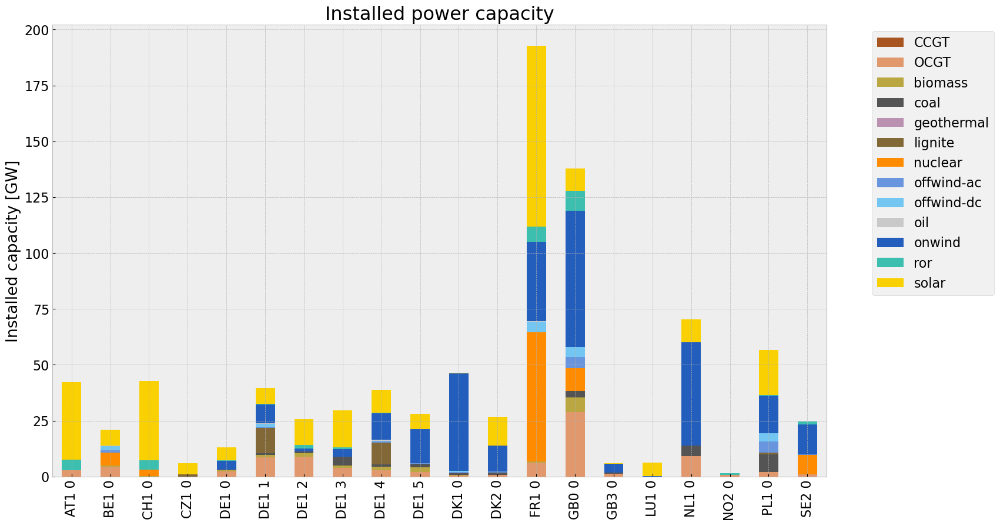

<Figure size 640x480 with 0 Axes>

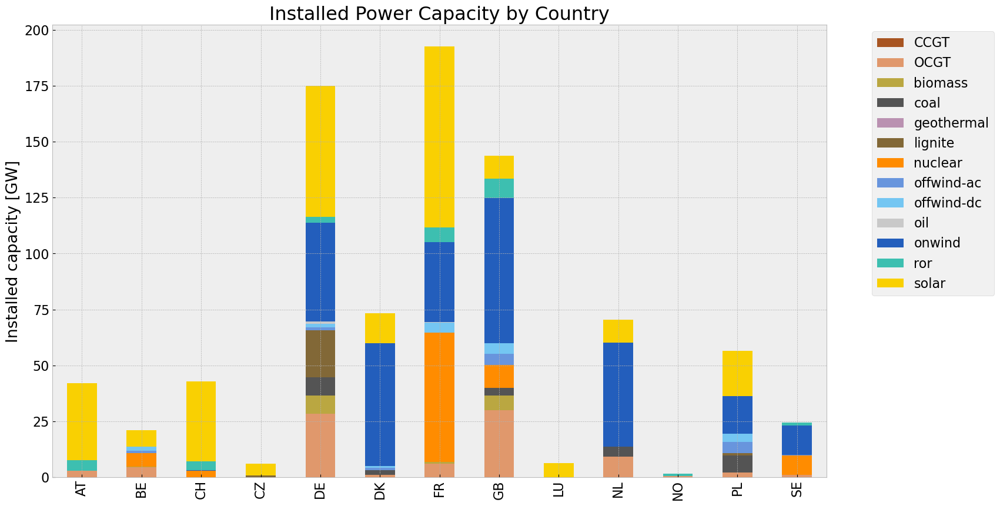

<Figure size 640x480 with 0 Axes>

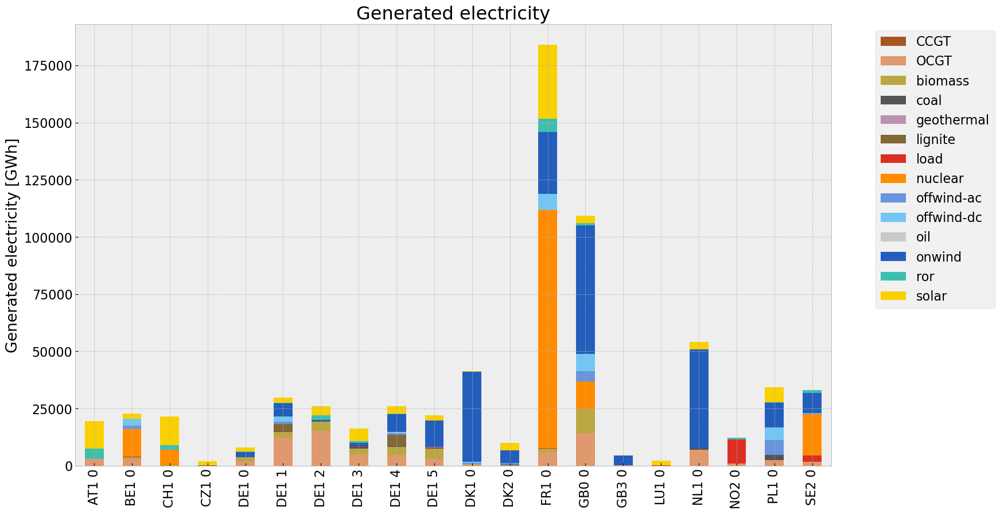

<Figure size 640x480 with 0 Axes>

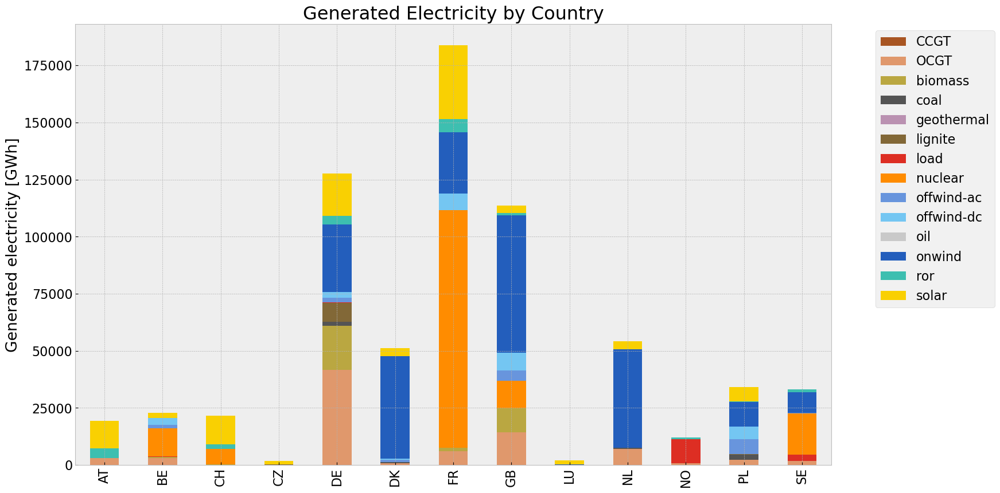

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,8.060031e+07,0.451621,0.1980,3.533686e+07
biomass,3.222707e+07,0.468000,0.0000,0.000000e+00
coal,5.093209e+06,0.329908,0.3361,5.188802e+06
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,8.531923e+06,0.337285,0.4069,1.029290e+07
load,1.419448e+07,1.000000,0.0000,0.000000e+00
nuclear,1.531431e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.590071e+07,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


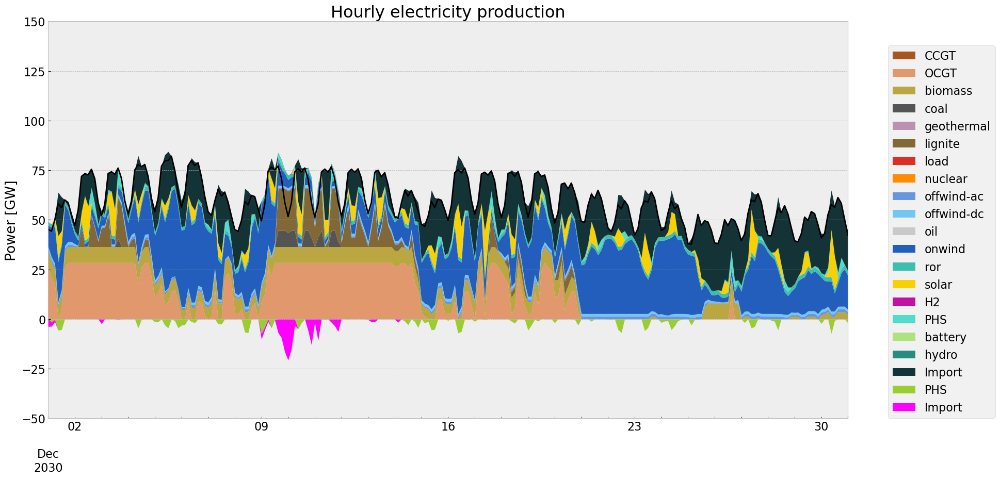

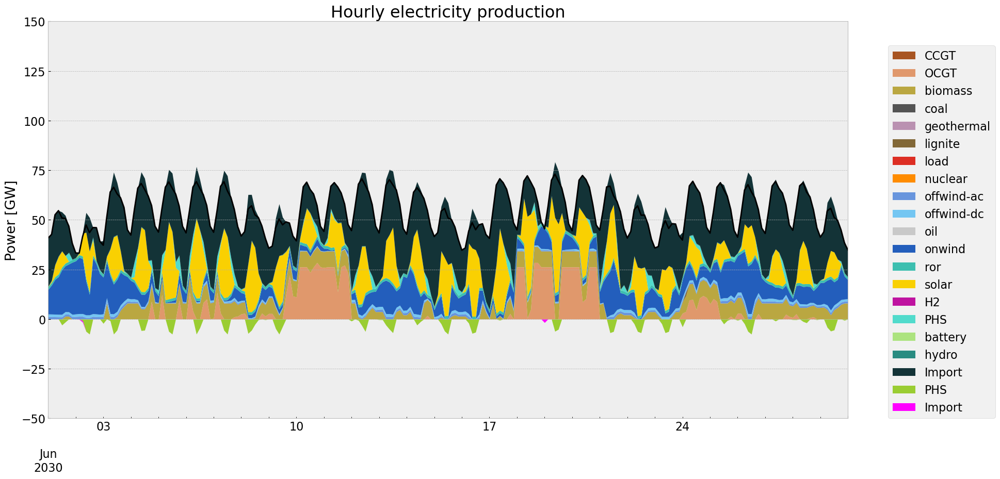

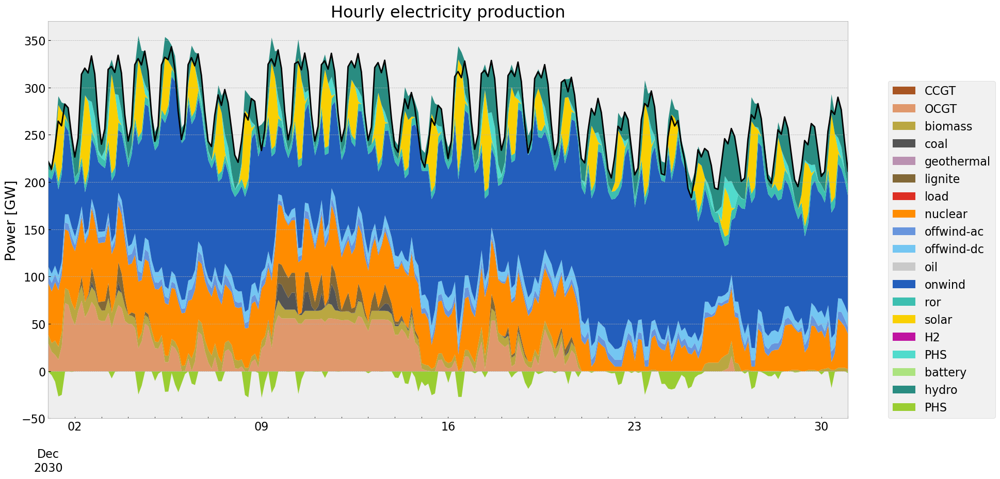

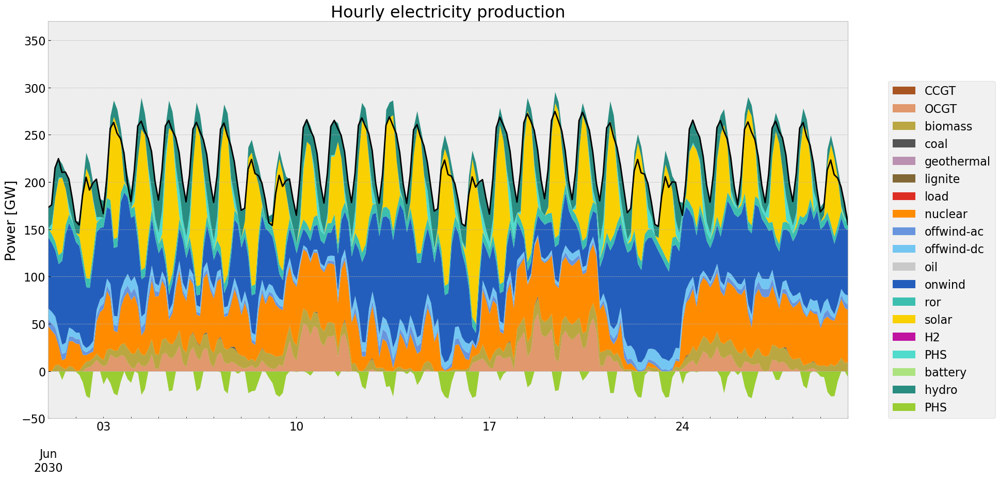

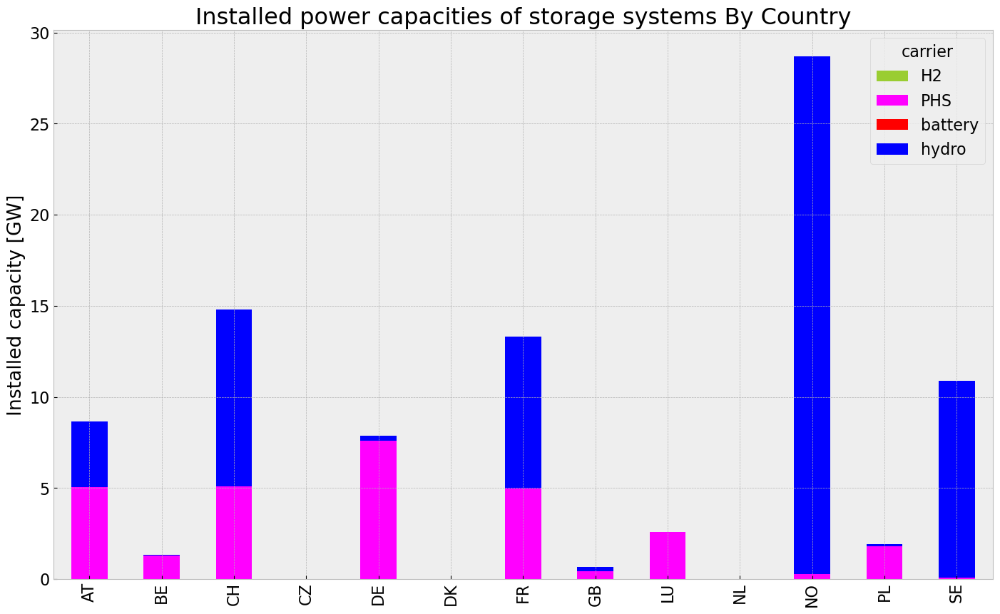

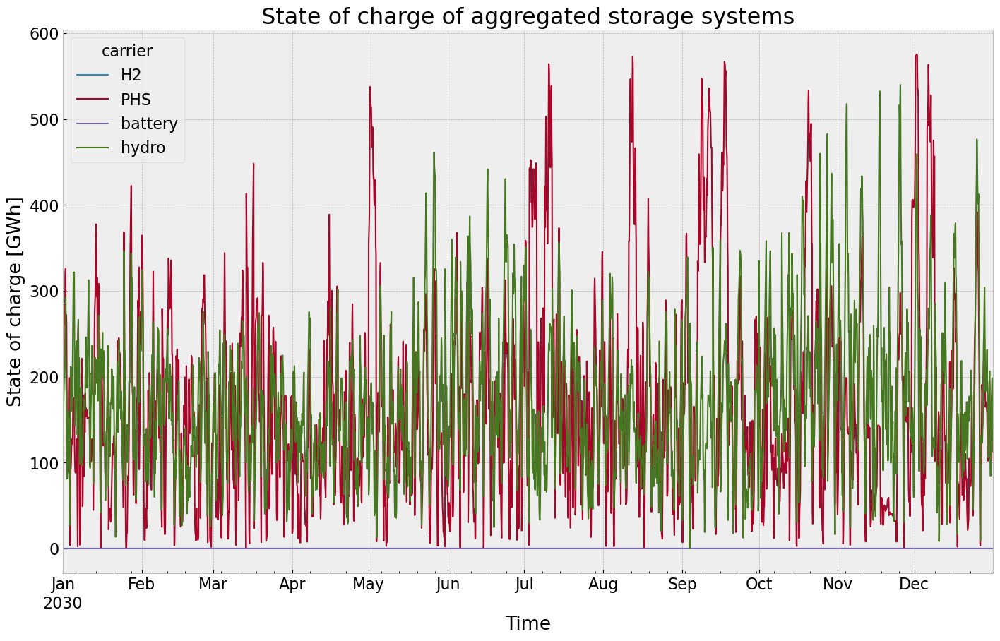

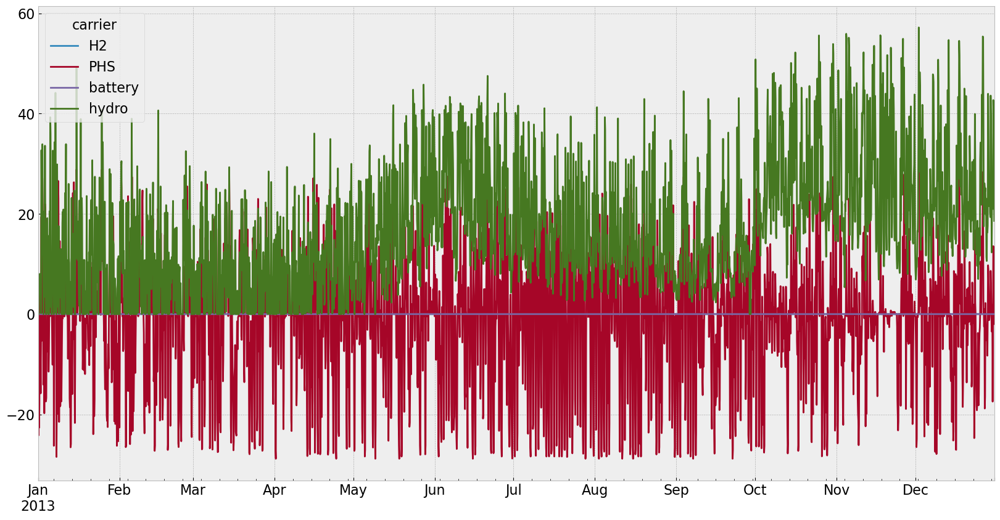

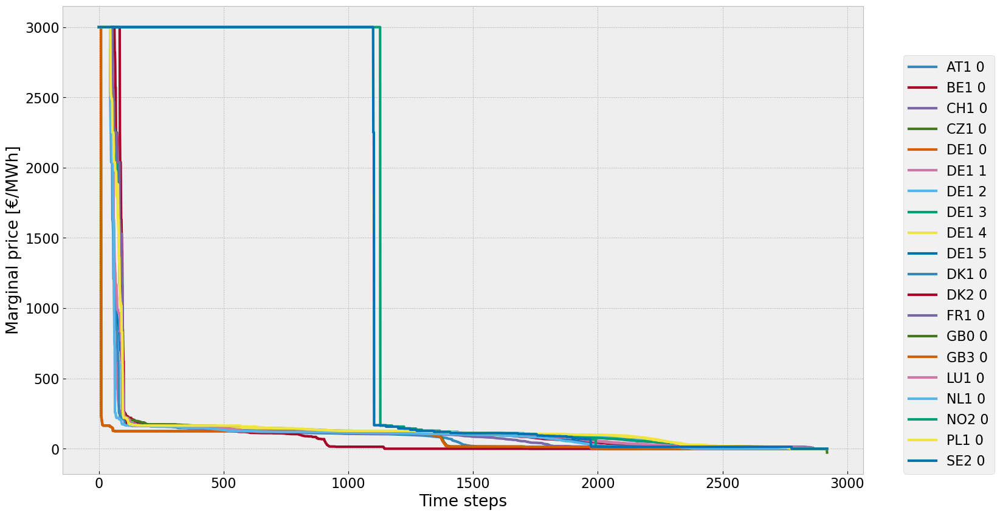

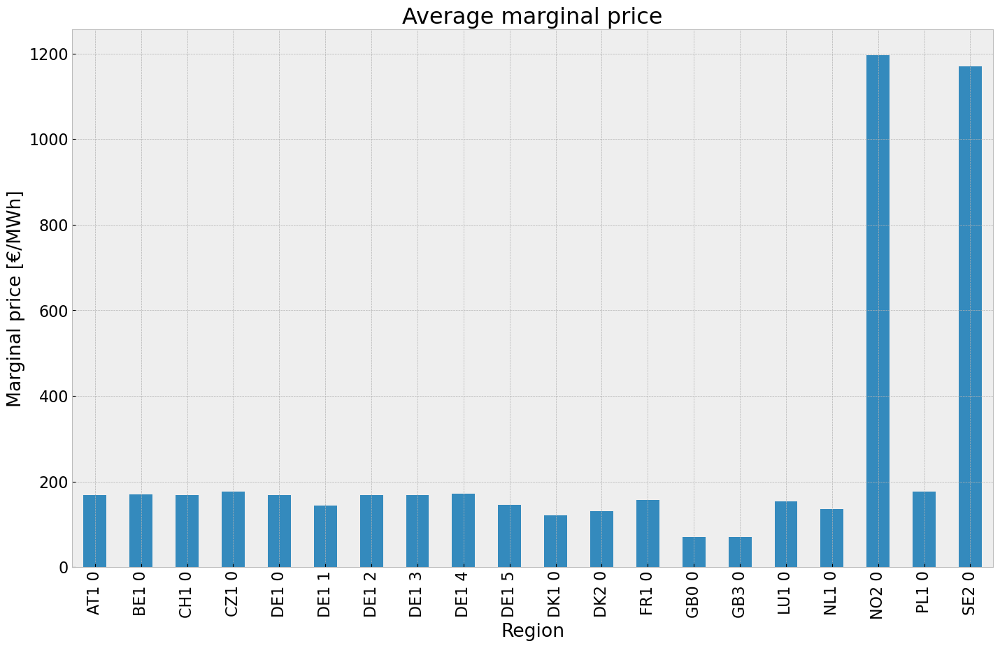

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


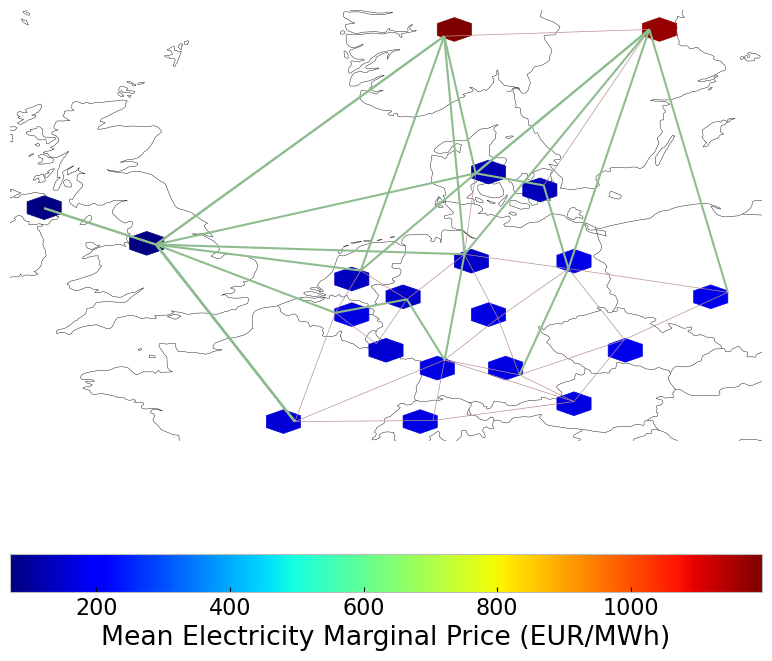

In [66]:
# Plotting
#installed cap
#capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_noinv_roll.fillna(0, inplace=True)
#gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


capacities_noinv_roll = inst_cap_table(n3, color_cap)
cap_noinv_roll_country = inst_cap_table_country(n3, color_cap)

#Generation table
# consolidated generation table
#carrier = n3.generators.carrier.unique()
#df_tot_generation = n3.generators_t.p.sum()

#generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
       # key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
               # generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            #except KeyError:
                #print('error')
#generations.fillna(0, inplace=True)

#gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)
gen_noinv_roll_country = gen_power_table_country(n3,colors_gen_table)

#Snapshot Summer and Winter
#p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
#sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n3, '2030-12-01', '2030-12-31', colors_gen,'DE')
gen_curve(n3, '2030-06-01', '2030-06-30', colors_gen,'DE')
#generation curve all countries
#winter
gen_curve_tot(n3, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n3, '2030-06-01', '2030-06-30', colors_gen)

#installed storage unit & stores
store_noinv_roll = inst_store_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)
price_regions(n3)

#Emission
em_noinv_roll =em_table(n3)
em_noinv_roll

In [67]:
n3.generators_t.p.sum()

Generator
AT1 0 CCGT          0.000000e+00
AT1 0 OCGT          2.951695e+06
AT1 0 biomass       0.000000e+00
AT1 0 coal          0.000000e+00
AT1 0 geothermal    0.000000e+00
AT1 0 lignite       0.000000e+00
AT1 0 load          5.932590e+04
AT1 0 nuclear       0.000000e+00
AT1 0 oil           0.000000e+00
AT1 0 onwind        0.000000e+00
AT1 0 ror           4.381744e+06
AT1 0 solar         1.202047e+07
BE1 0 CCGT          0.000000e+00
BE1 0 OCGT          3.027899e+06
BE1 0 biomass       6.267350e+05
BE1 0 coal          0.000000e+00
BE1 0 geothermal    0.000000e+00
BE1 0 lignite       0.000000e+00
BE1 0 load          1.806549e+05
BE1 0 nuclear       1.215538e+07
BE1 0 offwind-ac    1.548504e+06
BE1 0 offwind-dc    2.955480e+06
BE1 0 oil           1.665300e+04
BE1 0 onwind        0.000000e+00
BE1 0 ror           6.312358e+04
BE1 0 solar         2.265546e+06
CH1 0 CCGT          0.000000e+00
CH1 0 OCGT          0.000000e+00
CH1 0 biomass       2.098646e+05
CH1 0 coal          0.000000e+00


In [68]:
#buses without store
columns_to_keep =[]

for i in n3.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    
price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n3.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

price_dur_curve.head()

,AT1 0,BE1 0,CH1 0,CZ1 0,DE1 0,DE1 1,DE1 2,DE1 3,DE1 4,DE1 5,DK1 0,DK2 0,FR1 0,GB0 0,GB3 0,LU1 0,NL1 0,NO2 0,PL1 0,SE2 0
0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,2999.990546,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0
1,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,2999.990428,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0
2,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,2999.990428,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0
3,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,2999.990428,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0
4,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,2999.990428,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0


In [69]:
#e_balance = n3.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :]
#e_balance.head()
#e_balance.to_csv('energy_balance_DE_offwind.csv', sep=',', index=True, header=True, encoding='utf-8')

# Scenario Analysis

## Installed Capacity

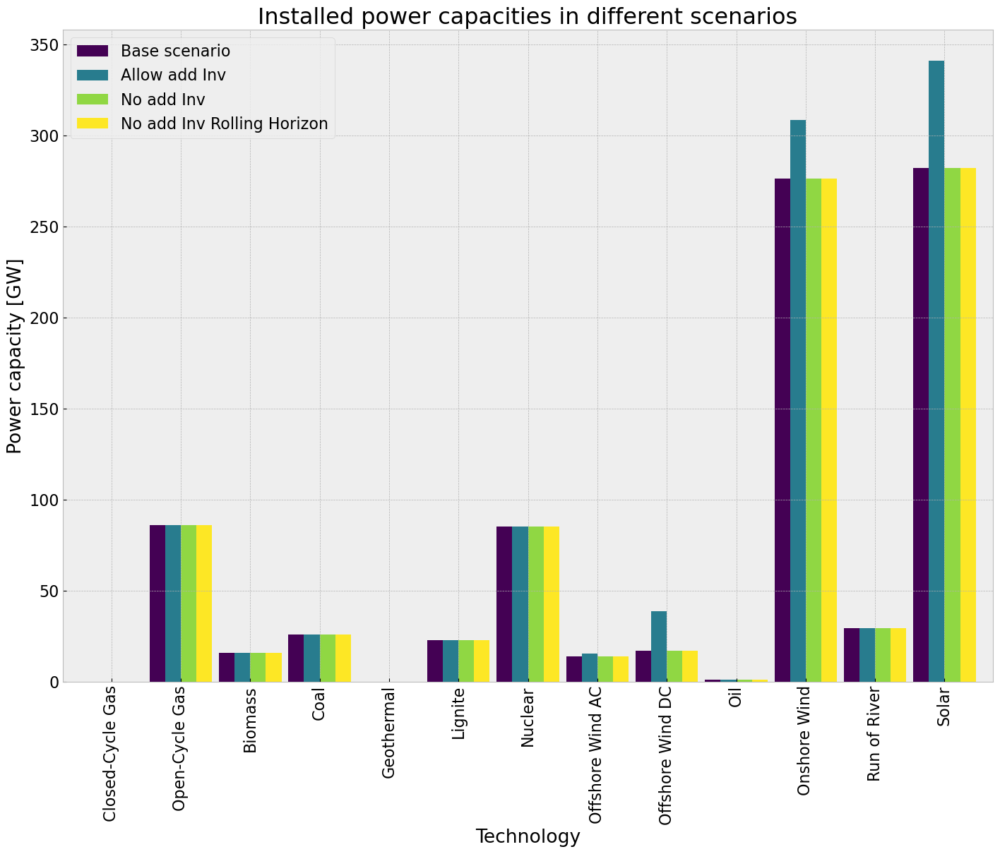

In [70]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

In [71]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,85.854585,85.854585,85.854585,85.854585
Biomass,15.977059,15.977059,15.977059,15.977059
Coal,25.968677,25.968677,25.968677,25.968677
Geothermal,0.000000,0.000000,0.000000,0.000000
Lignite,22.848983,22.848983,22.848983,22.848983
Nuclear,85.354000,85.354000,85.354000,85.354000
Offshore Wind AC,13.835970,15.364383,13.835970,13.835970
Offshore Wind DC,16.947674,38.856988,16.947674,16.947674


## Power Generation

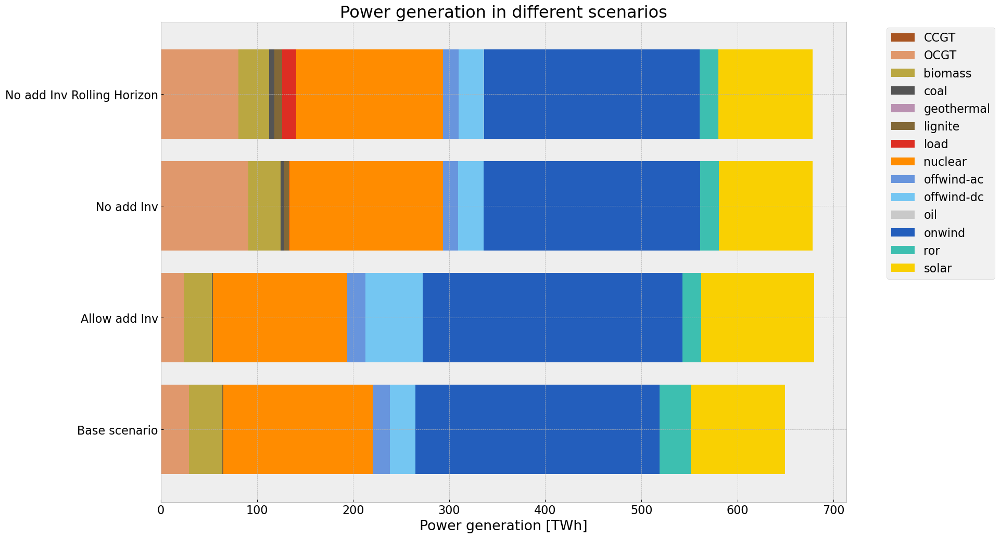

In [72]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        #xlim=[0,200],
                        width=0.8
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Installed Storage Capacities

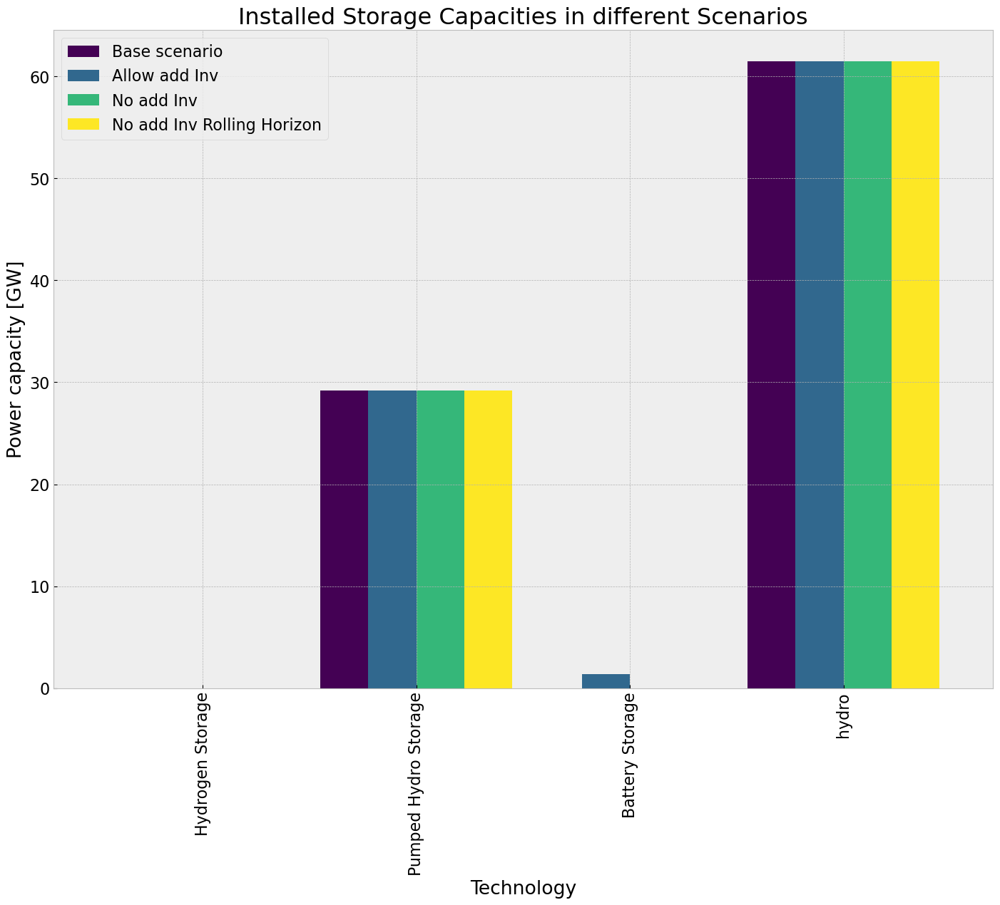

In [73]:
comp_inst_store = pd.DataFrame(index=store_base.unstack().columns)

comp_inst_store["Base scenario"] = store_base.groupby("carrier").sum()
comp_inst_store["Allow add Inv"] = store_inv.groupby("carrier").sum()
comp_inst_store["No add Inv"] = store_noinv.groupby("carrier").sum()
comp_inst_store["No add Inv Rolling Horizon"] = store_noinv_roll.groupby("carrier").sum()

comp_inst_store.rename(index = {"battery": "Battery Storage"}, inplace=True)
comp_inst_store.rename(index = {"H2": "Hydrogen Storage"}, inplace=True)
comp_inst_store.rename(index = {"Hydro": "Reservoir & Dam"}, inplace=True)
comp_inst_store.rename(index = {"PHS": "Pumped Hydro Storage"}, inplace=True)


comp_inst_store.fillna(0, inplace=True)

comp_inst_store.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 1, len(comp_inst_store))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed Storage Capacities in different Scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

## System Cost

In [74]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

#if 'AC' in system_cost_base:
#   comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

#comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
comp_system_cost.drop('-', axis=1, inplace=True)
#comp_system_cost.iloc[0,0] = system_cost_base.AC


#comp_system_cost = comp_system_cost   #Million eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)
comp_system_cost = comp_system_cost.div(1e3) # Billion €

#move load shedding to the last col
# Specify the column name to move
column_to_move = 'Load shedding'

# Create a new list of column names without the column to move
new_columns = [col for col in comp_system_cost.columns if col != column_to_move]

# Append the column to move to the end
new_columns.append(column_to_move)

# Reorder the columns
comp_system_cost = comp_system_cost[new_columns]


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1871120118.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\1871120118.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


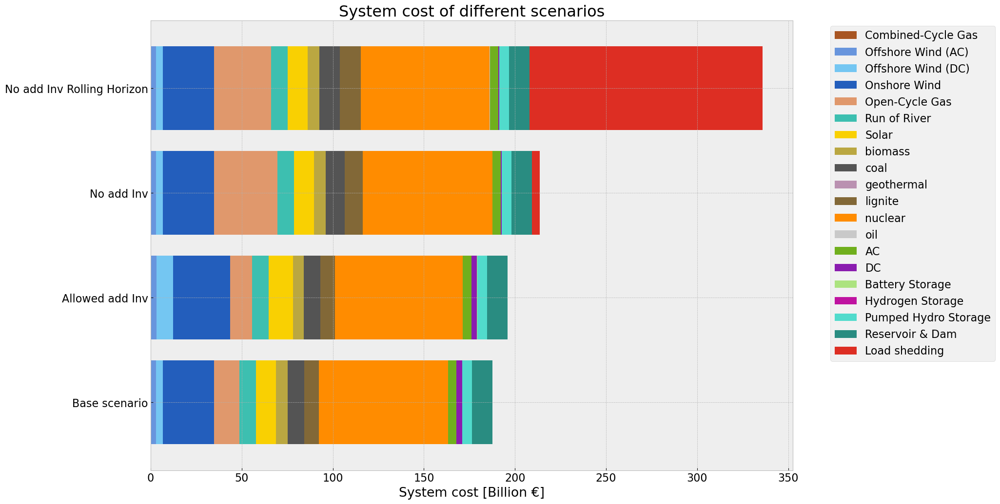

In [75]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="System cost [Billion €]",
                        title=f"System cost of different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Curtailment

In [76]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [77]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


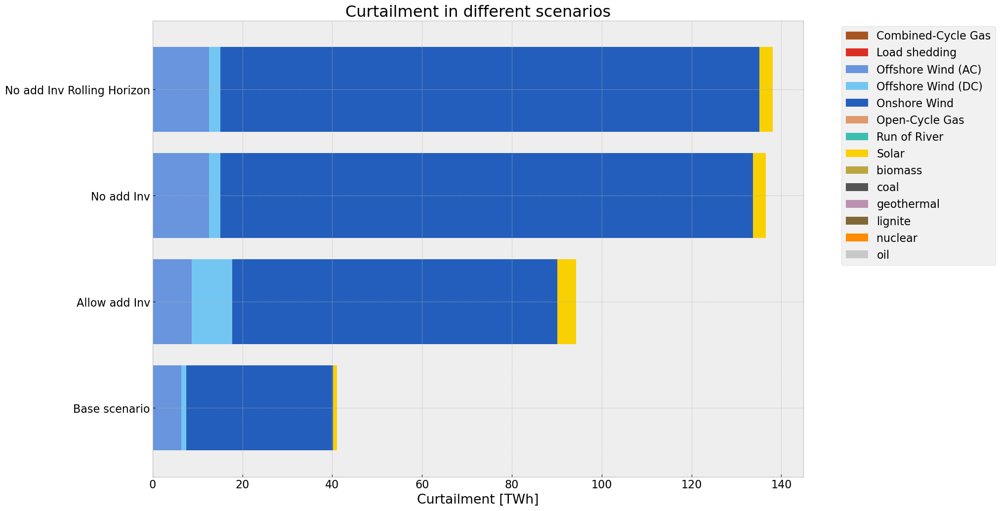

In [78]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        #xlim=[0,120],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Emission

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_6436\189732353.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


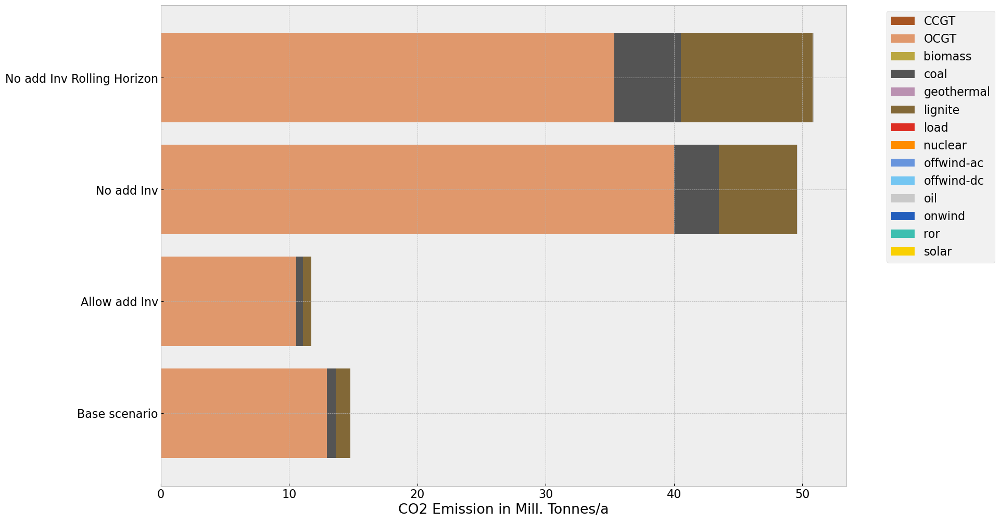

In [79]:
tech_comp = em_base.index.tolist()
comp_system_em = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_em.loc["Base scenario"] = em_base['emissions in Tonnes CO2']/1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["Allow add Inv"] = em_inv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv"] = em_noinv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv Rolling Horizon"] = em_noinv_roll['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a

comp_system_em.fillna(0, inplace=True)

colors_comp = []

for i in range(len(comp_system_em.columns)):
    for j in range(len(n.carriers.index)):
        if comp_system_em.columns[i] == n.carriers.index[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_em.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="CO2 Emission in Mill. Tonnes/a",
                        #title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
#global_constraint
#plt.axvline(x=n.global_constraints.loc['CO2Limit','constant']/1e6, color='r', linestyle='-', linewidth=2, label='CO2 cap')
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()